In [1]:
import librosa
import librosa.display
import pretty_midi
import music21
from music21 import converter, instrument, note, chord, stream, serial, pitch
import numpy as np
import pandas as pd
import pretty_midi
import mir_eval.display
import glob
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

# Exploring a composer's style. 

1. Form
2. Pitch and Harmonic Material

## Bach

In [2]:
bach_midi = '/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bach_846.mid'

### Form

In [4]:
fs=100
midi_pretty_format = pretty_midi.PrettyMIDI(bach_midi)
piano_midi = midi_pretty_format.instruments[0] # Get the piano channels
piano_roll = piano_midi.get_piano_roll(fs=fs)

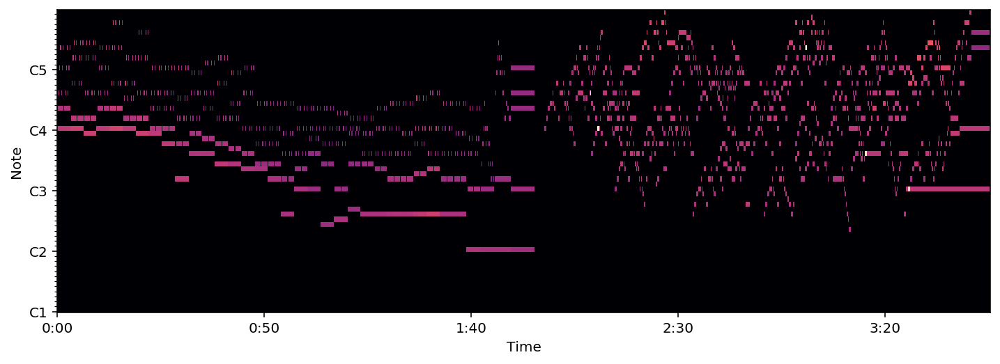

In [7]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)

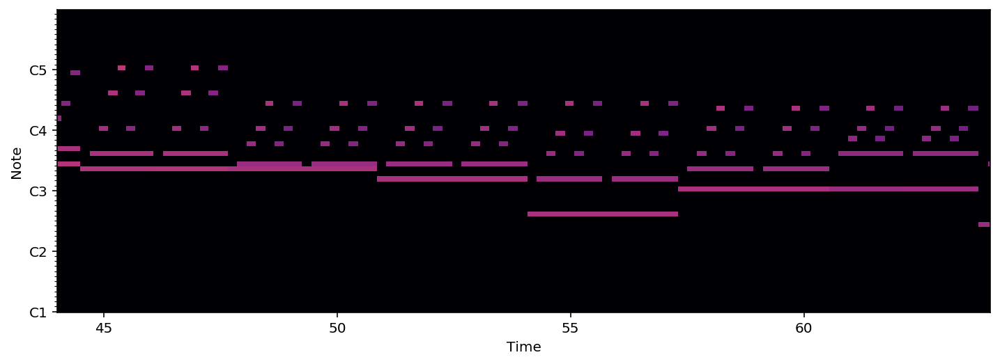

In [15]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(44,64);

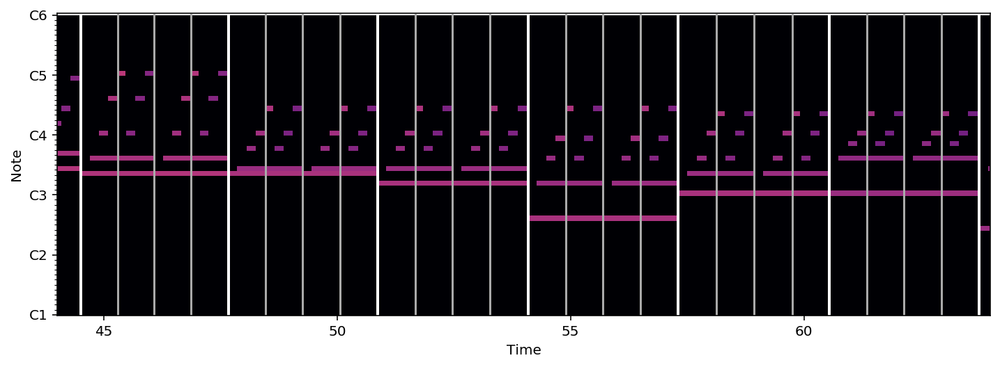

In [14]:
# Get and downbeat times
beats = midi_pretty_format.get_beats()
downbeats = midi_pretty_format.get_downbeats()
# Plot piano roll
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
# Plot beats as grey lines, downbeats as white lines
mir_eval.display.events(beats, base=ymin, height=ymax, color='#AAAAAA')
mir_eval.display.events(downbeats, base=ymin, height=ymax, color='#FFFFFF', lw=2)
# 20 seconds for clarity
plt.xlim(44, 64);

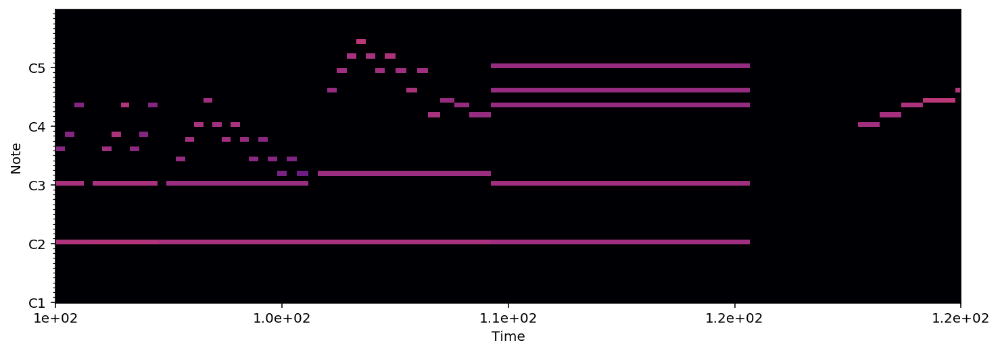

In [242]:
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(100,120);

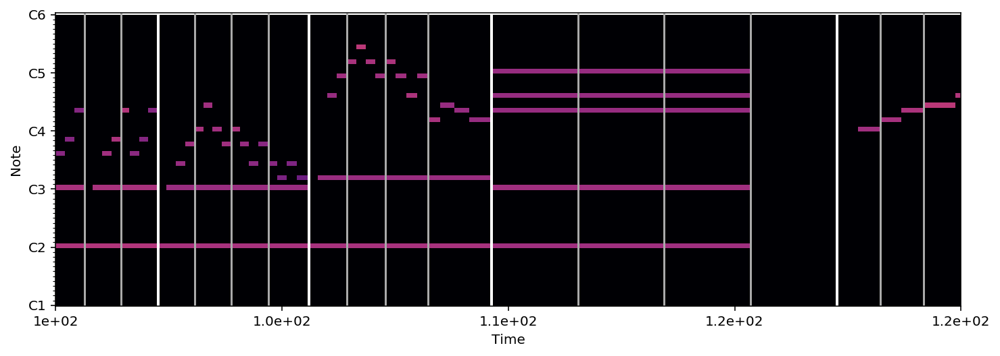

In [247]:
# Get and downbeat times
beats = midi_pretty_format.get_beats()
downbeats = midi_pretty_format.get_downbeats()
# Plot piano roll
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
# Plot beats as grey lines, downbeats as white lines
mir_eval.display.events(beats, base=ymin, height=ymax, color='#AAAAAA')
mir_eval.display.events(downbeats, base=ymin, height=ymax, color='#FFFFFF', lw=2)
# 20 seconds for clarity
plt.xlim(100, 120);

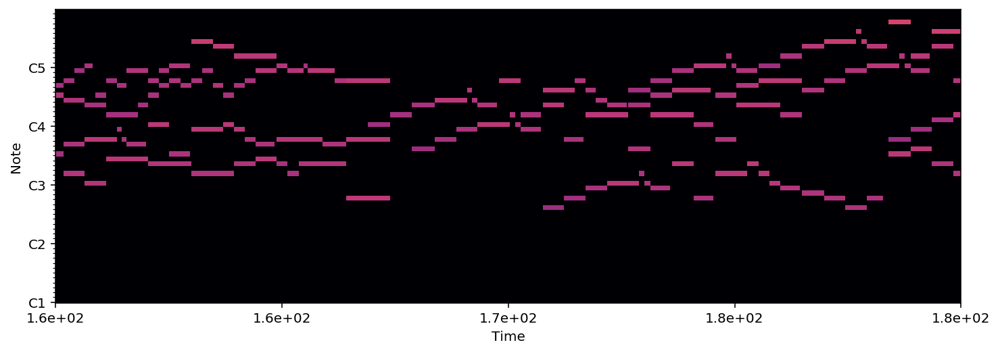

In [244]:
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(160,180);

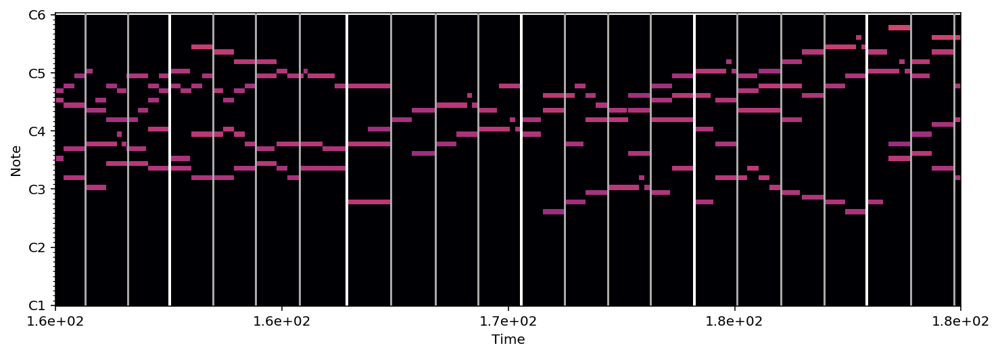

In [246]:
# Get and downbeat times
beats = midi_pretty_format.get_beats()
downbeats = midi_pretty_format.get_downbeats()
# Plot piano roll
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
# Plot beats as grey lines, downbeats as white lines
mir_eval.display.events(beats, base=ymin, height=ymax, color='#AAAAAA')
mir_eval.display.events(downbeats, base=ymin, height=ymax, color='#FFFFFF', lw=2)
# 20 seconds for clarity
plt.xlim(160, 180);

In [28]:
bach = converter.parse('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bach_846.mid')

In [235]:
bach_2 = converter.parse('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/air.mid')

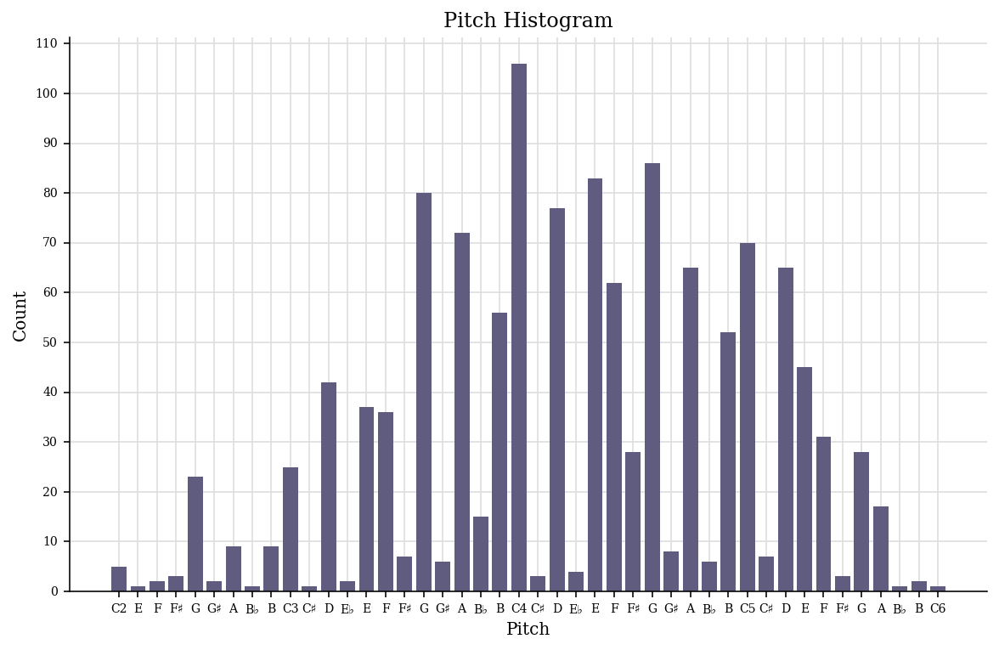

In [237]:
bach.plot('histogram', 'pitch')

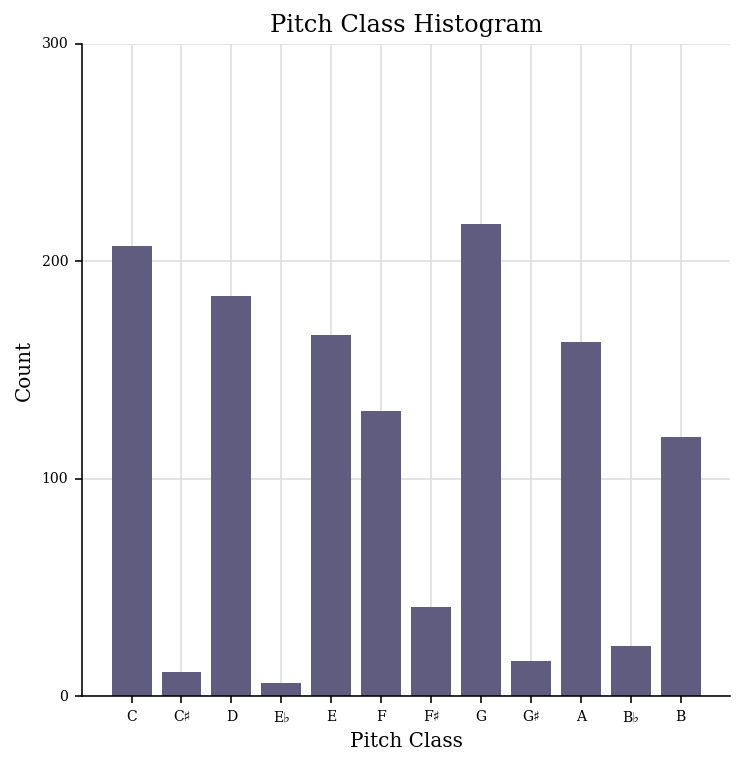

In [21]:
bach.plot('histogram', 'pitchClass')

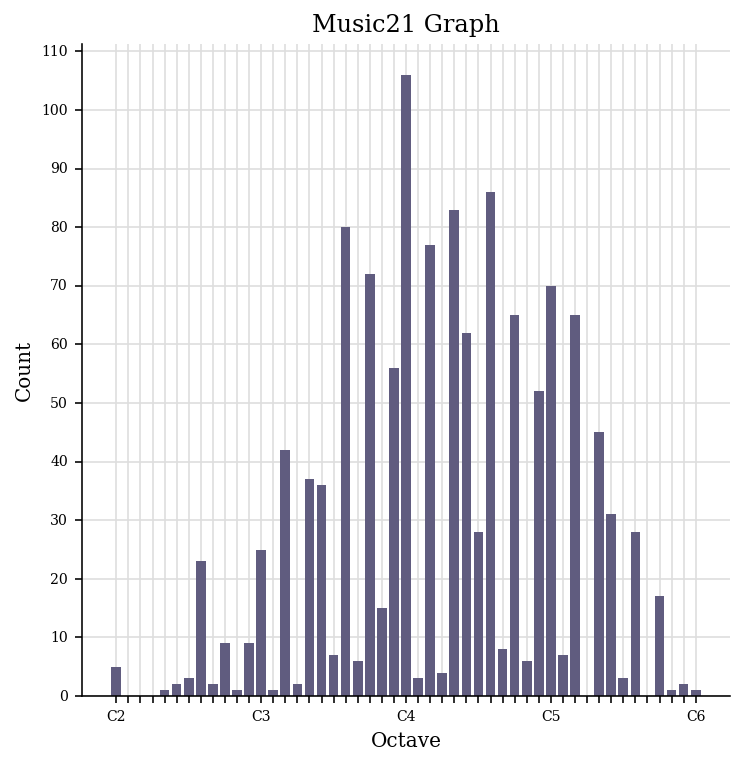

In [22]:
bach.plot('histogram', 'octave', xHideUnused=False, yAxisLabel='Number of Pitches')

In [83]:
bach.analyze('key')

<music21.key.Key of C major>

In [84]:
bach_2.analyze('key')

<music21.key.Key of D major>

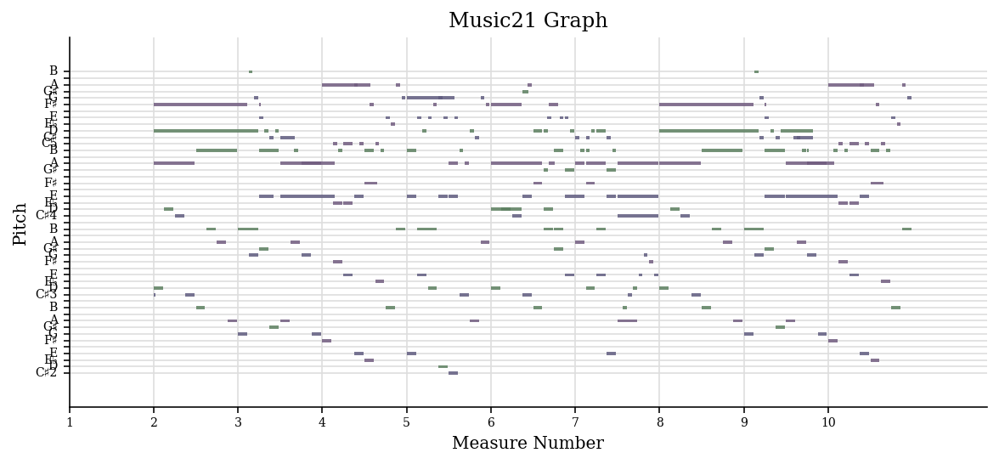

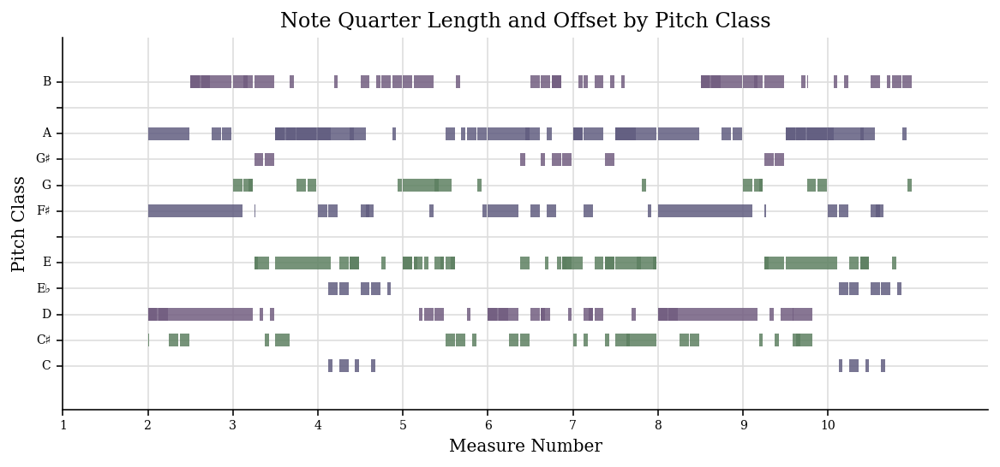

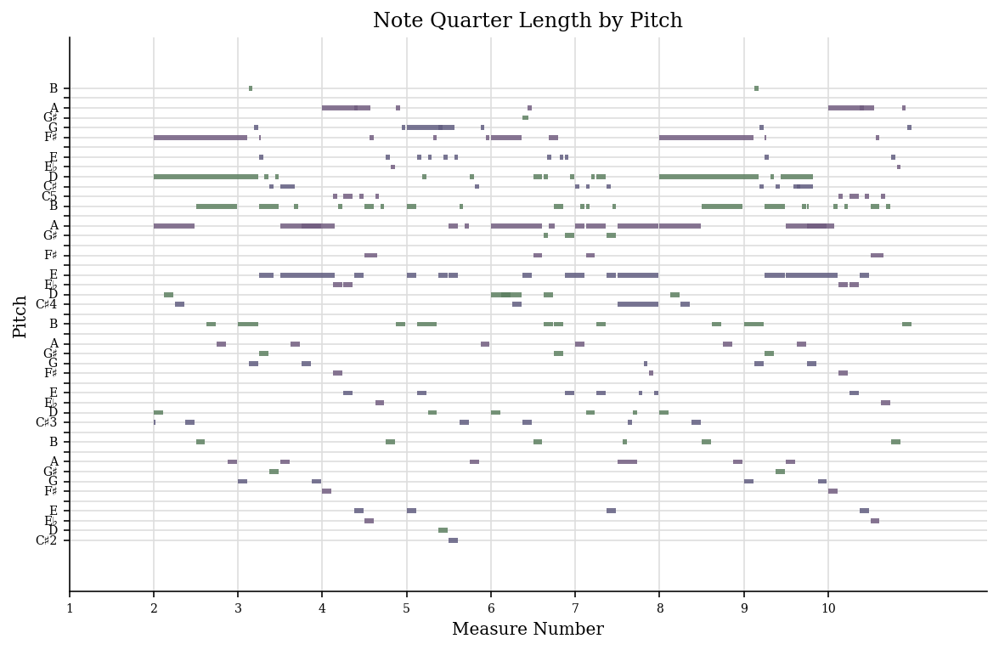

In [250]:
bach_2.measures(1,10).plot('horizontalbar')

In [39]:
def note_to_int(note): # converts the note's letter to pitch value which is integer form.
    
    
    note_base_name = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
    if ('#-' in note):
        first_letter = note[0]
        base_value = note_base_name.index(first_letter)
        octave = note[3]
        value = base_value + 12*(int(octave)-(-1))
        
    elif ('#' in note): 
        first_letter = note[0]
        base_value = note_base_name.index(first_letter)
        octave = note[2]
        value = base_value + 12*(int(octave)-(-1))
        
    elif ('-' in note): 
        first_letter = note[0]
        base_value = note_base_name.index(first_letter)
        octave = note[2]
        value = base_value + 12*(int(octave)-(-1))
        
    else:
        first_letter = note[0]
        base_val = note_base_name.index(first_letter)
        octave = note[1]
        value = base_val + 12*(int(octave)-(-1))
        
    return value

In [73]:
def int_to_note(integer):
    # Convert pitch value to the note which is a letter form. 
    note_base_name = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
    octave_detector = (integer // 12) 
    base_name_detector = (integer % 12) 
    note = note_base_name[base_name_detector] + str((int(octave_detector))-1)
    if ('-' in note):
      note = note_base_name[base_name_detector] + str(0)
      return note
    return note

In [36]:

def check_float(duration): # This function fix the issue which comes from some note's duration. 
                           # For instance some note has duration like 14/3 or 7/3. 
    if ('/' in duration):
        numerator = float(duration.split('/')[0])
        denominator = float(duration.split('/')[1])
        duration = str(float(numerator/denominator))
    return duration

In [435]:
note_name = []
notes = []
n_durations = []
n_offsets = []

chord_spelling = []
chords = []
c_durations = []
c_offsets = []

keys = []
    
for i,file in enumerate(glob.glob('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/*.mid')):
    print(file)
    midi = converter.parse(file)
    key = midi.analyze('key')
    keys.append(key)
    print(key)
    notes_to_parse = midi.flat.notes
    for element in notes_to_parse:
        if isinstance(element, note.Note): # If it is single note
            note_name.append(element.pitch)
            notes.append(note_to_int(str(element.pitch))) # Append note's integer value to "notes" list.
            duration = str(element.duration)[27:-1] 
            n_durations.append(check_float(duration)) 
            n_offsets.append(element.offset)
            

        elif isinstance(element, chord.Chord): # If it is chord
            chord_spelling.append(element.pitchNames)
            chords.append('.'.join(str(note_to_int(str(n)))
                                  for n in element.pitches))
            duration = str(element.duration)[27:-1]
            c_durations.append(check_float(duration))
            c_offsets.append(element.offset)
            print(element)
        
        
        

/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/acttrag.mid
E- major
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/air.mid
D major
<music21.chord.Chord C#5 D5>
<music21.chord.Chord C#5 D5>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord C#5 D5>
<music21.chord.Chord C#5 D5>
<music21.chord.Chord G5 F#5>
<music21.chord.Chord G5 F#5>
<music21.chord.Chord E5 F#5>
<music21.chord.Chord E5 F#5>
<music21.chord.Chord B-4 B4>
<music21.chord.Chord B-4 B4>
<music21.chord.Chord E5 F#5>
<music21.chord.Chord E5 F#5>
<music21.chord.Chord C#5 D5>
<music21.chord.Chord C#5 D5>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord C#5 D5>
<music21.chord.Chord C#5 D5>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/aria14.mid
B- major
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_f

D major
<music21.chord.Chord A2 D3>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord D4 F4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord G5 B-5>
<music21.chord.Chord D4 F4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord D5 F5>
<music21.chord.Chord G#5 B5>
<music21.chord.Chord A4 E4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord D5 A4 F#4>
<music21.chord.Chord D3 A3 F#3>
<music21.chord.Chord E4 A4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bach_850_format0.mid
D major
<music21.chord.Chord G4 E3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord E4 C#3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord E4 C#3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord D5 F3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord F5 A3>
<music21.chord.Chord C#5 E3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord D5 F3>
<music21.

<music21.chord.Chord A3 A4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord G5 C3>
<music21.chord.Chord E4 C3>
<music21.chord.Chord F3 F5>
<music21.chord.Chord F3 C5>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord D4 D3>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord A4 D3>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord B-3 F3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord C3 A3>
<music21.chord.Chord B-3 F3>
<music21.chord.Chord A3 E-3>
<music21.chord.Chord A4 F3>
<music21.chord.Chord C4 F3>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord D4 D3>
<music21.chord.Chord C4 F3>
<music21.chord.Chord C5 A2>
<music21.chord.Chord D3 F4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord E-3 G4>

D major
<music21.chord.Chord F#4 A4>
<music21.chord.Chord F#3 A3 D3>
<music21.chord.Chord A4 B4>
<music21.chord.Chord G4 D5>
<music21.chord.Chord D5 D2>
<music21.chord.Chord A4 B4>
<music21.chord.Chord E4 G#4 B4>
<music21.chord.Chord C#5 B-3>
<music21.chord.Chord B4 B2>
<music21.chord.Chord B4 D5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord D4 A4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord A3 E4 A4>
<music21.chord.Chord G4 C#5>
<music21.chord.Chord F#4 D5>
<music21.chord.Chord F#4 D5>
<music21.chord.Chord D4 A4 C5>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord C#4 E4 G4>
<music21.chord.Chord A3 D4 F#4>
<music21.chord.Chord D4 F#4 A4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord G4 B4>
<music21.chord.Chord C#4 E4

D major
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 A4>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord B5 D5 D4>
<music21.chord.Chord G5 D5 A4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord F#5 D5 A4>
<music21.chord.Chord E5 A5 A4>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord C6 A5>
<music21.chord.Chord C6 A5>
<music21.chord.Chord B5 G5>
<music21.chord.Chord B5 G5>
<music21.chord.Chord B5 G5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.

<music21.chord.Chord F#5 A4>
<music21.chord.Chord E5 G4>
<music21.chord.Chord E5 G4>
<music21.chord.Chord E5 C5>
<music21.chord.Chord E5 C5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 G4>
<music21.chord.Chord D5 G4>
<music21.chord.Chord E5 B4>
<music21.chord.Chord E5 B4>
<music21.chord.Chord E5 B4>
<music21.chord.Chord E5 B4>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord G5 A5>
<music21.chord.Chord G5 A5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord E5 D5>
<music21.chord.Chord E5 D5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord G5 B4>
<music21.chord.Chord G5 B4>
<music21.chord.Chord E5 A4>
<music21.chord.Chord E5 A4>
<music2

A major
<music21.chord.Chord C#4 E4>
<music21.chord.Chord A3 E4 A4>
<music21.chord.Chord B3 E4 G#4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord D4 G#4>
<music21.chord.Chord C#4 E4 A4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord D4 G#4>
<music21.chord.Chord C#4 E4 A4>
<music21.chord.Chord B3 E4 G#4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord A3 E4 A4>
<music21.chord.Chord E-4 A4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord F#4 B4>
<music21.chord.Chord G#3 E4 G#4>
<music21.chord.Chord A3 E4 A4>
<music21.chord.Chord B3 E4 B4>
<music21.chord.Chord C#4 E4 C#5>
<music21.chord.Chord F#4 B4 E-5>
<music21.chord.Chord E4 B4 E5>
<music21.chord.Chord E4 G#4 B4>
<music21.chord.Chord E-4 F#4 A4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord G#4 C#5>
<music21.chord.Chord F#4 B4>
<music21.chord.Chord E4 B-4>
<music21.chord.Chord C#4 E4 F#4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord 

G major
<music21.chord.Chord B3 D4 G4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord A3 D4 F#4>
<music21.chord.Chord G3 D4 G4>
<music21.chord.Chord C4 F#4>
<music21.chord.Chord B3 D4 G4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord B3 C4>
<music21.chord.Chord A3 D4>
<music21.chord.Chord B3 D4 G4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord A3 D4 F#4>
<music21.chord.Chord G3 D4 G4>
<music21.chord.Chord C4 F#4>
<music21.chord.Chord B3 D4 G4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord G4 B4>
<music21.chord.Chord C#4 E4 A4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord D4 E4>
<music21.chord.Chord E4 A4 C#5>
<music21.chord.Chord C#4 E4 G4 A4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord A4 D5>
<music21.chord.Chord D4 F4 G#4>
<music21.chord.Chord C#4 E4 A4>
<music21.chord.Chord C#4 E4 G4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord G4 C#5>
<music21

b minor
<music21.chord.Chord B3 F#4 B4 D3>
<music21.chord.Chord E4 G4 B4 E3>
<music21.chord.Chord A3 C4 E4>
<music21.chord.Chord G4 A2>
<music21.chord.Chord C4 B2>
<music21.chord.Chord F3 G#3 B3 D4 F2>
<music21.chord.Chord G3 B-3 F#2>
<music21.chord.Chord F#3 B-3>
<music21.chord.Chord B3 D4 F#4 B2>
<music21.chord.Chord B3 D4 G4 G2>
<music21.chord.Chord E3 B3 D4 E2>
<music21.chord.Chord C#4 E4 G4 F#2>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord E-4 F#4 A4 C2>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord F#3 A3 C#4>
<music21.chord.Chord G#4 C#2>
<music21.chord.Chord C#4 F#2>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord C#4 D2>
<music21.chord.Chord B5 D5>
<music21.chord.Chord G3 B3 D4 F4 G2>
<music21.chord.Chord A5 C5>
<music21.chord.Chord B5 D5>
<music21.chord.Chord C6 E5>
<music21.chord.Chord B5 D5>
<music21.chord.Chord A5 C5>
<music21.chord.Chord G5 B4>
<music21.chord.Chord A5 A4>
<m

D major
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bjsbmm11.mid
D major
<music21.chord.Chord F#3 D4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord A5 F#5 A4>
<music21.chord.Chord D6 A5 F#5>
<music21.chord.Chord A5 F#5 D5>
<music21.chord.Chord G5 E5 A4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 E5 A4>
<music21.chord.Chord G5 E5 A4>
<music21.chord.Chord C#6 G5 E5>
<music21.chord.Chord D6 C#6 G5>
<music21.chord.Chord G5 E5 A5>
<music21.chord.Chord F#5 D5 A4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord D6 A5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord B5 F#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord A5 E5>
<music21.chord.

<music21.chord.Chord F#5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord B5 D4>
<music21.chord.Chord B5 D5>
<music21.chord.Chord E5 A4>
<music21.chord.Chord E5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord G5 A4>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord A5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4 F#4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bjsbmm12.mid
D major
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bjsbmm13.mid
D major
<music21.chord.Chord E5 C#5>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord A4 E4>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord E5 A4>
<music21.chord.Chord A5 C#5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord E5 G#4>
<music21.chord.Chord A4 F#5>
<music21.chord.Chord A5 E4>
<music21.chord.Chord E5 A4>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord A4 G4>
<music21.chord.Chord A4 F#4>
<m

D major
<music21.chord.Chord A4 F#4 D4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord D5 A4 D4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord A4 D4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord B5 G5 D5>
<music21.chord.Chord B5 G5>
<music21.chord.Chord A5 F#5 D5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord G5 E5 A4>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord A5 F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord B5 E5>
<music21.chord.Chord B5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 B5 G5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord E5 C

<music21.chord.Chord G5 D5>
<music21.chord.Chord G5 A4>
<music21.chord.Chord A4 E4>
<music21.chord.Chord G5 E5>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord F#5 E5>
<music21.chord.Chord F#4 C#4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord A5 E5>
<music21.chord.Chord A5 E5>
<music21.chord.Chord A5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord B5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord B5 G5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord B5 G5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord B5 G5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord F#5 E-5>
<music21.chord.Chord F#5 

A major
<music21.chord.Chord E4 A4 C#3>
<music21.chord.Chord D4 G#4 B4>
<music21.chord.Chord E4 A4 C#5>
<music21.chord.Chord F#4 B4 D5 D3>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord E4 A4 C#5>
<music21.chord.Chord F#4 B4 D5 D3>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord G#4 B4 E-5>
<music21.chord.Chord G#4 C#5 E5 C#3>
<music21.chord.Chord G#4 B4 E5 B2>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord C#4 E4 A3>
<music21.chord.Chord E4 G#4 B3>
<music21.chord.Chord G#4 B4 C#4>
<music21.chord.Chord B3 E4 B4 G#2>
<music21.chord.Chord C#4 E4 A2>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord A3 B3 E4>
<music21.chord.Chord E4 C#3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord C#4 A2>
<music21.chord.Chord E4 A4>
<music21.chord.Chord E4 G#4 B2>
<music21.chord.Chord E4 G#4 B4>
<music21.chord.Chord E4 A4 C#5>
<music21.chord.Chord E4 G#4 D5>
<music21.chord.Cho

D major
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord A4 F#4 D4>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord D5 A4 F#4>
<music21.chord.Chord F#5 D5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 A4 F#4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord F#5 D5 A4>
<m

<music21.chord.Chord C#5 A4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord E5 A4>
<music21.chord.Chord E5 A4>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord E5 D5>


<music21.chord.Chord A5 F#5>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord B5 G5>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord G5 B4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord G5 B4>
<music21.chord.Chord C#5 E5 B4>
<music21.chord.Chord D5 F#5 A4>
<music21.chord.Chord B5 B4>
<music21.chord.Chord E5 G5>
<music21.chord.Chord C6 A4>
<music21.chord.Chord B5 G4>
<music21.chord.Chord G5 E5>
<music21.chord.Chord A5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 B4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord E5 A4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord A4 C#5 G4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord F#5 B4>
<music21.chord.Chord G5 C#5>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord D5 F#4 D4>
<music21.chord.Chord F#5 F#4 D4>
<music21.chord.Chord F#5 F#4 D4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord E5 G4 E4>
<music21.chord.Chord E5 A4 F#4>
<mus

D major
<music21.chord.Chord A5 F#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 A4>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord D5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord D5 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord D6 F#4>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord E5 A4>
<music21.chord.Chord A5 C#5>
<music21.chord.Chord D5 A4>
<music21.chord.Chord A5 A4>
<music21.chord.Chord D5 A4>
<music21.chord.Chord A5 D5>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord

b minor
<music21.chord.Chord D4 B4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord C#4 F#4 B-3>
<music21.chord.Chord B3 G#3>
<music21.chord.Chord C#4 F#4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord B-3 F#4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord B3 D4 F#4>
<music21.chord.Chord D4 F#4 B3>
<music21.chord.Chord F#4 B4 D4>
<music21.chord.Chord G4 B3>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord C#4 G4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord C#4 F#4>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord F#3 E4>
<music21.chord.Chord F#3 D4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord B3 G4>
<music21.chord.Chord E3 C#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord D3 B3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord F#4 E-5>
<music21.chord.Chord G4 E5>
<music21.chord.Chord E4 C#5 G3>
<music21.chord.Chord D4 B4 F#3>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord

D major
<music21.chord.Chord D2 A2>
<music21.chord.Chord D3 A3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord B1 E2>
<music21.chord.Chord B2 E3>
<music21.chord.Chord B2 E3>
<music21.chord.Chord B2 E3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bjsfanam.mid
a minor
<music21.chord.Chord F#4 A4>
<music21.chord.Chord B-4 E5>
<music21.chord.Chord F4 A4 D5>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord E4 G4 C5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord A3 C4>
<music21.chord.Chord C5 A5>
<music21.chord.Chord F#4 A5>
<music21.chord.Chord A4 F#5>
<music21.chord.Chord G4 E5>
<music21.chord.Chord B4 G5>
<music21.chord.Chord E4 G5>
<music21.chord.Chord E4 C5>
<music21.chord.Chord D4 G#4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord G4 B4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G4 B4>
<music21.chord.Chord G4 

<music21.chord.Chord C3 C5>
<music21.chord.Chord A2 A4>
<music21.chord.Chord F2 F4>
<music21.chord.Chord F3 F5>
<music21.chord.Chord F3 F5>
<music21.chord.Chord F2 F4>
<music21.chord.Chord F2 F4>
<music21.chord.Chord E2 E4>
<music21.chord.Chord E2 E4>
<music21.chord.Chord A2 A4>
<music21.chord.Chord D2 D4>
<music21.chord.Chord G2 G4>
<music21.chord.Chord C3 C5>
<music21.chord.Chord F2 F4>
<music21.chord.Chord F3 F5>
<music21.chord.Chord G3 G5>
<music21.chord.Chord A3 A5>
<music21.chord.Chord F3 F5>
<music21.chord.Chord G3 G5>
<music21.chord.Chord G2 G4>
<music21.chord.Chord C2 C4>
<music21.chord.Chord C2 C4>
<music21.chord.Chord C2 C4>
<music21.chord.Chord C3 C5>
<music21.chord.Chord G2 G4>
<music21.chord.Chord C2 C4>
<music21.chord.Chord A2 A4>
<music21.chord.Chord F2 F4>
<music21.chord.Chord B2 B4>
<music21.chord.Chord G2 G4>
<music21.chord.Chord E2 E4>
<music21.chord.Chord A2 A4>
<music21.chord.Chord F#2 F#4>
<music21.chord.Chord D2 D4>
<music21.chord.Chord G2 G4>
<music21.chord.Cho

e minor
<music21.chord.Chord E1 E2>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord A2 A3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B2 B3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B2 B3>
<music21.chord.Chord B2 B3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord D2 D3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord B1 B2>
<music21.chord.Chord E2 E3>
<music21.chord.Chord A1 A2>
<music21.chord.Chord D2 D3>
<music21.chord.Chord D1 D2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B2 B3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord B2 B3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord D2 D3>
<music21.chord.Chord G1 G2>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E1 E2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord F2 F3>
<music

e minor
<music21.chord.Chord G3 D3 G2 B2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord F#3 D3>
<music21.chord.Chord A3 C3>
<music21.chord.Chord B2 D3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord C3 A3>
<music21.chord.Chord D3 B2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord F#3 D3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord B2 E-3>
<music21.chord.Chord B2 G2>
<music21.chord.Chord B4 G4>
<music21.chord.Chord C5 F#4>
<music21.chord.Chord C5 F#4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 G#4>
<music21.chord.Chord E5 A4>
<music21.chord.Chord C#5 G4>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord F#4 D5>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord G4 B3>
<music21.chord.C

c minor
<music21.chord.Chord C5 G4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord F5 C5>
<music21.chord.Chord F5 C5>
<music21.chord.Chord C5 G4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord F5 C5>
<music21.chord.Chord F5 C5>
<music21.chord.Chord B4 G4 F4 D4>
<music21.chord.Chord B4 G4 F4 D4>
<music21.chord.Chord C5 G4 E-4 C4>
<music21.chord.Chord C3 C2>
<music21.chord.Chord C5 G4 E-4 C4>
<music21.chord.Chord C3 C2>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bwv159-4.mid
B- major
<music21.chord.Chord B-2 F4>
<music21.chord.Chord B-4 F3>
<music21.chord.Chord B-2 F3 F4 D4 B-4>
<music21.chord.Chord D4 B-4 F4 F3 B-2>
<music21.chord.Chord B-2 F3 F4 D4 B-4>
<music21.chord.Chord G3 B-3 E-3 B-4 F4>
<music21.chord.Chord E-3 B-3 B-4 E-4 G4>
<music21.chord.Chord C4 C3 C5 G4 E-4>
<music21.chord.Chord G3 C3 E-4 C5 F#4>
<music21.chord.Chord G3 D4 G4 D5 B-4>
<music21.chord.Chord G3 D5 G4 D4 B-4>
<music21.chord.Chord G#4 F4 D5 F3 B-3>
<music21.chord.Chord F3 D5 B-3 G#4 F4>


<music21.chord.Chord D5 F3>
<music21.chord.Chord C5 D3>
<music21.chord.Chord A4 F3>
<music21.chord.Chord B4 D3>
<music21.chord.Chord E4 F3>
<music21.chord.Chord F4 G2>
<music21.chord.Chord C2 C5 G4 E4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/bwv773.mid
c minor
<music21.chord.Chord C4 C5>
<music21.chord.Chord B3 D5>
<music21.chord.Chord C4 E-5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord F3 D5>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord G4 E-5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord E-4 G5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord C4 G#5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord G#3 C6>
<music21.chord.Chord C4 B-5>
<music21.chord.Chord F4 G#5>
<music21.chord.Chord C4 G5>
<music21.chord.Chord E-4 G5>
<music21.chord.Chord B-3 B-5>
<music21.chord.Chord C4 G#5>
<music21.chord.Chord B-3 B-5>
<music21.chord.Chord B-

e minor
<music21.chord.Chord A3 B4>
<music21.chord.Chord E3 F#5>
<music21.chord.Chord F#4 A5>
<music21.chord.Chord E4 G5>
<music21.chord.Chord D4 B5>
<music21.chord.Chord C4 A5>
<music21.chord.Chord B3 G5>
<music21.chord.Chord C4 F#5>
<music21.chord.Chord A3 E5>
<music21.chord.Chord C4 A5>
<music21.chord.Chord B3 G5>
<music21.chord.Chord A3 F#5>
<music21.chord.Chord B3 E5>
<music21.chord.Chord G3 D5>
<music21.chord.Chord B3 D5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord G3 B4>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord F#3 C5>
<music21.chord.Chord E3 D5>
<music21.chord.Chord D3 E5>
<music21.chord.Chord C3 F#5>
<music21.chord.Chord C3 D5>
<music21.chord.Chord F#2 G5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord G3 B4>
<music21.chord.Chord D3 D5>
<music21.chord.Chord F#3 B4>
<music21.chord.Chord C#3 E5>
<music21.chord.Chord F#2 B-4>
<music21.chord.Chord B3 D5>
<music21.chord.Chord A3 B4>
<music21.chord.Chord G3 B5>


g minor
<music21.chord.Chord F#3 A4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F3 F4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord D3 A4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord G3 E-5>
<music21.chord.Chord F3 D5>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord D3 D5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord C4 E5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord D4 E5>
<music21.chord.Chord G3 D5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord C4 E-5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord F3 G5>
<music21.chord.Chord A3 B-5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord D3 B-5

C major
<music21.chord.Chord B4 G5>
<music21.chord.Chord G4 E5>
<music21.chord.Chord A4 F5>
<music21.chord.Chord E4 G5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord B3 D5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord G3 B4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord F3 B4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord G3 D5>
<music21.chord.Chord F3 B4>
<music21.chord.Chord B3 C5>
<music21.chord.Chord A3 D5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord F3 A4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord E3 B4>
<music21.chord.Chord D3 F3>
<music21.chord.Chord D3 B4>
<music21.chord.Chord C3 A4>
<music21.chord.Chord A2 C5>
<music21.chord.Chord G2 B4>
<music21.chord.Chord F#2 A4>
<music21.chord.Chord F3 B4>
<music21.chord.Chord E3 C5>
<music21.chord.Chord D3 D5>
<music21.chord.Chord B2 G4>
<music21.chord.Chord A2 C5>
<music21.chord.Chord G2 B4>
<music21.chord.Chord D3 F#5>
<music21.chord.Chord E3 E5>
<music21.c

d minor
<music21.chord.Chord F3 A4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord A4 F5>
<music21.chord.Chord G#4 E5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B4 G#5>
<music21.chord.Chord A4 F#5>
<music21.chord.Chord B4 G#5>
<music21.chord.Chord E3 C#5>
<music21.chord.Chord F3 D5>
<music21.chord.Chord E3 C#5>
<music21.chord.Chord D3 D5>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord E3 C5>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord C3 C5>
<music21.chord.Chord A3 F4>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord C3 A4>
<music21.chord.Chord D3 C5>
<music21.chord.Chord E3 C5>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord E3 A4>
<music21.chord.Chord A4 F5>
<music21.chord.Chord G4 E5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord A2 C4>
<music21.chord.Chord A4 F5>
<music21.chord.Chord E3 C4>
<music21.chord.Chord B-4 G5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord F5 A5>
<music21.chord.Chord E4 C5>
<music21.chord.Chord G5 B-5>
<music21.chord.Chord B-3 D5

d minor
<music21.chord.Chord A3 F5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord F3 D5>
<music21.chord.Chord C3 C5>
<music21.chord.Chord C4 D5>
<music21.chord.Chord A3 E5>
<music21.chord.Chord A3 F5>
<music21.chord.Chord F3 A4>
<music21.chord.Chord D3 F4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord F3 A4>
<music21.chord.Chord G3 F5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord D3 A5>
<music21.chord.Chord A3 A4>
<music21.chord.Chord F3 B4>
<music21.chord.Chord A3 G4 C5>
<music21.chord.Chord G3 E4 B4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord D3 F4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord A3 F5>
<music21.chord.Chord G3 G5>
<music21.chord.Chord C4 E5>
<music21.chord.Chord D4 D5>
<music

A major
<music21.chord.Chord E4 G#5>
<music21.chord.Chord E-4 F#5>
<music21.chord.Chord B3 A4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord F#4 E5>
<music21.chord.Chord E4 F#5>
<music21.chord.Chord D4 G#5>
<music21.chord.Chord A3 A5>
<music21.chord.Chord G#3 G#5>
<music21.chord.Chord B3 B4>
<music21.chord.Chord A3 E5>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord F#3 E-5>
<music21.chord.Chord G#3 E5>
<music21.chord.Chord A3 E5>
<music21.chord.Chord B3 E-5>
<music21.chord.Chord A3 C#5>
<music21.chord.Chord B3 B4>
<music21.chord.Chord G#4 F#5>
<music21.chord.Chord F#4 E-5>
<music21.chord.Chord E4 E5>
<music21.chord.Chord B3 B4>
<music21.chord.Chord A3 G#5>
<music21.chord.Chord G#3 B4>
<music21.chord.Chord B3 E-4 B5>
<music21.chord.Chord E3 E4>
<music21.chord.Chord A3 F#5>
<music21.chord.Chord G#3 E5>
<music21.chord.Chord F#3 D5>
<music21.chord.Chord F#3 G#4>
<music21.chord.Chord C#3 A4>
<music2

e minor
<music21.chord.Chord B2 D5>
<music21.chord.Chord C#3 C#5>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord A3 C#5>
<music21.chord.Chord B3 E-5>
<music21.chord.Chord C4 E5>
<music21.chord.Chord B3 E-5>
<music21.chord.Chord A3 C#5>
<music21.chord.Chord G3 B4>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord B3 G4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord B3 G4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord A3 C#5>
<music21.chord.C

G major
<music21.chord.Chord D3 B4>
<music21.chord.Chord B2 D5>
<music21.chord.Chord A2 C5>
<music21.chord.Chord G2 B4>
<music21.chord.Chord C3 E5>
<music21.chord.Chord B2 G5>
<music21.chord.Chord A2 F#5>
<music21.chord.Chord G2 E5>
<music21.chord.Chord G3 B5>
<music21.chord.Chord F#3 A5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord D3 F#5>
<music21.chord.Chord B3 G5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord A3 F#5>
<music21.chord.Chord F#3 A5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord D3 F#5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord E3 D5>
<music21.chord.Chord G3 C#5>
<music21.chord.Chord F#3 D5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord D3 F#5>
<music21.chord.Chord G2 B4>
<music21.chord.Chord F#2 D5>
<music21.chord.Chord E2 C5>
<music21.chord.Chord D2 B4>
<music21.chord.Chord G2 E5>
<music21.chord.Chord F#2 A5>
<music21.chord.Chord E2 G5>
<music21.chord.Chord D2 F#5>
<music21.chord.Chord D3 B5>
<music21.chord.Chord B2 G5>
<music21.chord.Chord A2 F#5>

A major
<music21.chord.Chord A4 D4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord B3 D5>
<music21.chord.Chord E3 B4>
<music21.chord.Chord D3 D5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord A2 E5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord F#3 A5>
<music21.chord.Chord B2 A5>
<music21.chord.Chord B2 A5>
<music21.chord.Chord E3 G#5>
<music21.chord.Chord C#3 G#5>
<music21.chord.Chord F#3 E5>
<music21.chord.Chord B3 E5>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord B3 A4>
<music21.chord.Chord G#3 B4>
<music21.chord.Chord A3 E5>
<music21.chord.Chord B3 E-5>
<music21.chord.Chord F#3 C#5>
<music21.chord.Chord A3 A4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord C#3 A3>
<music21.chord.Chord A2 F#3>
<music21.chord.Chord A2 C#4>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord F#2 D4>
<music21.chord.Chord E2 C#4>
<music21.chord.Chord F#2 D4>
<music21.chord.Chord G#2 E4>
<music21.chord.Cho

<music21.chord.Chord A2 C#4>
<music21.chord.Chord B2 E-4>
<music21.chord.Chord C#3 E4>
<music21.chord.Chord B2 F#4>
<music21.chord.Chord A2 G#4>
<music21.chord.Chord G#2 E4>
<music21.chord.Chord F#2 A4>
<music21.chord.Chord G#2 G#4>
<music21.chord.Chord A2 F#4>
<music21.chord.Chord G#2 E4>
<music21.chord.Chord F#2 E-4>
<music21.chord.Chord E2 C#4>
<music21.chord.Chord E2 E4>
<music21.chord.Chord B2 C#5>
<music21.chord.Chord C#3 B4>
<music21.chord.Chord D3 A4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord D3 F#4>
<music21.chord.Chord E3 F#5>
<music21.chord.Chord B-2 C#5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord C#3 E5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord C#3 E5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord C#3 E5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord B-2 C#5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord B-2 F#5>
<music21.chord.Chord B2 E5>
<music21.chord.Chord B2 E5>
<music21.chord.Chord F#3 G5>
<music21.chord.Chord G3 F#5>
<music21.chord.Chor

<music21.chord.Chord A4 A2>
<music21.chord.Chord C#4 A3 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#3 A3>
<music21.chord.Chord E3 A3>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord A3 B4 E-4>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord E3 B3 G#4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord D4 B4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord A3 F#4>
<music21.ch

g minor
<music21.chord.Chord B-4 G4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord D4 B-3 G3>
<music21.chord.Chord B-3 D4 G3>
<music21.chord.Chord D4 A3 F#3>
<music21.chord.Chord D3 A3 F#3>
<music21.chord.Chord D3 F#3 A3>
<music21.chord.Chord B-2 G3 D3>
<music21.chord.Chord G2 B-2 G3 D3>
<music21.chord.Chord B-2 G2 D3>
<music21.chord.Chord A2 F#2 D2 D3>
<music21.chord.Chord D5 B-4 G5>
<music21.chord.Chord D5 B-4 G5>
<music21.chord.Chord C4 E-5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord C4 E-5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord F5 C5 A4>
<music21.chord.Chord A4 F5 C5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord C4 E-5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord E-5 B-4 G4>
<music21.chord.Chord E-5 B-4 G4>
<music21.chord.Ch

F major
<music21.chord.Chord F3 F5>
<music21.chord.Chord A3 G5>
<music21.chord.Chord B-3 E5>
<music21.chord.Chord C4 F5>
<music21.chord.Chord F4 A5>
<music21.chord.Chord G4 G5>
<music21.chord.Chord E4 G5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord E4 E5>
<music21.chord.Chord C4 E5>
<music21.chord.Chord F3 D5>
<music21.chord.Chord D3 D5>
<music21.chord.Chord C3 E5>
<music21.chord.Chord B2 C5>
<music21.chord.Chord A2 F5>
<music21.chord.Chord G2 G5>
<music21.chord.Chord A2 F5>
<music21.chord.Chord F2 E5>
<music21.chord.Chord C4 C6>
<music21.chord.Chord G4 B5>
<music21.chord.Chord C4 A5>
<music21.chord.Chord B3 G5>
<music21.chord.Chord A3 F5>
<music21.chord.Chord C4 E5>
<music21.chord.Chord D4 E5>
<music21.chord.Chord G5 B-3>
<music21.chord.Chord C4 D5>
<music21.chord.Chord B-3 E5>
<music21.chord.Chord A3 F5>
<music21.chord.Chord G3 G5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord E3 F5>
<music21.chord.Chord D3 B-5>
<music21.chord.Chord C3 C6>
<music21.chord.Chord D3 B-5>
<music2

<music21.chord.Chord E3 G5>
<music21.chord.Chord C3 E5>
<music21.chord.Chord E3 C5>
<music21.chord.Chord D3 G5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord D3 B4>
<music21.chord.Chord E3 C5>
<music21.chord.Chord C3 A4>
<music21.chord.Chord A2 F5>
<music21.chord.Chord D3 B4>
<music21.chord.Chord B2 G4>
<music21.chord.Chord G2 E5>
<music21.chord.Chord C3 A4>
<music21.chord.Chord A2 F4>
<music21.chord.Chord F2 D5>
<music21.chord.Chord B2 G4>
<music21.chord.Chord G2 E4>
<music21.chord.Chord E2 C5>
<music21.chord.Chord A2 F4>
<music21.chord.Chord F2 D4>
<music21.chord.Chord D2 C5>
<music21.chord.Chord G2 F4>
<music21.chord.Chord F2 D4>
<music21.chord.Chord G2 B4>
<music21.chord.Chord C4 G5>
<music21.chord.Chord C4 E5>
<music21.chord.Chord D3 C5>
<music21.chord.Chord E3 B-4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord E3 B-4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord A3 F4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord C4 C6>
<music21.chord.Ch

<music21.chord.Chord B4 G4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G3 B3>
<music21.chord.Chord B3 G4>
<music21.chord.Chord G4 E5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B4 G4>
<music21.chord.Chord G2 G4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord F#3 D5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord D3 D5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord F#3 F#5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord A3 C#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord F#2 B-4>
<music21.chord.Chord B2 B4>
<music21.chord.Chord A4 E-5 B4>
<music21.chord.Chord G4 E5 C#5>
<music21.chord.Chord F#4 F#5 E-5>
<music21.chord.Chord E4 G5>
<music21.chord.Chord F#4 A5>
<music21.chord.Chord G4 B5>
<music21.chord.Chord F#4 A5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord B3 F#5>
<music21.chord.Chord C

d minor
<music21.chord.Chord C#4 G3 E3>
<music21.chord.Chord D4 A4>
<music21.chord.Chord E4 G3 B-3>
<music21.chord.Chord C#4 E3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord E5 E3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord B4 D4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord D5 B3>
<music21.chord.Chord E5 C4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord G#3 D3 B2>
<music21.chord.Chord E4 A3>
<music21.chord.Chord B3 D3 F3>
<music21.chord.Chord G#3 B2>
<music21.chord.Chord C5 A3>
<music21.chord.Chord E-5 G3>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord A5 G3>
<music21.chord.Chord C5 F#3>
<music21.chord.Chord A5 G3>
<music21.chord.Chord D4 C6>
<music21.chord.Chord G3 C6>
<music21.chord.Chord G3 B-5>
<music21.chord.Chord E3 C6>
<music21.chord.Chord G3 B-5>
<music21.chord.Chord A5 B2>
<music21.chord.Chord G5 C#3>
<music21.chord.Chord F5 D3>
<music21.chord.Chord E5 E3>
<music21.chord.

<music21.chord.Chord F4 D5>
<music21.chord.Chord D4 B4>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord F4 D5>
<music21.chord.Chord E5 G4>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord A3 A2>
<music21.chord.Chord A4 B2>
<music21.chord.Chord D2 D3 D5>
<music21.chord.Chord D3 D4 F5>
<music21.chord.Chord E4 C#4 A4>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord G#3 E4 B4>
<music21.chord.Chord C#4 G3 E4>
<music21.chord.Chord A3 F#3 D4>
<music21.chord.Chord E3 B3 E4 G#4>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord G3 C#5>
<music21.chord.Chord E3 D5>
<music21.chord.Chord C#3 E5>
<music21.chord.Chord E3 F5>
<music21.chord.Chord C#3 E5>
<music21.chord.Chord A2 F5>
<music21.chord.Chord B3 F5>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord D4 B4>
<music21.chord.Chord A3 E5>
<music21.chord.Chord A3 E-5>
<music21.chord.Chord B-3 G3 G4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord C4 E5>
<mu

d minor
<music21.chord.Chord B-3 E5>
<music21.chord.Chord E4 C4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord B-2 B-4>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord E4 E5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord G3 B-5>
<music21.chord.Chord D3 G5>
<music21.chord.Chord E3 F5>
<music21.chord.Chord F3 E5>
<music21.chord.Chord A3 D5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord F3 F5>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord G#3 D5>
<music21.chord.Chord A2 A3>
<music21.chord.Chord C#4 E3>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord C4 F#5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord C3 A4>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord E-3 G4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord

c minor
<music21.chord.Chord E-4 C4>
<music21.chord.Chord B3 G3>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord G5 C4>
<music21.chord.Chord F5 G#3>
<music21.chord.Chord G#5 F3>
<music21.chord.Chord F5 B-3>
<music21.chord.Chord E-5 G3>
<music21.chord.Chord G5 E-3>
<music21.chord.Chord E-5 G#3>
<music21.chord.Chord G#5 F2>
<music21.chord.Chord G#5 F3>
<music21.chord.Chord G#5 D2>
<music21.chord.Chord G#5 D3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord D5 F#3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord F4 D4 G3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord F4 C#3>
<music21.chord.Chord F5 G#2>
<music21.chord.Chord C#5 B-2>
<music21.chord.Chord C3 G3>
<music21.chord.Chord D5 G#3>
<music21.chord.Chord C5 G3>
<music21.chord.Chord D5 E-3>
<music21.chord.Chord G4 D3>
<music21.chord.Chord A4 C3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord E-3 C4>
<music21.

E- major
<music21.chord.Chord F3 D3>
<music21.chord.Chord D4 B-2>
<music21.chord.Chord F5 D3>
<music21.chord.Chord D5 B-2>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord E-4 F3>
<music21.chord.Chord G#5 F3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord B-4 G2>
<music21.chord.Chord F4 D3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord C4 G#2>
<music21.chord.Chord B-2 G#3>
<music21.chord.Chord B-4 F2>
<music21.chord.Chord F5 D4>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord G4 B-2>
<music21.chord.Chord B-4 E2>
<music21.chord.Chord G#4 F2>
<music21.chord.Chord C#5 C2>
<music21.chord.Chord C5 D2>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord G#4 B-2>
<music21.chord.Chord G4 C3>
<music21.chord.Chord G4 B-2>
<music21.chord.Chord C#5 E-2>
<music21.chord.Chord C5 F2>
<music21.chord.Chord G5 G2>
<music21.chord.Chord C5 G#2>
<music21.chord.Chord D5 G2>
<music21.chord.Chord C5 C#3>
<music21.cho

G major
<music21.chord.Chord B4 G3>
<music21.chord.Chord E5 A3>
<music21.chord.Chord E-5 B3>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E3 C#3>
<music21.chord.Chord D5 E3>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord A5 D3 F#3>
<music21.chord.Chord C6 D4>
<music21.chord.Chord A5 D4>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord E5 G3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord C#5 E3>
<music21.chord.Chord B4 D4>
<music21.chord.Chord C#5 A3>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord D5 B3>
<music21.chord.Chord A4 D4>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord A4 E4>
<music21.chord.Chord G5 A3>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord F#5 D5 A4>
<music21.chord.Chord C4 G5>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord A2 F#5>
<music21.chord.Chord E-3 B2>
<music21.chord.Chord E2 E3>
<music21.chord.Chord D3 C5>
<music21.chord.Chord B2 A4>
<music21.chord.Chord G2 F4>
<music21.chord.Cho

E major
<music21.chord.Chord F#5 B3>
<music21.chord.Chord B-4 E3>
<music21.chord.Chord E-5 F#3>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord B4 E-3>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord B-5 E4>
<music21.chord.Chord B5 G#3>
<music21.chord.Chord G#5 E4>
<music21.chord.Chord E5 B-3>
<music21.chord.Chord E-5 B3>
<music21.chord.Chord G#5 F#4>
<music21.chord.Chord F#5 B-3>
<music21.chord.Chord E5 F#4>
<music21.chord.Chord C#5 E-4>
<music21.chord.Chord A4 B3>
<music21.chord.Chord C#5 G3>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord A5 G3>
<music21.chord.Chord D4 A3>
<music21.chord.Chord F#4 G3>
<music21.chord.Chord A4 G3>
<music21.chord.Chord C5 F#3>
<music21.chord.Chord E-5 G#3>
<music21.chord.Chord C5 F#3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord G#5 F#3>
<music21.chord.Chord G#5 E3>
<music21.chord.Chord E-5 F#3>
<music21.chord.Chord F#5 E3>
<music21.chord.Chord F#5 E-3>
<music21.chord.Chord G#5 E3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord E5 C#4>
<m

a minor
<music21.chord.Chord C5 E5 A5>
<music21.chord.Chord C5 E5>
<music21.chord.Chord F5 D5>
<music21.chord.Chord E5 C5>
<music21.chord.Chord F5 D5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord E5 C5>
<music21.chord.Chord E4 C5 A4>
<music21.chord.Chord D5 B4 F4>
<music21.chord.Chord E4 C5 A4>
<music21.chord.Chord F4 D5 B4>
<music21.chord.Chord G#4 D4 B4>
<music21.chord.Chord E4 C5 A4>
<music21.chord.Chord F3 F4 D5 A4>
<music21.chord.Chord D4 B4 G4>
<music21.chord.Chord E3 E4 C5 G4>
<music21.chord.Chord C4 A4 F4>
<music21.chord.Chord D3 D4 B4 F4>
<music21.chord.Chord B3 G#4 E4>
<music21.chord.Chord C#3 G5>
<music21.chord.Chord A2 A4 G5 E5 C#5>
<music21.chord.Chord A4 G5 E5 C#5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord B2 F5>
<music21.chord.Chord G2 B4 G4 F5 D5>
<music21.chord.Chord B4 G4 F5 D5>
<music21.chord.Chord C5 E5>
<music21.chord.Chord D3 F4>
<music21.chord.Chord C3 E4>
<music21.chord.Chord E2 C5>
<music21.chord.Chord G2 B4>
<music21.chord.Chord A2 A4>
<music21.cho

E- major
<music21.chord.Chord D4 F4>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord D5 B-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord C5 F3>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord D4 B-2>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord D4 E-3>
<music21.chord.Chord E-5 B-3>
<music21.chord.Chord D5 F4>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord A5 F3>
<music21.chord.Chord G5 E-3>
<music21.chord.Chord G5 B-3>
<music21.cho

F major
<music21.chord.Chord F3 A3>
<music21.chord.Chord E3 G3>
<music21.chord.Chord F3 A5>
<music21.chord.Chord E4 C4>
<music21.chord.Chord F3 C5>
<music21.chord.Chord F3 G4>
<music21.chord.Chord C3 D5>
<music21.chord.Chord G3 E3 C4>
<music21.chord.Chord F3 A3>
<music21.chord.Chord C4 G3 E3>
<music21.chord.Chord D3 F3 B3>
<music21.chord.Chord C3 C4 E4 G4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord G5 E4>
<music21.chord.Chord D5 C4>
<music21.chord.Chord C5 D4>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord G5 E4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord F4 C4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord G4 E4>
<music21.chord.Chord C4 F4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord C4 F4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord E4 G4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord 

f minor
<music21.chord.Chord E-3 C5>
<music21.chord.Chord C3 E-5>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord G#2 C5>
<music21.chord.Chord C3 E-5>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord C#4 F4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord C4 G#4>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord F3 G#4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord F3 G#4>
<music21.chord.Chord E-3 G4>
<music21.chord.Chord F3 G#4>
<music21.chord.Chord E-3 G4>
<music21.chord.Chord C#3 F4>
<music21.chord.Chord B-2 C#5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord F2 F4 G#4>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord E-5 C3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord C5 G#2>
<music21.chord.Chord E-5 C3>
<music21.chord.Chord C5 G#3>
<music2

c minor
<music21.chord.Chord C3 E-3 G3 C4 G4 E-5 C5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord C3 D3 F3 G#3 B3>
<music21.chord.Chord D5 F5>
<music21.chord.Chord F5 D5>
<music21.chord.Chord D5 F5>
<music21.chord.Chord G5 E-5>
<music21.chord.Chord F5 G#5>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord C3 D3 F3 B3>
<music21.chord.Chord C3 E-3 G3 C4 G4>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord G5 E-5>
<music21.chord.Chord G5 E-5>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord C3 E3 G3 C4>
<music21.chord.Chord C5 G5 B-5>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C3 G3 C4>
<music21.chord.Chord C3 F3 G#3 C4 G#4 C5>
<music21.chord.Chord C3 D3 G#3 F4>
<music21.chord.Chord C3 D3 G#3 F4>
<music21.chord.Chord G3 D3 B-2 G4>
<music21.chord.Chord B-2 D3 G3 G4>
<music21.chord.Chord B-2 C3 G3 E-4>
<music21.chord.Chord B-2 C3 G3 E

a minor
<music21.chord.Chord G#3 B4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord B3 E5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord F4 A5>
<music21.chord.Chord E4 G5>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord F#3 D4>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord A3 F4>
<music21.chord.Chord F#3 D4>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord E3 B4>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord A3 F4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord D4 C5>
<music21.chord.Chord E4 B4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord D4 B4>
<music21.chord.Chord D3 F#4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E-3 F#4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord F#3 B4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord F#3 D5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord B3 F#5>
<music21.chord.Chord A3 C6>
<music21.chord.Chord B2 

D major
<music21.chord.Chord A4 D5 F#5>
<music21.chord.Chord B3 F#5>
<music21.chord.Chord F#4 A5>
<music21.chord.Chord C#4 E4 A4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord A3 C#4 A4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord E3 B4>
<music21.chord.Chord F#3 E5>
<music21.chord.Chord G3 D5>
<music21.chord.Chord B3 D5 G5>
<music21.chord.Chord C#4 A5 E5>
<music21.chord.Chord D4 F#5 B5>
<music21.chord.Chord A2 G5>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord F#3 A4 F#5>
<music21.chord.Chord F#5 B4>
<music21.chord.Chord E2 E5>
<music21.chord.Chord B-3 C#5>
<music21.chord.Chord E3 D5>
<music21.chord.Chord F#3 C#5>
<music21.chord.Chord G#3 B4>
<music21.chord.Chord C#5 B4>
<music21.chord.Chord B3 D5>
<music21.chord.Chord C#4 E5>
<music21.chord.Chord D4 F#5 D5 A4>
<music21.chord.Chord B3 G#5 D5 B4>
<music21.chord.Chord A3 A5 E5 C#5>
<music21.chord.Chord E5 B4>
<music21.chord.Chord B3 G#5>
<music21.chord.Chord F#3 E5>
<music21.chord.Chord E3 F#5>
<music21.chord.Chord D3 G#5>
<mu

<music21.chord.Chord D4 B3>
<music21.chord.Chord E4 E3>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord F#5 C#4>
<music21.chord.Chord E5 D4>
<music21.chord.Chord D5 E4>
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord E5 B3>
<music21.chord.Chord D5 C#4>
<music21.chord.Chord C5 D4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G4 G2>
<music21.chord.Chord E-3 F#3>
<music21.chord.Chord B2 E-3>
<music21.chord.Chord E3 E2>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#5 D3>
<music21.chord.Chord B4 G#3>
<music21.chord.Chord C#5 A3>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord D5 F#3>
<music21.chord.Chord C#5 E3>
<music21.chord.Chord B4 D3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B4 G#3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord D5 F#3>
<music21.chord.Chord C#5 E3>
<music21.chord.Chord B4 D3>
<music21.chord.Chord 

e minor
<music21.chord.Chord E3 C4 A3 A4 C5>
<music21.chord.Chord C4 E-4 F#4 A4>
<music21.chord.Chord A4 E4 C#4 A3>
<music21.chord.Chord G4 D4 B3 G3>
<music21.chord.Chord D4 F#5>
<music21.chord.Chord G3 B4 D4 G4>
<music21.chord.Chord E3 G4 E4 C#5>
<music21.chord.Chord F#3 C#4 F#4 B-4>
<music21.chord.Chord E4 B-4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord A3 E4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord C5 A4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord G3 D4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B4 G4>
<music21.chord.Chord A3 C4 E4 A4 C5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord E4 A4 E5>
<music21.chord.Chord B5 G4>
<music21.chord.Chord C4 E5 C5 G4>
<music21.chord.Chord A3 F#5 C5 A4>
<music21.chord.Chord B3 E-5 F#4 B4>
<music21.chord.Chord E4 E3>
<music21.chord.Chord B4 E-5 A4>
<music21.chord.Chord E5 B4>
<music21.chord.Chord G3 E5 E4>
<music21.chord.Chord A3 C4 E4>
<music21.chord.Chord B3 G4>
<music21.chord.Chord C4 A3>
<music21.chord.Chord B3 A4

<music21.chord.Chord B4 G3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord F#5 E3>
<music21.chord.Chord E5 C#3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord E4 A3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord E5 D3>
<music21.chord.Chord D5 B2>
<music21.chord.Chord G4 E3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord D4 G#2>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord E-5 F#4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord B5 G4>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord D5 B3>
<music21.chord.Chord A4 F3>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord G4 C4>
<music21.chord.Chord B4 A3>
<music21.chord.Chord G5 F#3>
<music21.chord.Chord F#5 E-3>
<music21.chord.Chord G5 E3>
<music21.chord.Chord G5 E2>
<music21.chord.Chord C#5 E3>
<mu

F major
<music21.chord.Chord A3 C4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord A3 F4>
<music21.chord.Chord C4 E3>
<music21.chord.Chord D4 F4>
<music21.chord.Chord C4 A3 F#4 C5>
<music21.chord.Chord G3 D4>
<music21.chord.Chord D3 A3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord A2 E3>
<music21.chord.Chord C3 E4>
<music21.chord.Chord B2 D4>
<music21.chord.Chord C3 E4>
<music21.chord.Chord B2 D4>
<music21.chord.Chord C3 E4>
<music21.chord.Chord D3 F4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord B3 G4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord G4 D5>
<music21.chord.Chord C4 D5>
<music21.chord.Chord G3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord C3 G4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord C4 C5>
<music21.chord.Chord E-4 F3 A4>
<music21.chord.Chord G3 D4 B-4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord A3 F3>
<music21.chord.Chord B-2 D4>
<music21.chord.Chord E-3

C major
<music21.chord.Chord G4 B4>
<music21.chord.Chord G3 F4>
<music21.chord.Chord B3 G5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord E4 C5>
<music21.chord.Chord D4 B4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord C3 E4>
<music21.chord.Chord E3 B-3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord E3 G3>
<music21.chord.Chord D3 F4>
<music21.chord.Chord G3 E5>
<music21.chord.Chord A2 A3>
<music21.chord.Chord D3 B3>
<music21.chord.Chord A3 E5>
<music21.chord.Chord B3 D5>
<music21.chord.Chord C#3 A3>
<music21.chord.Chord C5 E5>
<music21.chord.Chord A3 F#5>
<music21.chord.Chord C4 E5>
<music21.chord.Chord B3 D5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord B2 D4>
<music21.chord.Chord A2 F#4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord B2 D5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord D3 G#3 F4>
<music21.chord.Chord C3 E4>
<music21.chord.Chord G#3 B4>
<music21.chord.Chord F#4 A4

C# major
<music21.chord.Chord C4 E-5>
<music21.chord.Chord B-3 C#5>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord B-3 F#5>
<music21.chord.Chord G#3 F5>
<music21.chord.Chord F#3 E-5>
<music21.chord.Chord F3 F5>
<music21.chord.Chord E-4 F#5>
<music21.chord.Chord D4 E-5>
<music21.chord.Chord C#4 F5>
<music21.chord.Chord C4 E-5>
<music21.chord.Chord B-3 C#5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord G#3 F5>
<music21.chord.Chord F#3 E-5>
<music21.chord.Chord F3 C#5>
<music21.chord.Chord E-3 E-5>
<music21.chord.Chord F3 G#5>
<music21.chord.Chord G#3 F3 C#3 C#5 G#4 F4 C#4>
<music21.chord.Chord G#3 F#3 E-3 C5 G#4 E-4>
<music21.chord.Chord G#3 F3 C#3 C#5 G#4 F4 C#4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord G5 E-4>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord G5 E-4>
<music21.chord.Chord C#5 B-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord B-4 F#3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord C5 E-3>


c# minor
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord C3 G#3>
<music21.chord.Chord C#3 C#4 C#5 G#4 E5>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord E-4 G#5 C5 G#4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord F#3 E-4>
<music21.chord.Chord E3 C#4>
<music21.chord.Chord B3 E-3 F#4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord F#3 B-4>
<music21.chord.Chord C#4 E5>
<music21.chord.Chord E-4 F#5>
<music21.chord.Chord E-3 B4>
<music21.chord.Chord B-2 G#4>
<music21.chord.Chord E-5 G#4 B2>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord C#5 E-4>
<music21.chord.Chord B4 F4 G#2>
<music21.chord.Chord E-3 E-5>
<music21.chord.Chord E-3 G#4>
<music21.chord.Chord E-2 G4>
<music21.chord.Chord E-3 G#4>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord B2 C#5>
<music21.chord.Chord G#3 G#5>
<music21.chord.Chord B-3 F#5>
<music21.chord.Chord E3 B-4>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord C#3 E-5>
<music21.chord.Chord C3 G#5>
<music21.chord.Chor

D major
<music21.chord.Chord A4 D4>
<music21.chord.Chord A4 D4>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord B4 D4>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord E4 G#3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord C#4 E3>
<music21.chord.Chord C#5 F#3>
<music21.chord.Chord B4 E-3>
<music21.chord.Chord A4 C#3>
<music21.chord.Chord C#4 D3>
<music21.chord.Chord B3 D3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord F#3 E-3>
<music21.chord.Chord G3 E3>
<music21.chord.Chord B-3 E3>
<music21.chord.Chord F#4 B-3>
<music21.chord.Chord E4 G#3>
<music21.chord.Chord D4 F#3>
<music21.chord.Chord D4 G3>
<music21.chord.Chord D4 G3>
<music21.chord.Chord D4 F#3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord B3 D3>
<music21.chord.Chord A3 C#3>
<music21.chord.Chord A3 D4>
<music21.chord.Chord G4 E3>
<music21.chord.Chord A4 F3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord E4 C#3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord E4 C#3>
<music21.chord.Ch

e- minor
<music21.chord.Chord F#4 B-2>
<music21.chord.Chord G2 B-4>
<music21.chord.Chord D4 F5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord C4 A4 F2>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord B-5 E-3>
<music21.chord.Chord D5 F3>
<music21.chord.Chord E-5 F#3>
<music21.chord.Chord F5 G#3>
<music21.chord.Chord B-4 D3>
<music21.chord.Chord D5 B-2>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord D5 F3>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord E-2 E-3 B-4 F#4>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord E-5 F#4>
<music21.chord.Chord F5 G#4>
<music21.chord.Chord F5 D5>
<music21.chord.Chord F#5 E-5>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord F5 D5 B3>
<music21.chord.Chord F#5 E-5 B-3>
<music21.chord.Chord G#5 F5 G#3>
<music21.chord.Chord B-5 F#5 F#3>
<music21.chord.Chord G#5 F5 G#3>

E major
<music21.chord.Chord B4 G#3>
<music21.chord.Chord E5 B3>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord F#5 B3>
<music21.chord.Chord E5 C#3>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord F#5 E-4 G#3>
<music21.chord.Chord F5 B-3 C#4>
<music21.chord.Chord D5 F3>
<music21.chord.Chord E5 B-3>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord A5 F#3>
<music21.chord.Chord B5 G#3>
<music21.chord.Chord F5 G#3>
<music21.chord.Chord G#5 B3>
<music21.chord.Chord B3 D3>
<music21.chord.Chord C4 E-3>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord B4 D3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord B4 G#3>
<music21.chord.Chord D5 B3>
<music21.chord.Chord C#5 F3>
<music21.chord.Chord F4 C#3>
<music21.chord.Chord B4 E3>
<music21.chord.Chord E4 G#4 F#3>
<music21.chord.Chord A4 B3>
<music21.chord.Chord C#5 A2>
<music21.chord.Chord A4 C#3>
<music21.chord.Chord B4 E3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord G#4 E2>
<

F major
<music21.chord.Chord B-3 D5>
<music21.chord.Chord F3 A4>
<music21.chord.Chord D3 F4>
<music21.chord.Chord D2 A4>
<music21.chord.Chord D3 G4>
<music21.chord.Chord D2 B-4>
<music21.chord.Chord C#3 G4>
<music21.chord.Chord D2 C#5>
<music21.chord.Chord A3 C6>
<music21.chord.Chord G3 B-5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord C3 F5>
<music21.chord.Chord A2 C5>
<music21.chord.Chord G2 B-4>
<music21.chord.Chord A2 C5>
<music21.chord.Chord C3 F5>
<music21.chord.Chord A2 C5>
<music21.chord.Chord C3 E-5>
<music21.chord.Chord E-3 G5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord C3 E-5>
<music21.chord.Chord B-2 C5>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F4 D3>
<music21.chord.Chord F4 B3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C3 E4>
<music21.chord.Chord E2 B-4>
<music21.chord.Chord F2 A4>
<music21.chord.Chord G2 G4>
<music21.chord.Chord A2 F4>
<music21.chord.Chord E3 B-4>

F# major
<music21.chord.Chord B-5 F4>
<music21.chord.Chord C6 E-4>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord F#5 E-4>
<music21.chord.Chord E-5 F4>
<music21.chord.Chord F5 G#3>
<music21.chord.Chord G#5 B3>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord F3 C#5>
<music21.chord.Chord E-3 E-5>
<music21.chord.Chord E-3 F#5>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord B2 G#4>
<music21.chord.Chord B-2 B-4>
<music21.chord.Chord G#2 B4>
<music21.chord.Chord C#3 F4>
<music21.chord.Chord C#3 F4>
<music21.chord.Chord F#4 E-5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord B-3 F#5>
<music21.chord.Chord F#3 F5>
<music21.chord.Chord G#3 F5>
<music21.chord.Chord F3 E-5>
<music21.chord.Chord F#2 E-5>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord F#2 E-4>
<music21.chord.Chord G#2 E-4>
<music21.chord.Chord F#3 F5>
<music21.chord.Chord G#3 E-5>
<music21.chord.Chord F#3 B4>
<music21.chord.Chord F#3 B-4>
<music21.chord.Chord B-3 G#4>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord

G major
<music21.chord.Chord B3 G3>
<music21.chord.Chord D4 F#3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord E-5 F#2>
<music21.chord.Chord G4 E3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord B3 E5>
<music21.chord.Chord D5 G3>
<music21.chord.Chord E5 E3>
<music21.chord.Chord D5 C3>
<music21.chord.Chord D5 B2>
<music21.chord.Chord C5 D3>
<music21.chord.Chord B4 F#3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord A4 D3>
<music21.chord.Chord G4 B2>
<music21.chord.Chord G4 D3>
<music21.chord.Chord B4 B2>
<music21.chord.Chord D5 G2>
<music21.chord.Chord F5 B2>
<music21.chord.Chord E5 G2>
<music21.chord.Chord D5 F2>
<music21.chord.Chord D5 E2>
<music21.chord.Chord E5 G2>
<m

g minor
<music21.chord.Chord D5 B-3>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord A4 B-3>
<music21.chord.Chord A4 E3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord G4 D3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord A4 F3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord D5 B-5 B-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord D5 F3>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord G#4 C3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord C6 A3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord A5 F#3>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord F#4 D2>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord D3 G4>
<music21.chord

g# minor
<music21.chord.Chord E-5 B3>
<music21.chord.Chord C#5 B-3>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord B-3 C#4>
<music21.chord.Chord E-5 B3>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord F#5 E-4>
<music21.chord.Chord E-5 B3>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord G#5 E4>
<music21.chord.Chord E-4 B2>
<music21.chord.Chord E4 C#3>
<music21.chord.Chord F#4 E-3>
<music21.chord.Chord E-4 B2>
<music21.chord.Chord E4 C#3>
<music21.chord.Chord G#4 E3>
<music21.chord.Chord B3 F#3>
<music21.chord.Chord A3 E-3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord B3 G#3>
<music21.chord.Chord D4 B3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord E4 A3>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord E-4 A3>
<music21.chord.Chord C4 A4>
<music21.chord.Chord C#4 G#4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord E-4 F#2>
<music21.chord.Chord F4 G#2>
<music21.chord.Chord F#4 B2>
<music21.chord.Chord B-3 F

a minor
<music21.chord.Chord A4 A3>
<music21.chord.Chord C5 E3>
<music21.chord.Chord E5 C3>
<music21.chord.Chord B4 A3>
<music21.chord.Chord D5 F3>
<music21.chord.Chord F5 D3>
<music21.chord.Chord D5 A3>
<music21.chord.Chord F5 F3>
<music21.chord.Chord G#5 D3>
<music21.chord.Chord E5 C#3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord E4 E3>
<music21.chord.Chord A3 E3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord A4 F3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord E4 E5 C#5 A5>
<music21.chord.Chord G3 E4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord B3 G4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord G3 B4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord B3 E4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord C4 F#4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord A2 G4>
<music21.chord.Chord B2 D4 F4>
<music21.chord.Chord

B- major
<music21.chord.Chord D3 B-3 F3 D5 B-4 G#4 F5 D4>
<music21.chord.Chord G#4 F5 B-4 B-3 F3 D5 D3 D4>
<music21.chord.Chord E-5 C5 G4 C4 G3 E-3 C3>
<music21.chord.Chord G4 G3 E-3 C3>
<music21.chord.Chord B-4 D5 F4 G#4 D3 F3 B-3 B-2>
<music21.chord.Chord G#4 B-2 D3 F4 F3>
<music21.chord.Chord C#5 B-4 G4 B-3 G3 E3>
<music21.chord.Chord E3 G3 G4 B-4>
<music21.chord.Chord F3 F2>
<music21.chord.Chord C3 E-3 F4 B-4 C5>
<music21.chord.Chord C5 A4 E-4 C3 E-3>
<music21.chord.Chord D5 F4>
<music21.chord.Chord E5 G4>
<music21.chord.Chord G5 B-3>
<music21.chord.Chord A4 F4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord F4 B-3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord C5 E-

B major
<music21.chord.Chord F4 C#3>
<music21.chord.Chord E4 F#3>
<music21.chord.Chord F4 C#3>
<music21.chord.Chord B4 G#3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord B4 C#4>
<music21.chord.Chord C#5 B3>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord A4 B2>
<music21.chord.Chord B3 G#3>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord B4 E-5>
<music21.chord.Chord C#5 B-3>
<music21.chord.Chord E5 F#3>
<music21.chord.Chord F#5 E3>
<music21.chord.Chord E5 F#3>
<music21.chord.Chord E-5 G#3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord F#5 E3>
<music21.chord.Chord E5 F#3>
<music21.chord.Chord E-5 G#3>
<music21.chord.Chord C#5 B-2>
<music21.chord.Chord C#4 F#2>
<music21.chord.Chord F#4 B-4>
<music21.chord.Chord E-3 B2 F#4 B3 B4>
<music21.chord.Chord B3 E-3>
<music21.chord.Chord F#4 B-3>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord B4 E-4>
<music21.chord.Cho

C major
<music21.chord.Chord G3 D3>
<music21.chord.Chord B3 G2>
<music21.chord.Chord D4 E3>
<music21.chord.Chord C#4 A2>
<music21.chord.Chord E4 G3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord E3 C#4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord C3 A4>
<music21.chord.Chord B2 D5>
<music21.chord.Chord G#3 E5>
<music21.chord.Chord A3 F5>
<music21.chord.Chord E3 D5>
<music21.chord.Chord F#3 C5>
<music21.chord.Chord G#3 B4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord C3 E5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord E3 G#5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord A3 C#5>
<music21.chord.Chord B3 D5>
<music21.chord.Chord C#4 E5>
<music21.chord.Chord D4 A4>
<music21.chord.Chord E3 G5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord F4 G5>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord G3 C3>

C# major
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord G#4 E-4 C4>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C#5 C#3>
<music21.chord.Chord F#5 C#4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord F#5 E-4>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord E-5 F3>
<music21.chord.Chord C5 G#2>
<music21.chord.Chord C#5 B-2>
<music21.chord.Chord E-5 C3>
<music21.chord.Chord G4 E-2>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord E-4 G#2>
<music21.chord.Chord C#4 B-2>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord F4 C#3>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord B-4 F#3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-5 F#3>
<music21.chord.C

D major
<music21.chord.Chord D3 D2>
<music21.chord.Chord F#5 A5 D4>
<music21.chord.Chord G5 B5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord G5 B5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord D5 F#5>
<music21.chord.Chord F#5 A4 D3>
<music21.chord.Chord E5 G4>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord F#4 D5>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord D5 E4>
<music21.chord.Chord E5 F#2>
<music21.chord.Chord D5 B2>
<music21.chord.Chord F#5 G#2>
<music21.chord.Chord E4 E3>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord D5 A4 D3>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord G#4 E2>
<music21.chord.Chord D4 B4 D3>
<music21.chord.Chord C#4 E3>
<music21.chord.Chord G#4 B3 E2>
<music21.chord.Chord A4 C#4 A2>
<music21.chord.Chord A3 A2>
<music21.chord.Chord A3 C#4>


d minor
<music21.chord.Chord D3 F4>
<music21.chord.Chord E3 C5>
<music21.chord.Chord F3 B-4>
<music21.chord.Chord G3 A4>
<music21.chord.Chord A3 G4>
<music21.chord.Chord B3 F4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C4 G4>
<music21.chord.Chord B3 A4>
<music21.chord.Chord A3 B4>
<music21.chord.Chord G3 C5>
<music21.chord.Chord F3 D5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord E3 A4>
<music21.chord.Chord F3 G4>
<music21.chord.Chord G3 F4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord A3 G4>
<music21.chord.Chord G3 A4>
<music21.chord.Chord F3 B-4>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord D3 D5>
<music21.chord.Chord C3 E-5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord F3 F5>
<music21.chord.Chord A3 C#5>
<music21.chord.Chord B3 B4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord F3 D5>
<m

e- minor
<music21.chord.Chord E-4 C5>
<music21.chord.Chord F#2 B-4>
<music21.chord.Chord B-2 F#4>
<music21.chord.Chord G#2 F4>
<music21.chord.Chord B2 E-5>
<music21.chord.Chord B-2 C#5>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord B2 G#4>
<music21.chord.Chord E-3 F#5>
<music21.chord.Chord F#3 E-5>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord E-3 A4>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord C3 C5>
<music21.chord.Chord C#3 F4>
<music21.chord.Chord F3 C#5>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord F#3 E-5>
<music21.chord.Chord F3 C#5>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord B-2 C#5>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord C3 A4>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord C3 G#4>
<music21.chord.Chord B-2 F#4>
<music21.chord.Chord G#2 F4>
<music21.chord.Chord G2 E-4>
<music21.chord.Chord B-2 C#5>
<music21.chord.Chord A2 C5>
<music21.chord.Chord C3 E-5>
<music21.chord.Chord B-

E major
<music21.chord.Chord G#3 E4>
<music21.chord.Chord D4 B4>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord E-3 F#4>
<music21.chord.Chord E3 G#4>
<music21.chord.Chord F#3 B-4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord B-3 F#3>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord C#4 F#4 E4>
<music21.chord.Chord E4 F#4>
<music21.chord.Chord E2 C#4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord F#3 E-4>
<music21.chord.Chord E3 C#4>
<music21.chord.Chord F#3 E-4 B3>
<music21.chord.Chord C#3 G#3>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord G#3 B4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord E4

F major
<music21.chord.Chord A3 C4>
<music21.chord.Chord F3 F4 G#4>
<music21.chord.Chord F3 G#4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord D3 F4>
<music21.chord.Chord C3 E4>
<music21.chord.Chord C3 E4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord G2 D4>
<music21.chord.Chord E3 G3>
<music21.chord.Chord C3 C4 E-4>
<music21.chord.Chord C3 E-4>
<music21.chord.Chord B2 D4>
<music21.chord.Chord A2 C4>
<music21.chord.Chord G2 B3>
<music21.chord.Chord E3 C5>
<music21.chord.Chord F3 D5>
<music21.chord.Chord G3 E-5>
<music21.chord.Chord E3 C5>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord C3 A4>
<music21.chord.Chord C3 A4>
<music21.chord.Chord B-2 G4>
<music21.chord.Chord A2 F4>
<music21.chord.Chord F4 C5>
<music21.chord.Chord A3 F5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord C4 A5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord A3 F5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord F3 D5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord D4 

f minor
<music21.chord.Chord F4 G#4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord G#5 C5>
<music21.chord.Chord G#5 C5>
<music21.chord.Chord B-4 G5>
<music21.chord.Chord F5 G#4>
<music21.chord.Chord F5 G#4>
<music21.chord.Chord G4 E5>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord F#5 E-5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord C5 G#5>
<mu

a minor
<music21.chord.Chord E5 C5 A4>
<music21.chord.Chord A5 E5 A4>
<music21.chord.Chord E5 B4 G#5>
<music21.chord.Chord C4 E5 A4 A5>
<music21.chord.Chord C4 A3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord B3 G3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord D3 B3>
<music21.chord.Chord C3 A3>
<music21.chord.Chord D3 F#4>
<music21.chord.Chord D3 B2 B3 G#4>
<music21.chord.Chord C3 E3 A3 A4>
<music21.chord.Chord B2 G#2 E3>
<music21.chord.Chord A2 E3>
<music21.chord.Chord B2 G3 G2>
<music21.chord.Chord F2 A4>
<music21.chord.Chord B2 G#4>
<music21.chord.Chord G4 E4 B4>
<music21.chord.Chord E4 B4 E5>
<music21.chord.Chord E-5 F#4 B4>
<music21.chord.Chord B4 E5 E4>
<music21.chord.Chord G5 D5 B4>
<music21.chord.Chord A4 D5 F#5>
<music21.chord.Chord G#5 B4 D5>
<music21.chord.Chord E5 A5 C5>
<music21.chord.Chord C5 E5 A5

<music21.chord.Chord C4 A4>
<music21.chord.Chord D4 B4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord G#3 B4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord B3 B4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord G3 C#5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord F#3 E-5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord G4 B4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord G#3 F5>
<music21.chord.Chord B3 D5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord D4 B4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord C4 E5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord E4 C5>
<music21.chord.Chord B3 D5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord D4 B4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord B3 B4>
<music21

d minor
<music21.chord.Chord F4 D4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord D5 A3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord A4 D4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord B4 D4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord E5 C4>
<music21.chord.Chord D5 B3>
<music21.chord.Chord B4 D4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord C5 A3>
<music21.chord.Chord D5 G#3>
<music21.chord.Chord B4 A3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord D5 B-3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord C5 A3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord E5 C4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord D5 B3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord G#4 E3>
<music21.chord.Chord E5 C4>
<music21.chord.Chord D5 B3>
<music21.chord.Chord E5 C4>
<m

f# minor
<music21.chord.Chord F#5 F5>
<music21.chord.Chord F#5 F5>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord E-4 F#3>
<music21.chord.Chord E4 G#3 C#3>
<music21.chord.Chord F#3 A4>
<music21.chord.Chord G#3 D3>
<music21.chord.Chord C#3 G#3>
<music21.chord.Chord F#3 C#4 C#3>
<music21.chord.Chord F#3 C#3>
<music21.chord.Chord C4 G#2 E-3 G#3>
<music21.chord.Chord F#4 G#3 C#4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord B3 F3>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord B-2 E4>
<music21.chord.Chord E-4 B2>
<music21.chord.Chord C#3 B3>
<music21.chord.Chord D3 A3 F#4>
<music21.chord.Chord B3 F#2 F#3>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord F#4 B-3>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord C3 F#4>
<music21.chord.Chord C#5 F4>
<music21.chord.Chord B2 G#4>
<music21.chord.Chord C#5 G2>
<music21.chord.Chord G#4 C#4 G#2>
<music21.chord.Chord E5 B3>
<music21.chord.Chord B-3 C#4 E5>
<music21.chord.Chord F#4 E5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord B

c minor
<music21.chord.Chord F3 D4>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord D3 B3>
<music21.chord.Chord E-5 F5>
<music21.chord.Chord E-5 F5>
<music21.chord.Chord E-5 F5>
<music21.chord.Chord E-5 F5>
<music21.chord.Chord C3 G3 E-5 C4>
<music21.chord.Chord G#4 C6>
<music21.chord.Chord C5 F5>
<music21.chord.Chord G4 B-5>
<music21.chord.Chord C5 E5>
<music21.chord.Chord G5 E-4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord B4 F3>
<music21.chord.Chord C5 E-4 G3 E-3>
<music21.chord.Chord C4 G3 E-3>
<music21.chord.Chord C4 E-3>
<music21.chord.Chord G3 F3>
<music21.chord.Chord D4 E-3>
<music21.chord.Chord G3 D3>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord B-3 C4>
<music21.chord.Chord G#3 G4>
<music21.chord.Chord G3 C4>
<music21.chord.Chord G3 C4>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord E-3 D4>
<music21.chord.Chord C3 E-4>
<music21.chord.Chord B2 D5>
<music21.chord.Chord E-4 A2>
<mus

b minor
<music21.chord.Chord A5 F#5>
<music21.chord.Chord F#5 A5 D5>
<music21.chord.Chord F#5 D5 A5 A4>
<music21.chord.Chord A5 F#5 D5>
<music21.chord.Chord D5 A4>
<music21.chord.Chord D5 A4 F#4>
<music21.chord.Chord F#4 D5 A4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord D4 A4 F#4>
<music21.chord.Chord A3 F#4 A4 D4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A3 D4>
<music21.chord.Chord F#3 A3 D4>
<music21.chord.Chord A3 D4 F#3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord F#3 A3 D3>
<music21.chord.Chord F#3 D3 A3 A2>
<music21.chord.Chord D4 B3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord D4 B3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord E3 D4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord E4 C#4 A4>
<music21.chord.Chord D4 F#3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord A3 E4>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord B4 D4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord C#5 A3>
<mus

d minor
<music21.chord.Chord D4 F4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord D3 D2>
<music21.chord.Chord D2 D3>
<music21.chord.Chord D2 D3>
<music21.chord.Chord D3 D2>
<music21.chord.Chord D2 D3>
<music21.chord.Chord D3 D2>
<music21.chord.Chord B-4 E5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord G4 C#5>
<music21.chord.Chord D5 A4 F5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord C#4 E5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord E4 E5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord C#4 E5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord E4 E5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord C#4 E5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord E4 C#

e minor
<music21.chord.Chord D4 F#4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord G3 B3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord E3 G3>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord G3 B3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord E4 B3 G#3 E3>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord D5 B3>
<music21.chord.Chord D5 B3>
<music21.chord.Chord E-4 F#3>
<music21.chord.Chord B4 E-3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord F#4 A2>
<music21.chord.Chord B4 E4>
<music21.chord.Chord E4 G#3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord C5 F3>
<music21.chord.Chord B4 D3>
<music21.chord.Chord G#4 E3>
<music21.chord.Chord E-4 B3>
<music21.chord.C

g minor
<music21.chord.Chord C4 E-4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord A3 C4 F#4>
<music21.chord.Chord G2 B-3 G3 D4>
<music21.chord.Chord A3 G2 E3>
<music21.chord.Chord A3 D3>
<music21.chord.Chord F2 D3>
<music21.chord.Chord C4 G4 E-2>
<music21.chord.Chord C3 A3 D4>
<music21.chord.Chord D5 B-3>
<music21.chord.Chord B-2 G3 C4>
<music21.chord.Chord B-2 G3 C4>
<music21.chord.Chord C4 A2>
<music21.chord.Chord G2 D4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord E2 A3 G3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord D2 D4>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord B-3 D4 G4>
<music21.chord.Chord B-3 G4 E4>
<music21.chord.Chord F#4 D4 A3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord E-5 G3>
<music21.chord.Chord F5 F3>
<music21.chord.Chord G5 E-3>
<music21.chord.Chord B-5 B-3>
<music21.chord.Chord A5 F4>
<music21.chord.Chord G5 E-3>
<music21.chord.Chord A5 C3>
<music21.chord.Chord B-5 D3>
<music21.chord.Chord A5 F2>
<music21.chord.Chord B-4 D3>
<music21.c

G major
<music21.chord.Chord B3 G4 D4 B4 G5 D5>
<music21.chord.Chord F#4 C4 A3 C5 A4 F#5>
<music21.chord.Chord E4 B3 G3 B4 E5 G4>
<music21.chord.Chord A3 D4 F#3 F#4 D5 A4>
<music21.chord.Chord E3 C4 G3 E4 C5 G4>
<music21.chord.Chord F#3 B3 D3 F#4 B4 D4>
<music21.chord.Chord A3 E3 C3 E4 C4 A4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord D3 B2 B3 G4>
<music21.chord.Chord C3 G4 E4 A4>
<music21.chord.Chord G3 D4 G4>
<music21.chord.Chord D2 F#4 C4>
<music21.chord.Chord G2 G4 D4 B3>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord B5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 D5>
<music21.chord.Chord D5 F#5>
<music21.chord.Chord B5 D5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 D5>
<music21.chord.Chord F#4 A5 D5>
<music21.chord.Chord B5 D5>
<music21.chord.Chord A4 F#5 D5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord F#3 A3 D4 D5 A4 F#4>
<music21.chord.Chord G3 E3 C#4 C#5 E4 G4>
<music21.chord.Chord D3

D major
<music21.chord.Chord A3 D3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord C#5 E4 A4 C#4 G3 A3>
<music21.chord.Chord D5 F#3>
<music21.chord.Chord F#4 D4 A3>
<music21.chord.Chord E5 E3>
<music21.chord.Chord F#5 D3 A3>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord E4 A3>
<music21.chord.Chord D4 D5 A4 F#4 A3 F#3>
<music21.chord.Chord G4 B4 G3>
<music21.chord.Chord D4 B3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord D4 A3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord D4 G3 G2>
<music21.chord.Chord A3 D4 D3 F#3>
<music21.chord.Chord C#5 A4 G4>
<music21.chord.Chord D5 A4 B4 F#4>
<music21.chord.Chord E5 G4 C#5 E4>
<music21.chord.Chord F#5 D5 A4 D4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord D4 D5 F#4 A4 A3 F#3>
<music21.chord.Chord G4 B4 G3>
<music21.chord.Chord A4 F#4 A3>
<music21.chord.Chord G4 E4 B3>
<music21.chord.Cho

a minor
<music21.chord.Chord E4 C4 A3>
<music21.chord.Chord A3 A4 E4>
<music21.chord.Chord F4 E5>
<music21.chord.Chord A3 F3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord B2 A3>
<music21.chord.Chord G#3 E3>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord C5 A4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord C5 A4>
<music21.chord.Chord E4 A4 C5>
<music21.chord.Chord A3 C3>
<music21.chord.Chord A3 C#3>
<music21.chord.Chord G#5 B3>
<music21.chord.Chord G#5 B3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord D5 F#3>
<music21.chord.Chord F4 D5 G#3>
<music21.chord.Cho

<music21.chord.Chord A4 E-4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord E5 G3>
<music21.chord.Chord D5 E3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord D5 F#3>
<music21.chord.Chord C5 D3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord C5 E3>
<music21.chord.Chord B4 C#3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B4 E-3>
<music21.chord.Chord A4 B2>
<music21.chord.Chord G4 E3>
<music21.chord.Chord E4 C#3>
<music21.chord.Chord F#4 E-3>
<music21.chord.Chord G4 E3>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord E-4 F#3 B2>
<music21.chord.Chord E4 G3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord G4 B3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord A5 G3>
<music21.chord.Chord A5 F3>
<music21.chord.Chord G5 

a minor
<music21.chord.Chord C4 C5 E5 A5 A4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord A3 E4 C5 E5 A5>
<music21.chord.Chord E4 G5>
<music21.chord.Chord G4 B4>
<music21.chord.Chord D4 F5>
<music21.chord.Chord C4 C5 A4 E5>
<music21.chord.Chord B3 D4 G#4 D5>
<music21.chord.Chord A3 E4 A4>
<music21.chord.Chord B3 G3 E4 B4 G4 E5>
<music21.chord.Chord A3 F3 D4 A4 F4 D5>
<music21.chord.Chord G3 C4 E3 E4 C5 G4>
<music21.chord.Chord F3 D3 B3 F4 D4 B4>
<music21.chord.Chord E3 A3 C3 A4 E4 C4>
<music21.chord.Chord D3 B3 B2 D4 F4>
<music21.chord.Chord E3 C3 A3 E4 C4 A4>
<music21.chord.Chord B3 D3 B2 D4>
<music21.chord.Chord A3 E3 C3 C4 E4 A4>
<music21.chord.Chord F3 D3 B3 F4 D4>
<music21.chord.Chord D3 B2 G#3 G#4 D4>
<music21.chord.Chord A3 E3 A2 C3 E4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B3 G#3 E4>
<music21.chord.Chord A3 C4 A4 E4>
<music21.chord.Chord F#3 A3 F#4 D5>
<music21.chord.Chord B3 B4 E-5 F#4>
<music21.chord.Chord E3 B3 G#4 E4 E5 B4>
<music21.chord.Chord B5 E5 G#5 B4 B

<music21.chord.Chord A4 F4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord A4 E4>
<music21.chord.Chord A4 F3>
<music21.chord.Chord G#4 E3>
<music21.chord.Chord A4 F3>
<music21.chord.Chord A4 E4>
<music21.chord.Chord A5 C5>
<music21.chord.Chord G#5 B4>
<music21.chord.Chord A5 A4 E3>
<music21.chord.Chord E5 G#4 D3>
<music21.chord.Chord A4 E5 C3>
<music21.chord.Chord D5 D4 F3>
<music21.chord.Chord C5 E3>
<music21.chord.Chord E4 G#2>
<music21.chord.Chord D4 E2>
<music21.chord.Chord B4 B2>
<music21.chord.Chord A4 C3>
<music21.chord.Chord G#4 D3>
<music21.chord.Chord E5 A4 C5 E4>
<music21.chord.Chord C5 A4 E4 E3>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord D4 E2>
<music21.chord.Chord F3 A3>
<music21.chord.Chord F5 A5 C6>
<music21.chord.Chord C6 E5 G5>
<music21.chord.Chord C5 G5 B-5>
<music21.chord.Chord C5 A5 F5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord C3 E5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord B3 G4>
<music21.chord.Chord A3 C5>
<mus

G major
<music21.chord.Chord B3 G3 D4 B4 D5 G5>
<music21.chord.Chord D4 F#5 A4 D5>
<music21.chord.Chord D4 B3 G3 B4 D5 G5>
<music21.chord.Chord A3 F#3 D4 D5 A4>
<music21.chord.Chord B3 G3 E3 E4 G5 E5 B4>
<music21.chord.Chord F#3 D4 A3 A5 D5>
<music21.chord.Chord B3 G3 G4 D4 D5>
<music21.chord.Chord G5 B5>
<music21.chord.Chord F#3 D4 A3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord B3 G3 B4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord A3 F#3 D4 C5>
<music21.chord.Chord G3 D4>
<music21.chord.Chord D3 C4 F#4>
<music21.chord.Chord G3 B3>
<music21.chord.Chord G3 G2 B3>
<music21.chord.Chord A2 E3>
<music21.chord.Chord F#2 D3 A3 C4>
<music21.chord.Chord G2 D3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord B2 D3 G3>
<music21.chord.Chord C3 G3>
<music21.chord.Chord A3 C#3 E3>
<music21.chord.Chord A3 D3>
<music21.chord.Chord B3 D3 F#3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord C3 E3 A3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord B2 G3 D3>
<music21.chord.Chord C3 E3 G3>
<

d minor
<music21.chord.Chord D4 D5>
<music21.chord.Chord D3 D4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord A3 A4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord F3 F4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord C3 C4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord G3 G4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord A2 A3>
<music21.chord.Chord B2 B3>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord F3 F4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord D3 F3 A3>
<music21.chord.Chord D4 D5 A4 F4>
<music21.chord.Chord C#3 E3 A3>
<music21.chord.Chord C#3 A2>
<music21.chord.Chord D2 D3 F5>
<music21.chord.Chord A2 A3>
<music21.chord.Chord A2 A3>
<music21.chord.Chord B2 B3>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord D3 D4>
<music21.chord.

g minor
<music21.chord.Chord G5 B-5>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord A3 F#5 C5>
<music21.chord.Chord B-3 D5 G5>
<music21.chord.Chord C4 E-5 A5>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord E3 C5>
<music21.chord.Chord F#3 B-4>
<music21.chord.Chord F#3 D3 A4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord F3 D5>
<music21.chord.Chord C3 E-5>
<music21.chord.Chord C4 A5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord A3 D3 D5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord A3 C5 F#5>
<music21.chord.Chord B-3 G5 D5>
<music21.chord.Chord C4 E-5 A5>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord E3 C5>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord F3 D5>
<music21.chord.Chord C3 E-5>
<music21.chord.Chord C4 A5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord D3 A3 G5>
<music21.chord.Chord A3 F#3>
<music21.chord.

C major
<music21.chord.Chord C3 E3>
<music21.chord.Chord G3 C4 E4 G4 C5>
<music21.chord.Chord C3 E3 G3>
<music21.chord.Chord B2 G3 G5>
<music21.chord.Chord A2 C5 G5>
<music21.chord.Chord B2 G5 D5>
<music21.chord.Chord G2 G3 D3 G5 B4>
<music21.chord.Chord C3 C5 E5>
<music21.chord.Chord D3 C5>
<music21.chord.Chord C3 E3 G3>
<music21.chord.Chord B2 G3 G5>
<music21.chord.Chord A2 C5 G5>
<music21.chord.Chord B2 D5 G5>
<music21.chord.Chord G2 G3 D3 B4 G5>
<music21.chord.Chord C3 E5 C5>
<music21.chord.Chord D3 C5>
<music21.chord.Chord E3 C3 G3>
<music21.chord.Chord B2 G3 D3 G5>
<music21.chord.Chord C3 E3>
<music21.chord.Chord F3 A3 D5>
<music21.chord.Chord F#3 D3 A3 C5>
<music21.chord.Chord G3 B3 B4>
<music21.chord.Chord A3 G4>
<music21.chord.Chord D4 G3 B3>
<music21.chord.Chord F#3 D4 D5>
<music21.chord.Chord E3 G4 D5>
<music21.chord.Chord F#3 A4 D5>
<music21.chord.Chord D3 A3 D4 F#4 D5>
<music21.chord.Chord G3 G4 B4>
<music21.chord.Chord A3 G4>
<music21.chord.Chord B3 G3 D4>
<music21.chord.

C major
<music21.chord.Chord C4 C3>
<music21.chord.Chord E4 E3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord F3 F4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord F3 F4>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord E4 E3>
<music21.chord.Chord D4 D3>
<music21.chord.Chord E4 E3>
<music21.cho

d minor
<music21.chord.Chord A4 C5 F5>
<music21.chord.Chord G5 E5 C5>
<music21.chord.Chord F3 A5 F5>
<music21.chord.Chord A3 F5>
<music21.chord.Chord F3 C5 A5 F5>
<music21.chord.Chord G5 E5 C5>
<music21.chord.Chord E5 C5 G5>
<music21.chord.Chord G5 E5 C5>
<music21.chord.Chord C5 G5 E5>
<music21.chord.Chord F5 C5 A5>
<music21.chord.Chord F5 C5 A5>
<music21.chord.Chord C5 G5 E5>
<music21.chord.Chord E5 C5 G5>
<music21.chord.Chord C5 G5 E5>
<music21.chord.Chord C5 G5 E5>
<music21.chord.Chord A5 F5 C5>
<music21.chord.Chord E3 G3 C6>
<music21.chord.Chord F3 A3 C5 F5>
<music21.chord.Chord G3 E5 C5>
<music21.chord.Chord F3 G2 B4>
<music21.chord.Chord C3 C5>
<music21.chord.Chord B4 E3>
<music21.chord.Chord G3 C4>
<music21.chord.Chord B-2 D4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord A2 F4>
<music21.chord.Chord C3 G4>
<music21.chord.Chord F3 A4>
<music21.chord.Chord C3 B-4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord B-2 E4>
<music21.chord.Chord F3 F4>
<music21.chord.Chord B2 G4>
<m

b minor
<music21.chord.Chord B2 D3 F#3 B3 D4 F#4 B4>
<music21.chord.Chord B2 D3 F#3 B3 D4 F#4 B4>
<music21.chord.Chord D5 B4 F#4 B3 F#3 D3 B2>
<music21.chord.Chord D5 B4 F#4 B3 F#3 D3 B2>
<music21.chord.Chord B2 D3 F#3 B3 B4 D5 F#5>
<music21.chord.Chord B2 D3 F#3 B3 B4 D5 F#5>
<music21.chord.Chord B5 F#5 D5 B4 B3 F#3 D3 B2>
<music21.chord.Chord B5 F#5 D5 B4 B3 F#3 D3 B2>
<music21.chord.Chord C#5 D3>
<music21.chord.Chord D5 C#3>
<music21.chord.Chord E5 B2>
<music21.chord.Chord F#5 B-2>
<music21.chord.Chord C#5 C#3>
<music21.chord.Chord D5 B2>
<music21.chord.Chord E5 B-2>
<music21.chord.Chord F#5 F#3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord F#5 B-3>
<music21.chord.Chord D5 B3>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord C#5 B3>
<music21.chord.Chord D5 A3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord F#5 F#3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord F#5 F#3>
<music21.chord.Chord G5 E3>
<music21.chord.Chor

<music21.chord.Chord B2 B4 D4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord E4 E3>
<music21.chord.Chord E4 E3>
<music21.chord.Chord D4 D3>
<music21.chord.Chord D4 D3>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord B3 B2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord D4 D3>
<music21.chord.Chord D4 D3>
<music21.chord.Chord E4 E3>
<music21.chord.Chord E4 E3>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord D3 D4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord D4 D3>
<music21.chord.Chord D4 D3>
<

<music21.chord.Chord G4 B2>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord D4 D2>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord G4 B2>
<music21.chord.Chord D4 G2>
<music21.chord.Chord B4 G3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord G4 G2>
<music21.chord.Chord B4 G3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord G4 B3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord D5 D3>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord G5 B3>
<music21.chord.Chord D5 G3>
<music21.chord.Chord G5 B3>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord D5 D3>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord B3 G5>
<music21.chord.Chord B4 G3>
<music21.chord.Chord B3 G5>
<music21.chord.Chord E4 G5>
<music21.chord.Chord D4 B4>
<music21.chord.Chord E4 G5>
<music21.chord.Chord C4 G5>
<music21

g minor
<music21.chord.Chord B-4 F5 D5>
<music21.chord.Chord D3 B-4 D5 F4>
<music21.chord.Chord D4 B-4 F4>
<music21.chord.Chord G5 E-5 C5>
<music21.chord.Chord E-3 E-5 C5 G4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord D5 B-5 F5>
<music21.chord.Chord F3 F5 D5 B-4>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord F4 B-4 D4>
<music21.chord.Chord B-4 F4 D4>
<music21.chord.Chord D3 B-4>
<music21.chord.Chord F3 B-4 D5 F4>
<music21.chord.Chord D3 B-4 F5 D5>
<music21.chord.Chord B-2 F5 D5 B-5>
<music21.chord.Chord E-3 G5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord G3 B-5>
<music21.chord.Chord G3 B-5>
<music21.chord.Chord A3 C6>
<music21.chord.Chord A3 F5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord C4 B-4>
<music21.chord.Chord B-3 C5>
<music21.chord.Chord G#3 D5>
<music21.chord.Chord G3 E-5>
<music21.chord.Chord F3 F5>
<music21.chord.Chord E-3 G5>
<music21.chord

g minor
<music21.chord.Chord C4 A4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord B-4 D5 G4>
<music21.chord.Chord B-4 G4 G5>
<music21.chord.Chord E-5 A4 G5>
<music21.chord.Chord D3 F#5>
<music21.chord.Chord G2 G4>
<music21.chord.Chord G5 B-4>
<music21.chord.Chord D4 B-3 G4>
<music21.chord.Chord C4 A3>
<music21.chord.Chord A3 C4 F4>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord G3 B-3 E-4>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord B-3 G3 D4>
<music21.chord.Chord A3 C4 C5>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord A3 C4 C5>
<music21.chord.Chord B-3 G3 C5>
<music21.chord.Chord A3 F#3 C5>
<music21.chord.Chord G3 E3>
<music21.chord.Chord F#3 D3 C5>
<music21.chord.Chord G3 E3 C5>
<music21.chord.Chord A3 F#3 E-5>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord A3 C4 E-5>
<music21.chord.Chord B-3 D4 E-5>
<music21.chord.Chord E-5 F#4 C5 A4>
<music21.chord.Chord C3 A3 F#4 D4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord G2 G4>
<music21.ch

C major
<music21.chord.Chord C3 E3 G3 C4>
<music21.chord.Chord E4 G4 C5>
<music21.chord.Chord C4 G4 E5 C5>
<music21.chord.Chord D5 G5>
<music21.chord.Chord E5 C5>
<music21.chord.Chord E3 C5>
<music21.chord.Chord G3 D5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord C3 E5>
<music21.chord.Chord D5 G5>
<music21.chord.Chord C3 C5 E5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord C3 E5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord F3 A5>
<music21.chord.Chord A3 C5>
<music21.chord.Chord G3 B4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord F3 A4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord G3 B4>
<music21.chord.Chord A3 C5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord C3 E5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord C3 E5>
<music21.chord.Chord D3 F5>
<music21.chord.Chord G

g minor
<music21.chord.Chord G2 G3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord F#3 A3 D4>
<music21.chord.Chord F#3 D3 A3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord F#3 D3>
<music21.chord.Chord G3 E3 D4>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord G3 E3 D5>
<music21.chord.Chord F#3 D3 D5>
<music21.chord.Chord F3 A4>
<music21.chord.Chord G3 B-4>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord F3 C5 A4>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord E-4 C5 A4>
<music21.chord.Chord G3 D4 G4 B-4>
<music21.chord.Chord F3 C4 F4>
<music21.chord.Chord F3 F2 A4 E-4>
<music21.chord.Chord B-2 D4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord D4 F4>
<music21.ch

e minor
<music21.chord.Chord G4 G3 B3 D5>
<music21.chord.Chord A3 C4 F#4 D5>
<music21.chord.Chord B3 D4 D5 G4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord C5 E5>
<music21.chord.Chord G3 D4 B4>
<music21.chord.Chord B3 D4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord A3 D4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord G3 E4 B3>
<music21.chord.Chord A3 E4>
<music21.chord.Chord C#4 A3 F#4>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord G4 B3 D4>
<music21.chord.Chord C#4 G4>
<music21.chord.Chord C#4 A4 E4>
<music21.chord.Chord B3 C#5>
<music21.chord.Chord C#4 B4>
<music21.chord.Chord E3 G5>
<music21.chord.Chord F#3 F#5>
<music21.chord.Chord G3 E5>
<music21.chord.Chord F#3 F#5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord D3 F#5>
<music21.chord.Chord E3 G5>
<music21.chord.Chord C#3 E5>
<music21.chord.Chord D3 F#5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord F#3 D5>
<music21.chord.Chord E3 E5>
<music21.chord.Chord D3 F#5>
<music21.chord.

d minor
<music21.chord.Chord F3 A3 D4 F4 A4 D5>
<music21.chord.Chord F4 F3 D3>
<music21.chord.Chord D4 F3 B-2>
<music21.chord.Chord F4 D3 F3>
<music21.chord.Chord B-3 G2>
<music21.chord.Chord G4 B-3 E-3>
<music21.chord.Chord D3 D4 F4>
<music21.chord.Chord D4 D3 F4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord D4 F3 B3>
<music21.chord.Chord G4 E4 E3>
<music21.chord.Chord G4 E4 E3>
<music21.chord.Chord F4 D4>
<music21.chord.Chord E4 G3 C#4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord F3 D3 A3>
<music21.chord.Chord D3 B4>
<music21.chord.Chord C#3 C#5>
<music21.chord.Chord B2 D5>
<music21.chord.Chord A2 C#5>
<music21.chord.Chord B-2 D5>
<music21.chord.Chord A2 C#5>
<music21.chord.Chord G2 B4>
<music21.chord.Chord F2 A4>
<music21.chord.Chord G2 B-4>
<music21.chord.Chord F2 A4>
<music21.chord.Chord E2 G4>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord F3 D5>
<music21

G major
<music21.chord.Chord A3 A4>
<music21.chord.Chord D3 D5>
<music21.chord.Chord D3 D5>
<music21.chord.Chord B3 B4>
<music21.chord.Chord G2 G4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord G3 G5>
<music21.chord.Chord C3 C5>
<music21.chord.Chord B2 B4>
<music21.chord.Chord B2 B4>
<music21.chord.Chord B2 B4>
<music21.chord.Chord C3 C5>
<music21.chord.Chord E3 E4>
<music21.chord.Chord F#2 F#4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord D3 D5>
<music21.chord.Chord A2 A5>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord D4 D5>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord D2 D5>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G4 G5>
<music21.chord.Chord D5 D3>
<music21.chord.Chord A3 A5>
<music21.chord.Chord G4 G3>
<music21.chord.Chord G5 G2>
<music21.chord.Chord E3 E5>
<music21.chord.Chord F#3 F#5>
<music21.chord.Chord G3 G4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord E3 E4>
<mus

B- major
<music21.chord.Chord C5 E-4>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord F4 C5 A3>
<music21.chord.Chord F4 B-3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord E4 C3>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord C4 A4 A2>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G3 C3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord A3 F2>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord C4 A2>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 B-3>
<music21.chord.Chord F4 A3 F2>
<music21.chord

E major
<music21.chord.Chord B3 A4>
<music21.chord.Chord C#4 E5>
<music21.chord.Chord E4 B-4>
<music21.chord.Chord E-4 G#5>
<music21.chord.Chord B3 A5>
<music21.chord.Chord E4 G#5>
<music21.chord.Chord E-4 E5>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord G#3 B4>
<music21.chord.Chord E3 G#4>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord A3 F#5>
<music21.chord.Chord G#3 E5>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord B3 G#5>
<music21.chord.Chord A3 F#5>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord B-3 F#5>
<music21.chord.Chord G#3 G#5>
<music21.chord.Chord B-3 F#5>
<music21.chord.Chord F#3 E5>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord B-3 C#5>
<music21.chord.Chord B3 B4>
<music21.chord.Chord B-3 E5>
<music21.chord.Chord C#4 B4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord F4 B5>
<mu

E- major
<music21.chord.Chord G2 G3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord C3 C4>
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord B2 B3>
<music21.chord.Chord B2 B3>
<music21.chord.Chor

D major
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/cs6-2all.mid
b minor
<music21.chord.Chord E4 C#4>
<music21.chord.Chord D4 E4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord D4 C#4>
<music21.chord.Chord D4 E4>
<music21.chord.Chord F#4 E4>
<music21.chord.Chord G4 F#4>
<music21.chord.Chord F#4 E4>
<music21.chord.Chord B-4 B4>
<music21.chord.Chord D5 C#5>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord A4 G#4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord D4 E4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord D4 C#4>
<music21.chord.Chord D4 E4>
<music21.chord.Chord F#4 E4>
<music21.chord.Chord G4 F#4>
<music21.chord.Chord F#4 E4>
<music21.chord.Chord B-4 B4>
<music21.chord.Chord D5 C#5>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord A4 G#4>
<music21.ch

<music21.chord.Chord B-4 E4 C#4>
<music21.chord.Chord C#4 E4 B-4>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord A4 F#4 B3>
<music21.chord.Chord B3 F#4 A4>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord B3 F#4>
<music21.chord.Chord F#5 F#4 B3>
<music21.chord.Chord B3 F#4 F#5>
<music21.chord.Chord F#5 G4 B3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord B3 G4 F#5>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord G3 E4>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord G4 B3>
<music21.chord.Chord B3 G4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord F#2

f minor
<music21.chord.Chord G#4 F5>
<music21.chord.Chord E-5 F4>
<music21.chord.Chord B3 G4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord F4 G#5>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord E3 G4>
<music21.chord.Chord E3 G4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord C4 G#4>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord F3 G#5>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord C#4 F5>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord D4 G#5>
<music21.chord.Chord F4 F5>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord C3 G#4>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord F4 D5>
<music21.chord.Chord D5 F4>
<music21.chord.Chord F3 F4>
<music21.chord.Chord G2 E-4>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord G3 G4>
<music21.chord.Ch

g minor
<music21.chord.Chord D4 G4>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord D4 G4>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord A3 D4>
<music21.chord.Chord A3 D4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord D4 G4>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord D4 A4>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord D4 A4>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord D4 A4>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord D4 A4>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord D4 A4>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord D4 A4>
<music21.chord.Chord D3 F#3>
<music21.chord.Cho

G major
<music21.chord.Chord G2 G3>
<music21.chord.Chord D3 G3>
<music21.chord.Chord E3 C4>
<music21.chord.Chord B2 G3>
<music21.chord.Chord E3 B3>
<music21.chord.Chord B3 E4>
<music21.chord.Chord E4 A3>
<music21.chord.Chord G4 B3>
<music21.chord.Chord G4 C4>
<music21.chord.Chord E3 A3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G3 D4>
<music21.chord.Chord C4 E3>
<music21.chord.Chord B2 G3>
<music21.chord.Chord E3 B3>
<music21.chord.Chord B3 E4>
<music21.chord.Chord E3 A3>
<music21.chord.Chord D3 A3 C4>
<music21.chord.Chord B3 G3 D4>
<music21.chord.Chord D4 B4 G4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord D4 B4 G4>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord E4 G4 C4 C5>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E4 G4 C4 C5>
<music21.chord.Chord F#4 A4 D4>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord E2 E3>
<music21.chord.Chord F#4 B4 D5 D4>
<music21.chord.Chord D3 D2>
<music21.chord.Chord F#4 B4 D5 D4>
<music21.chord.Chord C4 G4 E4>
<music21.chord.Chor

c minor
<music21.chord.Chord G4 B4>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord G4 B4>
<music21.chord.Chord C5 G5>
<music21.chord.Chord G4 E-5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord G4 E-5>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord G4 B4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord D3 F3>
<music21.chord.Chord C3 E-3>
<music21.chord.Chord C4 G5>
<music21.chord.Chord F4 F5>
<music21.chord.Chord G4 E-5>
<music21.chord.Chord F4 G#5>
<music21.chord.Chord E-4 G5>
<music21.chord.Chord D4 F5>
<music21.chord.Chord G#4 B3 F5>
<music21.chord.Chord G4 C4 E-5>
<music21.chord.Chord F4 D4 D5>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord F4 D4 B4>
<music21.chord.Chord E-4 C4 C5>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord D4 F5>
<music21.chord.Chord E-4 G5>
<music21.chord.Chord F4 G#5>
<music

C major
<music21.chord.Chord B4 G4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord C6 G5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord G5 D5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord E5 C5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord E5 B4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord F5 C5>
<music21.chord.Chord E5 B4>
<music21.chord.Chord D5 A4>
<music

g minor
<music21.chord.Chord D4 G4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord F3 A3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord G4 D5>
<music21.chord.Chord G4 D5>
<music21.chord.Chord G4 D5>
<music21.chord.Chord G4 D5>
<music21.chord.Chord G4 C5>
<music21.chord.Chord G4 C5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord A3 C4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/kreuz1vc.mid
g minor
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord D4 F4 D2>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord F#5 E-5 A2>
<music21.chord.Chord B-2 D5>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord E-3 G3>
<music21.chord.Ch

g minor
<music21.chord.Chord A4 F5>
<music21.chord.Chord D5 F5>
<music21.chord.Chord C5 F5>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord D5 B-3>
<music21.chord.Chord C5 D4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord D4 A4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/machdich.mid
B- major
<music21.chord.Chord B-2 C4>
<music21.chord.Chord G2 C4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F2 F3>
<music21.chord.Chord E-2 G3>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord A3 D4>
<music21.chord.Chord C4 F4>
<music21.chord.Chord G#3 B-3>
<music21.chord.Chord E-3 B-3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord C3 B-3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord F3 D4>
<music21.chord.Chord E

c minor
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord F4 B4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord E4 G4>
<

<music21.chord.Chord G2 G3>
<music21.chord.Chord G1 G2>
<music21.chord.Chord B3 D4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C1 C2>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/preludii.mid
c minor
<music21.chord.Chord G#4 F3>
<music21.chord.Chord C4 B3>
<music21.chord.Chord C3 G4>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord F4 A3>
<music21.chord.Chord B3 G4>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord B-3 D5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord E-4 G

G major
<music21.chord.Chord C3 D3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/taof01.mid
d minor
<music21.chord.Chord A3 D3>
<music21.chord.Chord A3 D3>
<music21.chord.Chord A3 D3>
<music21.chord.Chord C4 C5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord B-3 G2>
<music21.chord.Chord B-3 G2>
<music21.chord.Chord B-3 G2>
<music21.chord.Chord A3 F2>
<music21.chord.Chord A3 F2>
<music21.chord.Chord A3 F2>
<music21.chord.Chord G3 E2>
<music21.chord.Chord G3 E2>
<music21.chord.Chord G3 E2>
<music21.chord.Chord B3 E2>
<music21.chord.Chord B3 E2>
<music21.chord.Chord B3 E2>
<music21.chord.Chord E5 G#4>
<music21.chord.Chord E5 G#4>
<music21.chord.Chord E5 G#4>
<music21.chord.Chord A4 E4>
<music21.chord.Chord A4 E4>
<music21.chord.Chord A4 E4>
<music21.chord.Chord B4 D

G major
<music21.chord.Chord A4 D4>
<music21.chord.Chord F#4 B4>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord F#4 D5>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord E5 G4>
<music21.chord.Chord F#4 C5>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord F#4 D5>
<music21.chord.Chord E4 A4>
<music21.chord.Chord D5 F#4>
<music21.chord.Chord E5 G4>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord G4 E5>
<music21.chord.Chord E5 G4>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord F#4 C5>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord D4 B4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G4 D4>
<music21.chord.Chord A3 D4>
<music21.chord.Chord G4 B3>
<music21.chord.Chord C4 A4>
<music21.chord.Chord F#4 C4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord G4 D4>
<music21.chord.Chord G4 B3>
<music21.chord.Chord A4 

b minor
<music21.chord.Chord B3 C#4>
<music21.chord.Chord F#5 E5>
<music21.chord.Chord G4 E4>
<music21.chord.Chord F#5 G5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord G#5 F#5>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord F#5 E5>
<music21.chord.Chord G4 E4>
<music21.chord.Chord F#5 G5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord G#5 F#5>
<music21.chord.Chord D5 E5>
<music21.chord.Chord D4 E4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord G5 F#5>
<music21.chord.Chord B4 C5>
<music21.chord.Chord G5 F#5>
<music21.chord.Chord D5 C5>
<music21.chord.Chord E5 D5>
<music21.chord.Chord A5 G5>
<music21.chord.Chord B5 A5>
<music21.chord.Chord D5 E5>
<music21.chord.Chord D4 E4>
<music21.chord.Chord B3 C#4>
<music21.chord.Chord G5 F#5>
<music21.chord.Chord B4 C5>
<music21.chord.Chord G5 F#5>
<music21.chord.Chord D5 C5>
<music21.chord.Chord E5 D5>
<music21.chord.Chord A5 G5>
<music21.chord.Chord B5 A5>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/vp1-2ald.mid


g minor
<music21.chord.Chord D4 G3>
<music21.chord.Chord D4 G3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/vs2-1gra.mid
a minor
<music21.chord.Chord D5 C5>
<music21.chord.Chord D4 B3>
<music21.chord.Chord E5 F5>
<music21.chord.Chord G5 B4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord B4 C5>
<music21.chord.Chord G5 F#5>
<music21.chord.Chord B4 A4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord B4 C5>
<music21.chord.Chord C5 A4>
<music21.chord.Chord B-5 A5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord C#4 D4>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G5 E5>
<music21.chord.Chord D5 E5>
<music21.chord.Chord F5 G5>
<music21.chord.Chord A5 B5>
<music21.chord.Chord B4 C5>
<music21.chord.Chord A4 B4>
<music21.chord.Chord E5 E-5>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/vs2-2fug.mid
a minor
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Bach/midi_files/vs2-3and.mid
C major


In [45]:
len(durations)

750194

In [47]:
len(notes)

750194

In [49]:
len(offsets)

750194

In [69]:
bach_keys = pd.DataFrame(keys)
bach_notes = pd.DataFrame(notes)
bach_durations = pd.DataFrame(durations)
bach_offsets = pd.DataFrame(offsets)

In [68]:
bach_keys.describe()

,0
count,293
unique,24
top,G major
freq,31


In [70]:
bach_notes.describe()

,0
count,750194
unique,5727
top,71
freq,45030


In [74]:
int_to_note(71)

'B4'

In [71]:
bach_durations.describe()

,0
count,750194
unique,117
top,0.25
freq,257156


In [72]:
bach_offsets.describe()

,0
count,750194.0
unique,21147.0
top,48.0
freq,693.0


## Abstracting Harmonic Material

In [356]:
bach_sets = []
bach_intv_vectors = []
bach_forte_class = []
for i in chord_spelling:
    bach_sets.append(chord.Chord(i).primeFormString)
    bach_intv_vectors.append(chord.Chord(i).intervalVector)
    bach_forte_class.append(chord.Chord(i).forteClass)

In [357]:
bach_sets

['<01>',
 '<01>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<01>',
 '<01>',
 '<01>',
 '<01>',
 '<02>',
 '<02>',
 '<01>',
 '<01>',
 '<02>',
 '<02>',
 '<01>',
 '<01>',
 '<02>',
 '<02>',
 '<01>',
 '<01>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<01>',
 '<01>',
 '<01>',
 '<037>',
 '<0>',
 '<02>',
 '<05>',
 '<037>',
 '<02>',
 '<05>',
 '<03>',
 '<04>',
 '<05>',
 '<03>',
 '<04>',
 '<03>',
 '<03>',
 '<04>',
 '<06>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<0>',
 '<03>',
 '<05>',
 '<03>',
 '<03>',
 '<04>',
 '<04>',
 '<03>',
 '<05>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<04>',
 '<0>',
 '<036>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<06>',
 '<06>',
 '<03>',
 '<0>',
 '<036>',
 '<04>',
 '<03>',
 '<0>',
 '<03>',
 '<03>',
 '<03>',
 '<0>',
 '<03>',
 '<025>',
 '<05>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<036>',
 '<0>',
 '<04>',
 '<03>',
 '<037>',
 '<03>',
 '<04>',
 '<04>',
 '<03>',
 '<03>',
 '<048>',
 '<03>',
 '<04>',


In [240]:
bach_intv_vectors
    

[[1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1,

In [180]:
bach_forte_class

['2-1',
 '2-1',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-1',
 '2-1',
 '2-1',
 '2-1',
 '2-2',
 '2-2',
 '2-1',
 '2-1',
 '2-2',
 '2-2',
 '2-1',
 '2-1',
 '2-2',
 '2-2',
 '2-1',
 '2-1',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-1',
 '2-1',
 '2-1',
 '3-11B',
 '1-1',
 '2-2',
 '2-5',
 '3-11B',
 '2-2',
 '2-5',
 '2-3',
 '2-4',
 '2-5',
 '2-3',
 '2-4',
 '2-3',
 '2-3',
 '2-4',
 '2-6',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '1-1',
 '2-3',
 '2-5',
 '2-3',
 '2-3',
 '2-4',
 '2-4',
 '2-3',
 '2-5',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-4',
 '1-1',
 '3-10',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-6',
 '2-6',
 '2-3',
 '1-1',
 '3-10',
 '2-4',
 '2-3',
 '1-1',
 '2-3',
 '2-3',
 '2-3',
 '1-1',
 '2-3',
 '3-7B',
 '2-5',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '3-10',
 '1-1',
 '2-4',
 '2-3',
 '3-11B',
 '2-3',
 '2-4',
 '2-4',
 '2-3',
 '2-3',
 '3-12',
 '2-3',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-2',
 '2-4',
 '2-3',
 '2-3',
 '2-5',
 '2-4',
 '3-11B',
 '2-4',
 '2-4',
 '2

In [181]:
bach_pitch_class = []
for i in note_name:
    bach_pitch_class.append(i.pitchClass)

In [182]:
bach_pitch_class

[3,
 3,
 7,
 10,
 3,
 7,
 10,
 3,
 7,
 10,
 8,
 7,
 10,
 8,
 5,
 8,
 5,
 8,
 8,
 3,
 7,
 8,
 2,
 5,
 2,
 5,
 8,
 0,
 10,
 8,
 10,
 3,
 7,
 3,
 10,
 7,
 8,
 0,
 5,
 8,
 0,
 5,
 8,
 5,
 2,
 8,
 5,
 2,
 8,
 10,
 3,
 7,
 7,
 10,
 3,
 7,
 10,
 8,
 5,
 5,
 10,
 8,
 3,
 8,
 2,
 8,
 10,
 3,
 7,
 10,
 5,
 8,
 3,
 2,
 7,
 5,
 10,
 3,
 7,
 2,
 5,
 3,
 7,
 10,
 2,
 5,
 0,
 2,
 3,
 5,
 3,
 3,
 3,
 7,
 3,
 3,
 7,
 3,
 7,
 10,
 3,
 10,
 10,
 3,
 3,
 7,
 10,
 3,
 2,
 2,
 2,
 2,
 5,
 8,
 3,
 8,
 5,
 8,
 3,
 2,
 2,
 5,
 8,
 3,
 8,
 8,
 5,
 8,
 3,
 2,
 2,
 3,
 3,
 7,
 10,
 3,
 7,
 10,
 3,
 7,
 10,
 3,
 10,
 10,
 3,
 3,
 7,
 10,
 3,
 1,
 1,
 1,
 1,
 7,
 10,
 3,
 10,
 7,
 10,
 3,
 1,
 1,
 7,
 10,
 3,
 10,
 10,
 7,
 10,
 3,
 1,
 1,
 0,
 0,
 8,
 0,
 8,
 8,
 5,
 8,
 8,
 5,
 8,
 10,
 10,
 0,
 0,
 8,
 5,
 8,
 8,
 8,
 5,
 5,
 8,
 0,
 8,
 8,
 8,
 0,
 8,
 5,
 5,
 8,
 0,
 8,
 0,
 8,
 8,
 0,
 8,
 3,
 0,
 2,
 2,
 5,
 10,
 8,
 0,
 0,
 5,
 10,
 8,
 10,
 10,
 5,
 10,
 8,
 5,
 5,
 10,
 10,
 5,
 10,
 8,
 2,
 2,
 3,
 3,
 7

# For 1 Bach Peice

In [186]:
b_midi = converter.parse(bach_midi)

In [184]:
n_parse = b_midi.flat.notes

In [193]:
# create an empty list to hold all instances of note
b846_notes = []
# create an empty list to hold all instances of chord
b846_chords = []
b846_chord_spellings = []
 
for element in n_parse:
    if isinstance(element, note.Note):
        b846_notes.append(str(element.pitch))
#   or if it is a chord (reduce to pitch_set)
    elif isinstance(element, chord.Chord):
        b846_chord_spellings.append(element.pitchNames)
        b846_chords.append('.'.join(str(n) for n in element.normalOrder))
    print(element)

<music21.note.Note C>
<music21.note.Note E>
<music21.note.Note G>
<music21.note.Note C>
<music21.note.Note E>
<music21.note.Note G>
<music21.note.Note C>
<music21.note.Note E>
<music21.note.Note C>
<music21.note.Note E>
<music21.note.Note G>
<music21.note.Note C>
<music21.note.Note E>
<music21.note.Note G>
<music21.note.Note C>
<music21.note.Note E>
<music21.note.Note C>
<music21.note.Note D>
<music21.note.Note A>
<music21.note.Note D>
<music21.note.Note F>
<music21.note.Note A>
<music21.note.Note D>
<music21.note.Note F>
<music21.note.Note C>
<music21.note.Note D>
<music21.note.Note A>
<music21.note.Note D>
<music21.note.Note F>
<music21.note.Note A>
<music21.note.Note D>
<music21.note.Note F>
<music21.note.Note B>
<music21.note.Note D>
<music21.note.Note G>
<music21.note.Note D>
<music21.note.Note F>
<music21.note.Note G>
<music21.note.Note D>
<music21.note.Note F>
<music21.note.Note B>
<music21.note.Note D>
<music21.note.Note G>
<music21.note.Note D>
<music21.note.Note F>
<music21.n

In [203]:
b846_pitch_class = []
for i in b846_notes:
    b846_pitch_class.append(pitch.Pitch(i).pitchClass)

In [204]:
b846_pitch_class

[0,
 4,
 7,
 0,
 4,
 7,
 0,
 4,
 0,
 4,
 7,
 0,
 4,
 7,
 0,
 4,
 0,
 2,
 9,
 2,
 5,
 9,
 2,
 5,
 0,
 2,
 9,
 2,
 5,
 9,
 2,
 5,
 11,
 2,
 7,
 2,
 5,
 7,
 2,
 5,
 11,
 2,
 7,
 2,
 5,
 7,
 2,
 5,
 0,
 4,
 7,
 0,
 4,
 7,
 0,
 4,
 0,
 4,
 7,
 0,
 4,
 7,
 0,
 4,
 0,
 4,
 9,
 4,
 9,
 9,
 4,
 9,
 0,
 4,
 9,
 4,
 9,
 9,
 4,
 9,
 0,
 2,
 6,
 9,
 2,
 6,
 9,
 2,
 0,
 2,
 6,
 9,
 2,
 6,
 9,
 2,
 11,
 2,
 7,
 2,
 7,
 7,
 2,
 7,
 11,
 2,
 7,
 2,
 7,
 7,
 2,
 7,
 11,
 0,
 4,
 7,
 0,
 4,
 7,
 0,
 11,
 0,
 4,
 7,
 0,
 4,
 7,
 0,
 9,
 0,
 4,
 7,
 0,
 4,
 7,
 0,
 9,
 0,
 4,
 7,
 0,
 4,
 7,
 0,
 2,
 9,
 2,
 6,
 0,
 2,
 6,
 0,
 2,
 9,
 2,
 6,
 0,
 2,
 6,
 0,
 7,
 11,
 2,
 7,
 11,
 2,
 7,
 11,
 7,
 11,
 2,
 7,
 11,
 2,
 7,
 11,
 7,
 10,
 4,
 7,
 1,
 4,
 7,
 1,
 7,
 10,
 4,
 7,
 1,
 4,
 7,
 1,
 5,
 9,
 2,
 9,
 2,
 2,
 9,
 2,
 5,
 9,
 2,
 9,
 2,
 2,
 9,
 2,
 5,
 8,
 2,
 5,
 11,
 2,
 5,
 11,
 5,
 8,
 2,
 5,
 11,
 2,
 5,
 11,
 4,
 7,
 0,
 7,
 0,
 0,
 7,
 0,
 4,
 7,
 0,
 7,
 0,
 0,
 7,
 0,
 4,
 5,
 9,
 0,
 5,
 9

In [194]:
b846_chords

['0.4.7', '0', '7.9', '7.0']

In [195]:
b846_chord_spellings

[['C', 'G', 'E'], ['C', 'C'], ['G', 'A'], ['G', 'C']]

In [354]:
b846_sets = []
b846_intv_vectors = []
b846_forte_class = []
for i in b846_chord_spellings:
    b846_sets.append(chord.Chord(i).primeFormString)
    b846_intv_vectors.append(chord.Chord(i).intervalVector)
    b846_forte_class.append(chord.Chord(i).forteClass)

In [355]:
b846_sets

['<037>', '<0>', '<02>', '<05>']

In [199]:
b846_intv_vectors

[[0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0]]

In [200]:
b846_forte_class

['3-11B', '1-1', '2-2', '2-5']

In [305]:

b864_pitch_count = Counter(b846_pitch_class)

In [286]:
b864_pitch_count

Counter({0: 203,
         4: 165,
         7: 214,
         2: 184,
         9: 162,
         5: 131,
         11: 119,
         6: 41,
         10: 23,
         1: 11,
         8: 16,
         3: 6})

In [288]:
dfpitch_count = pd.DataFrame(list(b864_pitch_count.items()), columns=['pitch', 'count'])  


In [289]:
dfpitch_count

,pitch,count
0,0,203
1,4,165
2,7,214
3,2,184
4,9,162
5,5,131
6,11,119
7,6,41
8,10,23
9,1,11


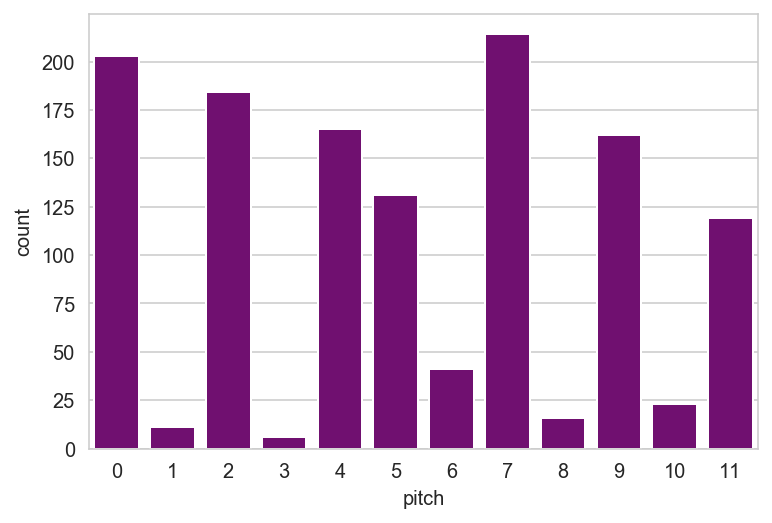

In [326]:
sns.set_style("whitegrid")
sns.barplot(x=dfpitch_count['pitch'], y=dfpitch_count['count'], color = 'purple')

# For All Bach Peices

In [321]:
bach_pitch_count = Counter(bach_pitch_class)

In [322]:
bach_pitch_count

Counter({3: 30416,
         7: 80349,
         10: 35475,
         8: 26621,
         5: 43142,
         2: 90015,
         0: 57680,
         1: 37976,
         9: 84510,
         4: 72298,
         6: 56668,
         11: 64974})

In [324]:
dfbachpitch_count = pd.DataFrame(list(bach_pitch_count.items()), columns=['pitch', 'count']) 

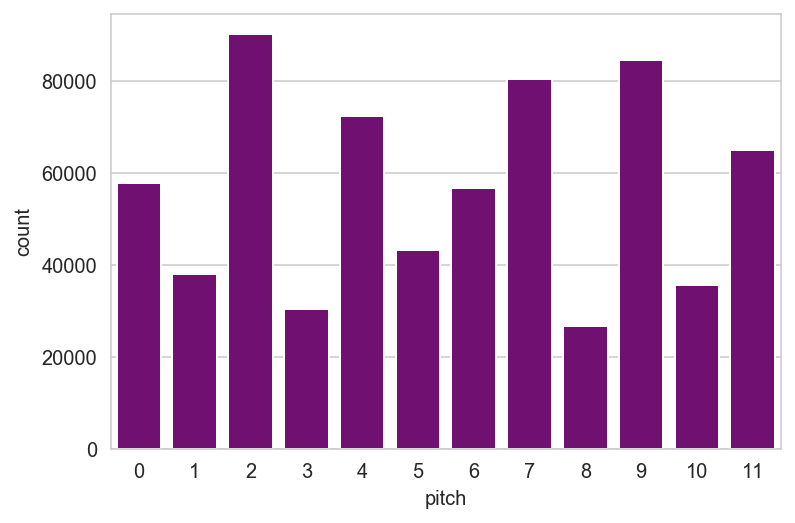

In [327]:
sns.set_style("whitegrid")
sns.barplot(x=dfbachpitch_count['pitch'], y=dfbachpitch_count['count'], color = 'purple')

In [454]:
bach_keys = []
for i in keys:
    bach_keys.append(i.name)
    
b_key_count = Counter(bach_keys)
b_key_count

Counter({'E- major': 11,
         'D major': 30,
         'B- major': 13,
         'A minor': 20,
         'C major': 19,
         'C minor': 28,
         'F major': 12,
         'B minor': 22,
         'F# minor': 3,
         'A major': 7,
         'G major': 31,
         'E minor': 17,
         'G minor': 18,
         'D minor': 31,
         'E major': 11,
         'F minor': 8,
         'C# minor': 3,
         'C# major': 2,
         'E- minor': 2,
         'F# major': 1,
         'A- major': 1,
         'G# minor': 1,
         'B- minor': 1,
         'B major': 1})

In [479]:
dfbach_key = pd.DataFrame(list(b_key_count.items()), columns=['Key', 'count'])
dfbach_key

,Key,count
0,E- major,11
1,D major,30
2,B- major,13
3,A minor,20
4,C major,19
5,C minor,28
6,F major,12
7,B minor,22
8,F# minor,3
9,A major,7


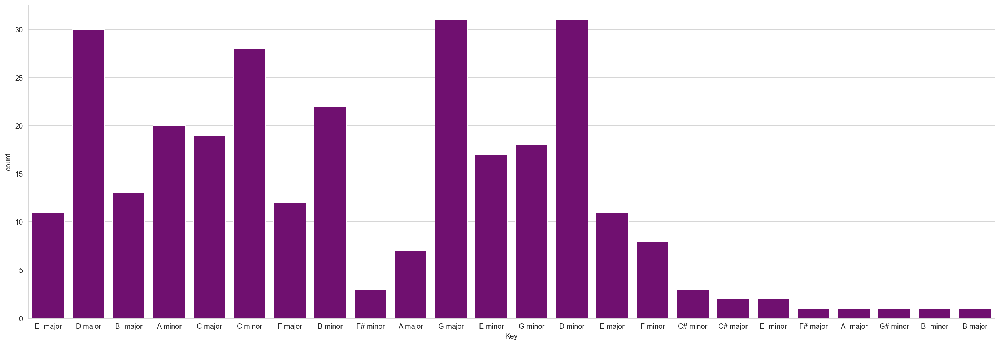

In [482]:
sns.set_style("whitegrid")
plt.figure(figsize=(24, 8))
sns.barplot(x=dfbach_key['Key'], y=dfbach_key['count'], color = 'purple')

In [389]:
bachset_count = Counter(bach_sets)
bachset_count

Counter({'<01>': 789,
         '<02>': 2942,
         '<037>': 5720,
         '<0>': 8019,
         '<05>': 7350,
         '<03>': 24490,
         '<04>': 15456,
         '<06>': 2091,
         '<036>': 1233,
         '<025>': 621,
         '<048>': 22,
         '<026>': 295,
         '<0369>': 107,
         '<015>': 98,
         '<0258>': 460,
         '<0158>': 37,
         '<027>': 94,
         '<014>': 6,
         '<0136>': 22,
         '<0237>': 15,
         '<0148>': 4,
         '<013>': 24,
         '<0236>': 2,
         '<0358>': 85,
         '<0268>': 1,
         '<0147>': 3,
         '<016>': 7,
         '<024>': 13,
         '<0247>': 9,
         '<01368>': 17,
         '<0257>': 10,
         '<0157>': 3,
         '<02469>': 2,
         '<02479>': 1,
         '<024579>': 1,
         '<0235>': 3,
         '<0246>': 2,
         '<01369>': 9,
         '<0137>': 1,
         '<01358>': 5,
         '<0134689>': 1})

In [390]:
dfbachset_count = pd.DataFrame(list(bachset_count.items()), columns=['pitch_set', 'count']) 
dfbachset_count

,pitch_set,count
0,<01>,789
1,<02>,2942
2,<037>,5720
3,<0>,8019
4,<05>,7350
5,<03>,24490
6,<04>,15456
7,<06>,2091
8,<036>,1233
9,<025>,621


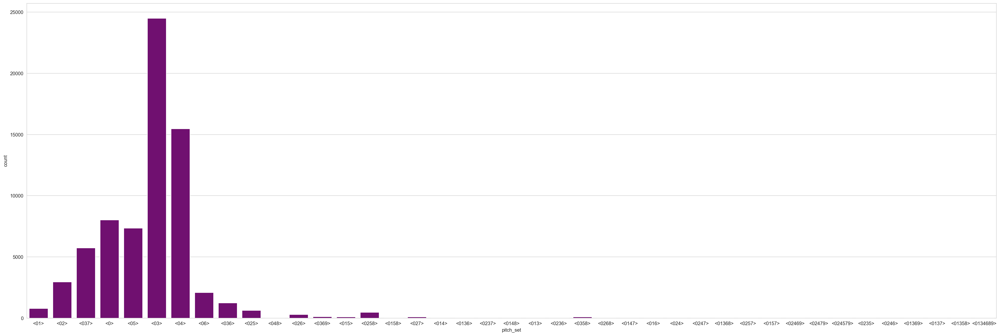

In [394]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=dfbachset_count['pitch_set'], y=dfbachset_count['count'], color = 'purple')

## What About Intervals?

In [353]:
bach_intv_vectors

[[1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1,

In [380]:
dfbach_intv_vectors = pd.DataFrame(bach_intv_vectors)
dfbach_sets = pd.DataFrame(bach_sets)

In [381]:
dfbach_intv_vectors =dfbach_intv_vectors.rename(columns={0: 'm2/M7', 1: 'M2/m7', 2: 'm3/M6', 3: 'M3/m6', 4: 'P4/P5', 5: 'Tri-tone'})





In [458]:
dfbach_intv_vectors[300:309]


,m2/M7,M2/m7,m3/M6,M3/m6,P4/P5,Tri-tone
300,0,0,0,1,0,0
301,0,0,1,0,0,0
302,0,0,1,0,0,0
303,0,0,1,0,0,0
304,0,1,0,0,0,0
305,0,0,1,0,0,0
306,0,0,1,0,0,0
307,0,0,1,0,0,0
308,0,0,0,1,0,0


In [466]:
def convert_vectors(list):
    v = [str(i) for i in list]
    result = ''.join(v)
    return result

In [469]:
bach_vectors = []
for i in bach_intv_vectors:
    bach_vectors.append(convert_vectors(i))

In [472]:
bach_vectors_count = Counter(bach_vectors)
bach_vectors_count

Counter({'100000': 789,
         '010000': 2942,
         '001110': 5720,
         '000000': 8019,
         '000010': 7350,
         '001000': 24490,
         '000100': 15456,
         '000001': 2091,
         '002001': 1233,
         '011010': 621,
         '000300': 22,
         '010101': 295,
         '004002': 107,
         '100110': 98,
         '012111': 460,
         '101220': 37,
         '010020': 94,
         '101100': 6,
         '112011': 22,
         '111120': 15,
         '101310': 4,
         '111000': 24,
         '112101': 2,
         '012120': 85,
         '020202': 1,
         '102111': 3,
         '100011': 7,
         '020100': 13,
         '021120': 9,
         '122131': 17,
         '021030': 10,
         '110121': 3,
         '032221': 2,
         '032140': 1,
         '143250': 1,
         '122010': 3,
         '030201': 2,
         '114112': 9,
         '111111': 1,
         '122230': 5,
         '335442': 1})

In [475]:
dfbach_vectors = pd.DataFrame(list(bach_vectors_count.items()), columns=['interval_vector', 'count'])
dfbach_vectors

,interval_vector,count
0,100000,789
1,010000,2942
2,001110,5720
3,000000,8019
4,000010,7350
5,001000,24490
6,000100,15456
7,000001,2091
8,002001,1233
9,011010,621


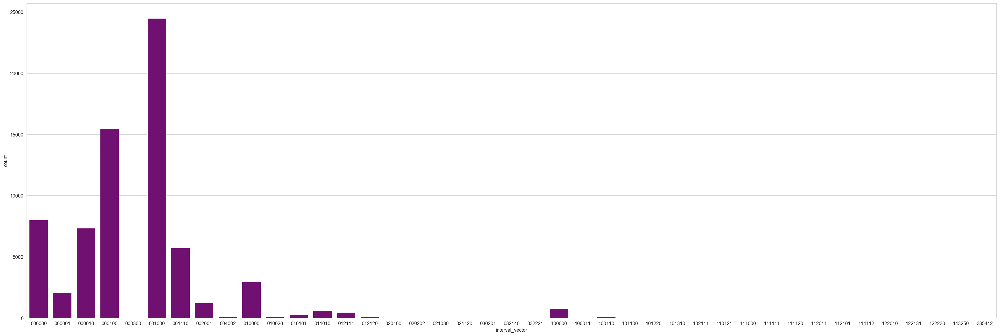

In [477]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=dfbach_vectors['interval_vector'], y=dfbach_vectors['count'], color = 'purple')

In [382]:
dfbach_sets = dfbach_sets.rename(columns={0: 'Pitch_set'})

In [384]:
dfbach_sets

,Pitch_set
0,<01>
1,<01>
2,<02>
3,<02>
4,<02>
...,...
70065,<0>
70066,<0>
70067,<0>
70068,<0>


In [385]:
bach_df = pd.concat([dfbach_sets, dfbach_intv_vectors], axis=1, sort=False)

In [386]:
bach_df

,Pitch_set,m2/M7,M2/m7,m3/M6,M3/m6,P4/P5,Tri-tone
0,<01>,1,0,0,0,0,0
1,<01>,1,0,0,0,0,0
2,<02>,0,1,0,0,0,0
3,<02>,0,1,0,0,0,0
4,<02>,0,1,0,0,0,0
...,...,...,...,...,...,...,...
70065,<0>,0,0,0,0,0,0
70066,<0>,0,0,0,0,0,0
70067,<0>,0,0,0,0,0,0
70068,<0>,0,0,0,0,0,0


In [398]:
bachforte_class = Counter(bach_forte_class)
bachforte_class

Counter({'2-1': 789,
         '2-2': 2942,
         '3-11B': 3688,
         '1-1': 8019,
         '2-5': 7350,
         '2-3': 24490,
         '2-4': 15456,
         '2-6': 2091,
         '3-10': 1233,
         '3-7B': 427,
         '3-12': 22,
         '3-11A': 2032,
         '3-8A': 244,
         '4-28': 107,
         '3-4B': 55,
         '4-27A': 44,
         '4-27B': 416,
         '4-20': 37,
         '3-7A': 194,
         '3-9': 94,
         '3-3A': 3,
         '4-13B': 1,
         '4-14B': 7,
         '4-13A': 21,
         '3-4A': 43,
         '4-19B': 4,
         '3-2B': 14,
         '4-12A': 2,
         '4-26': 85,
         '4-25': 1,
         '4-18A': 1,
         '3-5A': 4,
         '3-8B': 51,
         '3-6': 13,
         '4-22A': 7,
         '4-18B': 2,
         '4-14A': 8,
         '5-29A': 17,
         '4-23': 10,
         '4-16B': 3,
         '5-34': 2,
         '5-35': 1,
         '6-32': 1,
         '3-2A': 10,
         '4-10': 3,
         '4-21': 2,
         '3-5B': 3,

In [401]:
df_bfc = pd.DataFrame(list(bachforte_class.items()), columns=['Forte_Class', 'Count'])
df_bfc

,Forte_Class,Count
0,2-1,789
1,2-2,2942
2,3-11B,3688
3,1-1,8019
4,2-5,7350
5,2-3,24490
6,2-4,15456
7,2-6,2091
8,3-10,1233
9,3-7B,427


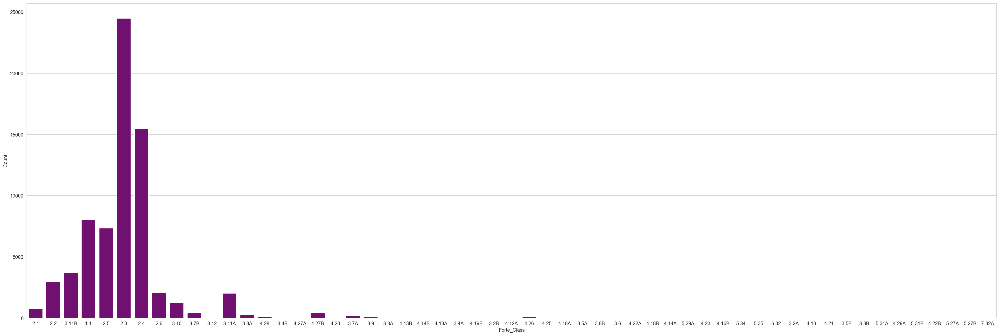

In [403]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=df_bfc['Forte_Class'], y=df_bfc['Count'], color = 'purple')

## Mozart

In [408]:
mozart_midi = '/Volumes/S190813/Music_Box/LTSM_Generative_Music/Mozart/midi_files/mz_332_1.mid'

In [411]:
fs=100
midi_pretty_format = pretty_midi.PrettyMIDI(mozart_midi)
piano_midi = midi_pretty_format.instruments[0] # Get the piano channels
piano_roll = piano_midi.get_piano_roll(fs=fs)

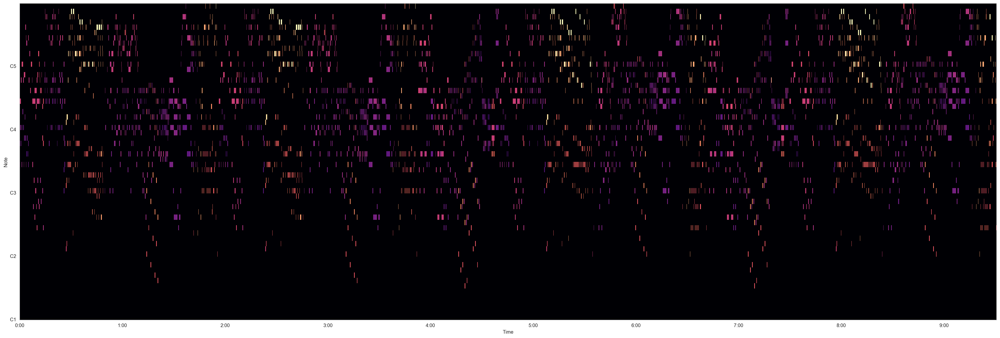

In [413]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(36, 12))
plot_piano_roll(midi_pretty_format, 24, 84)

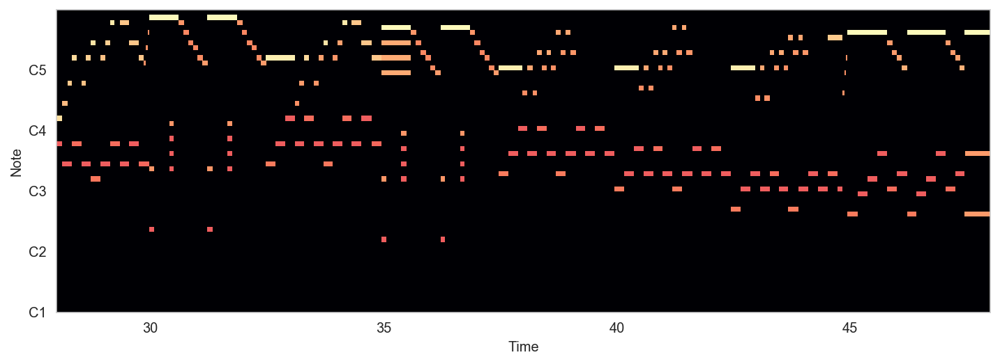

In [416]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(28,48);

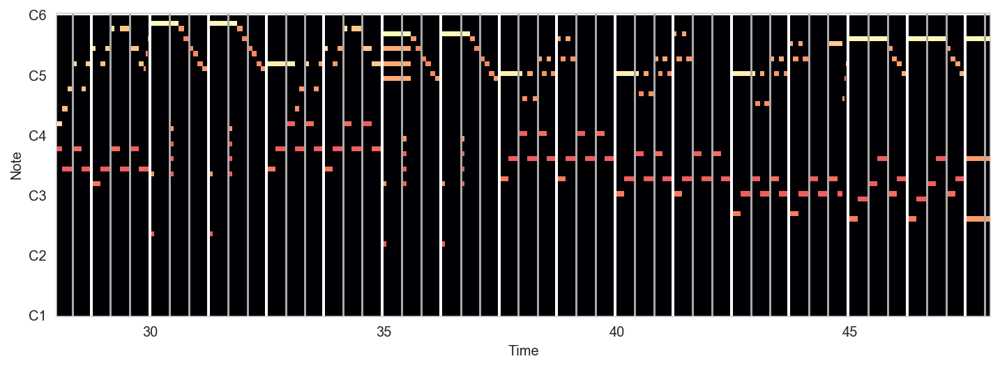

In [417]:
# Get and downbeat times
beats = midi_pretty_format.get_beats()
downbeats = midi_pretty_format.get_downbeats()
# Plot piano roll
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
# Plot beats as grey lines, downbeats as white lines
mir_eval.display.events(beats, base=ymin, height=ymax, color='#AAAAAA')
mir_eval.display.events(downbeats, base=ymin, height=ymax, color='#FFFFFF', lw=2)
# 20 seconds for clarity
plt.xlim(28, 48);

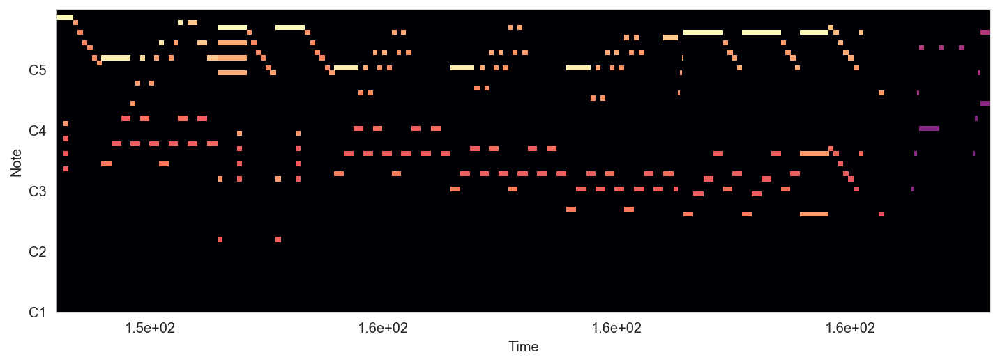

In [420]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(148,168);

In [418]:
mozart = converter.parse('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Mozart/midi_files/mz_332_1.mid')

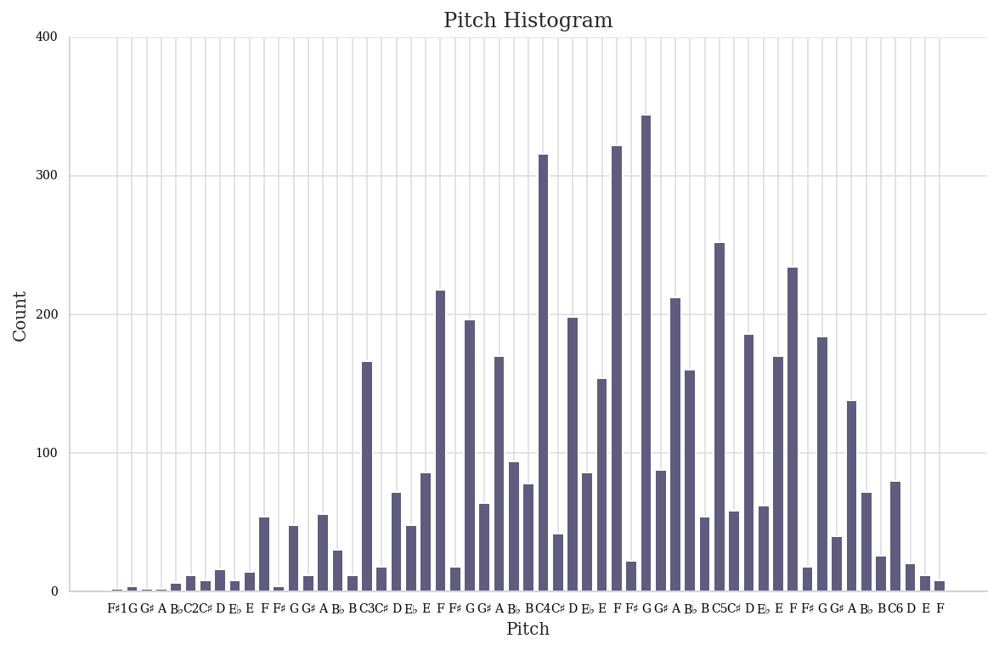

In [421]:
mozart.plot('histogram', 'pitch')

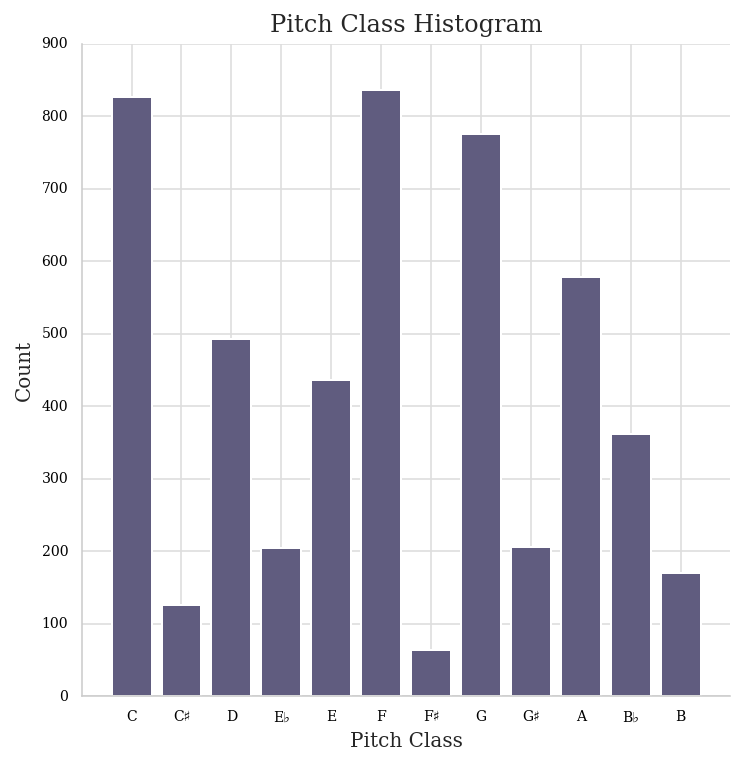

In [422]:
mozart.plot('histogram', 'pitchClass')

In [428]:
mozart.analyze('key')

<music21.key.Key of F major>

meter: WARNING: Found a messed up beam pair <music21.beam.Beams <music21.beam.Beam 1/start>/<music21.beam.Beam 2/partial/right>>, <music21.beam.Beams <music21.beam.Beam 1/stop>/<music21.beam.Beam 2/stop>>, at index 2 of 
[<music21.beam.Beams <music21.beam.Beam 1/start>>, <music21.beam.Beams <music21.beam.Beam 1/stop>>, <music21.beam.Beams <music21.beam.Beam 1/start>/<music21.beam.Beam 2/partial/right>>, <music21.beam.Beams <music21.beam.Beam 1/stop>/<music21.beam.Beam 2/stop>>]
meter: WARNING: Found a messed up beam pair <music21.beam.Beams <music21.beam.Beam 1/start>/<music21.beam.Beam 2/partial/right>>, <music21.beam.Beams <music21.beam.Beam 1/stop>/<music21.beam.Beam 2/stop>>, at index 2 of 
[<music21.beam.Beams <music21.beam.Beam 1/start>>, <music21.beam.Beams <music21.beam.Beam 1/stop>>, <music21.beam.Beams <music21.beam.Beam 1/start>/<music21.beam.Beam 2/partial/right>>, <music21.beam.Beams <music21.beam.Beam 1/stop>/<music21.beam.Beam 2/stop>>]
meter: WARNING: Found a messed up 

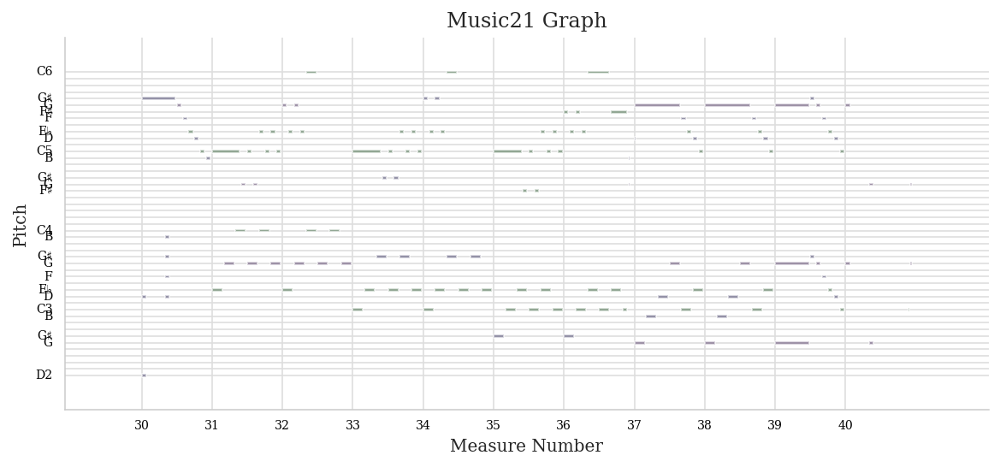

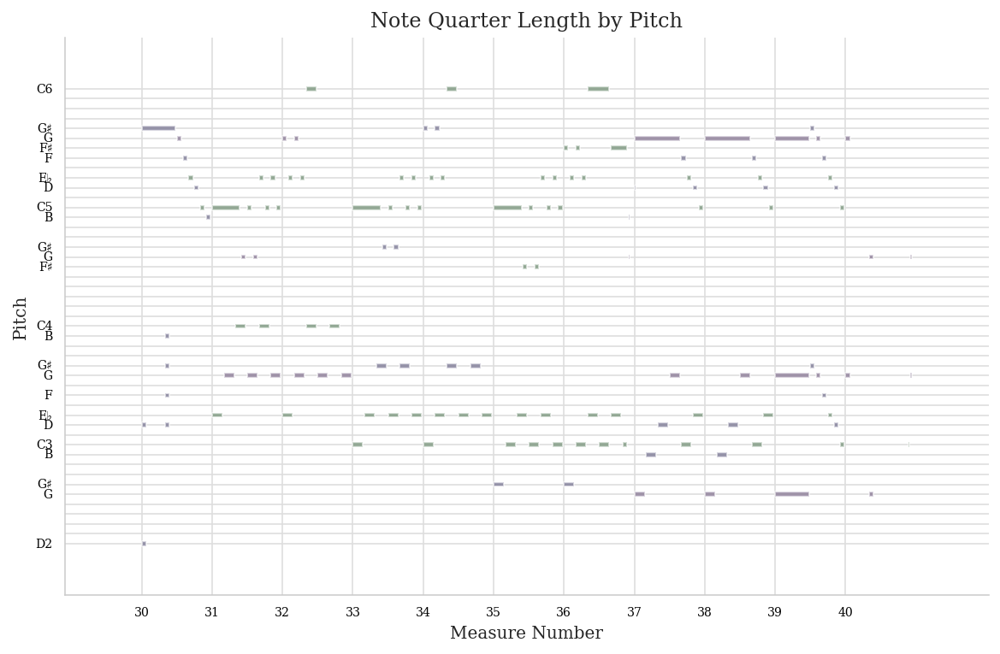

In [426]:
mozart.measures(30,40).plot('horizontalbar', 'pitch')

In [436]:
m_note_name = []
m_notes = []
m_n_durations = []
m_n_offsets = []

m_chord_spelling = []
m_chords = []
m_c_durations = []
m_c_offsets = []

m_keys = []
    
for i,file in enumerate(glob.glob('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Mozart/midi_files/*.mid')):
    print(file)
    midi = converter.parse(file)
    key = midi.analyze('key')
    m_keys.append(key)
    print(key)
    notes_to_parse = midi.flat.notes
    for element in notes_to_parse:
        if isinstance(element, note.Note): # If it is single note
            m_note_name.append(element.pitch)
            m_notes.append(note_to_int(str(element.pitch))) # Append note's integer value to "notes" list.
            m_duration = str(element.duration)[27:-1] 
            m_n_durations.append(check_float(duration)) 
            m_n_offsets.append(element.offset)
            

        elif isinstance(element, chord.Chord): # If it is chord
            m_chord_spelling.append(element.pitchNames)
            m_chords.append('.'.join(str(note_to_int(str(n)))
                                  for n in element.pitches))
            m_duration = str(element.duration)[27:-1]
            m_c_durations.append(check_float(duration))
            m_c_offsets.append(element.offset)
            print(element)

/Volumes/S190813/Music_Box/LTSM_Generative_Music/Mozart/midi_files/mz_311_1.mid
D major
<music21.chord.Chord A4 D5 F#4>
<music21.chord.Chord A2 D2 D3>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord B3 G#3>
<music21.chord.Chord E3 A3 A2>
<music21.chord.Chord D3 A3 F#3>
<music21.chord.Chord A3 E3 A2>
<music21.chord.Chord D3 F#3 A3>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord A5 C#5 E5>
<music21.chord.Chord A2 A3 E3 C#3>
<music21.chord.Chord E5 C#5 A5>
<music21.chord.Chord E3 C#3 A2 A3>
<music21.chord.Chord E5 C#5 A5>
<music21.chord.Chord A2 E3 C#3 A3>
<music21.chord.Chord C#5 A5 E5>
<music21.chord.Chord C#3 A3 E3 A2>
<music21.chord.Chord E3 G#

G major
<music21.chord.Chord G4 C5>
<music21.chord.Chord E3 E4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E5 G4>
<music21.chord.Chord C4 C3>
<music21.chord.Chord D5 G4>
<music21.chord.Chord G4 B4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord E3 E4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord D4 D3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 G4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 F#4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord E4 E3>
<music21.chord.Chord B4 G4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E5 G4>
<music21.chord.Chord C4 C3>
<music21.chord.Chord G4 D5>
<music21.chord.Chord B4 G4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord E4 E3>
<music21.chord.Chord G4 B4>
<music21.

G major
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord D5 F#3>
<music21.chord.Chord G4 C5 E3 E4>
<music21.chord.Chord B4 G4 D3 D4>
<music21.chord.Chord E5 G4 C4 C3>
<music21.chord.Chord D5 G4 B3>
<music21.chord.Chord G4 B4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord G4 C5 E3 E4>
<music21.chord.Chord B4 G4 D4 D3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord C5 C4 E4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 G4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord F#4 C4>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord D4 C4>
<music21.chord.Chord B4 G3>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord G4 F#4>
<music21.chord.Chord A4 E3>
<music21.chord.Chord F#4 C4>
<music21.chord.Chord F#4

D major
<music21.chord.Chord D4 F#4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord A3 A4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E4 A3>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord G5 E5>
<music21.chord.Chord D4 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord C#5 E5 A5>
<music21.chord.Chord A4 A3>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord A4 A3>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E4 A3>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E5 G5>
<music21.chord.Chord D4 A4>
<music21.chord.Chord D5 F#5>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord D4 A3 F#4>
<music21.chord.Chord E4 A3 G4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord D4 F#4>
<music2

D major
<music21.chord.Chord D4 F#4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord A3 A4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E4 A3>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord G5 E5>
<music21.chord.Chord D4 A4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord C#5 E5 A5 A4 A3>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord F#5 D5>
<music21.chord.Chord A4 A3>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E4 A3>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E5 G5>
<music21.chord.Chord D4 A4>
<music21.chord.Chord D5 F#5>
<music21.chord.Chord C#6 E4 B3 G3>
<music21.chord.Chord B5 D4 A3 F#4>
<music21.chord.Chord A5 E4 A3 G4>
<music21.chord.Chord D5 F#4 D4>
<music21.chord.Chord D4 D2>
<music21.chord.Chord F#4 F#2>
<music21.chord.Chord A4 A2>
<music21.chord.Chord F#4 F#2>
<music21.chord.Chord A4 A2>
<music21.chord.Chord D5 D3>
<music21.chord.C

C major
<music21.chord.Chord C4 E4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord C4 G3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord G3 D4>
<music21.chord.Chord C4 G3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F#3 C4 D4 A3>
<music21.chord.Chord C5 D5>
<music21.chord.Chord C5 D5>
<music21.chord.Chord C5 D5>
<music21.chord.Chord C5 D5>
<music21.chord.Chord F#3 E-3 A3>
<music21.chord.Chord E3 G3>
<music21.chord.Chord C3 E3>
<music21.chord.Chord C3 G3>
<music21.chord.Chord E3 C#3>
<music21.chord.Chord E5 F#5>
<music21.chord.Chord E4 F#4>
<music21.chord.Chord C3 A3>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord B3 D4 G3>
<music21.chord.Chord C3 A3 E3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord B3 D4 G3>
<music21.chord.Chord A3 C3 E3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord G3 B3 D3>
<music21.chord.Chord D3 F#3 C4>
<musi

F major
<music21.chord.Chord F3 A3 C4>
<music21.chord.Chord G3 B-3 C3>
<music21.chord.Chord C4 F4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord E4 G4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord C4 F4 A4>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F4 B-4>
<music21.chord.Chord D4 D3>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord A3 A2>
<music21.chord.Chord F4 A4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord B3 F4 D4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord F3 B3 D3>
<music21.chord.Chord G3 C4 E3>
<music21.chord.Chord A5 B5>
<music21.chord.Chord A3 D4 F3>
<music21.chord.Chord C4 E4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord F3 A3 C4>
<music21.chord.Chord C3 G3 B-3>
<music21.chord.Chord C4 F4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord E4 G4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord F4 C4 A4>
<music21.chord.Chord F2 F3>
<music21.chord.Chord F4 B-4>
<music21.chord.Chord D3 D4>
<mus

F major
<music21.chord.Chord F3 A3 C4>
<music21.chord.Chord G3 B-3 C3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord C4 F4 A2 A3>
<music21.chord.Chord E4 G4 G2 G3>
<music21.chord.Chord C4 F4 A4 F2 F3>
<music21.chord.Chord F4 B-4>
<music21.chord.Chord D4 D3>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord C5 A3 A2>
<music21.chord.Chord B3 D3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord F4 A4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord B3 F4 D4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord F3 B3 D3>
<music21.chord.Chord G3 C4 E3>
<music21.chord.Chord A5 B5>
<music21.chord.Chord A3 D4 F3>
<music21.chord.Chord C4 E4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord C5 C4 E4>
<music21.chord.Chord F3 A3 C4>
<music21.chord.Chord C3 G3 B-3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord C4 F4 A2 A3>
<music21.chord.Chord E4 G4 G2 G3>
<music21.chord.Chord F4 C4 A4 F2 F3>
<music21.chord.Ch

C major
<music21.chord.Chord B4 D5>
<music21.chord.Chord E5 C5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord D5 F5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord G4 B3>
<music21.chord.Chord G4 C4>
<music21.chord.Chord B3 G3>
<music21.chord.Chord D5 B4>
<music21.chord.Chord C5 E5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord F5 D5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord D4 F3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord D4 F3 A3>
<music21.chord.Chord C4 E4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord A3 D4 F3>
<music21.chord.Chord C4 E4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord A3 D4 F#3>
<music21.chord.Chord B3 G3 D4>
<music21.chord.Chord B3 G3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord F#3 D3>
<music21.chord.Chord G3 E3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord G3 B

A major
<music21.chord.Chord A3 E4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord E4 B3>
<music21.chord.Chord E4 B3>
<music21.chord.Chord F#3 E4>
<music21.chord.Chord E4 F#3>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord E4 A3>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord E4 A3>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E4 G#3>
<music21.chord.Chord B3 E4>
<music21.chord.Chord E4 B3>
<music21.chord.Chord E4 F#3>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord B4 D5 F#4>
<music21.chord.Chord E4 C#5 A4>
<music21.chord.Chord G#4 D4 B4 E4>
<music21.chord.Chord A4 E4 C#4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E4 G#3>
<music21.chord.Chord B3 E4>
<music21.chord.Chord E4 B3>
<music21.chord.Chord E4 F#3>
<music21.chord.Chord F#3 E4>
<m

<music21.chord.Chord A2 C#3>
<music21.chord.Chord E3 A3>
<music21.chord.Chord B2 D3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord C#3 E3>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord B3 E4>
<music21.chord.Chord E4 A3>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord A3 C#4 E4>
<music21.chord.Chord F#5 E5>
<music21.chord.Chord D3 B3>
<music21.chord.Chord E5 D5>
<music21.chord.Chord E3 A3>
<music21.chord.Chord D5 C#5>
<music21.chord.Chord D3 G#3>
<music21.chord.Chord C#5 B4>
<music21.chord.Chord C#3 A3>
<music21.chord.Chor

<music21.chord.Chord F#5 C#4>
<music21.chord.Chord E5 E4>
<music21.chord.Chord D5 A3>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord D5 E4>
<music21.chord.Chord C#5 E3>
<music21.chord.Chord B4 E4>
<music21.chord.Chord E4 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord D3 B3>
<music21.chord.Chord G#3 E3>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord A4 C#5 E2>
<music21.chord.Chord B4 G#4 E3>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord E4 F#3>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord B3 D3 F#3>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord B4 G#4 D4>
<music21.chord.Chord F#5 C#4>
<music21.chord.Chord E5 E4>
<music21.c

A major
<music21.chord.Chord A2 A3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord B3 A4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord E3 D4>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord B3 A4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord E3 D4>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord A2 A3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord B3 A4>
<music21.chord.Chord E4 G#4>
<music21.chord.Ch

A major
<music21.chord.Chord A4 A2 A3>
<music21.chord.Chord E4 E2 E3>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord A4 A2 A3>
<music21.chord.Chord C#6 A3 F#4>
<music21.chord.Chord E-5 B3 A4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord A4 E3>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord E5 B3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord B4 E3>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord C#5 D3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord G5 F#3>
<music21.chord.Chord F#5 B3>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord E3 D4>
<music21.chord.Chord A4 A3 C#4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord E-5 F#5 A4>
<music21.chord.Chord E5 E4 G#4>
<music21.chord.Chord A4 A2 A3>
<music21.chord.Chord E4 E2 E3>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord A4 A2 A3>
<music21.chord.Chord C#6 A3 F#4>
<music21.chord.Chord E-5 B3 A4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord A4 E3>
<mus

A major
<music21.chord.Chord E4 C4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord G5 A5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord E4 B3>
<music21.chord.Chord E5 G5>
<music21.chord.Chord E4 B3>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord E4 B3>
<music21.chord.Chord G5 A5>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord E4 B3>
<music21.chord.Chord E5 G5>
<music21.chord.Chord E4 B3>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord E4 B3>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord E4 B3>
<music21.chord.Chord E5 G5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord E4 C4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C4>
<musi

A major
<music21.chord.Chord C5 A3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord D5 C4 E4>
<music21.chord.Chord B4 C4 E4>
<music21.chord.Chord E5 A3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord F5 E4 C4>
<music21.chord.Chord E-5 E4 C4>
<music21.chord.Chord B5 A3>
<music21.chord.Chord G#5 E4 C4>
<music21.chord.Chord B5 A3>
<music21.chord.Chord G#5 E4 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord A5 E4 C4>
<music21.chord.Chord C6 E4 C4>
<music21.chord.Chord G5 A5>
<music21.chord.Chord B5 E3>
<music21.chord.Chord F#5 A5 E4 B3>
<music21.chord.Chord E5 G5 E4 B3>
<music21.chord.Chord F#5 A5 E4 B3>
<music21.chord.Chord G5 A5>
<music21.chord.Chord B5 E3>
<music21.chord.Chord F#5 A5 E4 B3>
<music21.chord.Chord E5 G5 E4 B3>
<music21.chord.Chord F#5 A5 E4 B3>
<music21.chord.Chord B5 E3>
<music21.chord.Chord F#5 A5 E4 B3>
<music21.chord.Chord E5 G5 B2>
<music21.chord.Chord E-5 F#5 B3>
<music21.chord.Chord E5 E3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord E4 C4>
<music21.chord

F major
<music21.chord.Chord F3 A3>
<music21.chord.Chord B-3 E4>
<music21.chord.Chord F4 A3>
<music21.chord.Chord C5 A4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord G4 C4>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord E5 G5>
<music21.chord.Chord C4 G4>
<music21.chord.Chord E5 G5>
<music21.chord.Chord G4 C4>
<music21.chord.Chord G5 E5>
<music21.chord.Chord C4 G4>
<music21.chord.Chord E5 G5>
<music21.chord.Chord G4 C4>
<music21.chord.Chord A5 F5>
<music21.chord.Chord A4 F4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord G4 C4>
<music21.chord.Chord F4 A3>
<music21.chord.Chord A3 F4>
<music21.chord.Chord A3 F4>
<music21.chord.Chord G4 C4>
<music21.chord.Chord E5 B-4>
<music21.chord.Chord C4 G4>
<music21.chord.Chord A4 F5>
<music21

<music21.chord.Chord A4 C5 F5>
<music21.chord.Chord F4 F3 A3 C4>
<music21.chord.Chord A3 A2>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord D4 D3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord C5 G4 E5>
<music21.chord.Chord C4 C3>
<music21.chord.Chord F5 A4 C5>
<music21.chord.Chord F3 F4>
<music21.chord.Chord F3 F2>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Mozart/midi_files/mz_332_1_format0.mid
F major
<music21.chord.Chord F5 F3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord F5 F3 A3>
<music21.chord.Chord A4 F2>
<music21.chord.Chord B-4 D3>
<music21.chord.Chord D5 B-2>
<music21.chord.Chord G4 B-2>
<music21.chord.Chord B-3 E4 C3>
<music21.chord.Chord F4 A3 F2>
<music21.chord.Chord C6 C5 A4>
<music21.chord.Chord B-5 G4 B-4>
<music21.chord.Chord A5 A4 F4>
<music21.chord.Chord A5 F4 A4>
<music21.chord.Chord A5 F4 A4>
<music21.chord.Chord G5 G4 C4>
<music21.chord.Chord F5 F4 A3>
<music21.chord.Chord F5 F4 A3>
<music21.chord.Chord F5 F4 A3>
<music21.chord.Chord E5 G5 C4 G4>

<music21.chord.Chord A4 A5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord A4 A5>
<music21.chord.Chord B4 B5>
<music21.chord.Chord C5 C6>
<music21.chord.Chord B4 B5>
<music21.chord.Chord C5 C6>
<music21.chord.Chord F3 A3>
<music21.chord.Chord C5 A3>
<music21.chord.Chord E5 C4>
<music21.chord.Chord A5 F5 F3>
<music21.chord.Chord C6 D4>
<music21.chord.Chord D6 F4>
<music21.chord.Chord D6 E4>
<music21.chord.Chord C6 G4>
<music21.chord.Chord B5 C5>
<music21.chord.Chord C6 G4>
<music21.chord.Chord B-5 E4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord C4 B-4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord C5 G#4>

B- major
<music21.chord.Chord D5 B-3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord E-5 F4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord C5 A3>
<music21.chord.Chord E-5 G3>
<music21.chord.Chord E-5 B-3>
<music21.chord.Chord F5 E-4>
<music21.chord.Chord G5 E-3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord A5 B-3>
<music21.chord.Chord B-5 B-3>
<music21.chord.Chord F5 D3>
<music21.chord.Chord F5 E-3>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord D5 E-3>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord E5 D3>
<music21.chord.Chord E-5 D3>
<music21.chord.Chord F5 F3>
<music21.chord.Chord C5 F4>
<music21.chord.Chord E-5 B-3>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord F3 C4 A3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord C5 F4>
<music21.chord.Chord C#5 B-3>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord E-5 F4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-5 F#3>
<music21.chord.Chord E-5 B-3>
<mus

F major
<music21.chord.Chord F3 A2 C3 F2>
<music21.chord.Chord F4 A3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord G4 E5 C4>
<music21.chord.Chord A2 C3 F3 F2>
<music21.chord.Chord F4 A3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord E3 B-3 C3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord C4 B-3>
<music21

<music21.chord.Chord G#4 B-3>
<music21.chord.Chord F4 B3>
<music21.chord.Chord G4 C3>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord F5 F4>
<music21.chord.Chord B4 B5>
<music21.chord.Chord C6 C5 C4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord C#5 C#6>
<music21.chord.Chord C5 C6>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord A5 A4>
<music21.chord.Chord C6 C5 A3>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord B5 B4>
<music21.chord.Chord C5 C6>
<music21.chord.Chord C#6 C#5>
<music21.chord.Chord C5 C6 G#2>
<music21.chord.Chord E5 G5>
<music21.chord.Chord F3 A3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord B-4 E3>
<music21.chord.Chord B-4 C3>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord B-4 E3>
<music21.chord.Chord B-4 C3>
<music21.chord.Chord B-5 G4>
<music21.chord.Chord B-5 E4>
<music21.chord.Chord B-5 C4>
<music21.chord.Chord B-5 G4>
<music21.chord.Chord B-5 E4>
<music21.chord.Chord B-5 C4>
<music21.chord.Chord B4 D4>
<music21.chord

B- major
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord D5 B-3>
<music21.chord.Chord G5 D4>
<music21.chord.Chord D5 G4>
<music21.chord.Chord A4 F3>
<music21.chord.Chord B-4 C4>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord D5 E-4>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord D5 E-4>
<music21.chord.Chord A4 E-4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord D5 E-4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord C5 D4>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord D5 E-4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord A4 E-4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord E-5 C6>
<music21.chord.Chord D5 B-5>
<music21.chord.Chord C5 A5>
<music21.chord.Chord B-5 D5>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord A4 D3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord E5 C4>
<music21.chord.Chord E5 C4>
<music21.chord.Chord A5 B-3>
<music21.chord.Ch

<music21.chord.Chord E-3 B-3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord A3 F3>
<music21.chord.Chord B-4 B-2 B-3>
<music21.chord.Chord E-4 B-2 G3>
<music21.chord.Chord E-4 B-2 G3>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord D5 F5 F3>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B-4 B-3 D4>
<music21.chord.Chord E-5 B-3 G4>
<music21.chord.Chord E-6 B-3 G4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord F6 B-3>
<music21.chord.Chord F6 F3>
<music21.chord.Chord F6 B-3>
<music21.chord.Chord F6 F3>
<music21.chord.Chord D6 D4>
<music21.chord.Chord B-5 B-3>
<music21.chord.Chord F5 D4>
<music21.chord.Chord B-5 F3>
<music21.chord.Chord F5 D4>
<music21.chord.Chord D5 B-3>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord A5 C5>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord C6 A4>
<music21.chord.Chor

E- major
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord B-4 G4 E-3>
<music21.chord.Chord F4 G#4 F3>
<music21.chord.Chord E-4 G4 G3>
<music21.chord.Chord E4 B-3 C#4>
<music21.chord.Chord C4 G#3>
<music21.chord.Chord G3 E-4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord B-4 C4 F3>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord B-5 G#3>
<music21.chord.Chord G#5 F3>
<music21.chord.Chord G5 E-3>
<music21.chord.Chord F5 F3>
<music21.chord.Chord E-5 G#3>
<music21.chord.Chord D5 F3>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord B-5 G#3>
<music21.chord.Chord G#5 F3>
<music21.chord.Chord G5 E-3>
<music21.chord.

B- major
<music21.chord.Chord E-3 C4>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord C5 A4>
<music21.chord.Chord G4 E-5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord F5 A4>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord A4 F4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord F4 A3>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord F4 G4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord F3 A3>
<music21.chord.Chord A3 F3>
<music21.chord.Chord A3 F3>
<music21.chord.Chord G3 B-3 F3>
<music21.chord.Chord F3 G3 B-3>
<music21.chord.Chord F3 G#3 B3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord C4 F3 E-4>
<music21.chord.Chord C4 E-3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord D4 B-3

B- major
<music21.chord.Chord B-4 D4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord G5 E-4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord G5 E-4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord A5 E-4>
<music21.chord.Chord B-4 B-3 D4>
<music21.chord.Chord D5 B-4 B-3>
<music21.chord.Chord B-4 D5 G3>
<music21.chord.Chord E-5 C5 E-3>
<music21.chord.Chord C5 A4 F3>
<music21.chord.Chord G4 E-5 C4>
<music21.chord.Chord C5 E-5 A3>
<music21.chord.Chord F5 A4 F3>
<music21.chord.Chord B-4 D5 B-3>
<music21.chord.Chord A4 F4>
<music2

C major
<music21.chord.Chord F3 C4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord D3 C4>
<music21.chord.Chord D3 B3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord E3 C3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord B4 D5 G5>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord G4 B4>
<music21.chord.Chord D4 A4 C5>
<music21.chord.Chord G4 B4>
<music21.chord.Chord D3 A3 C4>
<music21.chord.Chord G3 B3>
<music21.chord.Chord D5 B5>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B4 G5>
<music21.chord.Chord G2 G3>
<music21.chord.Chord F3 C4>
<mu

G major
<music21.chord.Chord F#4 A4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G3 B3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord D3 C4>
<music21.chord.Chord G3 B3>
<music21.chord.Chord D3 C4>
<music21.chord.Chord G3 B3>
<music21.chord.Chord B3 G4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Mozart/midi_files/mz_545_2_format0.mid
G major
<music21.chord.Chord D5 A3>
<music21.chord.Chord C5 D4>
<music21.chord.Chord B4 C4>
<music21.chord.Chord C5 D4>
<music21.chord.Chord B4 D4>
<music21.chord.Chord A5 C4>
<music21.chord.Chord G5 E4>
<music21.chord.Chord F#5 G3>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord D5 B-3>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord B4 D4>
<music21.chord.Chord A4 D4>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord A4 C4>
<music21.chord.

C major
<music21.chord.Chord E5 G5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord C5 E5>
<music21.chord.Chord C4 A3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord D5 F5>
<music21.chord.Chord A3 F3>
<music21.chord.Chord D5 F5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord G3 B3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E5 G5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord C5 E5>
<music21.chord.Chord C4 A3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord F5 A5>
<music21.chord.Chord F3 D3>
<music21.chord.Chord F5 A5>
<music21.chord.Chord B4 D5>
<music21.chord.Chord G3 B3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord C3 E3>
<music21.chord.Chord A3 F3>
<music21.chord.Chord F4 G3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord E5 G5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord C5 E5>
<music21.chord.Chord C4 A3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord D5 F5>
<music21.chord.Chord A3 F3>
<music21.chord.Chord D5 F5>
<music21.cho

B- major
<music21.chord.Chord E-4 F3 C4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-3 E-3 G3>
<music21.chord.Chord D3 F3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord D3 F3 B-3>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord D5 B-4 G5>
<music21.chord.Chord A4 F#4 D5>
<music21.chord.Chord C4 E4>
<music21.chord.Chord G4 E4 C5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord C3 A3>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord A2 F3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord D3 F3 G3>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C3 E3>
<music21.chord.Chord A4 C5 F5>
<music21.chord.Chord E-4 F3 C4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord D4 B-3>


E- major
<music21.chord.Chord G4 B-4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord G3 E-4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord B-4 E-5>
<music21.chord.Chord D5 F5>
<music21.chord.Chord E-5 G5>
<music21.chord.Chord E-5 G#5>
<music21.chord.Chord B-5 E-5>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord D5 F5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord G3 E-4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord B-4 E-5>
<music21.chord.Chord D5 F5>
<music21.chord.Chord E-5 G5>
<music21.chord.Chord E-5 G#5>
<music21.chord.Chord B-5 E-5>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord D5 F5>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord F4 E-4>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord G#4 E-5>
<music21.chord.Chord F#4 E-5>
<music21.chord.Chord F4 E-5>
<music21.chord.Chord B3 D4>
<

E- major
<music21.chord.Chord G4 B-4 E-2 E-3>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord B-3 F4 B-2>
<music21.chord.Chord G3 E-4>
<music21.chord.Chord D4 F4 B-2>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord G#4 C3>
<music21.chord.Chord B-4 G2>
<music21.chord.Chord C5 G#2>
<music21.chord.Chord B-5 G4>
<music21.chord.Chord G5 E-4>
<music21.chord.Chord F5 B-3>
<music21.chord.Chord B-4 E-5 G3>
<music21.chord.Chord D5 F5 B-3>
<music21.chord.Chord E-5 G5 E-4>
<music21.chord.Chord E-5 G#5 C4>
<music21.chord.Chord B-5 E-5 G3>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord D5 F5 G#4>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord G4 B-4 E-2 E-3>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord B-3 F4 B-2>
<music21.chord.Chord G3 E-4>
<music21.chord.Chord D4 F4 B-2>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord G#4 C3>
<music21.chord.Chord B-4 G2>
<music21.chord.Chord C5 G#2>
<music21.chord.Chord B-5 G4>
<music21.chord.Chord G5 E-4>
<music21.ch

B- major
<music21.chord.Chord C5 E-5>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord A4 F4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord F4 D5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord G4 E-5>
<music21.chord.Chord G4 E-5>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord D5 F5>
<music21.chord.Chord D5 F5>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord E-5 G5>
<music21.chord.Chord E-5 G5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord A3 F4>
<music21.chord.Chord B-3 G4 F4>
<music21.chord.Chord F4 D5>
<music21.chord.Chord F4 D5>
<music21.chor

In [437]:
len(m_chord_spelling)

20262

## Abstracting Harmonic Material

In [439]:
mozart_sets = []
mozart_intv_vectors = []
mozart_forte_class = []
for i in m_chord_spelling:
    mozart_sets.append(chord.Chord(i).primeFormString)
    mozart_intv_vectors.append(chord.Chord(i).intervalVector)
    mozart_forte_class.append(chord.Chord(i).forteClass)

In [440]:
mozart_sets

['<037>',
 '<05>',
 '<04>',
 '<03>',
 '<03>',
 '<0>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<04>',
 '<04>',
 '<04>',
 '<03>',
 '<05>',
 '<037>',
 '<05>',
 '<037>',
 '<03>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<04>',
 '<0>',
 '<04>',
 '<037>',
 '<04>',
 '<037>',
 '<04>',
 '<036>',
 '<0>',
 '<04>',
 '<0>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<04>',
 '<04>',
 '<03>',
 '<036>',
 '<04>',
 '<037>',
 '<05>',
 '<04>',
 '<03>',
 '<03>',
 '<0>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<04>',
 '<04>',
 '<04>',
 '<03>',
 '<05>',
 '<037>',
 '<05>',
 '<037>',
 '<03>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<04>',
 '<0>',
 '<04>',
 '<037>',
 '<04>',
 '<037>',
 '<04>',
 '<036>',
 '<0>',
 '<04>',
 '<0>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<04>',
 '<04>',
 '<03>',
 '<036>',
 '<04>',
 '<0>',
 '<04>',
 '<04>',
 '<03>',
 '<03>',
 '<0>',
 '<03>',
 '<04>',
 '<03>',

In [441]:
mozart_intv_vectors

[[0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 2, 0, 0, 1],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0,

In [442]:
mozart_forte_class

['3-11B',
 '2-5',
 '2-4',
 '2-3',
 '2-3',
 '1-1',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-4',
 '2-4',
 '2-4',
 '2-3',
 '2-5',
 '3-11B',
 '2-5',
 '3-11B',
 '2-3',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '2-4',
 '1-1',
 '2-4',
 '3-11B',
 '2-4',
 '3-11B',
 '2-4',
 '3-10',
 '1-1',
 '2-4',
 '1-1',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-4',
 '2-4',
 '2-3',
 '3-10',
 '2-4',
 '3-11B',
 '2-5',
 '2-4',
 '2-3',
 '2-3',
 '1-1',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-4',
 '2-4',
 '2-4',
 '2-3',
 '2-5',
 '3-11B',
 '2-5',
 '3-11B',
 '2-3',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '2-4',
 '1-1',
 '2-4',
 '3-11B',
 '2-4',
 '3-11B',
 '2-4',
 '3-10',
 '1-1',
 '2-4',
 '1-1',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-4',
 '2-4',
 '2-3',
 '3-10',
 '2-4',
 '1-1',
 '2-4',
 '2-4',
 '2-3',
 '2-3',
 '1-1',
 '2-3',
 '2-4',
 '2-3',
 '2-4',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '2-3',
 '2-4',
 '2-4',
 '2-3',


In [443]:
mozart_pitch_class = []
for i in m_note_name:
    mozart_pitch_class.append(i.pitchClass)

In [445]:
mozart_pitch_count = Counter(mozart_pitch_class)

In [446]:
mozart_pitch_count

Counter({7: 11157,
         6: 3552,
         4: 9617,
         9: 10383,
         11: 6157,
         1: 3724,
         2: 11379,
         5: 9776,
         3: 4551,
         8: 2932,
         0: 11572,
         10: 6336})

In [447]:
dfmozartpitch_count = pd.DataFrame(list(mozart_pitch_count.items()), columns=['pitch', 'count']) 

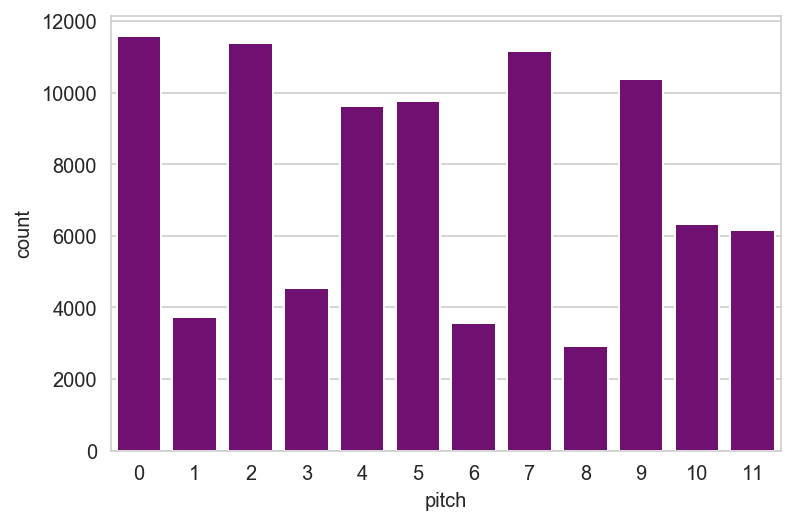

In [448]:
sns.set_style("whitegrid")
sns.barplot(x=dfmozartpitch_count['pitch'], y=dfmozartpitch_count['count'], color = 'purple')

In [455]:
mozart_keys = []
for i in m_keys:
    mozart_keys.append(i.name)
    
mozart_key_count = Counter(mozart_keys)
mozart_key_count

Counter({'D major': 4,
         'G major': 4,
         'C major': 8,
         'F major': 6,
         'A major': 6,
         'B- major': 10,
         'E- major': 4})

In [484]:
dfmozart_key = pd.DataFrame(list(mozart_key_count.items()), columns=['key', 'count'])
dfmozart_key

,key,count
0,D major,4
1,G major,4
2,C major,8
3,F major,6
4,A major,6
5,B- major,10
6,E- major,4


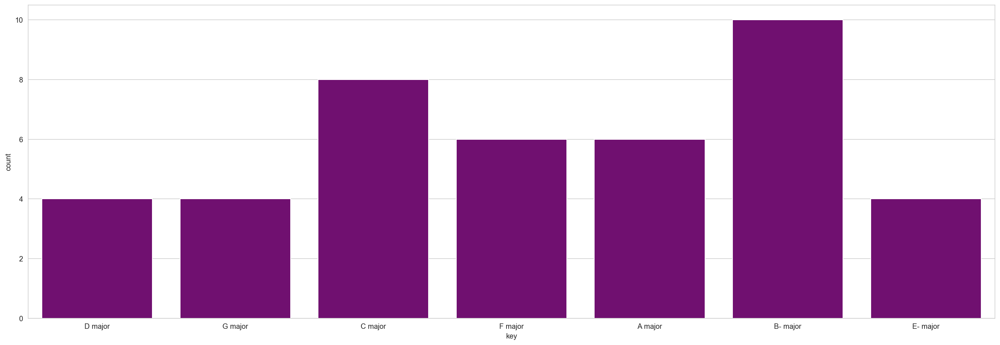

In [485]:
sns.set_style("whitegrid")
plt.figure(figsize=(24, 8))
sns.barplot(x=dfmozart_key['key'], y=dfmozart_key['count'], color = 'purple')

In [457]:
mozartset_count = Counter(mozart_sets)
mozartset_count

Counter({'<037>': 1455,
         '<05>': 2085,
         '<04>': 4582,
         '<03>': 5557,
         '<0>': 2966,
         '<036>': 361,
         '<026>': 155,
         '<06>': 581,
         '<02>': 1399,
         '<025>': 375,
         '<013>': 20,
         '<0258>': 170,
         '<0369>': 67,
         '<01>': 359,
         '<048>': 25,
         '<015>': 32,
         '<024>': 14,
         '<027>': 15,
         '<0358>': 10,
         '<014>': 8,
         '<0257>': 20,
         '<016>': 2,
         '<0237>': 4})

In [486]:
dfmozartset_count = pd.DataFrame(list(mozartset_count.items()), columns=['pitch_set', 'count']) 
dfmozartset_count

,pitch_set,count
0,<037>,1455
1,<05>,2085
2,<04>,4582
3,<03>,5557
4,<0>,2966
5,<036>,361
6,<026>,155
7,<06>,581
8,<02>,1399
9,<025>,375


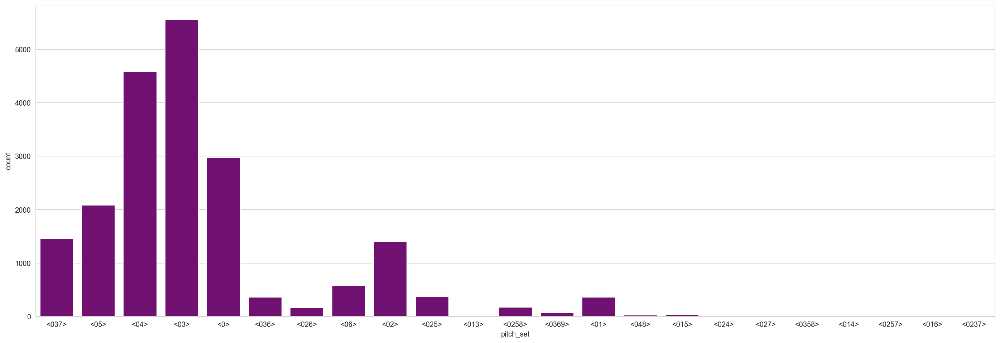

In [487]:
sns.set_style("whitegrid")
plt.figure(figsize=(24, 8))
sns.barplot(x=dfmozartset_count['pitch_set'], y=dfmozartset_count['count'], color = 'purple')

## What About Intervals?

In [488]:
mozart_intv_vectors

[[0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 2, 0, 0, 1],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0,

In [489]:
dfmozart_intv_vectors = pd.DataFrame(mozart_intv_vectors)
dfmozart_intv_vectors

,0,1,2,3,4,5
0,0,0,1,1,1,0
1,0,0,0,0,1,0
2,0,0,0,1,0,0
3,0,0,1,0,0,0
4,0,0,1,0,0,0
...,...,...,...,...,...,...
20257,0,0,1,0,0,0
20258,0,0,0,0,0,1
20259,0,0,0,1,0,0
20260,0,0,1,1,1,0


In [490]:
dfmozart_intv_vectors = dfmozart_intv_vectors.rename(columns={0: 'm2/M7', 1: 'M2/m7', 2: 'm3/M6', 3: 'M3/m6', 4: 'P4/P5', 5: 'Tri-tone'})
dfmozart_intv_vectors



,m2/M7,M2/m7,m3/M6,M3/m6,P4/P5,Tri-tone
0,0,0,1,1,1,0
1,0,0,0,0,1,0
2,0,0,0,1,0,0
3,0,0,1,0,0,0
4,0,0,1,0,0,0
...,...,...,...,...,...,...
20257,0,0,1,0,0,0
20258,0,0,0,0,0,1
20259,0,0,0,1,0,0
20260,0,0,1,1,1,0


In [491]:
mozart_vectors = []
for i in mozart_intv_vectors:
    mozart_vectors.append(convert_vectors(i))
mozart_vector_count = Counter(mozart_vectors)

In [492]:
mozart_vector_count

Counter({'001110': 1455,
         '000010': 2085,
         '000100': 4582,
         '001000': 5557,
         '000000': 2966,
         '002001': 361,
         '010101': 155,
         '000001': 581,
         '010000': 1399,
         '011010': 375,
         '111000': 20,
         '012111': 170,
         '004002': 67,
         '100000': 359,
         '000300': 25,
         '100110': 32,
         '020100': 14,
         '010020': 15,
         '012120': 10,
         '101100': 8,
         '021030': 20,
         '100011': 2,
         '111120': 4})

In [494]:
dfmozart_vectors = pd.DataFrame(list(mozart_vector_count.items()), columns=['interval_vector', 'count'])
dfmozart_vectors

,interval_vector,count
0,001110,1455
1,000010,2085
2,000100,4582
3,001000,5557
4,000000,2966
5,002001,361
6,010101,155
7,000001,581
8,010000,1399
9,011010,375


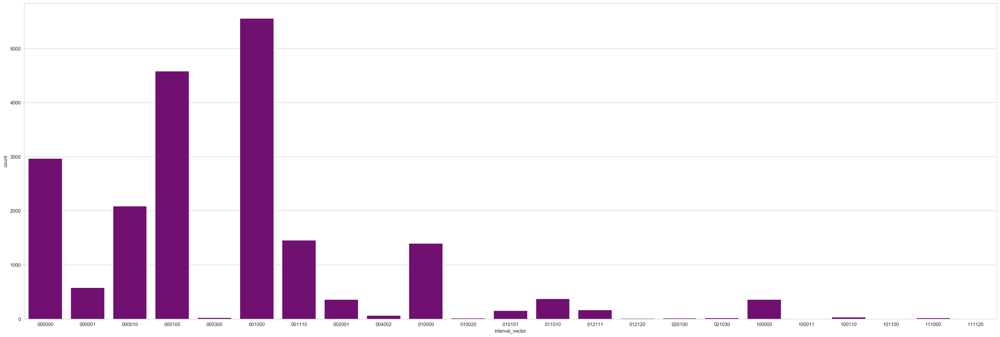

In [499]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=dfmozart_vectors['interval_vector'], y=dfmozart_vectors['count'], color = 'purple')
# sns.barplot(x=dfbach_vectors['interval_vector'], y=dfbach_vectors['count'], color = 'purple', alpha = 0.5)

In [502]:
mozart_forte_count = Counter(mozart_forte_class)
mozart_forte_count

Counter({'3-11B': 1113,
         '2-5': 2085,
         '2-4': 4582,
         '2-3': 5557,
         '1-1': 2966,
         '3-10': 361,
         '3-11A': 342,
         '3-8A': 149,
         '2-6': 581,
         '2-2': 1399,
         '3-7B': 313,
         '3-2A': 15,
         '3-7A': 62,
         '4-27B': 163,
         '4-28': 67,
         '3-8B': 6,
         '2-1': 359,
         '3-12': 25,
         '3-4B': 17,
         '3-6': 14,
         '3-2B': 5,
         '3-9': 15,
         '4-26': 10,
         '4-27A': 7,
         '3-4A': 15,
         '3-3B': 8,
         '4-23': 20,
         '3-5B': 2,
         '4-14A': 4})

In [503]:
df_mfc = pd.DataFrame(list(mozart_forte_count.items()), columns=['Forte_Class', 'Count'])
df_mfc

,Forte_Class,Count
0,3-11B,1113
1,2-5,2085
2,2-4,4582
3,2-3,5557
4,1-1,2966
5,3-10,361
6,3-11A,342
7,3-8A,149
8,2-6,581
9,2-2,1399


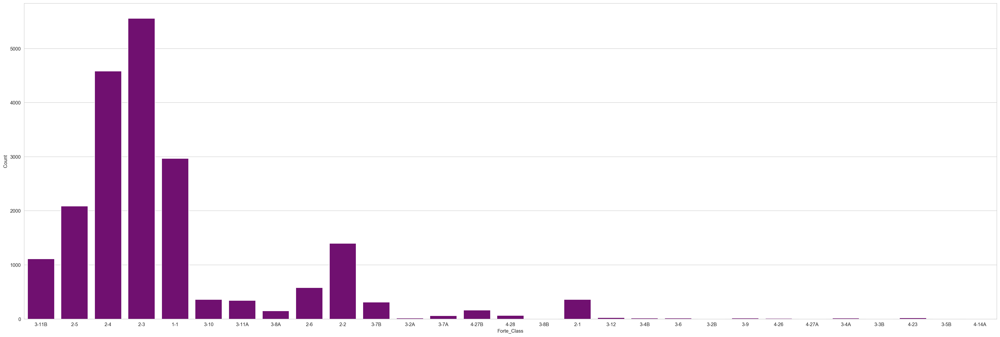

In [504]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=df_mfc['Forte_Class'], y=df_mfc['Count'], color = 'purple')

## Trying to compare Mozart and Bach's interval vectors on a single graph

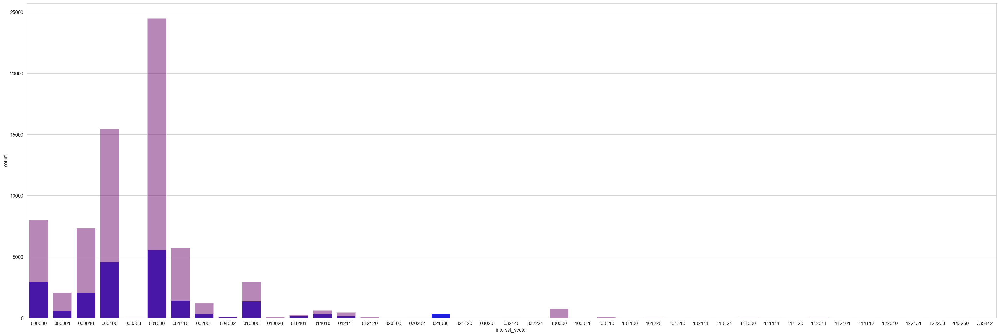

In [507]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=dfmozart_vectors['interval_vector'], y=dfmozart_vectors['count'], color = 'blue')
sns.barplot(x=dfbach_vectors['interval_vector'], y=dfbach_vectors['count'], color = 'purple', alpha = 0.5)

## Beethoven

In [549]:
beethoven_midi = '/Volumes/S190813/Music_Box/LTSM_Generative_Music/Beethoven/midi_files/elise.mid'

In [509]:
fs=100
midi_pretty_format = pretty_midi.PrettyMIDI(beethoven_midi)
piano_midi = midi_pretty_format.instruments[0] # Get the piano channels
piano_roll = piano_midi.get_piano_roll(fs=fs)

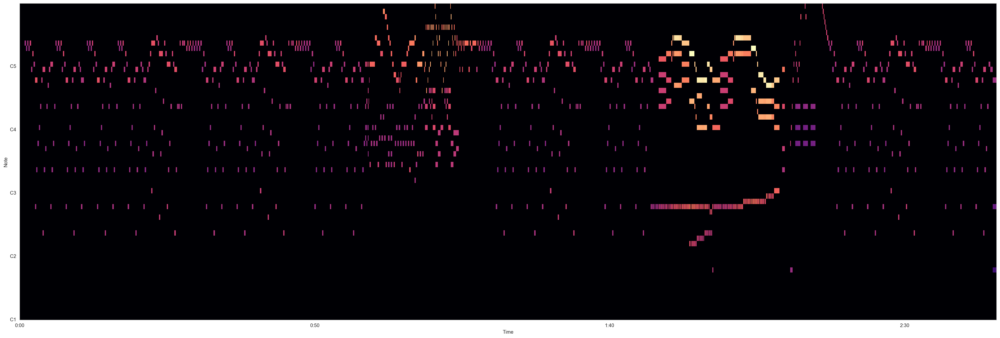

In [510]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(36, 12))
plot_piano_roll(midi_pretty_format, 24, 84)

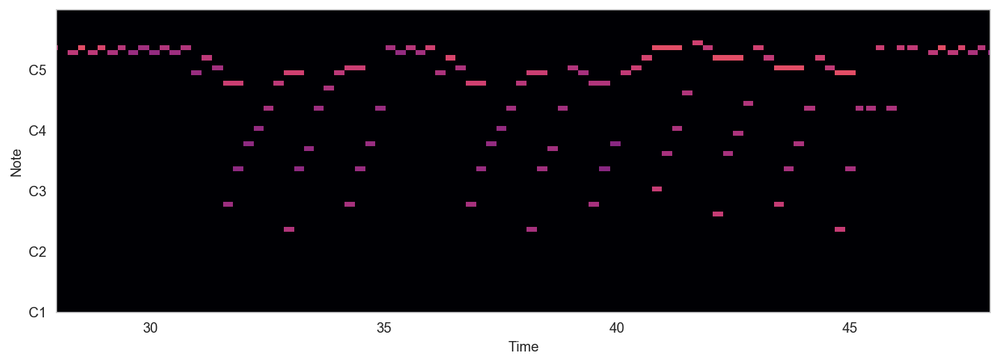

In [511]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(28,48);

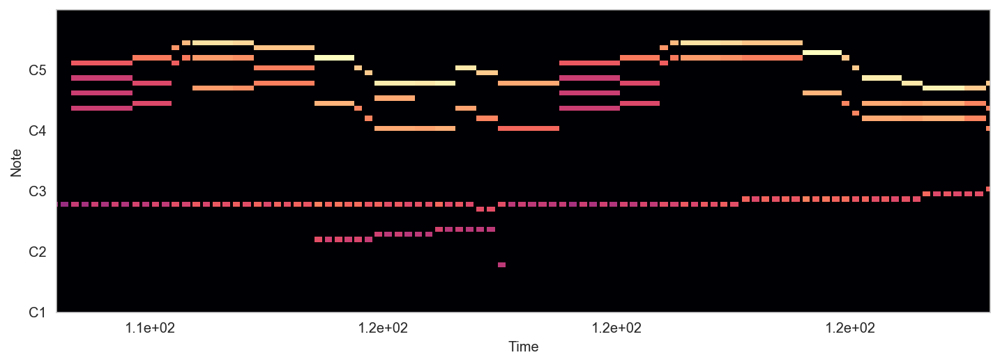

In [514]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(108,128);

In [515]:
beethoven = converter.parse(beethoven_midi)

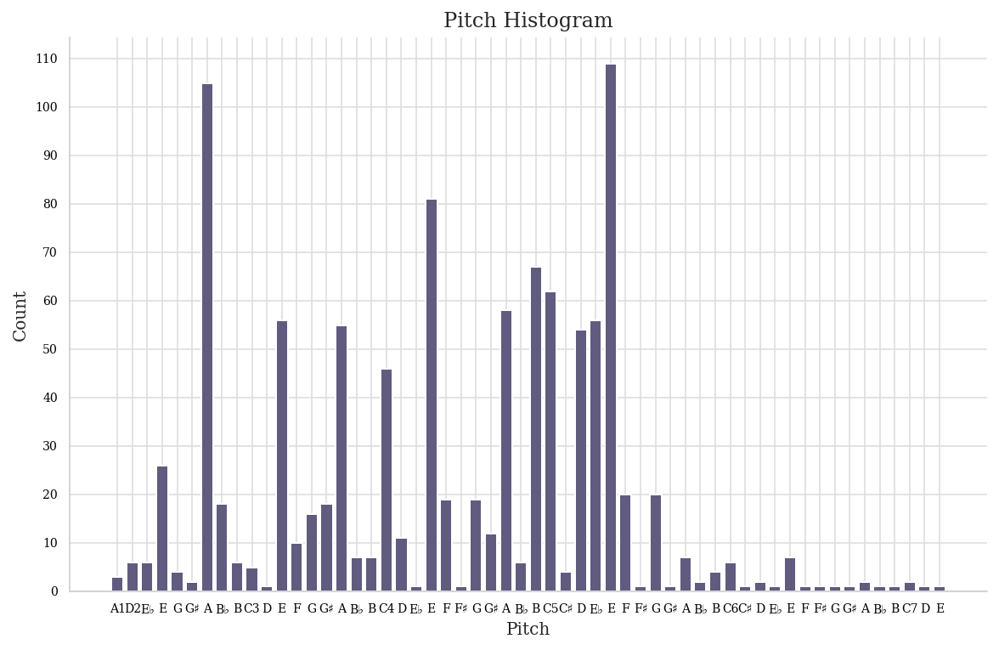

In [516]:
beethoven.plot('histogram', 'pitch')

In [517]:
beethoven.analyze('key')

<music21.key.Key of a minor>

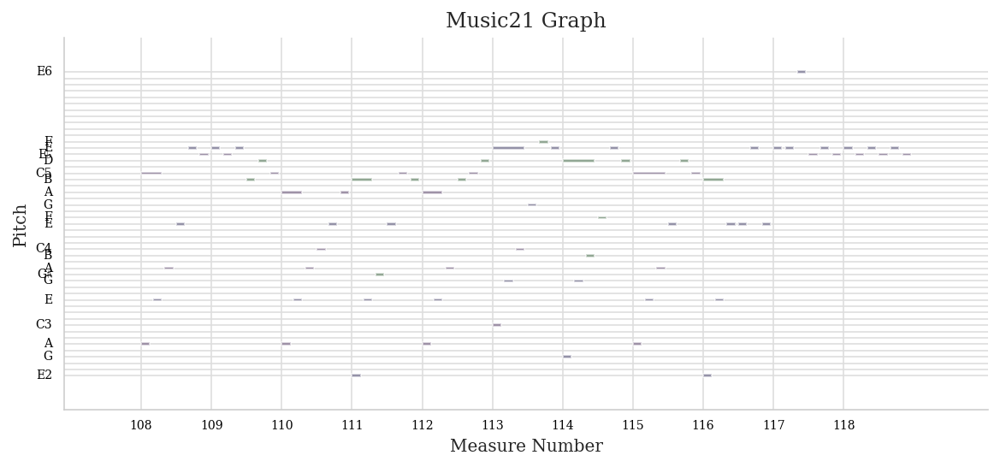

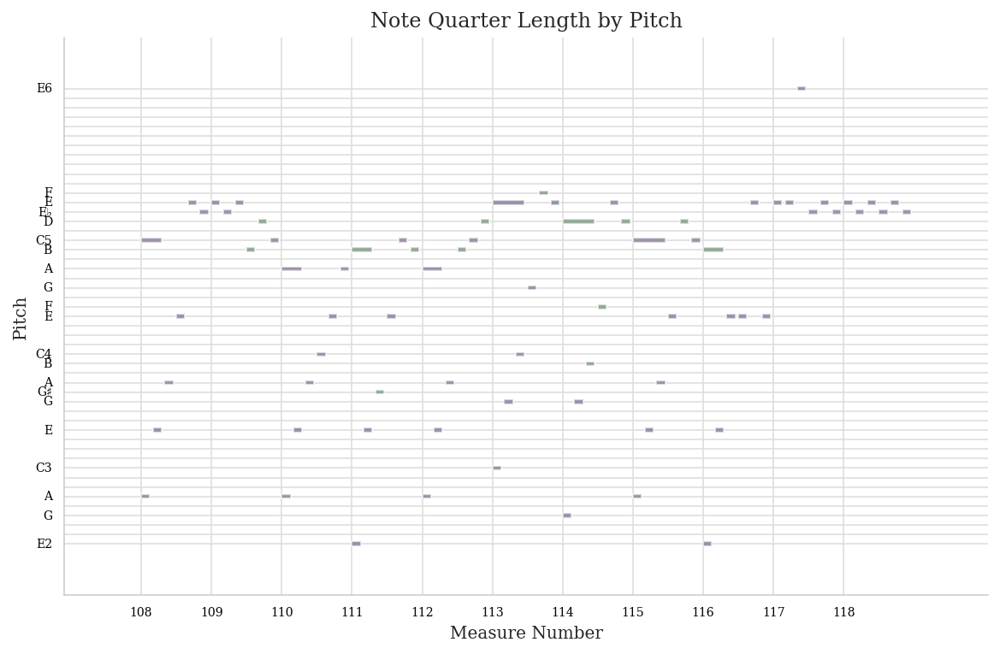

In [519]:
beethoven.measures(108,118).plot('horizontalbar', 'pitch')

In [520]:
be_note_name = []
be_notes = []
be_n_durations = []
be_n_offsets = []

be_chord_spelling = []
be_chords = []
be_c_durations = []
be_c_offsets = []

be_keys = []
    
for i,file in enumerate(glob.glob('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Beethoven/midi_files/*.mid')):
    print(file)
    midi = converter.parse(file)
    key = midi.analyze('key')
    be_keys.append(key)
    print(key)
    notes_to_parse = midi.flat.notes
    for element in notes_to_parse:
        if isinstance(element, note.Note): # If it is single note
            be_note_name.append(element.pitch)
            be_notes.append(note_to_int(str(element.pitch))) # Append note's integer value to "notes" list.
            be_duration = str(element.duration)[27:-1] 
            be_n_durations.append(check_float(be_duration)) 
            be_n_offsets.append(element.offset)
            

        elif isinstance(element, chord.Chord): # If it is chord
            be_chord_spelling.append(element.pitchNames)
            be_chords.append('.'.join(str(note_to_int(str(n)))
                                  for n in element.pitches))
            be_duration = str(element.duration)[27:-1]
            be_c_durations.append(check_float(be_duration))
            be_c_offsets.append(element.offset)
            print(element)

/Volumes/S190813/Music_Box/LTSM_Generative_Music/Beethoven/midi_files/appass_1.mid
f minor
<music21.chord.Chord G3 C4 E3>
<music21.chord.Chord F3 B3 G#3>
<music21.chord.Chord G3 E3 C4>
<music21.chord.Chord F3 C#4 G#3>
<music21.chord.Chord A3 C4 F#3>
<music21.chord.Chord F3 G#3 C#4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G#4 B4 F4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord G4 C#5 B-4>
<music21.chord.Chord B-4 C#5 G#4>
<music21.chord.Chord G4 B-4 C#5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord G5 E5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord G5 B-5>
<music21.chord.Chord B-5 G5>
<music21.chord.Chord B-5 G5>
<music21.chord.Chord G5 B-5>
<music21.chord.Chord F2 F1 G#3 C#4 C#3>
<music21.chord.Chord E2 E3 C3 C4 G3>
<music21.chord.Chord C4 F4 G#3 F3>
<music21.chord.Chord G#1 F1 F2 C2>
<music21.chord.Chord C4 G#3 F4 G#4>
<music21.chord.Chord G#1 C2 F2 F1>
<music21.chord.Chord C4 C5 F4 G#4>
<music21.chord.Chord G#1 C2 F2 F1>
<music21.chord.Chord C5 F5 F4 G#4>
<music

<music21.chord.Chord C2 C3 G2 E2>
<music21.chord.Chord C6 E5 C5 G5>
<music21.chord.Chord F1 F2>
<music21.chord.Chord C5 G#4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Beethoven/midi_files/appass_1_format0.mid
f minor
<music21.chord.Chord C4 C2>
<music21.chord.Chord G#3 G#1>
<music21.chord.Chord F3 F1>
<music21.chord.Chord G#3 G#1>
<music21.chord.Chord C4 C2>
<music21.chord.Chord F4 F2>
<music21.chord.Chord G#4 G#2>
<music21.chord.Chord C5 C3>
<music21.chord.Chord F5 F3>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord G3 C4 E3>
<music21.chord.Chord F3 B3 G#3>
<music21.chord.Chord C5 G3 E3 C4>
<music21.chord.Chord C#4 C#2>
<music21.chord.Chord B-3 B-1>
<music21.chord.Chord F#3 F#1>
<music21.chord.Chord B-3 B-1>
<music21.chord.Chord C#4 C#2>
<music21.chord.Chord F#4 F#2>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord C#5 C#3>
<music21.chord.Chord F#5 F#3>
<music21.chord.Chord F#4 B-3>
<music21.chord.Chord F3 C#4 G#3>
<music21.chord.Chord A3 C4 F#3>
<music21.chord.Chord C#5 F3

<music21.chord.Chord E5 C5 G4>
<music21.chord.Chord G4 E5 C5>
<music21.chord.Chord G4 E5 C5>
<music21.chord.Chord G4 C5 E5>
<music21.chord.Chord G6 G5>
<music21.chord.Chord C5 G4 E5>
<music21.chord.Chord E5 G4 C5>
<music21.chord.Chord F5 F6>
<music21.chord.Chord E6 E5>
<music21.chord.Chord G4 E4 C#4>
<music21.chord.Chord G5 G6>
<music21.chord.Chord C#4 G4 E4>
<music21.chord.Chord C#4 G4 E4>
<music21.chord.Chord E4 G4 C#4>
<music21.chord.Chord G5 G6>
<music21.chord.Chord C#4 G4 E4>
<music21.chord.Chord C#4 E4 G4>
<music21.chord.Chord E5 E6>
<music21.chord.Chord F6 F5>
<music21.chord.Chord C4 F4 G#4>
<music21.chord.Chord G#6 G#5>
<music21.chord.Chord F4 G#4 C4>
<music21.chord.Chord F4 G#4 C4>
<music21.chord.Chord F4 G#4 C4>
<music21.chord.Chord G#6 G#5>
<music21.chord.Chord C4 G#4 F4>
<music21.chord.Chord C4 F4 G#4>
<music21.chord.Chord F6 F5>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C3 C2>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord E3 E2>
<music21.chord.Chord F3 F2>
<m

C# major
<music21.chord.Chord C#3 F3 G#3 C#2>
<music21.chord.Chord C#3 B-3 F#3 F#1>
<music21.chord.Chord C#3 F3 G#3 C#2>
<music21.chord.Chord B-3 E-3 C#3 F#1>
<music21.chord.Chord C#3 E-3 G#3 G#1>
<music21.chord.Chord G#3 C3 E-3>
<music21.chord.Chord C#3 F3 G#3>
<music21.chord.Chord C#4 G#3 F3 C#2 C#3>
<music21.chord.Chord F#3 B-3 C#4 F#2 F#1>
<music21.chord.Chord G#3 F3 C#4 C#2 C#3>
<music21.chord.Chord E3 C#4 G3 A1 A2>
<music21.chord.Chord F#3 E-3 C#4 G#1 G#2>
<music21.chord.Chord E-3 C4 F#3>
<music21.chord.Chord C#3 F3 C#4>
<music21.chord.Chord C#3 F3 G#3 C#2>
<music21.chord.Chord C#3 F#3 B-3 F#1>
<music21.chord.Chord C#3 F3 G#3 C#2>
<music21.chord.Chord C#3 E-3 B-3 F#1>
<music21.chord.Chord C#3 E-3 G#3 G#1>
<music21.chord.Chord C3 E-3 G#3>
<music21.chord.Chord C#3 F3 G#3>
<music21.chord.Chord F3 G#3 C#4 C#2 C#3>
<music21.chord.Chord F#3 B-3 C#4 F#1 F#2>
<music21.chord.Chord F3 G#3 C#4 C#2 C#3>
<music21.chord.Chord E3 G3 C#4 A1 A2>
<music21.chord.Chord E-3 F#3 C#4 G#1 G#2>
<music21.

f minor
<music21.chord.Chord E4 C#5>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord F2 F1>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord F2 F1>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord F4 G#4>
<music21

<music21.chord.Chord G2 E2 C2 B-2 C3>
<music21.chord.Chord G2 B-2 C2 E2 C3>
<music21.chord.Chord C2 C3 G#2 F2>
<music21.chord.Chord C4 C3 F3 G#3>
<music21.chord.Chord G3 E3 B-3 C3 C4>
<music21.chord.Chord G3 C3 E3 B-3 C4>
<music21.chord.Chord G3 E3 C3 B-3 C4>
<music21.chord.Chord G3 B-3 C3 E3 C4>
<music21.chord.Chord C3 C4 G#3 F3>
<music21.chord.Chord C3 C2 F2 G#2>
<music21.chord.Chord G2 E2 B-2 C2 C3>
<music21.chord.Chord G2 C2 E2 B-2 C3>
<music21.chord.Chord G2 E2 C2 B-2 C3>
<music21.chord.Chord G2 B-2 C2 E2 C3>
<music21.chord.Chord G2 E2 B-2 C2 C3>
<music21.chord.Chord G2 C2 E2 B-2 C3>
<music21.chord.Chord G2 E2 C2 B-2 C3>
<music21.chord.Chord G2 B-2 C2 E2 C3>
<music21.chord.Chord G2 E2 B-2 C2 C3>
<music21.chord.Chord G2 C2 E2 B-2 C3>
<music21.chord.Chord G2 E2 C2 B-2 C3>
<music21.chord.Chord C3 G2 B-2 C2 E2>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord F1 G#1 C2 F2>
<music21.chord.Chord G#3 C4 G#4>
<music21.chord.Chord F1 G#1 C2 F2>
<music21.chord.Chord G3 B-3 G4>
<music21.

<music21.chord.Chord G#4 F3>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord E5 E4 C4>
<music21.chord.Chord F5 F4 G#3>
<music21.chord.Chord G4 G5 G#3>
<music21.chord.Chord G#4 G#5 F3>
<music21.chord.Chord F4 F5 G#3>
<music21.chord.Chord F4 F5>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord B-4 B-5>
<music21.chord.Chord C#5 C#6 F#3>
<music21.chord.Chord C#5 C#6 F#3>
<music21.chord.Chord C#5 C#6>
<music21.chord.Chord C6 C5>
<music21.chord.Chord E4 E5>
<music21.chord.Chord F5 F4>
<music21.chord.Chord G#4 F3 G#3>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord G#4 F3 G#3>
<music21.chord.Chord C3 F3 G#3>
<music21.chord.Chord C3 E3 G3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G4 G3 B-3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord G4 G3 B-3>
<music21.chord.Chord F3 G3 B-3>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord C5 C4 E-4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord C5 C4 E-4>
<music21.chord.Chord B-3 C4 E-4>
<music21.chord.Cho

B- major
<music21.chord.Chord D4 F3 B-3>
<music21.chord.Chord D5 F5 B-5 D6>
<music21.chord.Chord F3 D4 B-3>
<music21.chord.Chord F5 B-5 D5 D6>
<music21.chord.Chord D4 B-3 F3>
<music21.chord.Chord D5 E-6 F5 B-5>
<music21.chord.Chord D4 B-3 F3>
<music21.chord.Chord D6 D5 B-5 F5>
<music21.chord.Chord B-3 D4 F3>
<music21.chord.Chord F5 D5 B-5 D6>
<music21.chord.Chord D4 F3 B-3>
<music21.chord.Chord D5 B-4 F5 B-5>
<music21.chord.Chord F3 D3 B-3>
<music21.chord.Chord B-3 F3 D4 F4>
<music21.chord.Chord B-5 D6 F5 F6>
<music21.chord.Chord B-3 F3 D4 F4>
<music21.chord.Chord F5 B-5 D6 F6>
<music21.chord.Chord B-3 F4 D4 F3>
<music21.chord.Chord B-5 D6 G6 F5>
<music21.chord.Chord D4 B-3 F4 F3>
<music21.chord.Chord F5 B-5 F6 D6>
<music21.chord.Chord D4 B-3 F4 F3>
<music21.chord.Chord F6 F5 B-5 D6>
<music21.chord.Chord B-3 F4 F3 D4>
<music21.chord.Chord D5 F5 B-5 D6>
<music21.chord.Chord B-3 D4 F3>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord B-4 F4>
<music21.chord.Ch

<music21.chord.Chord A5 F6>
<music21.chord.Chord A6 C6>
<music21.chord.Chord G6 B-5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord E5 C6 G5 E6>
<music21.chord.Chord C3 C2>
<music21.chord.Chord B5 D6>
<music21.chord.Chord C6 E6>
<music21.chord.Chord F6 D6>
<music21.chord.Chord G6 E6>
<music21.chord.Chord C6 E6>
<music21.chord.Chord C4 E4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E6 G5 C6 E5>
<music21.chord.Chord C2 C3>
<music21.chord.Chord B5 D6>
<music21.chord.Chord E6 C6>
<music21.chord.Chord D6 F6>
<music21.chord.Chord G6 E6>
<music21.chord.Chord G6 E6 A5 G5>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord C#6 E6 G6 G5>
<music21.chord.Chord A2 A1>
<music21.chord.Chord G6 B5 D6 G5>
<music21.chord.Chord D2 D3>
<music21.chord.Chord G5 C#6 A5 G6>
<music21.chord.Chord E2 E3>
<music21.chord.Chord G6 G5 B5 D6>
<music21.chord.Chord D6 G5 B5>
<music21.chord.Chord D5 G5 B5>
<music21.chord.Chord A5

B- major
<music21.chord.Chord D4 F3 B-3>
<music21.chord.Chord D5 F5 B-5 D6 F3 D4 B-3>
<music21.chord.Chord F5 B-5 D5 D6 D4 B-3 F3>
<music21.chord.Chord D5 E-6 F5 B-5 D4 B-3 F3>
<music21.chord.Chord D6 D5 B-5 F5 B-3 D4 F3>
<music21.chord.Chord F5 D5 B-5 D6 D4 F3 B-3>
<music21.chord.Chord D5 B-4 F5 B-5 F3 D3 B-3>
<music21.chord.Chord B-3 F3 D4 F4>
<music21.chord.Chord B-5 D6 F5 F6 B-3 F3 D4 F4>
<music21.chord.Chord F5 B-5 D6 F6 B-3 F4 D4 F3>
<music21.chord.Chord B-5 D6 G6 F5 D4 B-3 F4 F3>
<music21.chord.Chord F5 B-5 F6 D6 D4 B-3 F4 F3>
<music21.chord.Chord F6 F5 B-5 D6 B-3 F4 F3 D4>
<music21.chord.Chord D5 F5 B-5 D6 B-3 D4 F3>
<music21.chord.Chord G4 E4>
<music21.chord.Chord A4 C5 F4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord G4 C4>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord B-4 D5 G3>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord B-4 C#3>
<music21.chord.Chord G4 C3>
<music21.chord.Chord A4 F2>
<music21.chord.Chord B-4 F4 B-2>
<music21.chord

<music21.chord.Chord G4 E-3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord B-4 C#3>
<music21.chord.Chord G4 C3>
<music21.chord.Chord A4 F2>
<music21.chord.Chord F4 B-4 B-2>
<music21.chord.Chord C5 G4 E-2>
<music21.chord.Chord A4 C5 F2>
<music21.chord.Chord G5 E5>
<music21.chord.Chord A5 C6 F5>
<music21.chord.Chord G#5 B4>
<music21.chord.Chord G5 C5>
<music21.chord.Chord A5 F#4>
<music21.chord.Chord B-5 D6 G4>
<music21.chord.Chord G5 E-4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord B-5 C#4>
<music21.chord.Chord G5 C4>
<music21.chord.Chord A5 F3>
<music21.chord.Chord F5 B-3>
<music21.chord.Chord F5 A5 E-3>
<music21.chord.Chord F5 B-5 D3>
<music21.chord.Chord B-5 C#3>
<music21.chord.Chord G5 C3>
<music21.chord.Chord A5 F2>
<music21.chord.Chord F5 B-2>
<music21.chord.Chord A5 F5 E-2>
<music21.chord.Chord B-5 F5 D2>
<music21.chord.Chord B-5 E6 C#2>
<music21.chord.Chord E-6 C2>
<music21.chord.Chord E-6 C6 F#1>
<music21.chord.Chord D6 B-5 G1>
<music21.chord.Chord B-5 E-6 E-2>
<music21

<music21.chord.Chord G3 B3>
<music21.chord.Chord E5 C4 E4>
<music21.chord.Chord G5 C#6>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord B-3 C#4>
<music21.chord.Chord B-3 C#4>
<music21.chord.Chord F#3 B-3>
<music21.chord.Chord D5 B3 D4>
<music21.chord.Chord F5 B5 D5>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord B3 G#3>
<music21.chord.Chord D5 B3 G#3>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord A5 G3>
<music21.chord.Chord C5 A3 F#3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord G5 B2>
<music21.chord.Chord A2 D3 C4>
<music21.chord.Chord B3 B2 D3>
<music21.chord.Chord A2 C4 D3>
<music21.chord.Chord B2 B3 D3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord B4 G5>
<music21.chord.Chord B5 D5>
<music21.chord.Chord C5 A5>
<music21.chord.Chord E3 E2>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord D3 D2>
<music21.chord.Chord D4 C5 A3>
<music21.chord.Chord B4 B3 D4>
<music21.chord.Chord A2 D3 C4>
<music21.chord.Chord G5 D3 B2 B3>
<music21.chord.Chord G5 B3>
<music21.chord.Chor

<music21.chord.Chord D6 F3>
<music21.chord.Chord E-6 E-3>
<music21.chord.Chord D6 B-3>
<music21.chord.Chord E-6 F3>
<music21.chord.Chord F6 E-3>
<music21.chord.Chord F5 F6 D3>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord G3 E-3>
<music21.chord.Chord C5 A4 F3 F4>
<music21.chord.Chord D5 B-4 D4 B-3>
<music21.chord.Chord G6 B-5 G5 E4 C#4 B-3 G4>
<music21.chord.Chord A5 F6 F5 F4 A4 C4>
<music21.chord.Chord E6 G5 E5 C4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G5 G6 B-5 C5 F4>
<music21.chord.Chord A5 F5 F6 F4>
<music21.chord.Chord A5 F6 F4 F5>
<music21.chord.Chord B-4 F5 G4>
<music21.chord.Chord E-5 C5 A4>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord B-5 F4 D4>
<music21.chord.Chord G5 E-4 G4>
<music21.chord.Chord E-5 E-6 C5>
<music21.chord.Chord G5 C6 E-5>
<music21.chord.Chord A5 F5>
<music21.chord.Chord F6 A4 C5>
<music21.chord.Chord D6 B-4 D5>
<music21.chord.Chord B-5 G4>
<music21.chord.Chord A5 F#4>
<music21.chord.Chord B-5 G4>
<music21.chord.Chord G5 G6 E-5 B-4 G4>
<

B- major
<music21.chord.Chord D4 B-3>
<music21.chord.Chord A4 F5>
<music21.chord.Chord F3 C4>
<music21.chord.Chord C5 F5>
<music21.chord.Chord C4 A3>
<music21.chord.Chord F4 D5>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord F#4 D5>
<music21.chord.Chord D3 A3>
<music21.chord.Chord A4 D5>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord G3 E-3>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord B-2 F3>
<music21.chord.Chord F4 B-4>
<music21.chord.Chord F3 D3>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord G3 E-3>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord G3 E-3>
<music21.chord.Chord E-4 A4>
<music21.chord.Chord C3 F3>
<music21.chord.Chord E-4 A4>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord F4 C5>
<music21.chord.Chord B-4 F4 D5>
<music21.chord.Chord G#2 F3>
<music21.chord.Chord G2 E-3>
<music21.chord.Chord B-4 E-5>
<music21.chord.Chord E-3 G2>
<music21.chord.Chord C#5 B-4 F4 F5>
<mu

B- major
<music21.chord.Chord D5 D4 B-3>
<music21.chord.Chord A4 F5 F3 C4>
<music21.chord.Chord C5 F5 C4 A3>
<music21.chord.Chord F4 D5 D4 B-3>
<music21.chord.Chord B-4 B-3 G3>
<music21.chord.Chord F#4 D5 D3 A3>
<music21.chord.Chord A4 D5 A3 F#3>
<music21.chord.Chord D4 B-4 B-3 G3>
<music21.chord.Chord G4 G3 E-3>
<music21.chord.Chord D4 B-4 B-2 F3>
<music21.chord.Chord F4 B-4 F3 D3>
<music21.chord.Chord B-3 G4 G3 E-3>
<music21.chord.Chord B-3 G4 G3 E-3>
<music21.chord.Chord E-4 A4 C3 F3>
<music21.chord.Chord E-4 A4 C3>
<music21.chord.Chord B-3 B-4 D3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord B-4 D3>
<music21.chord.Chord C5 A2>
<music21.chord.Chord F4 C5 A2>
<music21.chord.Chord B-4 F4 D5 G#2>
<music21.chord.Chord D5 G#2 F3>
<music21.chord.Chord E-5 G2 E-3>
<music21.chord.Chord B-4 E-5 E-3 G2>
<music21.chord.Chord C#5 B-4 F4 F5 C#3 F2>
<music21.chord.Chord G4 B-4 C5 G5 E2 C3>
<music21.chord.Chord C4 A4 C5 F2 F3>
<music21.chord.Chord D6 D5 B-4>
<music21.chord.Chord A5 F6 F4 C5>
<

f# minor
<music21.chord.Chord A1 A2>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord F#4 C#4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord F#2 C#3 F#3>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord F#2 C#3 F#3>
<music21.chord.Chord C#4 F#4>
<music21.chord.Chord A2 C#3 A3>
<music21.chord.Chord B3 F4 G#4 C#4>
<music21.chord.Chord G#2 C#3 G#3>
<music21.chord.Chord A3 F#4 A4 C#4>
<music21.chord.Chord F#2 C#3 F#3>
<music21.chord.Chord B3 B4 F#4>
<music21.chord.Chord D2 D3>
<music21.chord.Chord F#4 D4 D5>
<music21.chord.Chord B1 B2>
<music21.chord.Chord D4 D5 F#4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord F#4 C#5 C#4>
<music21.chord.Chord A1 A2>
<music21.chord.Chord F#4 C#5 C#4>
<music21.chord.Chord A1 A2>
<music21.chord.Chord F4 B4 C#5 F5>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord C#5 A4 F#4 F#5>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord G#5 C#5 G#4>
<music21.chord.Chord F1 F2>
<music21.chord.Chord D5 B4 G#4>
<music21.chord.Chord B3 G#3 F3 D4>
<music21.c

<music21.chord.Chord F#5 F#6>
<music21.chord.Chord G3 B3 D4>
<music21.chord.Chord D3 G3 B3 D4>
<music21.chord.Chord D3 A3 F#3 D4>
<music21.chord.Chord F#5 F#6>
<music21.chord.Chord F#3 D3 A3 D4>
<music21.chord.Chord F#3 C#3 A3 C#4>
<music21.chord.Chord F#3 C#3 A3 C#4>
<music21.chord.Chord F3 C#3 G#3 C#4>
<music21.chord.Chord C#3 F3 G#3 C#4>
<music21.chord.Chord C#3 F3 G#3 C#4>
<music21.chord.Chord F3 C#3 G#3 C#4>
<music21.chord.Chord F3 C#3 G#3 C#4>
<music21.chord.Chord F#3 A3 C#4>
<music21.chord.Chord F#3 A3 C#4>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord C#3 A2 A3>
<music21.chord.Chord F5 G#5 B4>
<music21.chord.Chord G#2 C#3 G#3>
<music21.chord.Chord F#5 A5 C#5>
<music21.chord.Chord F#2 C#3 F#3>
<music21.chord.Chord G#5 B5 B4>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord G#4 B4 D4>
<music21.chord.Chord F1 F2>
<music21.chord.Chord C#4 F#4 A4>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord B3 D4 A4 F4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord D4 B3 G#4 F4>
<m

<music21.chord.Chord F#1 F#2>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord B1 B2>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord D4 G#4 F4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord D4 F4 G#4>
<music21.chord.Chord D2 D3>
<music21.chord.Chord D4 F4 G#4>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord D4 F4 G#4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord D4 F4 G#4>
<music21.chord.Chord C#4 F#4>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord B1 B2>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord B1 B2>
<music21.chord.Chord B4 D5 F5 G#5 B5>
<music21.chord.Chord D2 D3>
<music21.chord.Chord B4 D5 F5 G#5 B5>
<music21.chord.Chord B-4 C#5 F#5 B-5>
<music21.chord.Chord B-4 C#5 F#5 B-5>
<music21.chord.Chord F#6 B-5 F#5>
<music21.chord.Chord F#5 B-5 F#6>
<music21.chord.Chord B-6 C#6 B-5>
<music21.chord.Chord F4 G#4 C#

<music21.chord.Chord G2 B3>
<music21.chord.Chord F#2 E-4>
<music21.chord.Chord G2 D4>
<music21.chord.Chord G6 G5>
<music21.chord.Chord G5 G6>
<music21.chord.Chord G6 G5 B3>
<music21.chord.Chord F#5 F#6 E-4>
<music21.chord.Chord G5 G6 D4>
<music21.chord.Chord D6 D5>
<music21.chord.Chord D5 D6>
<music21.chord.Chord D5 D6>
<music21.chord.Chord D6 D5>
<music21.chord.Chord D5 D6>
<music21.chord.Chord D5 D6>
<music21.chord.Chord C#5 C#6 F4>
<music21.chord.Chord D5 D6 D4>
<music21.chord.Chord F#5 D6 D5>
<music21.chord.Chord F#5 D5 D6>
<music21.chord.Chord F#5 F#6>
<music21.chord.Chord F5 F6 F4>
<music21.chord.Chord F#5 F#6 F#4>
<music21.chord.Chord F#5 F#6>
<music21.chord.Chord F#5 F#6>
<music21.chord.Chord F#5 F#6>
<music21.chord.Chord F#6 F#5>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord E-3 F#3>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord E-3 F#3>
<music21.chord.Chord E-3 F#3>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord E-3 F#3>
<music21.ch

<music21.chord.Chord E-4 F#4>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord G5 B-5>
<music21.chord.Chord F5 G#5>
<music21.chord.Chord B-4 G5>
<music21.chord.Chord G#4 F5>
<music21.chord.Chord G#6 F6>
<music21.chord.Chord E-6 G6>
<music21.chord.Chord G6 E-6>
<music21.chord.Chord C6 E-6>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord F6 D6>
<music21.chord.Chord C5 E-5 A5>
<music21.chord.Chord F3 F2>
<music21.chord.Chord B-4 D5 B-5>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord A2 F#2 E-3>
<music21.chord.Chord F2 G#2 D3>
<music21.chord.Chord F#3 E-4>
<music21.chord.Chord C4 E-3>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord A2 E-3 F#3>
<music21.chord.Chord B-2 D3 F3>
<music21.chord.Chord F#3 A3 E-4>
<music21.chord

<music21.chord.Chord C#5 B-3>
<music21.chord.Chord F#5 D4>
<music21.chord.Chord E5 C#4>
<music21.chord.Chord D5 B3 D4>
<music21.chord.Chord A5 A3 C#4>
<music21.chord.Chord G5 C#4 E4>
<music21.chord.Chord F#5 D4 F#4>
<music21.chord.Chord B4 E-5 F#3>
<music21.chord.Chord A4 F#5 E-3>
<music21.chord.Chord G4 B4 E3>
<music21.chord.Chord F#4 A4 E4>
<music21.chord.Chord G#4 B4 D4>
<music21.chord.Chord A4 C#5 C#4>
<music21.chord.Chord B4 D5 A2>
<music21.chord.Chord C#5 G2>
<music21.chord.Chord A4 F#2>
<music21.chord.Chord F4 D5 G#2>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord D4 B4>
<music21.chord.Chord C#4 A4 A3>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord E4 B4>
<music21.chord.Chord G4 C#5>
<music21.chord.Chord F#4 D5 D3>
<music21.chord.Chord G4 C3>
<music21.chord.Chord A3 F3>
<music21.chord.Chord D5 B-3 B-2>
<music21.chord.Chord C#5 B-2 E3>
<music21.chord.Chord F3 A2>
<music21.chord.Chord F5 C3>
<music21.chord.Chord E-5 F2>
<music21.chord.Chord D5 B-2>
<music21.chord.Chord G4 B4

E- major
<music21.chord.Chord G4 E-4>
<music21.chord.Chord F4 B-3>
<music21.chord.Chord G3 E-4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C3 E-3>
<music21.chord.Chord B-2 E3>
<music21.chord.Chord B-2 E3>
<music21.chord.Chord A2 F3>
<music21.chord.Chord F#3 G#2>
<music21.chord.Chord D5 C5>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord B4 D4 G4>
<music21.chord.Chord F#5 E-5>
<music21.chord.Chord D5 G5 B5>
<music21.chord.Chord B-5 D5 G5>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord B-3 E4 G4 C#4>
<music21.chord.Chord D4 F4 G#3>
<music21.chord.Chord B-2 B-1>
<music21.chord.Chord F#3 E-4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord B2 F#3>
<music21.chord.Chord B4 E4>
<music21.chord.Chord F#3 C#3>
<music21.chord.Chord F#3 C#3>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord B2 F#3>
<music21.chord.Chord F5 E-5>
<music21.chord.Chord D5 B-4>
<music21.chord.

E- major
<music21.chord.Chord G4 E-4>
<music21.chord.Chord F4 B-3>
<music21.chord.Chord G3 E-4 C2 C3>
<music21.chord.Chord C3 E-3>
<music21.chord.Chord G4 B-2 E3>
<music21.chord.Chord B-2 E3>
<music21.chord.Chord C5 A2 F3>
<music21.chord.Chord F#3 G#2>
<music21.chord.Chord D5 C5>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord F#4 E-4 A3>
<music21.chord.Chord B4 D4 G4 B3>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord F#5 E-5 A4>
<music21.chord.Chord D5 G5 B5 B4>
<music21.chord.Chord B-5 D5 G5 B-4 G4>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord D5 G#4 F4>
<music21.chord.Chord E-5 E-4 G4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord B-3 E4 G4 C#4>
<music21.chord.Chord D4 F4 G#3 B-2 B-1>
<music21.chord.Chord F#3 E-4 B1 B2>
<music21.chord.Chord E-4 B2 F#3>
<music21.chord.Chord B4 E4 F#3 C#3>
<music21.chord.Chord E4 F#3 C#3>
<music21.chord.Chord E-5 E-4 B2 F#3>
<music21.chord.Chord F5 E-5>
<music21.chord.Chord C5 F3>
<music21.chord.Chord D5 B-4 

c minor
<music21.chord.Chord C3 E-4>
<music21.chord.Chord C3 E-4>
<music21.chord.Chord B2 G3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord F3 G#4>
<music21.chord.Chord F3 G#4>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord C3 C4>
<music21.chord.Chord C3 C4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord B-3 C#4 E-4>
<music21.chord.Chord E-4 C4 G#3>
<music21.chord.Chord G3 B-3 E-4>
<music21.chord.Chord G3 B-3 E4>
<music21.chord.Chord F3 G#3 C#4>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord F3 G#3 C4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord B-2 D3 B-3>
<music21.chord.Chord C4 D4>
<music21.chord.Chord A2 D3 A3>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord G2 D3 G3>
<music21.chord.Chord A3 D4>
<music21.chord.Chord F#2 D3 F#3>
<music21.chord.Chord F#3 A3>
<music

E- major
<music21.chord.Chord F6 D6 G#5 G#6>
<music21.chord.Chord F4 G#4 D4 B-3>
<music21.chord.Chord G#5 D5 F5 G#4>
<music21.chord.Chord B-3 D3 B-2 F3>
<music21.chord.Chord G#4 B-4>
<music21.chord.Chord B-4 G#4>
<music21.chord.Chord G#4 B-4>
<music21.chord.Chord B-4 G#4>
<music21.chord.Chord E-4 G4 B-4>
<music21.chord.Chord F4 G#4 B-3 B-4>
<music21.chord.Chord E-4 B-4 G4>
<music21.chord.Chord E4 G4 B-4 C5>
<music21.chord.Chord G#4 F4 C5>
<music21.chord.Chord C5 B-4 C4 G4>
<music21.chord.Chord F4 G#4 C5>
<music21.chord.Chord F4 D4 G#4 B-4>
<music21.chord.Chord G4 B-4 E-4>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord E-4 B-3 G4>
<music21.chord.Chord B-3 F4 D4>
<music21.chord.Chord F5 G#4>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord C4 F3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord B-3 E-3>
<music21.chord.Chord G#2 C3>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord E2 C3>
<music21.chord.Chord C3 F2>
<music21.chord.Chord D2 B-2>
<music2

<music21.chord.Chord F3 A3 E-4>
<music21.chord.Chord F3 A3 E-4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord C6 B-5>
<music21.chord.Chord B-5 C6>
<music21.chord.Chord B-5 C6>
<music21.chord.Chord C6 B-5>
<music21.chord.Chord C6 B-5>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord D6 B-5>
<music21.chord.Chord F6 B-5 D6>
<music21.chord.Chord E-6 A5 F6>
<music21.chord.Chord F6 A5 E-6>
<music21.chord.Chord E-6 F6 A5>
<music21.chord.Chord F6 A5 E-6>
<music21.chord.Chord E-6 F6 A5>
<music21.chord.Chord F6 A5 E-6>
<music21.chord.Chord G#5 G#6>
<music21.chord.Chord G5 G6>
<music21.chord.Chord F#5 F#6>
<music21.chord.Chord F5 F6>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G4 G5>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord F4 F5>
<music21.chord.Ch

E- major
<music21.chord.Chord F6 D6 G#5 G#6 F4 G#4 D4 B-3>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord A3 D3>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord D4 D3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord F4 D3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord B-4 G#3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord F5 G#4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord B-5 G#4>
<music21.chord.Chor

c minor
<music21.chord.Chord E-4 G4 C5>
<music21.chord.Chord C4 G3 E-3 C3>
<music21.chord.Chord G4 C5>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G4 B4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord G#4 F4 B4>
<music21.chord.Chord F3 B3 G#3 D4 D3>
<music21.chord.Chord B4 D5>
<music21.chord.Chord D4 G#4 F4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord G#4 F4 D4>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord C4 G3 E-3>
<music21.chord.Chord F3 G#3 B3>
<music21.chord.Chord C4 G3 E-3>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord F5 F4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord G3 C4 E-3>
<music21.chord.Chord B3 F3 G#3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord G3 E-3>
<music21.chord.Chord D3 F3>
<music21.chord.Chord B3 B4>
<musi

c minor
<music21.chord.Chord E-4 G4 C5 C4 G3 E-3 C3>
<music21.chord.Chord G4 C5 C4 E-4>
<music21.chord.Chord G4 C5 E-4 C4>
<music21.chord.Chord G4 D4 F4 B4>
<music21.chord.Chord G#4 F4 B4 F3 B3 G#3 D4 D3>
<music21.chord.Chord B4 D5 D4 G#4 F4>
<music21.chord.Chord B4 D5 G#4 F4 D4>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord E-5 C4 G3 E-3>
<music21.chord.Chord D5 F3 G#3 B3>
<music21.chord.Chord C4 G3 E-3>
<music21.chord.Chord C5 E-5 E-4 G4>
<music21.chord.Chord B4 D5 G#4 F4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord F5 F4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord G3 C4 E-3>
<music21.chord.Chord B3 F3 G#3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord G3 E-3>
<music21.chord.Chord D3 F3>
<music21.chord.Chord B3 B4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord E-3 C3>
<music21.chord.Chord D3 B2>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G#3 F3 D3 B2>
<music21.chord.Chord E-4 G3 E-3 C3>
<music21.ch

<music21.chord.Chord C4 C3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord B3 B2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord E3 E2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord F3 F2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 C4 E-4>
<music21.chord.Chord C4 G#3 E-4>
<music21.chord.Chord E-4 G3 C4>
<music21.chord.Chord E-4 C4 F#3>
<music21.chord.Chord G3 E-4 C4>
<music21.chord.Chord G2 G1>
<music21.chord.Chord G3 B3 F3 D3>
<music21.chord.Chord G3 C4 E-3 C2>
<music21.chord.Chord G4 D4 F4 B3 E-2>
<music21.chord.Chord B3 D4 F4 G4 D2>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord G#4 C2>
<music21.chord.Chord G4 E-2>
<music21.chord.Chord D4 F4 B4 D2>
<music21.chord.Chord D4 F4 B4 G2>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord D5 C2>
<music21.chord.Chord B3 D4 F4 G4 E-2>
<music21.chord.Chord

A- major
<music21.chord.Chord C4 G#2 E-3 G#3>
<music21.chord.Chord C#4 G2 E-3 G3>
<music21.chord.Chord C4 G#4 G#2 E-3 G#3>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord G4 B-4 E-3 E-4>
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord G#4 E-4 C3 C4 G#3>
<music21.chord.Chord F4 G#4 C#3 G#3 C#4>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord C#4 F4>
<music21.chord.Chord G#4 C#5>
<music21.chord.Chord B-4 C#5 G3 E-4>
<music21.chord.Chord G#4 C5 E-4 G#3>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 E-3 G3>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord C4 G#2>
<music21.chord.Chord C#4 G2>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord C4 G#4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord A4 E-5 C4>
<music21.chord.Chord B-4 C#5 C#4>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord G4 E-3>
<music21.chord.Chord B-4 G3>


c minor
<music21.chord.Chord G#3 C4 F#4>
<music21.chord.Chord G4 D4 G3>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E4 G4 B-4>
<music21.chord.Chord E4 G4 B-4>
<music21.chord.Chord E4 G4 B-4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4 B4>
<music21.chord.Chord F4 G#4 B4>
<music21.chord.Chord F4 G#4 B4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E4 G4 B-4>
<music21.chord.Chord E4 G4 B-4>
<music21.chord.Chord E4 G4 B-4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4 B4>
<music21.chord.Chord F4 G#4 B4>
<music21.chord.Chord F4 G#4 B4>
<music21.chord.Chord C4 E-4 G4 C5>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G1 G2>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G1 G2>
<music21.chord.Chord C2 C3>
<music21.chord.Chord 

c minor
<music21.chord.Chord C4 C3>
<music21.chord.Chord B3 B2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord B3 B2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord G#3 C4 F#4>
<music21.chord.Chord B4 G4 D4 G3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord B3 B2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord D4 D3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord D4 D3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord F5 F4>
<music21.chor

B- major
<music21.chord.Chord D4 F4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord D4 F4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord B-5 C6>
<music21.chord.Chord D6 E-6>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord F4 B4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Cho

B- major
<music21.chord.Chord D4 F4 B-1 B-2>
<music21.chord.Chord B-3 D4 B-1 B-2>
<music21.chord.Chord D4 F4 B-1 B-2>
<music21.chord.Chord B-3 D4 B-1 B-2>
<music21.chord.Chord A5 B-2>
<music21.chord.Chord B-5 D3>
<music21.chord.Chord C6 F3>
<music21.chord.Chord B-5 B-3>
<music21.chord.Chord A4 B-2>
<music21.chord.Chord B-4 D3>
<music21.chord.Chord C5 F3>
<music21.chord.Chord B-4 G#3>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord A3 A2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord F3 F2>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord D4 D3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord B-4 B-3>
<mu

<music21.chord.Chord D6 B-5>
<music21.chord.Chord E-5 G5 C6>
<music21.chord.Chord C5 E-5 A5>
<music21.chord.Chord B-4 D5 B-5 B-1>
<music21.chord.Chord B-4 D5 B-3 D4>
<music21.chord.Chord G4 B-4 G3 B-3>
<music21.chord.Chord E-4 G4 E-3 G3>
<music21.chord.Chord C5 E-5 C4 E-4>
<music21.chord.Chord B-4 D5 B-3 D4>
<music21.chord.Chord C5 A4 A3 C4>
<music21.chord.Chord F4 A4 F3 A3>
<music21.chord.Chord D5 F5 D4 F4>
<music21.chord.Chord B-4 D5 B-3 D4>
<music21.chord.Chord G4 B-4 G3 B-3>
<music21.chord.Chord E-5 G5 E-4 G4>
<music21.chord.Chord D5 F5 D4 F4>
<music21.chord.Chord E-5 C5 C4 E-4>
<music21.chord.Chord A4 C5 A3 C4>
<music21.chord.Chord E-5 C6 E-4 C5>
<music21.chord.Chord D5 B-5 D4 B-4>
<music21.chord.Chord C5 A5 C4 A4>
<music21.chord.Chord B-4 G5 B-3 G4>
<music21.chord.Chord A4 F5 A3 F4>
<music21.chord.Chord E-4 E-5 G3 B-3>
<music21.chord.Chord D4 D5 F#3 A3>
<music21.chord.Chord F#4 C5 D3 A3>
<music21.chord.Chord G4 B-4 E-3 G3>
<music21.chord.Chord C4 G4 B-3 E3>
<music21.chord.Chord B

<music21.chord.Chord G4 E-5>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord G3 E-4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Beethoven/midi_files/beethoven_opus22_2_format0.mid
E- major
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord E-3 G3 B-3>
<music21.chord.Chord D3 G#3 B-3>
<music21.chord.Chord D3 G#3 B-3>
<music21.chord.Chord A4 B4

B- major
<music21.chord.Chord B-4 E5>
<music21.chord.Chord A4 F5>
<music21.chord.Chord F4 F3>
<music21.chord.Chord F3 E-4>
<music21.chord.Chord B-4 E5>
<music21.chord.Chord A4 F5>
<music21.chord.Chord F4 F3>
<music21.chord.Chord F3 E-4>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord A4 D5>
<music21.chord.Chord D6 F#5>
<music21.chord.Chord D3 D4>
<music21.chord.Chord C6 F#5>
<music21.chord.Chord D3 D4>
<music21.chord.Chord B-5 G5>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord A5 E-5>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B-4 G5>
<music21.cho

B- major
<music21.chord.Chord A3 E-4>
<music21.chord.Chord F4 F5>
<music21.chord.Chord G4 G5>
<music21.chord.Chord F4 F5>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord B3 B4>
<music21.chord.Chord A2 E-3>
<music21.chord.Chord C4 C5>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord A4 A5>
<music21.chord.Chord G4 G5>
<music21.chord.Chord F4 F5>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord C4 C5>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord C4 C5>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord B-4 E-5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord F4 F5>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord G4 G5>
<music21.chord.Chord A4 A5>
<music21.chord.Chord B-4 B-5>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord C4 C5>
<music21.chor

B- major
<music21.chord.Chord D5 F4>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord A3 E-4>
<music21.chord.Chord E-5 F4>
<music21.chord.Chord C5 F4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord C5 A3>
<music21.chord.Chord E-5 F4>
<music21.chord.Chord C5 F4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord E-5 F4>
<music21.chord.Chord C5 F4>
<music21.chord.Chord E-5 D4>
<music21.chord.Chord F5 C4>
<music21.chord.Chord G5 B-3>
<music21.chord.Chord B-5 B-3>
<music21.chord.Chord C#6 B-3>
<music21.chord.Chord E5 B-3>
<music21.chord.Chord F4 F5>
<music21.chord.Chord G4 G5>
<music21.chord.Chord F4 F5>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord D4 D5 F3>
<music21.chord.Chord C4 C5>
<music21.chord.Chord B-3 B-4 F3>
<music21.chord.Chord A3 A4 C3>
<music21.chord.Chord B-3 B-4 B-2>
<music21.chord.Chord B3 B4>
<music21.chord.Chord A2 E-3>
<music21.chord.Chord C4 C5>
<music21.chord.Chord F#4 F#5>
<m

<music21.chord.Chord E-4 E-5>
<music21.chord.Chord D4 D5 F3>
<music21.chord.Chord C4 C5>
<music21.chord.Chord B-3 B-4 F3>
<music21.chord.Chord A3 A4 C3>
<music21.chord.Chord B-3 B-4 B-2>
<music21.chord.Chord B3 B4>
<music21.chord.Chord A2 E-3>
<music21.chord.Chord C4 C5>
<music21.chord.Chord F#4 F3>
<music21.chord.Chord A4 F3>
<music21.chord.Chord G4 F3>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord F4 F3>
<music21.chord.Chord G4 F3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord B-3 B-4 F2>
<music21.chord.Chord C4 C5 F2>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord A4 B-3>
<music21.chord.Chord E-4 F3>
<music21.chord.Chord D4 B-4 B-2 B-3>
<music21.chord.Chord F4 D5 B-3 D4>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord E-4 A4 F3 C4>
<music21.chord.Chord D4 B-2 B-3>
<music21.chord.Chord F4 D5 B-3 D4>
<music21.chord.Chord G4 E3 G3>
<music21.chord.Chord E4 C3 C4>
<music21.chord.Chord F4 F3 C4>
<music21.chord.Chord G4 

<music21.chord.Chord E5 E6>
<music21.chord.Chord E-5 E-6>
<music21.chord.Chord E5 E6>
<music21.chord.Chord C4 E4 F#4>
<music21.chord.Chord F#4 E4 C#4>
<music21.chord.Chord A3 E-4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G3 E4>
<music21.chord.Chord E3 E2>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G1 G2>
<music21.chord.Chord G4 G3>
<music21.chord.Chord G1 G2>
<music21.chord.Chord C4 C5>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G4 G5>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G5 G4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord C6 C5>
<music21.chord.Chord C3 C4>
<music21.chord.Chord C5 C6>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F5 D6 F6>
<music21.chord.Chord B3 D4 F4 G4>
<music21.chord.Chord F5 D6 F6>
<music21.chord.Chord B3 D4 F4 G4>
<music21.chord.Chord F4 D4 G3>
<music21.chord.Chord B2 B1>
<music21.chord.Chord E4 C4 G3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord D5 G#5 B5 D6>
<musi

E major
<music21.chord.Chord E2 E3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord B2 B1>
<music21.chord.Chord B3 E4 G#4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord B4 B5>
<music21.chord.Chord A4 A5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord A4 A5>
<music21.chord.Chord C#5 C#6>
<music21.chord.Chord B4 B5>
<music21.chord.Chord E-6 E-5>
<music21.chord.Chord B2 F#3>
<music21.chord.Chord E6 E5>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord A4 E4 C#4>
<music21.chord.Chord G#4 E4 B3>
<music21.chord.Chord E4 B-3>
<music21.chord.Chord E4 A3>
<music21.chord.Chord F#4 E-4 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord B4 E-4>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord B5 B4>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord E6

<music21.chord.Chord F#3 C#3>
<music21.chord.Chord C#3 F#3>
<music21.chord.Chord F#3 C#3>
<music21.chord.Chord C#3 F#3>
<music21.chord.Chord F#3 E3 C#3>
<music21.chord.Chord F#3 E3 C#3>
<music21.chord.Chord F#3 E3 C#3>
<music21.chord.Chord F#3 E3 C#3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord G#3 E3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord G#3 E3>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord B4 E-4>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord G#3 F3>
<music21.chord.Chord G#3 F3>
<music21.chord.Chord E5 G#5>
<music21.chord.Chord F#5 E-5>
<music21.chord.Chord B4 E-5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord C5 F#5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord B-4 E5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord B2 G#3>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord 

<music21.chord.Chord D4 B3>
<music21.chord.Chord G4 E-5 G5>
<music21.chord.Chord F4 D5 F5>
<music21.chord.Chord E-4 C5 E-5 G4>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord F#4 C5>
<music21.chord.Chord G#5 E5 G#4>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord F#4 E-5 F#5>
<music21.chord.Chord G#4 C#5 E5>
<music21.chord.Chord A4 E-5>
<music21.chord.Chord G#4 F5 G#5>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord F#4 E-5 F#5>
<music21.chord.Chord F4 C#5 F5 G#4>
<music21.chord.Chord A4 E-5>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord A4 F#5 A5>
<music21.chord.Chord E-3 B3>
<music21.chord.Chord E-5 F#5 A5 E-6>
<music21.chord.Chord E-6 F#5 A5 F#6>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord F#5 A3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord E4 G#3>
<music21.chord.Chord E-4 A3>
<music21.chord.Chord E4 G#3>
<music21.chord.Chord F#4 F#3>
<music21.c

a minor
<music21.chord.Chord E4 C5>
<music21.chord.Chord B-3 C4>
<music21.chord.Chord F4 C5>
<music21.chord.Chord A3 C4>
<music21.chord.Chord E4 G4 C5>
<music21.chord.Chord G3 B-3 C4>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F3 B-3 G3>
<music21.chord.Chord F3 G3 B-3>
<music21.chord.Chord D3 D4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord F4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D4 F4 G4>
<music21.chord.Chord C4 E4 G4>
<music21.chord.Chord F3 A3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord F4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D4 F4 G4>
<music21.chord.Chord C4 E4 G4>
<music21.chord.Chord F3 A3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord B3 G#3>
<music21.chord.Chord E4 G4 B-4 C#5>
<music21.chord.Chord F4 A4 D5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord D5 F5>
<music21.chord.Chord G#4 D5 F5>
<music21.chord.Chord G#4 D5 F5>
<music21.chord.Chord A4 C5 E5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord D2 A2>
<music21.chord.C

c# minor
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord A2 A1>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G#2 G#1>
<music21.chord.Chord C#2 C#3 G#2>
<music21.chord.Chord C2 G#2 C3>
<music21.chord.Chord G#4 C#2 C#3>
<music21.chord.Chord A4 F#2 F#1>
<music21.chord.Chord G#4 B1 B2>
<music21.chord.Chord B1 B2>
<music21.chord.Chord E3 E2>
<music21.chord.Chord E3 E2>
<music21.chord.Chord D2 D3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord B2 B1>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord F#4 B1 B2>
<music21.chord.Chord G4 E2>
<music21.chord.Chord E4 G2>
<music21.chord.Chord F#4 F#2>
<music21.chord.Chord F#4 F#1 F#2>
<music21.chord.Chord B1 B2>
<music21.chord.Chord E3 E2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B-4 E2 E3>
<music21.chord.Chord B2 B1>
<music21.chord.Chord E3 E2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B-4 E3 E2>
<music21.chord.Chord B4 B1 B2>
<music21.chord.Chord B4 G#1 G#2>
<mus

C# major
<music21.chord.Chord G#4 C#5 F4>
<music21.chord.Chord C5 G#4 E-4>
<music21.chord.Chord G4 B-4 C#4>
<music21.chord.Chord G#4 E-5 C4>
<music21.chord.Chord F4 C#5 C#3 B-3>
<music21.chord.Chord G#4 C5 E-4 E-3>
<music21.chord.Chord G4 B-4 E-3 C#4>
<music21.chord.Chord G#4 G#3 C4>
<music21.chord.Chord C#5 F#5 B-4>
<music21.chord.Chord C#5 F5 G#4>
<music21.chord.Chord C5 E-5 F#4>
<music21.chord.Chord C#5 G#5 F4>
<music21.chord.Chord B-4 F#5 F#3 E-4>
<music21.chord.Chord C#5 F5 G#3 G#4>
<music21.chord.Chord C5 E-5 G#3 F#4>
<music21.chord.Chord C#5 C#4 F4>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord E-3 G#3>
<music21.chord.Chord C4 C5>
<music21.chord.Chord B-3 G3 C#3>
<music21.chord.Chord E-4 C3 C4>
<music21.chord.Chord C#3 B-3>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E-3 C#4>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord B-3 C#4>
<music21.chord.Chord G#3 C#4>
<music21.chord.Chord F4 F5>
<music21.chord.Cho

c# minor
<music21.chord.Chord G#4 E5 G#5 C#5>
<music21.chord.Chord C#3 C#2>
<music21.chord.Chord G#4 C#5 G#5 E5>
<music21.chord.Chord G#4 C5 E-5 G#5>
<music21.chord.Chord C3 C2>
<music21.chord.Chord C5 G#5 G#4 E-5>
<music21.chord.Chord F5 C#6 G#5 C#5>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#5 C#6 C#5 F5>
<music21.chord.Chord C#5 C#6 F#5>
<music21.chord.Chord C#5 F#5 C#6>
<music21.chord.Chord C#6 C#5 G5>
<music21.chord.Chord C#5 G5 C#6>
<music21.chord.Chord C5 C6 G#5>
<music21.chord.Chord G#2 G#1>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G#3 C#4>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord E5 E6>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord E5 E6>
<music21.chord.Chord E5 E6>
<music21.chord.Chord B-2 B-1>
<music21.chord.Cho

<music21.chord.Chord C4 F#4 G#3>
<music21.chord.Chord G1 G2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord C4 G#4 F#3>
<music21.chord.Chord C4 F#3 G#4>
<music21.chord.Chord F#3 G#4 C4>
<music21.chord.Chord F#4 C5 G#5>
<music21.chord.Chord G#5 C5 F#4>
<music21.chord.Chord C5 F#4 G#5>
<music21.chord.Chord G#2 C#3 C#2>
<music21.chord.Chord C#5 G#5 E5 C#6>
<music21.chord.Chord C#2 E2 G#2 C#3>
<music21.chord.Chord C#4 E4 G#4 C#5>
<music21.chord.Chord G#2 C#2 E2 C#3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Beethoven/midi_files/mond_3_format0.mid
c# minor
<music21.chord.Chord C#3 G#2>
<music21.chord.Chord G#3 C#2>
<music21.chord.Chord E3 G#2>
<music21.chord.Chord C#4 C#2>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord E4 C#2>
<music21.chord.Chord C#4 G#2>
<music21.chord.Chord G#4 C#2>
<music21.chord.Chord E4 G#2>
<music21.chord.Chord C#5 C#2>
<music21.chord.Chord G#4 G#2>
<music21.chord.Chord E5 C#2>
<music21.chord.Chord C#5 G#2>
<music21.chord.

<music21.chord.Chord C#6 E4 C#4 G3 B-3>
<music21.chord.Chord A5 E-4 A3 F#3 C4>
<music21.chord.Chord G#4 C#3>
<music21.chord.Chord G#4 C3>
<music21.chord.Chord G#4 C#3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord E4 G#4 C#4>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord E4 E5>
<music21.chord.Chord C#4 C#5 G#3>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord C4 C5 G#3>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord C#4 C#5 G#3>
<music21.chord.Chord E5 E4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord E-5 E-4 G#3>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord E4 E5>
<music21.chord.Chord C#6 C#5 C#3>
<music21.chord.Chord E4 E5 C#3>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord F5 F4>
<music21.chord.Chord C#5 C#6 B2>
<music21

<music21.chord.Chord F4 G#4>
<music21.chord.Chord D4 B4>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord E4 C5>
<music21.chord.Chord B-4 E5>
<music21.chord.Chord G#4 F5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord F5 G#5>
<music21.chord.Chord D5 B5>
<music21.chord.Chord C5 C6 E-5>
<music21.chord.Chord C4 E-4 C5>
<music21.chord.Chord C5 C6 E-5>
<music21.chord.Chord C4 E-4 C5>
<music21.chord.Chord A5 C6 E-5 E-6>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord C4 F#3 A3 E-4>
<music21.chord.Chord A2 C3 F#2 E-3>
<music21.chord.Chord F#4 A4 C5>
<music21.chord.Chord F#4 A4 D5>
<music21.chord.Chord F#4 A4 E-5>
<music21.chord.Chord F#4 A4 E-5>
<music21.chord.Chord G4 B4 D5>
<music21.chord.Chord D5 B4 F5>
<music21.chord.Chord B4 D5 G5>
<music21.chord.Chord D5 G#5 B4>
<music21.chord.Chord G#5 B4 D5>
<music21.chord.Chord C5 G5 E-5>
<music21.chord.Chord B-4 G5 E5 B-5>
<music21.chord.Chord C#4 E4 G4>
<music21.chord.Chord C5 E5 G5 C6>
<music21.chord.Chord C4 E4 G4>
<music21.chord.Chord C#5 

<music21.chord.Chord C3 G1>
<music21.chord.Chord G#3 G2>
<music21.chord.Chord E-3 G1>
<music21.chord.Chord C3 G2>
<music21.chord.Chord B2 G1>
<music21.chord.Chord G3 G2>
<music21.chord.Chord D3 G1>
<music21.chord.Chord B2 G2>
<music21.chord.Chord C#3 G1>
<music21.chord.Chord G#3 G2>
<music21.chord.Chord E3 G1>
<music21.chord.Chord C#3 G2>
<music21.chord.Chord D3 G1>
<music21.chord.Chord G#3 G2>
<music21.chord.Chord F3 G1>
<music21.chord.Chord D3 G2>
<music21.chord.Chord C3 G1>
<music21.chord.Chord G#3 G2>
<music21.chord.Chord E-3 G1>
<music21.chord.Chord C3 G2>
<music21.chord.Chord B2 D3 G3 G1>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord D5 F5>
<music21.chord.Chord E5 C#6>
<music21.chord.Chord F5 D6>
<music21.chord.Chord C#6 E6>
<music21.chord.Chord D6 F6>
<music21.chord.Chord C6 F#1>
<music21.chord.Chord B5 D6>
<music21.chord.Chord C#6 E6>
<music21.chord.Chord D6 F6>
<music21.chord.Chord C6 F#1>
<music21.chord.Chord B5 D6>

A- major
<music21.chord.Chord G3 B-3>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord F3 G#3 C4>
<music21.chord.Chord F3 G#3 C4>
<music21.chord.Chord F3 G#3 C4>
<music21.chord.Chord F3 G#3 C4>
<music21.chord.Chord G3 B-3 E4>
<music21.chord.Chord G3 B-3 E4>
<music21.chord.Chord G3 B-3 E4>
<music21.chord.Chord G3 B-3 E4>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord B-3 F4 G#4>
<music21.chord.Chord B-3 F4 G#4>
<music21.chord.Chord B-3 F4 G#4>
<music21.chord.Chord B-3 F4 G#4>
<music21.chord.Chord B3 F4 G#4>
<music21.chord.Chord E-5 D5>
<music21.chord.Chord B3 F4 G#4>
<music21.chord.Chord C5 D5>
<music21.chord.Chord B3 D4 G#4>
<music21.chord.Chord B3 D4 G#4>
<music21.chord.Chord C4 E-4 G4>
<music21.chord.Chord C4 E-4 G4>
<music21.chord.Chord C4 E-4 G4>
<music21.chord.Chord C4 E-4 G4>
<music21.

A- major
<music21.chord.Chord C4 G#2>
<music21.chord.Chord B-3 C#3>
<music21.chord.Chord C4 G#2>
<music21.chord.Chord E-4 G2>
<music21.chord.Chord G#4 F2>
<music21.chord.Chord B-4 F3>
<music21.chord.Chord F4 C#2>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord A3 F2>
<music21.chord.Chord C#4 B-1>
<music21.chord.Chord C4 C#3>
<music21.chord.Chord B-3 C#3>
<music21.chord.Chord G#3 C#3>
<music21.chord.Chord G3 C#3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord C5 G#2>
<music21.chord.Chord C4 G#3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord C4 G#3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord B-4 C#3>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord

c minor
<music21.chord.Chord C4 E-4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord C4 G#3>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G4 G5>
<music21.chord.Chord C5 C6>
<music21.chord.Chord G3 B3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B4 D5 B5>
<music21.chord.Chord G2 G3>
<music21.chord.Chord C5 E-5 C6>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G3 C4 E4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord E3 C4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord F3 C4>
<music21.chord.Chord F3 B-3 D4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord G#4 B-4>
<music21.chord.Chord G#4 B-4>
<music21.chord.Chord B-3 D4 F4>
<music21.chord.Chord B-3 F#4 E-4>
<music21.chord.Chord B-3 D4 F4>
<music21.chord.Chord B-3 F#4 E-4>
<music21.chord.Chord B-3 D4 F4>
<music21.chord.Chord B-3 F4 G#4>
<music21

a minor
<music21.chord.Chord C3 E3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord C2 G2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord C2 G2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord C2 G2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord C2 G2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord C2 G2>
<music21.chord.Chord C3 E3>
<music21.chord.Chord C2 G2>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord C2 A2>
<music21.chord.Chord D3 F#3>
<music21.chord.Chord C2 A2>
<music21.chord.Chord D3 G3>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.c

<music21.chord.Chord C#4 A3 E4>
<music21.chord.Chord B4 G#5 B5>
<music21.chord.Chord B3 G#3 E4>
<music21.chord.Chord E4 A4 C5>
<music21.chord.Chord C4 A3>
<music21.chord.Chord E4 G4 B4>
<music21.chord.Chord B3 G3 E3>
<music21.chord.Chord C4 F4 A4>
<music21.chord.Chord A3 F3>
<music21.chord.Chord C4 E4 G4>
<music21.chord.Chord G3 E3 C3>
<music21.chord.Chord D4 A3 F4>
<music21.chord.Chord F3 D3>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C3 E3>
<music21.chord.Chord D4 F4>
<music21.chord.Chord D3 F3>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C3 E3>
<music21.chord.Chord E5 C5>
<music21.chord.Chord F5 D5 B4 G#4>
<music21.chord.Chord E5 C5 A4>
<music21.chord.Chord D5 B4 G#4 E4>
<music21.chord.Chord C5 A4 F4>
<music21.chord.Chord D4 F4 G4 B4>
<music21.chord.Chord E4 G4 C5>
<music21.chord.Chord C5 D5 F4 A4>
<music21.chord.Chord C5 E5>
<music21.chord.Chord B5 D6>
<music21.chord.Chord B4 D5>
<music21.chord.Chord A5 C6>
<music21.chord.Chord B5 G5>
<music21.chord.Chord F5 A5>
<music21

a minor
<music21.chord.Chord C3 E3 G2 C2>
<music21.chord.Chord C3 E3 G2 C2>
<music21.chord.Chord C3 E3 G2 C2>
<music21.chord.Chord C3 E3 G2 C2>
<music21.chord.Chord C3 E3 G2 C2>
<music21.chord.Chord C3 E3 G2 C2>
<music21.chord.Chord C3 E3 G2 C2>
<music21.chord.Chord C3 E3 C2 G2>
<music21.chord.Chord C3 E3 C2 G2>
<music21.chord.Chord C3 E3 C2 G2>
<music21.chord.Chord C3 E3 C2 G2>
<music21.chord.Chord C3 E3 C2 G2>
<music21.chord.Chord C3 E3 C2 G2>
<music21.chord.Chord D3 F#3 C2 A2>
<music21.chord.Chord D3 F#3 C2 A2>
<music21.chord.Chord D3 G3>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<music21.chord.Chord B1 G2>
<mus

<music21.chord.Chord E-4 F#4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord A4 C#5 B2>
<music21.chord.Chord G#4 B4 C#3>
<music21.chord.Chord F#4 A4 E-3>
<music21.chord.Chord B3 G#3 E3>
<music21.chord.Chord A3 F#3 E-3 B2>
<music21.chord.Chord G#3 E3 C#3>
<music21.chord.Chord E-3 F#3 C3 G#2>
<music21.chord.Chord A2 C#3 E3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord G#4 E5>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord G#5 E3>
<music21.chord.Chord F#5 E-3>
<music21.chord.Chord E-5 F#3>
<music21.chord.Chord B4 A3>
<music21.chord.Chord E-5 F#3>
<music21.chord.Chord F#5 E-3>
<music21.chord.Chord A5 B2>
<music21.chord.Chord G#5 E3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord G#5 E3>
<music21.chord.Chord B5 B2>
<music21.c

<music21.chord.Chord C5 G3>
<music21.chord.Chord D5 F3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord C6 E3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord E5 C3>
<music21.chord.Chord C5 G3>
<music21.chord.Chord F5 D3>
<music21.chord.Chord D5 G3>
<music21.chord.Chord B5 F3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord C6 E3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord E5 C3>
<music21.chord.Chord C5 G3>
<music21.chord.Chord F5 D3>
<music21.chord.Chord D5 G3>
<music21.chord.Chord B5 F3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord C6 E3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord B5 F3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord C6 E3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord B5 F3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord C6 E3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord B5 F3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord C6 E3>
<music21.chord.Chord G5 G3>
<music21.chord.Chord

C major
<music21.chord.Chord F1 F2>
<music21.chord.Chord F1 F2>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord B3 G#3 E4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord G#3 B3 E4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord F#4 B3 B4>
<music21.chord.Chord B2 E-2 E-3>
<music21.chord.Chord F#4 B3 B4>
<music21.chord.Chord B2 E-2 E-3>
<music21.chord.Chord B3 F#4 B4>
<music21.chord.Chord B2 E-2 E-3>
<music21.chord.Chord D2 D3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord E4 B-4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord F4 A4>
<music21.chord.Chord D2 D3>
<music21.chord.Chord A4 F5>
<music21.chord.Chord D2 D3>
<music21.chord.Chord F4 A4>
<music21.chord.Chord D2 D3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord B-3 D4 G4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G3 B-3 E4>
<music21.chord.Chor

<music21.chord.Chord D3 F3 G3 C3 B3>
<music21.chord.Chord D3 F3 G3 C3 B3>
<music21.chord.Chord D3 G3 F3 C3 B3>
<music21.chord.Chord D3 F3 G3 C3 B3>
<music21.chord.Chord D3 F3 G3 C3 B3>
<music21.chord.Chord D3 F3 G3 C3 B3>
<music21.chord.Chord D3 G3 F3 C3 B3>
<music21.chord.Chord D3 F3 G3 C3 B3>
<music21.chord.Chord D3 F3 G3 C3 B3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E3 G3>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C3 E3>
<music21.chord.Chord G4 C5>
<music21.chord.Chord C4 G3>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E3 G3>
<music21.chord.Chord C5 E5>
<music21.chord.Chord C4 E4>
<music21.chord.Chord G4 C5>
<music21.chord.Chord G3 C4>
<music21.chord.Chord E5 G5>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C5 E5>
<music21.chord.Chord E4 G4>
<music21.chord.Chord C6 G5>
<music21.chord.Chord G4 C5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E6 C6>
<music21.chord.Chord C5 E5>
<music21.chord.Chord C6

<music21.chord.Chord C#6 G4>
<music21.chord.Chord D6 F4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord C6 E4>
<music21.chord.Chord B5 G4>
<music21.chord.Chord C6 E4>
<music21.chord.Chord E6 G4>
<music21.chord.Chord D6 F4>
<music21.chord.Chord C#6 G4>
<music21.chord.Chord D6 F4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord C6 E4>
<music21.chord.Chord B5 E-4>
<music21.chord.Chord C6 E4>
<music21.chord.Chord E6 C4>
<music21.chord.Chord B5 D4>
<music21.chord.Chord B-5 C#4>
<music21.chord.Chord B5 D4>
<music21.chord.Chord D6 B3>
<music21.chord.Chord A5 C4>
<music21.chord.Chord G#5 B3>
<music21.chord.Chord A5 C4>
<music21.chord.Chord C6 A3>
<music21.chord.Chord G5 B3>
<music21.chord.Chord F#5 B-3>
<music21.chord.Chord G5 B3>
<music21.chord.Chord B5 G3>
<music21.chord.Chord F5 A3>
<music21.chord.Chord E5 G#3>
<music21.chord.Chord F5 A3>
<music21.chord.Chord A5 F3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord E-5 F#3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord G5 E3>
<music21.

In [521]:
len(be_chord_spelling)

41179

## Abstracting Harmonic Material


In [522]:
beethoven_sets = []
beethoven_intv_vectors = []
beethoven_forte_class = []
for i in be_chord_spelling:
    beethoven_sets.append(chord.Chord(i).primeFormString)
    beethoven_intv_vectors.append(chord.Chord(i).intervalVector)
    beethoven_forte_class.append(chord.Chord(i).forteClass)

In [523]:
beethoven_sets

['<037>',
 '<036>',
 '<037>',
 '<037>',
 '<036>',
 '<037>',
 '<03>',
 '<036>',
 '<03>',
 '<036>',
 '<025>',
 '<036>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<03>',
 '<04>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<03>',
 '<036>',
 '<03>',
 '<04>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<03>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<037>',
 '<03>',
 '<03>',
 '<03>',
 '<037>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<037>',
 '<03>',
 '<03>',
 '<03>',
 '<037>',
 '<03>',
 '<036>',
 '<03>',
 '<036>',
 '<03>',
 '<036>',
 '<03>',
 '<026>',
 '<036>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<0

In [524]:
beethoven_intv_vectors

[[0, 0, 1, 1, 1, 0],
 [0, 0, 2, 0, 0, 1],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 2, 0, 0, 1],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 2, 0, 0, 1],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 2, 0, 0, 1],
 [0, 1, 1, 0, 1, 0],
 [0, 0, 2, 0, 0, 1],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 2, 0,

In [525]:
beethoven_forte_class

['3-11B',
 '3-10',
 '3-11B',
 '3-11B',
 '3-10',
 '3-11B',
 '2-3',
 '3-10',
 '2-3',
 '3-10',
 '3-7A',
 '3-10',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '3-11B',
 '3-11B',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '2-3',
 '2-4',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '2-3',
 '3-10',
 '2-3',
 '2-4',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '2-3',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '3-11B',
 '2-3',
 '2-3',
 '2-3',
 '3-11B',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '3-11B',
 '2-3',
 '2-3',
 '2-3',
 '3-11B',
 '2-3',
 '3-10',
 '2-3',
 '3-10',
 '2-3',
 '3-10',
 '2-3',
 '3-8A',
 '3-10',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '3-11B',
 '1-1',
 '3-11B',
 '1-1',
 '3-11B',
 '3-11B',
 '1-

In [526]:
beethoven_pitch_class = []
for i in be_note_name:
    beethoven_pitch_class.append(i.pitchClass)

In [527]:
beethoven_pitch_count = Counter(beethoven_pitch_class)

In [528]:
beethoven_pitch_count

Counter({0: 14104,
         8: 10283,
         5: 12099,
         2: 9093,
         4: 7962,
         1: 7354,
         10: 10986,
         6: 5907,
         3: 11121,
         7: 12636,
         9: 8526,
         11: 7797})

In [529]:
dfbeethovenpitch_count = pd.DataFrame(list(beethoven_pitch_count.items()), columns=['pitch', 'count']) 

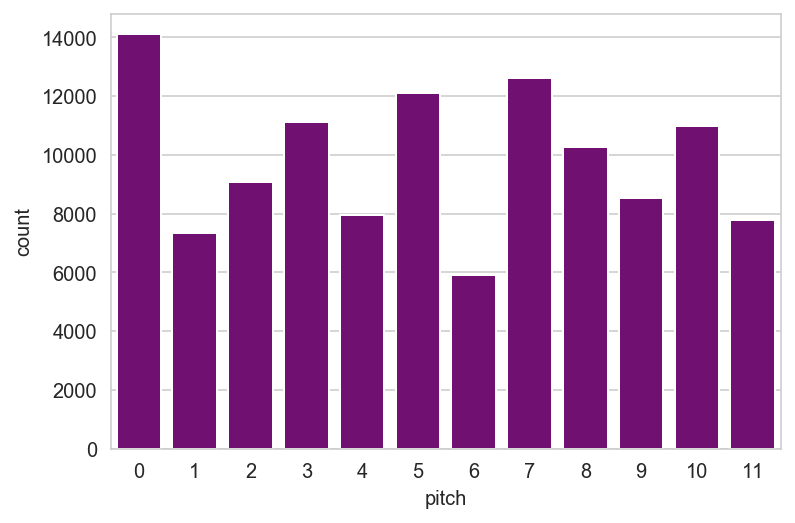

In [530]:
sns.set_style("whitegrid")
sns.barplot(x=dfbeethovenpitch_count['pitch'], y=dfbeethovenpitch_count['count'], color = 'purple')

In [531]:
beethoven_keys = []
for i in be_keys:
    beethoven_keys.append(i.name)
    
beethoven_key_count = Counter(beethoven_keys)
beethoven_key_count

Counter({'F minor': 4,
         'C# major': 4,
         'B- major': 12,
         'F# minor': 2,
         'E- major': 6,
         'C minor': 10,
         'A- major': 4,
         'E minor': 2,
         'E major': 2,
         'A minor': 4,
         'C# minor': 4,
         'C major': 4})

In [532]:
dfbeethoven_key = pd.DataFrame(list(beethoven_key_count.items()), columns=['key', 'count'])
dfbeethoven_key

,key,count
0,F minor,4
1,C# major,4
2,B- major,12
3,F# minor,2
4,E- major,6
5,C minor,10
6,A- major,4
7,E minor,2
8,E major,2
9,A minor,4


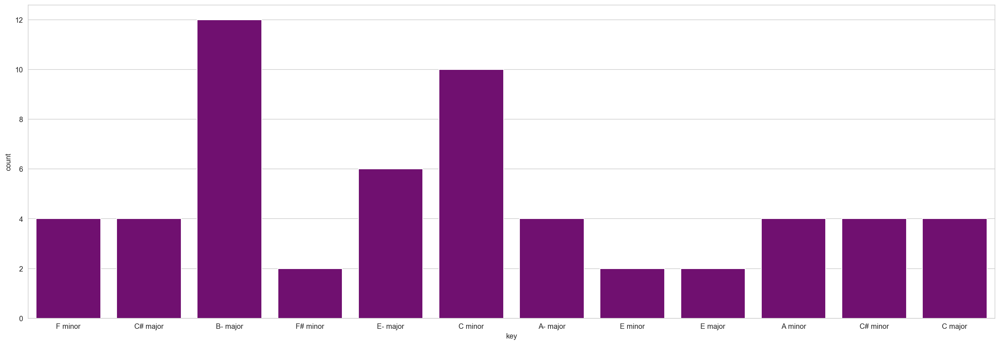

In [533]:
sns.set_style("whitegrid")
plt.figure(figsize=(24, 8))
sns.barplot(x=dfbeethoven_key['key'], y=dfbeethoven_key['count'], color = 'purple')

In [534]:
beethovenset_count = Counter(beethoven_sets)
beethovenset_count

Counter({'<037>': 6218,
         '<036>': 1529,
         '<03>': 9116,
         '<025>': 820,
         '<04>': 5780,
         '<026>': 623,
         '<0>': 9541,
         '<06>': 968,
         '<01>': 322,
         '<0369>': 467,
         '<0258>': 1039,
         '<05>': 2699,
         '<02>': 1430,
         '<027>': 48,
         '<0257>': 35,
         '<0358>': 45,
         '<024>': 21,
         '<013>': 75,
         '<016>': 13,
         '<015>': 55,
         '<0236>': 25,
         '<0136>': 11,
         '<014>': 12,
         '<0237>': 32,
         '<048>': 39,
         '<0247>': 21,
         '<01369>': 34,
         '<0147>': 7,
         '<0158>': 20,
         '<01469>': 1,
         '<0137>': 1,
         '<0146>': 1,
         '<0148>': 2,
         '<01368>': 92,
         '<012578>': 15,
         '<02368>': 3,
         '<02358>': 6,
         '<02469>': 1,
         '<02458>': 2,
         '<013689>': 4,
         '<0268>': 2,
         '<0157>': 4})

In [535]:
dfbeethovenset_count = pd.DataFrame(list(beethovenset_count.items()), columns=['pitch_set', 'count']) 
dfbeethovenset_count

,pitch_set,count
0,<037>,6218
1,<036>,1529
2,<03>,9116
3,<025>,820
4,<04>,5780
5,<026>,623
6,<0>,9541
7,<06>,968
8,<01>,322
9,<0369>,467


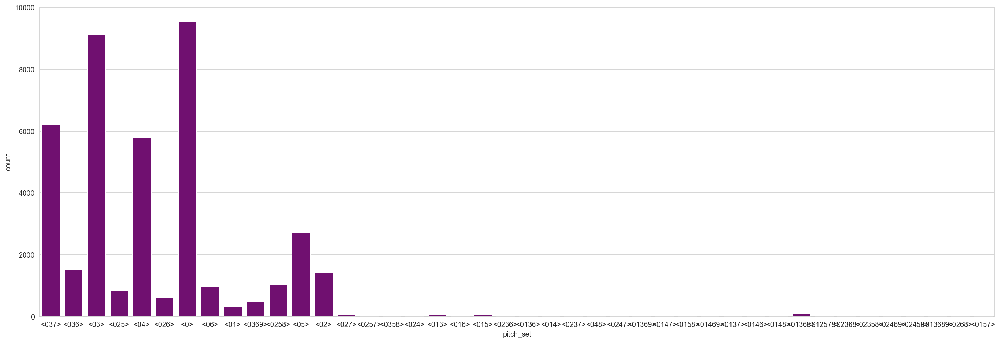

In [536]:
sns.set_style("whitegrid")
plt.figure(figsize=(24, 8))
sns.barplot(x=dfbeethovenset_count['pitch_set'], y=dfbeethovenset_count['count'], color = 'purple')

In [537]:
dfbeethoven_intv_vectors = pd.DataFrame(beethoven_intv_vectors)
dfbeethoven_intv_vectors

,0,1,2,3,4,5
0,0,0,1,1,1,0
1,0,0,2,0,0,1
2,0,0,1,1,1,0
3,0,0,1,1,1,0
4,0,0,2,0,0,1
...,...,...,...,...,...,...
41174,0,0,1,1,1,0
41175,0,0,1,1,1,0
41176,0,0,1,1,1,0
41177,0,0,1,1,1,0


In [538]:
dfbeethoven_intv_vectors = dfbeethoven_intv_vectors.rename(columns={0: 'm2/M7', 1: 'M2/m7', 2: 'm3/M6', 3: 'M3/m6', 4: 'P4/P5', 5: 'Tri-tone'})
dfbeethoven_intv_vectors




,m2/M7,M2/m7,m3/M6,M3/m6,P4/P5,Tri-tone
0,0,0,1,1,1,0
1,0,0,2,0,0,1
2,0,0,1,1,1,0
3,0,0,1,1,1,0
4,0,0,2,0,0,1
...,...,...,...,...,...,...
41174,0,0,1,1,1,0
41175,0,0,1,1,1,0
41176,0,0,1,1,1,0
41177,0,0,1,1,1,0


In [539]:
beethoven_vectors = []
for i in beethoven_intv_vectors:
    beethoven_vectors.append(convert_vectors(i))
beethoven_vector_count = Counter(beethoven_vectors)

In [540]:
beethoven_vector_count

Counter({'001110': 6218,
         '002001': 1529,
         '001000': 9116,
         '011010': 820,
         '000100': 5780,
         '010101': 623,
         '000000': 9541,
         '000001': 968,
         '100000': 322,
         '004002': 467,
         '012111': 1039,
         '000010': 2699,
         '010000': 1430,
         '010020': 48,
         '021030': 35,
         '012120': 45,
         '020100': 21,
         '111000': 75,
         '100011': 13,
         '100110': 55,
         '112101': 25,
         '112011': 11,
         '101100': 12,
         '111120': 32,
         '000300': 39,
         '021120': 21,
         '114112': 34,
         '102111': 7,
         '101220': 20,
         '113221': 1,
         '111111': 2,
         '101310': 2,
         '122131': 92,
         '322242': 15,
         '122212': 3,
         '123121': 6,
         '032221': 1,
         '122311': 2,
         '224232': 4,
         '020202': 2,
         '110121': 4})

In [541]:
dfbeethoven_vectors = pd.DataFrame(list(beethoven_vector_count.items()), columns=['interval_vector', 'count'])
dfbeethoven_vectors

,interval_vector,count
0,001110,6218
1,002001,1529
2,001000,9116
3,011010,820
4,000100,5780
5,010101,623
6,000000,9541
7,000001,968
8,100000,322
9,004002,467


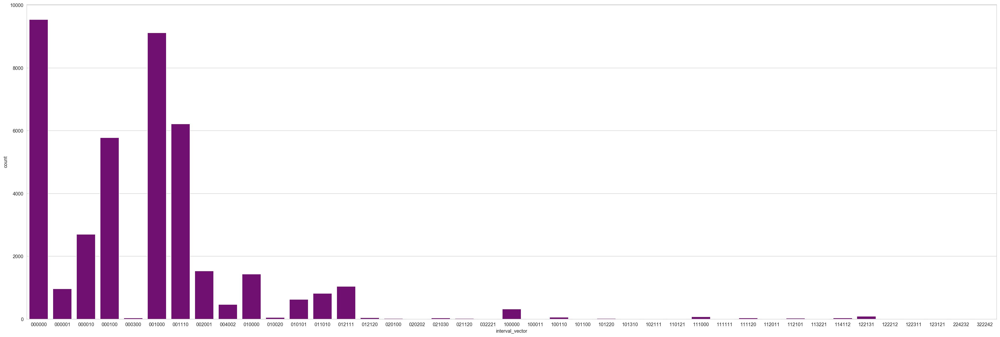

In [542]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=dfbeethoven_vectors['interval_vector'], y=dfbeethoven_vectors['count'], color = 'purple')

## Comparing Bach, Mozart and Beethoven by Interval Vector

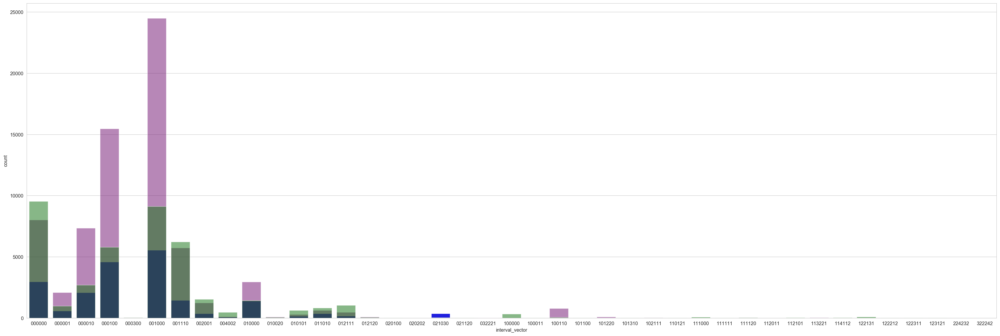

In [543]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=dfmozart_vectors['interval_vector'], y=dfmozart_vectors['count'], color = 'blue')
sns.barplot(x=dfbach_vectors['interval_vector'], y=dfbach_vectors['count'], color = 'purple', alpha = 0.5)
sns.barplot(x=dfbeethoven_vectors['interval_vector'], y=dfbeethoven_vectors['count'], color = 'green', alpha = 0.5)

## Comparing Bach, Mozart and Beethoven by Pitch_Set

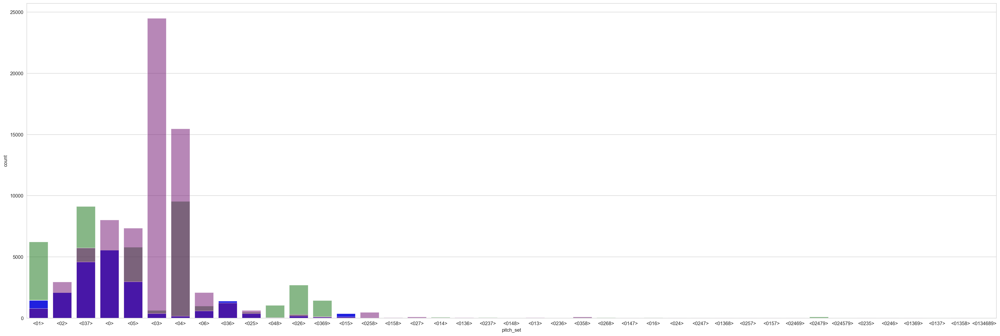

In [546]:
sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=dfbeethovenset_count['pitch_set'], y=dfbeethovenset_count['count'], color = 'green', alpha = 0.5)
sns.barplot(x=dfmozartset_count['pitch_set'], y=dfmozartset_count['count'], color = 'blue')
sns.barplot(x=dfbachset_count['pitch_set'], y=dfbachset_count['count'], color = 'purple', alpha = 0.5)

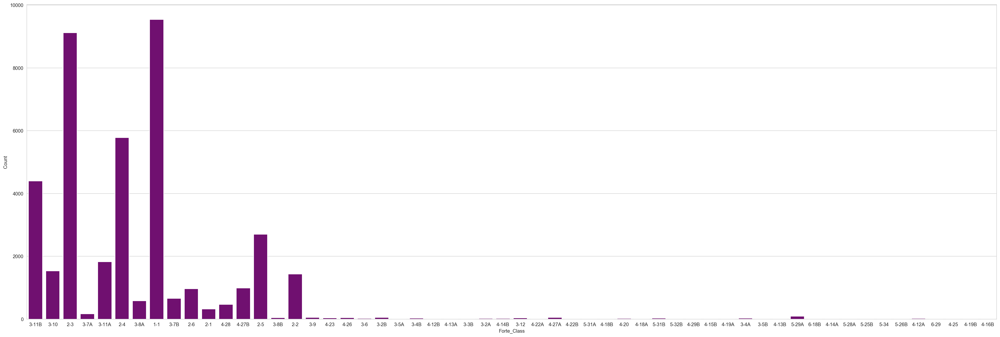

In [677]:
beethoven_forte_count = Counter(beethoven_forte_class)

df_befc = pd.DataFrame(list(beethoven_forte_count.items()), columns=['Forte_Class', 'Count'])

sns.set_style("whitegrid")
plt.figure(figsize=(36, 12))
sns.barplot(x=df_befc['Forte_Class'], y=df_befc['Count'], color = 'purple')

## Chopin

In [7]:
chopin_midi = '/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/Chopin_Subset/chopin_nocturnes copy/chopin-nocturne-op9-no2.mid'

In [8]:
fs=100
midi_pretty_format = pretty_midi.PrettyMIDI(chopin_midi)
piano_midi = midi_pretty_format.instruments[0] # Get the piano channels
piano_roll = piano_midi.get_piano_roll(fs=fs)

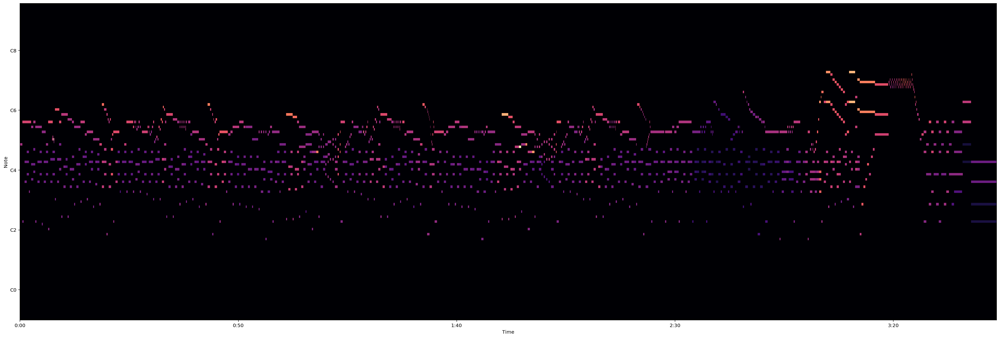

In [9]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(36, 12))
plot_piano_roll(midi_pretty_format, 0, 127)

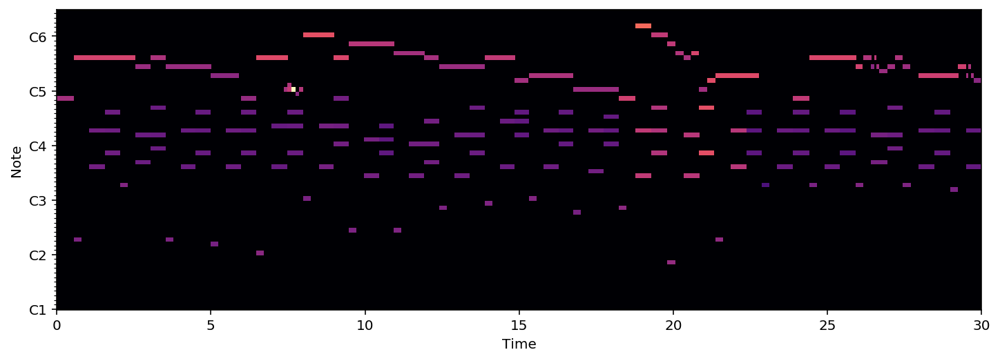

In [14]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 90)
ymin, ymax = plt.ylim()
plt.xlim(0,30);

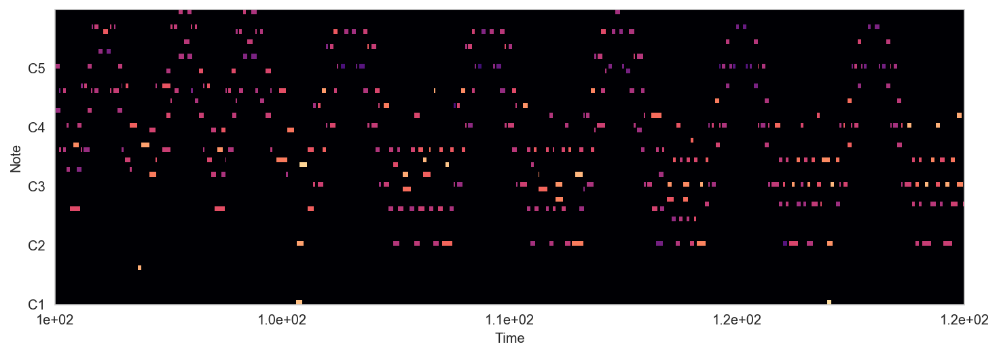

In [553]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(100,120);

In [554]:
chopin = converter.parse(chopin_midi)

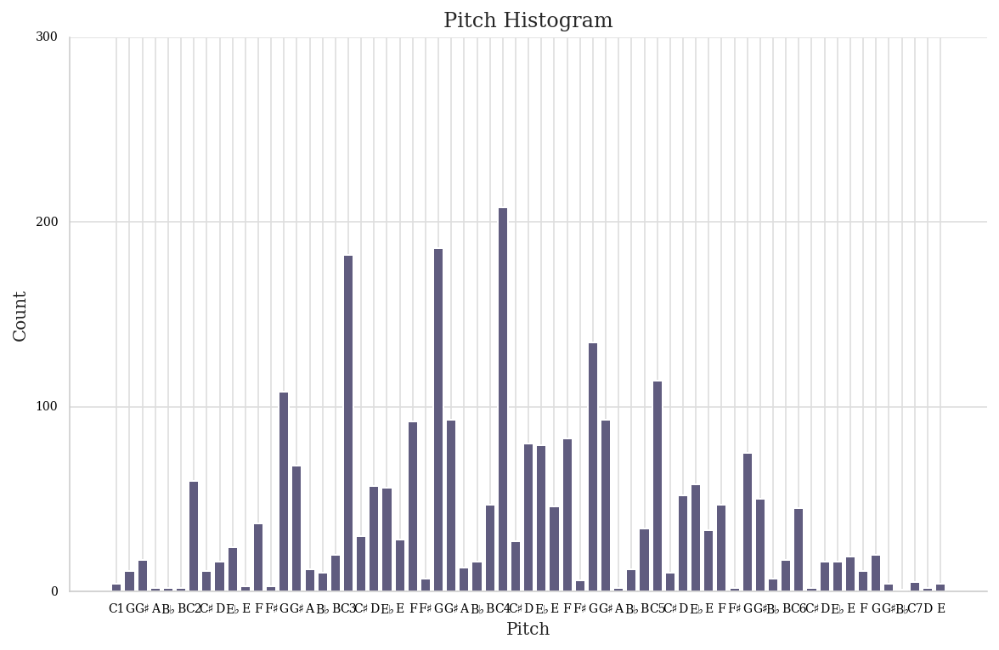

In [555]:
chopin.plot('histogram', 'pitch')

meter: WARNING: Found a messed up beam pair <music21.beam.Beams <music21.beam.Beam 1/start>/<music21.beam.Beam 2/partial/right>>, <music21.beam.Beams <music21.beam.Beam 1/stop>/<music21.beam.Beam 2/stop>>, at index 5 of 
[<music21.beam.Beams <music21.beam.Beam 1/start>/<music21.beam.Beam 2/partial/right>>, <music21.beam.Beams <music21.beam.Beam 1/stop>>, <music21.beam.Beams <music21.beam.Beam 1/start>>, <music21.beam.Beams <music21.beam.Beam 1/continue>>, <music21.beam.Beams <music21.beam.Beam 1/stop>>, <music21.beam.Beams <music21.beam.Beam 1/start>/<music21.beam.Beam 2/partial/right>>, <music21.beam.Beams <music21.beam.Beam 1/stop>/<music21.beam.Beam 2/stop>>]
meter: WARNING: Found a messed up beam pair <music21.beam.Beams <music21.beam.Beam 1/start>/<music21.beam.Beam 2/partial/right>>, <music21.beam.Beams <music21.beam.Beam 1/stop>/<music21.beam.Beam 2/stop>>, at index 10 of 
[None, None, None, None, None, None, None, None, None, None, <music21.beam.Beams <music21.beam.Beam 1/start

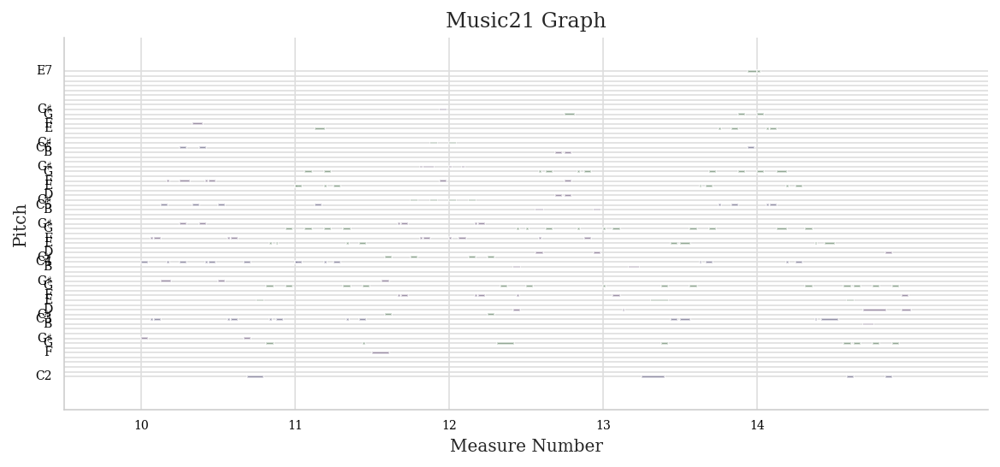

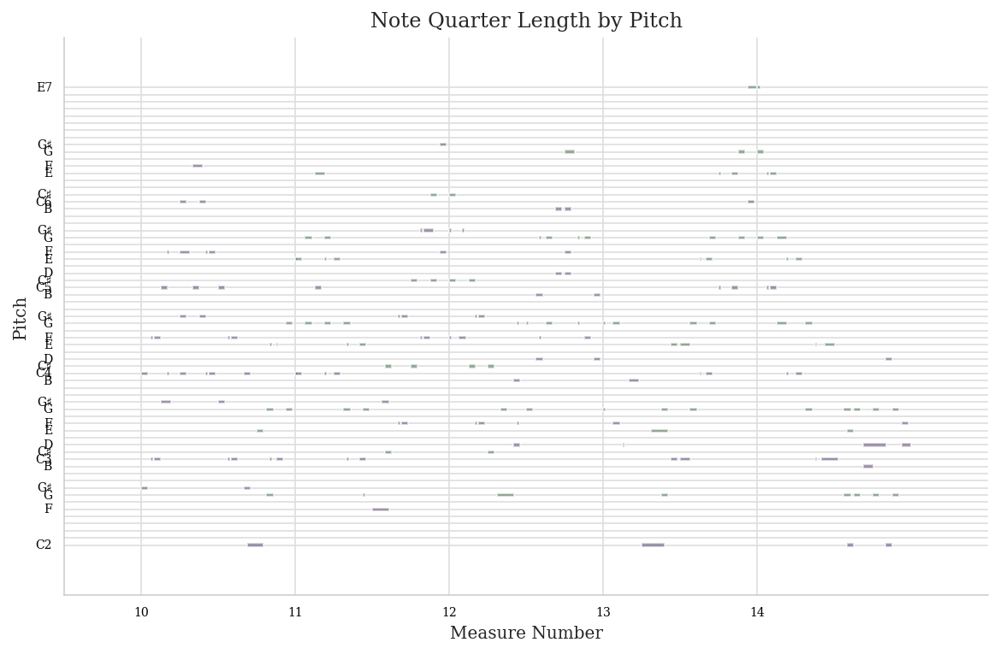

In [558]:
chopin.measures(10,14).plot('horizontalbar', 'pitch')

In [559]:
chopin.analyze('key')

<music21.key.Key of c minor>

In [560]:
ch_note_name = []
ch_notes = []
ch_n_durations = []
ch_n_offsets = []

ch_chord_spelling = []
ch_chords = []
ch_c_durations = []
ch_c_offsets = []

ch_keys = []
    
for i,file in enumerate(glob.glob('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/*.mid')):
    print(file)
    midi = converter.parse(file)
    key = midi.analyze('key')
    ch_keys.append(key)
    print(key)
    notes_to_parse = midi.flat.notes
    for element in notes_to_parse:
        if isinstance(element, note.Note): # If it is single note
            ch_note_name.append(element.pitch)
            ch_notes.append(note_to_int(str(element.pitch))) # Append note's integer value to "notes" list.
            ch_duration = str(element.duration)[27:-1] 
            ch_n_durations.append(check_float(ch_duration)) 
            ch_n_offsets.append(element.offset)
            

        elif isinstance(element, chord.Chord): # If it is chord
            ch_chord_spelling.append(element.pitchNames)
            ch_chords.append('.'.join(str(note_to_int(str(n)))
                                  for n in element.pitches))
            ch_duration = str(element.duration)[27:-1]
            ch_c_durations.append(check_float(ch_duration))
            ch_c_offsets.append(element.offset)
            print(element)

/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/ballade1.mid
g minor
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord F#5 F#4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord D5 D4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord B-3 D4 G2>
<music21.chord.Chord D4 B-3 G2>
<music21.chord.Chord G4 B-3 D4>
<music21.chord.Chord D4 B-3 G4>
<music21.chord.Chord E-4 A3 G4 C4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord B-3 G2 D4>
<music21.chord.Chord G2 D4>
<music21.chord.Chord A2 C#4 A3>
<music21.chord.Chord A2 A3 G3>
<music21.chord.Chord F#3 D4 A3 D2>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord B-3 D4 G2>
<music21.chord.Chord C#5 E4 B-4>
<music21.chord.Chord B-4 G4 E4>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord B-4 C5>
<m

F major
<music21.chord.Chord C5 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C5 F3 C4 A4>
<music21.chord.Chord C5 A4 C4>
<music21.chord.Chord F3 C4>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord C4 F3>
<music21.chord.Chord F3 B-4 C4>
<music21.chord.Chord E5 B-4>
<music21.chord.Chord F3 C4>
<music21.chord.Chord C5 C4 F3 B-4>
<music21.chord.Chord F5 A4 F3 C4>
<music21.chord.Chord D5 B-3 F4>
<music21.chord.Chord C5 F4 A3>
<music21.chord.Chord E4 C3 A4>
<music21.chord.Chord A3 C3>
<music21.chord.Chord F4 C4>
<music21.chord.Chord D3 C4 A3>
<music21.chord.Chord B-3 F4 G2>
<music21.chord.Chord D3 G2>
<music21.chord.Chord B-3 E4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord A4 C4 F3>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord B-2 F3>
<music21.chord.Chord A4 C4>
<music21.chord.Chord B-2 D4 F3>
<music21.chord.Chord A4 C3 C4 F3>
<music

A- major
<music21.chord.Chord E-4 C#4>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord G#4 F5 F4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#4 E-4 C4>
<music21.chord.Chord B-4 E-4 C#4>
<music21.chord.Chord C5 G#4 E-4>
<music21.chord.Chord E-2 B-4 C#4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord G#6 G#1 G#5 G#2>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord G#4 G#1 G#2>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord G#3 E-3 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord E-2 E-1>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord D3 B3>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord C#3 B-3>
<music21.chord.Chord E-5 E-4>
<music21.chord.

f minor
<music21.chord.Chord G5 G4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord E4 G5 G4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord G5 G4>
<music21.chord.Chord G5 G4 D4>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord G5 G4>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord G5 G4>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord C5 A4 C4>
<music21.chord.Chord F5 A3>
<music21.chord.Chord A4 C5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord E5 E4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord D5 B3 D4>
<music21.chord.Chord G4 C5 G3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G4 C5>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord C4 G4>
<music21.chord.Chord C5 B-4 D4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord C5 B-4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord C4 C5 A4>
<music21.chord.Chord F5 F4 A3>
<music21.chord.Chord A4 C5 C4>
<music21.chord.Chord E5 E4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord E5 E4>
<music21.chord.Chord G4 G3>
<music2

<music21.chord.Chord B-3 B-2>
<music21.chord.Chord F4 C#3>
<music21.chord.Chord F4 C#3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord B-4 B-5>
<music21.chord.Chord F6 C#5>
<music21.chord.Chord B-4 B-5>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord C#3 F4>
<music21.chord.Chord F4 C#3>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord B3 G2>
<music21.chord.Chord F4 C#3>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord B5 G4>
<music21.chord.Chord C#5 G6>
<music21.chord.Chord B5 G4>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord B4 G3>
<music21.chord.Chord C#3 F4>
<music21.chord.Chord B3 G2>
<music21.chord.Chord C#2 F3>
<music21.chord.Chord F4 G#4 C4 G#2 G#3>
<music21.chord.Chord C3 G#2>
<music21.chord.Chord F3 F2>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord B2 B3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord B3 B4>
<music21.chord.Chord G#4 G#5>
<mu

A- major
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord F3 G#3 C4>
<music21.chord.Chord F3 G#3 C4>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord C4 G#4>
<music21.chord.Chord C4 G#4>
<music21.chord.Chord B-3 C4 G4>
<music21.chord.Chord B-3 C4 G4>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord F3 G3 C#4>
<music21.chord.Chord C3 G3 E4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord G#3 C4 E-4>
<music21.chord.Chord G#3 C4 E-4>
<music21.chord.Chord G#3 C4 E-4>
<music21.chord.Chord G#3 C4 E-4>
<music21.chord.Chord G#3 B-3 F4>
<music21.chord.Chord G#3 B-3 F4>
<music21.chord.Chord G#3 B-3 D4>
<music21.chord.Chord G#3 B-3 D4>
<music21.chord.Chord G3 B-3 E-4>
<music21.chord.Chord G3 B-3 E-4>
<music21.chord.Chord G#3 B-3 F4>
<music21.chord.Chord G#3 B-3 F4>
<music21.chord.Chord G3 B-3 E-4>
<music21.chord.Chord G3 B-3 E-4>
<music21.chord.Chord G#3 B-3 D4>
<music21.chord.Chord G#3 B-3 D4>
<music21.chord.Chord B-3 E-4 G4>
<mus

C major
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord D2 D1>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G2 G1>
<music21.chord.Chord F#2 F#1>
<music21.chord.Chord D2 D1>
<music21.chord.Chord C2 C1>
<music21.chord.Chord E1 E2>
<music21.chord.Chord F#2 F#1>
<music21.chord.Chord G1 G2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord C1 C2>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chet1002.mid
a minor
<music21.chord.Chord A2 A4 E4 C4>
<music21.chord.Chord A4 E4 E3 C4 C#5>
<music21.chord.Chord A4 D5 A2 F5>
<music21.chord.Chord D5 F5 F3 D4 A3 A5>
<music21.chord.Chord E5 A5 A1 A2 C#6>
<music21.chord.Chord E3 C6 A5 C4 A3 F6>
<music21.chord.Chord A5 E5 A3 C4 C#6>
<music21.chord.Chord A5 E5>
<music21.chord.Chord G#5 E5 B4>
<music21.chord.Chord B3 E3 E5 D4 G#4 B4>
<music21.chord.Chord A2 E-5 A4 C5>
<music21.chord.Chord E4 E3 C4 A3 A4 B4>
<music21.chord.Chord G#4 E3 B3 B4 E4>
<music21.chord.Chord E-4 B4 A4>
<music21.chord.Chord E3 

E major
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord E-4 B2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord E-4 B2>
<music21.chord.Chord E4 E3>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord B3 B2>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord B2 E-4>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord C#5 G#4>
<music21.chord.Chord C#5 D4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord E4 E3>
<music21.chord.Chord A4 E4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord E5 G#4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord B-3 E4 C#3 E3 F#3>
<music21.chord.Chord F#5 B-4 F#4 C#3>
<music21.chord.Chord F#3 E3>
<music21.chord.Chord E-5 B-4>
<music21.chord.Chord E-4 B-4 B-3 C#3>
<music21.chord.Chord E5 C#3>
<music21.chord.Chord B-3 E4 F#3>
<music21.chord.Chord B-4 C#3>
<music21.chord.Chord F#4 C3 B-4 F#3 E3>
<music21.chord.Chord B-3 E3>
<music21.chord.Chord

c# minor
<music21.chord.Chord G#5 G#2>
<music21.chord.Chord G#4 G#3 G#2>
<music21.chord.Chord C#6 C#5>
<music21.chord.Chord C#2 C#3 C#5>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord F#4 C#4 A3>
<music21.chord.Chord E5 G#3 E4 C#4>
<music21.chord.Chord E-4 C#4 F#3>
<music21.chord.Chord C#3 G#3>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord F#3 C5>
<music21.chord.Chord C#4 C#3 E3>
<music21.chord.Chord G#4 G#3 G#2>
<music21.chord.Chord C#6 C#5 C#2 C#3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord C#3 C#2>
<music21.chord.Chord E-5 E-4 C#5 G4 B-4>
<music21.chord.Chord G#2 G#4>
<music21.chord.Chord B4 B3 G#4 E-4>
<music21.chord.Chord B-2 G4>
<music21.chord.Chord C#4 G4 E-4>
<music21.chord.Chord G#4 B3 E-4>
<music21.chord.Chord G#4 B-3 E4>
<music21.chord.Chord E-3 G#4>
<music21.chord.Chord B3 E-4>
<music21.c

F# major
<music21.chord.Chord C#4 B-3 F#4 F#3>
<music21.chord.Chord F#4 F#3 B3 E-4>
<music21.chord.Chord C#6 C#4>
<music21.chord.Chord F#4 B-3>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord F#4 E-4 B3 F#5>
<music21.chord.Chord F#4 B-3 C#4>
<music21.chord.Chord C#4 C#3 C#2>
<music21.chord.Chord C#5 F4>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord E-4 G#4 B3 G#3>
<music21.chord.Chord G#2 G#5>
<music21.chord.Chord B3 E-4 E-6>
<music21.chord.Chord G#3 E-6>
<music21.chord.Chord G#5 B3>
<music21.chord.Chord F#4 C#4 F#3 B-3>
<music21.chord.Chord F#4 F#3 E-4 F#6 B3>
<music21.chord.Chord C#6 F#4 C#4 B-3 F#3>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord F#4 F#5 E-4 B3>
<music21.chord.Chord C#4 F#4 C#5 B-3>
<music21.chord.Chord E-4 B2>
<music21.chord.Chord E-4 G#3 G#4>
<music21.chord.Chord B2 E-6>
<music21.chord.Chord B-5 F3>
<music21.chord.Chord B-6 D4>
<music21.chord.Chord B-3 B-6>
<music21.chord.Chord F#6 B-3>
<music21.chord.Chord F#4 F#3 C#4>
<music21.chord.Chord F#6 F#4 E-4 

C major
<music21.chord.Chord G4 E4 C3 C2>
<music21.chord.Chord E4 C5>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord F4 D5>
<music21.chord.Chord F4 D4>
<music21.chord.Chord B4 D4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord B3 G4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord B4 D4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord F4 D5>
<music21.chord.Chord B4 D4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord G4 B3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord D4 B4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord B4 F4>
<music21.chord.Chord F4 D5>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord G4 E5>
<music21.chord.Chord B-4 E5>
<music21.chord.Chord G5 B-4>
<music21.chord.Chord D4 D3>
<music21.chord.Chord D5 A4>
<music21.chord.Chord A4 F5>
<music21.chord.Chord E3 C

F major
<music21.chord.Chord B2 A4>
<music21.chord.Chord F2 F1>
<music21.chord.Chord C3 C5>
<music21.chord.Chord B2 F4>
<music21.chord.Chord E1 E2>
<music21.chord.Chord B-4 B2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord C3 C5>
<music21.chord.Chord G2 A6>
<music21.chord.Chord G4 B2>
<music21.chord.Chord C3 G4>
<music21.chord.Chord F3 F4 B-3>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord C4 F4 A3 F3 C5>
<music21.chord.Chord F4 C4 A3 F3>
<music21.chord.Chord D4 B-3 F4 F3>
<music21.chord.Chord C4 F4 C5 A3 F3>
<music21.chord.Chord C6 F4 C4>
<music21.chord.Chord F3 A3>
<music21.chord.Chord F4 G3>
<music21.chord.Chord C2 G2>
<music21.chord.Chord G3 C7>
<music21.chord.Chord B-3 E4>
<music21.chord.Chord G6 C3>
<music21.chord.Chord F4 G6>
<music21.chord.Chord A4 B2>
<music21.chord.Chord F2 F3>
<music21.chord.Chord C3 C5>
<music21.chord.Chord B2 F4>
<music21.chord.Chord F3 C3>
<music21.chord.Chord G3 E2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord C3 A4>
<music21.chord.Chord D4 B-5

f minor
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord E4 E5>
<music21.chord.Chord F#5 F#4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord A4 A5>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord C6 C5>
<music21.chord.Chord C#6 C#5>
<music21.chord.Chord E6 E5>
<music21.chord.Chord F#6 F#5>
<music21.chord.Chord G6 G5>
<music21.chord.Chord A6 A5>
<music21.chord.Chord B-6 B-5>
<music21.chord.Chord C6 C7>
<music21.chord.Chord C#6 C#7>
<music21.chord.Chord C#6 C#5>
<music21.chord.Chord C#6 C#5>
<music21.chord.Chord C5 C6>
<music21.chord.Chord B-4 B-5>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord C6 C5>
<music21.chord.Chord C#7 C#6>
<music21.chord.Chord C#6 C#7>
<music21.chord.Chord C#7 C#6>
<music21.chord.Chord C#6 C#7>
<music21.chord.Chord C#5 C#6>
<music21.chord.Chord C#5 C#6>
<music21.chord.Chord C5 C6>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord C5 C6>
<music21.chord.Chord B-4 B-5>
<music21.chord.Chord G#5 G

E- major
<music21.chord.Chord E-2 E-6>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord G5 G4>
<music21.chord.Chord B-4 G5>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord B-5 G4>
<music21.chord.Chord B-3 G5>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord G5 G4>
<music21.chord.Chord B-4 D3>
<music21.chord.Chord F6 G#4>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord G#5 B-3>
<music21.chord.Chord B-3 G#5>
<music21.chord.Chord B-5 G#4>
<music21.chord.Chord G5 E-3>
<music21.chord.Chord G4 G6>
<music21.chord.Chord B-3 D5 B-5>
<music21.chord.Chord G#4 D6>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord E-5 B-5>
<music21.chord.Chord B-3 B-5>
<music21.chord.Chord E-4 G4 E-6>
<music21.chord.Chord B4 G2>
<music21.chord.Chord E-3 E-5>
<music21.chord.Chord B3 D6>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord F3 C5>
<music21.chord.Chord F5 E-4>
<music21.chord.Chord E-3 B-4>
<music21.chord.Chord G3 G5 E-4>
<music21.chord.Chord F#3 C5>
<music21.chord.Ch

c minor
<music21.chord.Chord B5 B4 F5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G4 G5>
<music21.chord.Chord G5 D6 D5>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord F5 E-5>
<music21.chord.Chord G5 F5 D6>
<music21.chord.Chord G5 G6>
<music21.chord.Chord F5 F6>
<music21.chord.Chord D6 D5>
<music21.chord.Chord D6 D5>
<music21.chord.Chord B5 B4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord G5 G4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord D4 D5>
<music21.chord.Chord B4 B3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord G3 G4>
<music21.chord.Chord D4 D3>
<music21.chord.Chord B3 B2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord D3 D2>
<music21.chord.Chord C3 C2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord D2 D3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord B2 B1>
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord G2 G3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord E

A- major
<music21.chord.Chord G#3 C5>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord E-3 G#4>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-3 C5>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord C#5 G3>
<music21.chord.Chord E-4 C#4>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord C#5 E-3>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord C#5 G3>
<music21.chord.Chord E-4 C#4>
<music21.chord.Chord G3 C#5>
<music21.chord.Chord E-4 C#4>
<music21.chord.Chord C#5 E-3>
<music21.chord.Chord C#5 G3>
<music21.chord.Chord E-4 C#4>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord B-5 G#2>
<music21.chord.Chord C5 E-3>
<music21.chord.Chor

g# minor
<music21.chord.Chord E-5 B4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord B3 B4 E-5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord E-5 B4 E-3>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord B4 B3>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord E-5 E-2 B4>
<music21.chord.Chord G#2 B4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord G#4 F5>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord G#4 G5 B3>
<music21.chord.Chord E5 E-4>
<music21.chord.Chord G

c# minor
<music21.chord.Chord C#5 G#4>
<music21.chord.Chord G#4 C#5>
<music21.chord.Chord G#4 C#5>
<music21.chord.Chord A4 E4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord G3 F#4>
<music21.chord.Chord E-4 B3 F#4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 E-4>
<music21.chord.Chord E-4 A3>
<music21.chord.Chord G#3 E4 C#4>
<music21.chord.Chord G#4 G#3 G2>
<music21.chord.Chord G#4 C3>
<music21.chord.Chord G3 G#4 F#4>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord G#4 C#5>
<music21.chord.Chord E4 A4>
<music21.chord.Chord A4 E4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord E-4 A4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord C#4 E-4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord C#4 F4>
<music21.chord.Chord C#4 F4>
<music21.chord.Chord C#4 F#4>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord F#4 C#4>
<music21.chord.Chord F#4 E4>
<music21.chord.Chord A3 E4>
<music21.chord.C

a minor
<music21.chord.Chord E4 C4>
<music21.chord.Chord E4 C3 G3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord C3 G3 C4>
<music21.chord.Chord F2 A3>
<music21.chord.Chord E4 C4 A3>
<music21.chord.Chord C7 E4 C4 A3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord D6 A3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord A1 F5>
<music21.chord.Chord E3 A2 D5>
<music21.chord.Chord E3 A2>
<music21.chord.Chord D4 F3>
<music21.chord.Chord D6 F3 B5 D4>
<music21.chord.Chord D6 C4 F3>
<music21.chord.Chord G#2 E4>
<music21.chord.Chord B4 D4>
<music21.chord.Chord D4 F3>
<music21.chord.Chord F3 D4>
<music21.chord.Chord C4 D6>
<music21.chord.Chord B2 A4>
<music21.chord.Chord B3 G#3 G#5>
<music21.chord.Chord E6 C#5>
<music21.chord.Chord B4 A4 G#6>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E3 A4>
<music21.chord.Chord E2 A4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord B5 G4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord E7 G#3>
<music21.chord.Chord E4 E3

c minor
<music21.chord.Chord G2 G3>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord C3 E-4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord C4 D4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord C4 E-5>
<music21.chord.Chord G3 G4>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord C3 E-4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord F2 G#3>
<music21.chord.Chord D4 C3>
<music21.chord.Chord D4 C3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord D5 C4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord C4 D5>
<music21.chord.Chord F3 G#4>
<music21.chord.Chord D4 C3>
<music21.chord.Chord C3 E4 D4>
<music21.chord.Chord C4 G#2>
<music21.chord.Chord F4 C3>
<music21.chord.Chord C3 F4>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord F5 C4>
<music21.chord.Chord G#4 C6>
<music21.chord.Chord C6 G#4>
<music21.chord.Chord C4 F5>
<music21.chord.Chord G#3 C5>
<music21.chord.Chord

b- minor
<music21.chord.Chord F5 A3>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord E-5 B-2>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord F4 B-4>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord F#3 E-5>
<music21.chord.Chord F4 B-4>
<music21.chord.Chord A5 C#4>
<music21.chord.Chord B-2 E6>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord E-4 D5>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord F5 F4>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord C5 C4 C3>
<music21.chord.Chord C#2 B-4 B-3>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord C#2 B-3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord C#4 C#5 C#2>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord C#2 F5>
<music21.chord.Chord E4 E5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord E4 E5>
<music21.chord.Chord D5 D4>
<music21.chord.Chord A4 A3>
<music21.chord.Chor

F major
<music21.chord.Chord A3 E3>
<music21.chord.Chord A3 D3>
<music21.chord.Chord G#3 D3>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord F#3 E-3>
<music21.chord.Chord F#3 D3>
<music21.chord.Chord C3 G#3>
<music21.chord.Chord C3 G#3>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord F2 G#3>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord C#2 G#3>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord G#3 B-1>
<music21.chord.Chord G#4 C#4>
<music21.chord.Chord F2 B-3>
<music21.chord.Chord G#4 C#4>
<music21.chord.Chord G#4 C#4>
<music21.chord.Chord C#4 G#4>
<music21.chord.Chord C#4 G#4>
<music21.chord.Chord G#4 C#4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord C#4 G4>
<music21.chord.Chord C#3 B-3>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord B-3 C#3>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord C#3 B-3>
<music21.chord.Chord B-4 F4>
<music21.chord.Chord C#3 

d minor
<music21.chord.Chord G3 B-3 D4>
<music21.chord.Chord G3 C4 E-4>
<music21.chord.Chord G3 B-3 D4>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord F3 B-3 D4>
<music21.chord.Chord F#3 A3 E-4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord F#3 A3 E-4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord D3 F#3 C4>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord G3 C4 E-4>
<music21.chord.Chord G3 B-3 D4>
<music21.chord.Chord A3 D4 F4 A4>
<music21.chord.Chord A3 D4 F4 A4>
<music21.chord.Chord A3 D4 A4>
<music21.chord.Chord A3 D4 G#4>
<music21.chord.Chord A3 C#4 G4>
<music21.chord.Chord A3 D4 F4>
<music21.chord.Chord A3 C#4 G4>
<music21.chord.Chord A3 D4 F4>
<music21.chord.Chord F3 A3 E-4>
<music21.chord.Chord G3 B-3 D4>
<music21.chord.Chord G3 C4 E-4>
<music21.chord.Chord G3 B-3 D4>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord F3 B-3 D4>
<music

C# major
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord E-5 F#4>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord B-4 F#5>
<music21.chord.Chord F5 C5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord F5 E-5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord B-4 F3>
<music21.chord.Chord C#5 F3>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord B5 G#5>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord B-5 F#5>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord E-6 F#5>
<music21.chord.Chord B-2 B-5>
<music21.chord.Chord B-5 C#5>
<music21.chord.Chord B-5 E-5>
<music21.chord.Chord B-5 F#5>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord F#5 E-5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord F5 G#5>
<music21.chord.Chord A5 A4>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord F#4 E-3>
<music21.chord.Chord C

g minor
<music21.chord.Chord D4 D3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord E-4 C4 G3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord D5 B-2>
<music21.chord.Chord C4 A3>
<music21.chord.Chord A4 D4>
<music21.chord.Chord F4 C4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord F4 D4>
<music21.chord.Chord D4 A3>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord C4 G3>
<music21.chord.Chord C5 D4>
<music21.chord.Chord C4 A3>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord C2 C5>
<music21.chord.Chord G3 C4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord D5 B-2>
<music21.chord.Chord A3 C4>
<music21.chord.Chord C5 A2>
<music21.chord.Chord F4 F3>
<music21.chord.Chord F4 D4>
<music21.chord.Chord B-2 D5>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord B4 G3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord A4 D4>
<music21.chord.Chord B-3 D3>
<music21.chord.Chord C4 G#3 E-3 G#2>
<music21.chord.

c minor
<music21.chord.Chord C2 C3>
<music21.chord.Chord G3 E-4 G4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G#3 E-4 G#4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G3 D4 F4 G4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G3 C4 E-4 G4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord C4 E-4 G#4>
<music21.chord.Chord F1 F2>
<music21.chord.Chord F3 C4 D4>
<music21.chord.Chord G1 G2>
<music21.chord.Chord F3 B3>
<music21.chord.Chord C1 C2>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord E-1 E-2>
<music21.chord.Chord G3 B-3 E-4 G4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord F3 C4 E-4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord B-3 D4 G#4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord C2 C3>
<music21.chord.Chord E-5 F5>
<music21.chord.Chord A3 E-4 G4>
<music21.chord.Chord D2 D3>
<music21.chord.Chord D1 D2>
<music21.chord.Chord A3 C4>
<music21.chord.Chord G1 G2>
<music21.chord.Chord D3 B-3 D4>
<music21.chord.Chord G1 G2>
<music21.chord.Chord D3 B-3 D4

<music21.chord.Chord F#2 E-3>
<music21.chord.Chord C3 G#3>
<music21.chord.Chord F#2 E-3>
<music21.chord.Chord F1 F2>
<music21.chord.Chord F2 C#3>
<music21.chord.Chord C#3 G#3>
<music21.chord.Chord F2 C#3>
<music21.chord.Chord C#3 G#3>
<music21.chord.Chord F2 C#3>
<music21.chord.Chord G1 G2>
<music21.chord.Chord G2 D3>
<music21.chord.Chord D3 F3>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord G1 G2>
<music21.chord.Chord G2 D3>
<music21.chord.Chord D3 F3>
<music21.chord.Chord F3 B3>
<music21.chord.Chord F3 B3>
<music21.chord.Chord F3 B3>
<music21.chord.Chord G2 E-3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord G2 E-3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord E-3 G3>
<music21.chord.Chord E-3 G3 C4 E-4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord E-3 G3 C4 E-4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord E-3 G3 C4 E-4>
<music21.chord.Chord C2 G2 C3>
/Volumes/S190813/Music_Box/L

E- major
<music21.chord.Chord B-4 E5>
<music21.chord.Chord D4 G#4>
<music21.chord.Chord C5 F5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord G#3 B-4>
<music21.chord.Chord E-5 C6>
<music21.chord.Chord C5 C6>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord G4 C#5 E-5 G5>
<music21.chord.Chord E-3 B-3 E-4>
<music21.chord.Chord G#4 C5 G#5>
<music21.chord.Chord E-3 C4 E-4>
<music21.chord.Chord E-4 C5>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord G#4 C5>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord F4 B-4>
<music21.chord.Chord B-3 G#4>
<music21.chord.Chord G3 E-4 G4>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord G3 B-3 E-4 G4>
<music21.chord.Chord E-2 B-2 E-3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chno6201.mid
B major
<music21.chord.Chord

g# minor
<music21.chord.Chord A3 A4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord C4 C5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord D5 D4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord A3 A4>
<music21.chord.Chord A4 A3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord E5 E4>
<music21.chord.Chord C5 G5>
<music21.chord.Chord F5 F4>
<music21.chord.Chord B5 B4>
<music21.chord.Chord D5 C4>
<music21.chord.Chord C6 C5>
<music21.chord.Chord B4 E-3>
<music21.chord.Chord E-5 B5>
<music21.chord.Chord G2 A4>
<music21.chord.Chord A5 E5>
<music21.chord.Chord G5 G4>
<music21.chord.Chord B4 E5>
<music21.chord.Chord A4 A3>
<music21.chord.Chord D5 D4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord E2 B2>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord G3 G2>
<music

<music21.chord.Chord G4 E3>
<music21.chord.Chord G#2 E-5>
<music21.chord.Chord F#5 E5>
<music21.chord.Chord B4 E-4>
<music21.chord.Chord G#5 B5 B3>
<music21.chord.Chord E-3 F#5>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord B-3 F#5 E-5>
<music21.chord.Chord G#4 E2>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord E3 C#5>
<music21.chord.Chord F3 E-4>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord G#4 C#3>
<music21.chord.Chord C#5 B-3>
<music21.chord.Chord C#5 B1>
<music21.chord.Chord F#4 F#2>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chord E-5 E-3>
<music21.chord.Chord F5 B4>
<music21.chord.Chord F#5 B4>
<music21.chord.Chord G#5 E4>
<music21.chord.Chord B3 E-5>
<music21.chord.Chord C#5 E4>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord C#3 F#4>
<music21.chord.Chord E-3 B-3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord F#3 B2>
<music21.chord.Chord B2 B1>
<music21.chord.Chord E-4 

<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C#3 E2>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C#3 E2>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord E4 C#3>
<music21.chord.Chord E3 C#3>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#2 E-4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord E1 E4 G#4 E2>
<music21.chord.Chord B4 B3>
<music21.chord.Chord B3 B4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord G#4 E-4>
<music21.chord.Chord B3 B4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord 

<music21.chord.Chord C#4 E3 E4 G#3>
<music21.chord.Chord E-3 C4 G#3>
<music21.chord.Chord G#3 E-4 E-3>
<music21.chord.Chord E-4 G#3 E-3>
<music21.chord.Chord G#3 E3 E4 C#4>
<music21.chord.Chord C#4 G#3 E4>
<music21.chord.Chord E3 G#3 E4>
<music21.chord.Chord C#4 E3 E4>
<music21.chord.Chord E-3 C4 E-4>
<music21.chord.Chord C4 E-4 E-3 G#3>
<music21.chord.Chord C4 E-4 E-3 G#3>
<music21.chord.Chord G#3 E-3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord E-4 C4 E-3 G#3>
<music21.chord.Chord E-4 C4 E-3>
<music21.chord.Chord G#3 E-3>
<music21.chord.Chord G#3 C4 E-4 E-3>
<music21.chord.Chord E-4 C4 E-3 G#3>
<music21.chord.Chord E-4 C4 G#3 E-3>
<music21.chord.Chord E-3 C#4 G#3>
<music21.chord.Chord C#4 E-3 G#3>
<music21.chord.Chord E-4 C4 G#3 E-3>
<music21.chord.Chord C4 E-4 G#3>
<music21.chord.Chord E-4 C4 G#3>
<music21.chord.Chord E-4 C4 E-3 G#3>
<music21.chord.Chord C#4 E-3 G#3>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord E-4 G#3 E-3>
<music21.chord.Chord E-4 G#3 E-3>
<music21.cho

<music21.chord.Chord D4 C3>
<music21.chord.Chord G3 C3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B-4 G3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F3 A3>
<music21.chord.Chord D4 B-4>
<music21.chord.Chord C4 A4>
<music21.chord.Chord A3 G4>
<music21.chord.Chord G3 C6>
<music21.chord.Chord G3 G4>
<music21.chord.Chord D4 G3>
<music21.chord.Chord F5 B4 G3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord D4 F5>
<music21.chord.Chord G4 C4 B-5>
<music21.chord.Chord B-5 E5>
<music21.chord.Chord G4 E5>
<music21.chord.Chord F4 G4>
<music21.chord.Chord G4 C4>
<music21.chord.Chord B-5 E5>
<music21.chord.Chord C5 C3>
<music21.chord.Chord F3 A4>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B-4 E4 C3 G3>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord A3 C3>
<music21.chord.Chord C4 F3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord C4 A4>
<music21.chord.Chord F4 C5>
<music21.chord.Chord F5 A4>
<music21.chord.Chord A4 C6>
<music21.chord.Chord F4 F6>


<music21.chord.Chord E-4 B-4>
<music21.chord.Chord F6 G#5>
<music21.chord.Chord E-4 G#4 C5>
<music21.chord.Chord F#5 E-6>
<music21.chord.Chord C5 G#4 E-4>
<music21.chord.Chord F6 G#5>
<music21.chord.Chord C5 G#4 E-4>
<music21.chord.Chord F#5 E-6>
<music21.chord.Chord E-4 G#4 C5>
<music21.chord.Chord G#5 F6>
<music21.chord.Chord C5 G#4 E-4>
<music21.chord.Chord F#5 E-6>
<music21.chord.Chord E-4 G#4 C5>
<music21.chord.Chord C#6 F5>
<music21.chord.Chord C#4 G#4 C#5>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord F3 E-4 C4>
<music21.chord.Chord E-4 C4 F3>
<music21.chord.Chord C#4 B-3 F3>
<music21.chord.Chord C#4 B-3 F3>
<music21.chord.Chord F#4 C4 B-3>
<music21.chord.Chord F#4 B-3 C4>
<music21.chord.Chord F4 C#4 B-3>
<music21.chord.Chord F4 C#4 B-3>
<music21.chord.Chord E-4 F4 A3>
<music21.chord.Chord F4 E-4 A3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<mu

A- major
<music21.chord.Chord G#4 F4 B-3>
<music21.chord.Chord D5 F5 G#4 F4 B-3>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord G4 E-4 B-3>
<music21.chord.Chord E-5 G5 G4 E-4 B-3>
<music21.chord.Chord B-4 D3>
<music21.chord.Chord G#4 F4 B-3>
<music21.chord.Chord F5 G#5 G#4 F4 B-3>
<music21.chord.Chord B-5 G5 C#5>
<music21.chord.Chord G4 C#4 B-3>
<music21.chord.Chord B-5 G5 C#5>
<music21.chord.Chord B-5 G5 C#5>
<music21.chord.Chord C#5 G5>
<music21.chord.Chord C6 F4 G#3>
<music21.chord.Chord C5 G#5 G#2>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord B-4 G5 E-4 G3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord G#4 F5 D4 B-3>
<music21.chord.Chord E-4 B-3>
<music21.chord.Chord E-5 G4 E-4 B-3>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord G#4 F4 B-3>
<music21.chord.Chord D5 F5 G#4 F4 B-3>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord G4 E-4 B-3>
<music21.chord.Chord E-5 G5 G4 E-4 B-3>
<music21.chord.Chord B-4 D3>
<music21.chord.Chord G#4 F4 B-3>
<music21.chord.Chord F5 G

<music21.chord.Chord D4 B3 G#3 E-3>
<music21.chord.Chord D4 B3 G#3 E-3>
<music21.chord.Chord E-3 E-1 E-2>
<music21.chord.Chord E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord E-4 E-3 G3>
<music21.chord.Chord G4 E-4 B-3 G3>
<music21.chord.Chord B-3 G4 B-4>
<music21.chord.Chord E-4 G4 E-5>
<music21.chord.Chord B-3 G4 B-4>
<music21.chord.Chord G5 E-5 G4>
<music21.chord.Chord B-5 G5 B-4>
<music21.chord.C

C# major
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord A3 A2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord A3 A2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord B-3 B-1 B-2>
<music21.chord.Chord F#6 B-5 B-6 B-3 C4 E-4 F#4 B-4>
<music21.chord.Chord E-5 C6 E-6 B-3 C4 E-4 F#4 B-4>
<music21.chord.Chord C6 F5 F6 B-3 C4 E-4 F#4 B-4>
<music21.chord.Chord F#6 F#5 C6 B-3 C4 E-4 F#4 B-4>
<music21.chord.Chord C#6 F5 F6 B-3 C#4 F4 B-4>
<music21.chord.Chord A3 A2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord A3 A2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord G#3 G#1 G#2>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord G#6 F6 G#5 C#5>
<music21.chord.Chord C6 E-5 E-6 G#3 E-4 F#4 G#4>
<music21.chord.Chord C6 F6 F5 G#3 E-4 F#4 G#4>
<music21.chor

<music21.chord.Chord F6 F5>
<music21.chord.Chord A5 A6 F#4 C5>
<music21.chord.Chord E-6 E-5>
<music21.chord.Chord F#6 F#5>
<music21.chord.Chord B-5 B-6 G4 C#5>
<music21.chord.Chord E6 E5>
<music21.chord.Chord F#6 F#5>
<music21.chord.Chord B-5 B-6 G4 C#5>
<music21.chord.Chord E6 E5>
<music21.chord.Chord G6 G5>
<music21.chord.Chord B5 B6 G#4 D5>
<music21.chord.Chord F6 F5>
<music21.chord.Chord G6 G5>
<music21.chord.Chord B5 B6 G#4 D5>
<music21.chord.Chord F6 F5>
<music21.chord.Chord G#6 G#5>
<music21.chord.Chord C7 C6 G#4 E-5>
<music21.chord.Chord F#6 F#5>
<music21.chord.Chord F7 C#2 C#3>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord G#4 F2 F3>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord A3 A4 A2>
<music21.chord.Chord G#3 G#4 G#2>
<music21.chord.Chord F7 C#2 C#3>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord F2 F3>
<music21.chord.Chord G#4 F2 F3>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord A3 A4 A2>
<music21.chord.Chord G#3 G#4 G#2>
<mu

g# minor
<music21.chord.Chord G#3 E-3 G#2>
<music21.chord.Chord G#2 G#1>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E-3 G#2 G#3>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord B3 E-3 G#3>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#4 E-4>
<music21.chord.Chord B3 E-3 G#3>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord E-3 B-3>
<music21.chord.Chord G2 E-3>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord E-3 B-3>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord B3 E-3>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord G#3

g# minor
<music21.chord.Chord B3 G#3 E-3 G#2>
<music21.chord.Chord G#2 G#1>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord B3 E-4 E-3 G#2 G#3>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord E-4 B3 E-3 G#3>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#4 E-4 B3 E-3 G#3>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord E-3 B-3>
<music21.chord.Chord G2 E-3>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord E-3 B-3>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord B3 E-3>
<music21.chord.Chord E-4 G#4>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord G#3 C#3>
<music21.chord.Chord E4 G#4>
<m

F# major
<music21.chord.Chord C#4 F#4 B-4>
<music21.chord.Chord F#4 C#4 B-4>
<music21.chord.Chord C#4 B-4 F#4>
<music21.chord.Chord F#4 B-4 C#4>
<music21.chord.Chord F#4 B-4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord G#4 C#4>
<music21.chord.Chord C#4 F#4 B-4>
<music21.chord.Chord B-4 C#4 C#5>
<music21.chord.Chord B-4 F#5 F#4>
<music21.chord.Chord F4 C#5 G#4>
<music21.chord.Chord F#4 B-4 C#4>
<music21.chord.Chord C#4 F#4 B-4>
<music21.chord.Chord F#4 B-4>
<music21.chord.Chord F#4 C#4 B-4>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord C#4 B-4 F#4>
<music21.chord.Chord F#4 B-4 C#4>
<music21.chord.Chord C#4 F#4 B-4>
<music21.chord.Chord F#4 B-4 C#4>
<music21.chord.Chord B-4 F#4 C#4>
<music21.chord.Chord F#4 B-4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord F#4 B-4>
<m

e- minor
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn-p14_format0.mid
e- minor
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord D3 D2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord F3 F2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord D3 D2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord D3 D2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord F3 F2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord D3 D2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord B3 B2>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord F

C# major
<music21.chord.Chord G#4 F4 C#4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord C5 F#4 E-4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord F#4 E-5>
<music21.chord.Chord G#4 F5>
<music21.chord.Chord F#5 B-4>
<music21.chord.Chord C#4 G#4>
<music21.chord.Chord E-5 G#3>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord F#4 C4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord C5 F#4 E-4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord F#4 E-5>
<music21.chord.Chord G#4 F5>
<music21.chord.Chord F#5 B-4>
<music21.chord.Chord C#4 G#4>
<music21.chord.Chord E-5 G#3>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord C5 F4 C#4>
<music21.chord.Chord C#5 G#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord C#3 B3 F4>
<music21.chord.Chord F#5 F#3 B-3>
<music21.chord.Chord F5 C#4>
<music21.chord.Chord E-5 B-3 F#4>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord E-5 E-3>
<music21.chord.Chord B4 G#3>
<music21.chord.Chord B-4

b- minor
<music21.chord.Chord F1 F2>
<music21.chord.Chord A4 F5 E-4>
<music21.chord.Chord C3 F3 C4>
<music21.chord.Chord E-4 A4 E5>
<music21.chord.Chord C3 F3 C4>
<music21.chord.Chord A4 E-4 E-5>
<music21.chord.Chord C3 F3 C4>
<music21.chord.Chord C#5 E-4 A4>
<music21.chord.Chord C3 F3 C4>
<music21.chord.Chord A4 E-4 C5>
<music21.chord.Chord C3 F3 C4>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord E-4 F#3 E-3>
<music21.chord.Chord E-4 F#3 E-3>
<music21.chord.Chord E-4 F#3 E-3>
<music21.chord.Chord E-4 F#3 E-3>
<music21.chord.Chord E-4 F#3 E-3>
<music21.chord.Chord E-4 F#3 E-3>
<music21.chord.Chord E-4 F#3>
<music21.chord.Chord E-4 F#3>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord F4 B-3 F3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord F4 B-3 F3>
<music21.chord.Chord F#4 A3>
<music21.chord.Chord F4 B-3 F3>
<music21.chord.Chord G#4 

A- major
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord E-3 G#3 E-4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord E-3 B-3 E-4>
<music21.chord.Chord C5 C#4>
<music21.chord.Chord E-3 B-3 E-4>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord E-3 B-3 E-4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord E-3 B-3 E-4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord E-3 B-3 E-4>
<music21.chord.Chord C4 F#4>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord C4 F#4>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord C4 F#4>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord F#4 C4>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord F#4 C4>
<m

A- major
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C4 E-3 G#3 E-4>
<music21.chord.Chord C#4 E-2>
<music21.chord.Chord G4 C#4 E-3 B-3 E-4>
<music21.chord.Chord C5 C#4 E-3 B-3 E-4>
<music21.chord.Chord C#5 C#4 E-3 B-3 E-4>
<music21.chord.Chord F4 C#4 E-3 B-3 E-4>
<music21.chord.Chord G4 C#4 E-3 B-3 E-4>
<music21.chord.Chord C4 F#4 G#3 E-4>
<music21.chord.Chord C4 F#4 G#3 E-4>
<music21.chord.Chord C4 F#4 G#3 E-4>
<music21.chord.Chord F#4 C4 G#3 E-4>
<music21.chord.Chord F#4 C4 G#3 E-4>
<music21.chord.Chord C#5 G#4 G#3 C#4 F4>
<music21.chord.Chord G5 G#4 G#3 C#4 F4>
<music21.chord.Chord B-5 G#4 G#3 C#4 F4>
<mus

f minor
<music21.chord.Chord G3 B-3>
<music21.chord.Chord C2 C#3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord C#3 C2>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord C2 C#3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord C2 C#3>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord F#3 F2>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord F#3 F2>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord F2 F#3>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord F#3 F2>
<music21.chord.Chord F3 G3 B-3 C#4 F4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord G3 B-3 C#4 E4>
<music21.chord.Chord B-2 B-1>
<music21.chord.Chord F3 C4 F4>
<music21.chord.Chord G#2 G#1>
<music21.chord.Chord G#3 B3 D4 G#4>
<music21.chord.Chord F2 F1>
<music21.chord.Chord C4 E-4 G#4 C5>
<music21.chord.Chord G#2 E-2 E-3>
<music21.chord.Chord D5 D6>
<music21.chord.Chord D3 D4>
<music21.chord.Chord C#5 C#6>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord C5 C6>
<music21.chord.Chord C4 C3>
<music21.chord.Chord C5 C6

E- major
<music21.chord.Chord B-6 E-7 E-6>
<music21.chord.Chord G4 B-4 E-5 G5>
<music21.chord.Chord G4 G3 B-3 E-4>
<music21.chord.Chord E-2 B-2 E-3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn-p19_format0.mid
E- major
<music21.chord.Chord B-4 E-2>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord G4 B-2>
<music21.chord.Chord E-5 E-2>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord G5 E-2>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord E-5 B-2>
<music21.chord.Chord B-5 E-2>
<music21.chord.Chord B-4 E-4>
<music21.chord.Chord G5 G3>
<music21.chord.Chord E-6 B-2>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord B-5 B-3>
<music21.chord.Chord G6 E-3>
<music21.chord.Chord G5 B-4>
<music21.chord.Chord B-5 B-3>
<music21.chord.Chord F6 E-3>
<music21.chord.Chord D5 B4>
<music21.chord.Chord G#5 B3>
<music21.chord.Chord E-6 E-3>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord G#5 C4>
<music21.chord.Chord C6 E-3>
<music21.chord.Chord 

C major
<music21.chord.Chord C4 E3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord A4 A3>
<music21.chord.Chord D4 D5>
<music21.chord.Chord A4 C4>
<music21.chord.Chord D4 D5>
<music21.chord.Chord G4 B3>
<music21.chord.Chord D4 D5>
<music21.chord.Chord D4 F3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord A4 A3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord F4 A3>
<music21.chord.Chord D4 D5>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord E5 E4>
<music21.chord.Chord A4 C4>
<music21.chord.Chord F4 F5>
<music21.chord.Chord G4 C4>
<music21.chord.Chord E4 E5>
<music21.chord.Chord A4 C4>
<music21.chord.Chord F4 F5>
<music21.chord.Chord G4 G5>
<music21.ch

e- minor
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord F3 B3>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F3 B3>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord F#4 B-3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord B-3 F#3>
<music21.chord.Chord E-4 F#3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.C

e- minor
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord F3 B3>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F3 B3>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord F#4 B-3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord B-3 F#3>
<music21.chord.Chord E-4 F#3>
<music21.chord.Chord D4 F3>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord E3 G3>
<music21.chord.Chord E-3 A3>
<music21.chord.Chord D3 B-3>
<music21.chord.C

g minor
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G3 G4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord F#4 F#3 C4>
<music21.chord.Chord A1 A2>
<music21.chord.Chord C2 C3>
<music21.chord.Chord C2 C3>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G4 B-3 B-4>
<music21.chord.Chord D2 D3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord B-4 G5 E-5>
<music21.chord.Chord F#5 A4 F#4 D5>
<music21.chord.Chord D3 D4>
<music21.chord.Chord A2 A3>
<music21.chord.Chord B2 B3>
<music21.chord.Chord F5 G#4 C#5>
<music21.chord.Chord E4 G4 E5 C5>
<music21.chord.Chord C3 C4>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B2 B3>
<music21.chord.Chord C#5 G#4 F5>
<music21.chord.Chord E4 C5 G4 E5>
<music21.chord.Chord C3 C4>
<music21.c

F major
<music21.chord.Chord E4 B-4>
<music21.chord.Chord C3 G3>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord C3 G3>
<music21.chord.Chord B4 F5>
<music21.chord.Chord G3 D4>
<music21.chord.Chord B4 F5>
<music21.chord.Chord G3 D4>
<music21.chord.Chord B-5 E5>
<music21.chord.Chord C4 G4>
<music21.chord.Chord B-5 E5>
<music21.chord.Chord C4 G4>
<music21.chord.Chord E5 B-5>
<music21.chord.Chord C4 G4>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord C3 G3>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord C3 G3>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord C3 G3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn-p23_format0.mid
F major
<music21.chord.Chord C4 C3>
<music21.chord.Chord A3 F3>
<music21.chord.Chord E4 B-4>
<music21.chord.Chord C3 G3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord A3 F3>
<music21.chord.Chord B-4 E4>
<music21.chord.Chord C3 G3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord A3 F3>
<music21.chord.Chord C4 A3>
<music21.chord.Cho

a minor
<music21.chord.Chord E2 B2>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord E2 B2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord E2 B2>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord B2 E2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B2 E2>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord E2 B2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord E2 B2>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord B2 E2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B2 E2>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord B2 E2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B2 E2>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord B2 E2>
<music21.chord.Chord G3 G2 B3>
<music21.chord.Chord D2 B2>
<music21.chord.Chord G3 B-2>
<music21.chord.Chord D2 B2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord B2 D2>
<music21.chord.Chord B-2 G3>
<music21.chord.Chord B2 D2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord A2 D2>
<music21.chord.Chord G3 G#2>
<music21.chord.Chord D2 A2>


e minor
<music21.chord.Chord G3 B3 E4>
<music21.chord.Chord G3 B3 E4>
<music21.chord.Chord G3 B3 E4>
<music21.chord.Chord G3 B3 E4>
<music21.chord.Chord G3 B3 E4>
<music21.chord.Chord G3 B3 E4>
<music21.chord.Chord G3 B3 E4>
<music21.chord.Chord G3 B3 E4>
<music21.chord.Chord F#3 E4 A3>
<music21.chord.Chord F#3 A3 E4>
<music21.chord.Chord F#3 E4 A3>
<music21.chord.Chord A3 F#3 E4>
<music21.chord.Chord A3 F#3 E-4>
<music21.chord.Chord E-4 A3 F#3>
<music21.chord.Chord F#3 A3 E-4>
<music21.chord.Chord F#3 A3 E-4>
<music21.chord.Chord F3 A3 E-4>
<music21.chord.Chord F3 E-4 A3>
<music21.chord.Chord E-4 A3 F3>
<music21.chord.Chord F3 A3 E-4>
<music21.chord.Chord A3 D4 F3>
<music21.chord.Chord F3 D4 A3>
<music21.chord.Chord F3 D4 G#3>
<music21.chord.Chord F3 G#3 D4>
<music21.chord.Chord E3 G#3 D4>
<music21.chord.Chord G#3 D4 E3>
<music21.chord.Chord G#3 D4 E3>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chord D4 G3 E3>
<music21.chord.Chord E3 G3 D4>
<music21.chord.Chord C#4 E3 G3>
<music21

b minor
<music21.chord.Chord F#4 D4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord D4 F#4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F#4 B4>
<music21.chord.Chord B4 F#4>
<music21.chord.Chord B4 F#4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord D5 B4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord G4 B4>
<music21.chord.Chord G4 B-4>
<music21.chord.Chord C#5 F#4 F#5>
<music21.chord.Chord F#4 B4>
<music21.chord.Chord C#4 G4 B-4>
<music21.chord.Chord G#4 B4 D4>
<music21.chord.Chord B4 D4 D5>
<music21.chord.Chord C#4 C#5 B-4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord G4 D4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord G4 E4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord E4 G4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord C#4 F#4>
<music21.chord.Chord F

E major
<music21.chord.Chord E3 G#3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord E-3 F#3>
<music21.chord.Chord E-3 F#3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord E3 A3>
<music21.chord.Chord E3 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F#3 B3>
<music21.chord.Chord F#3 B3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord B3 F#3>
<music21.chord.Chord B3 F#3>
<music21.chord.Chord B3 F#3>
<music21.chord.Chord B-1 B1>
<music21.chord.Chord C#2 B1>
<music21.chord.Chord C#2 B1>
<music21.chord.Chord C#2 B1>
<music21.chord.Chord C#2 B1>
<music21.chord.Chord C#2 B1>
<music21.chord.Chord C#2 B1>
<music21.chord.Chord B3 F#3>
<music21.chord.Chord C#2 B1>
<music21.chord.Chord C#2 B1>
<music21.chord.Chord C#2 B1>
<mus

C major
<music21.chord.Chord F1 F2>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord D1 D2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord B1 B2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord F1 F2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord F1 F2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord D1 D2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord C1 C2>
<music21.chord.Chord F1 F2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord D1 D2>
<music21.chord.Chord F1 F2>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord D1 D2>


F# major
<music21.chord.Chord F#6 F#3 C#4 B-3 F#4>
<music21.chord.Chord F#6 F#3 E-4 B3 F#4>
<music21.chord.Chord C#6 F#3 C#4 B-3 F#4>
<music21.chord.Chord F#5 F#2 F#3>
<music21.chord.Chord F#5 F#4 E-4 B3>
<music21.chord.Chord C#5 F#4 C#4 B-3>
<music21.chord.Chord C#4 C#2 C#3>
<music21.chord.Chord C#5 F4 C#4 G#3>
<music21.chord.Chord G#4 E-4 B3 G#3>
<music21.chord.Chord G#5 G#2>
<music21.chord.Chord E-4 B3 G#3>
<music21.chord.Chord C#4 B3 G#3>
<music21.chord.Chord F#6 B-3 F#4 C#4 F#3>
<music21.chord.Chord F#6 F#4 E-4 B3 F#3>
<music21.chord.Chord C#6 F#4 C#4 B-3 F#3>
<music21.chord.Chord F#5 F#2 F#3>
<music21.chord.Chord F#5 F#4 E-4 B3>
<music21.chord.Chord C#5 F#4 C#4 B-3>
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord B-2 F3 D4>
<music21.chord.Chord B-3 F4 D5>
<music21.chord.Chord F#6 F#4 C#4 B-3 F#3>
<music21.chord.Chord F#6 F#4 E-4 B3 F#3>
<music21.chord.Chord C#6 F#4 C#4 B-3 F#3>
<music21.chord.Chord F#5 F#3 F#2>
<music21.chord.Chord F#5 F#4 E-4 B3>
<music21.chord.Chord C#5 F#4 

c minor
<music21.chord.Chord B5 G5 F5 D5 B4>
<music21.chord.Chord G#5 E-5 F5 G#4>
<music21.chord.Chord G4 G5 G1>
<music21.chord.Chord D6 F5 G5 D5>
<music21.chord.Chord G#5 E-5 F5 G#4>
<music21.chord.Chord G1 G4 G5>
<music21.chord.Chord F5 F6 G5 D6>
<music21.chord.Chord G#6 G#5>
<music21.chord.Chord G6 G5>
<music21.chord.Chord F6 F5>
<music21.chord.Chord D5 D6>
<music21.chord.Chord E-5 E-6>
<music21.chord.Chord D6 D5>
<music21.chord.Chord B5 B4>
<music21.chord.Chord G4 G5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G5 G4>
<music21.chord.Chord F4 F5>
<music21.chord.Chord D4 D5>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord D5 D4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord G3 G4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord D3 D4>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord D3 D4>
<music21.chord.Chord B3 B2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord G3 G2>
<music21.

g minor
<music21.chord.Chord G3 E-3 C4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord C4 E-4 G4>
<music21.chord.Chord C4 E-4 G4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord A3 G3 C#4>
<music21.chord.Chord A3 G3 C#4>
<music21.chord.Chord F#3 A3 D4>
<music21.chord.Chord F#3 A3 D4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-4 G4 C#5>
<music21.chord.Chord B-4 G4 C#5>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord B-4 C5>
<music21.chord.Chord E-4 F4 A4>
<music21.chord.Chord E-4 F4 A4>
<music21.chord.Chord F4 D4 B-4>
<music21.chord.Chord F4 D4 B-4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord D4 G4>
<music21.chord.Chord C4 E-4 G4>
<music21.chord.Chord C4 E-4 G4>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord 

<music21.chord.Chord G#6 E-6>
<music21.chord.Chord E-5 G#5>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord G5 E-5>
<music21.chord.Chord A4 F#5>
<music21.chord.Chord A3 D4 C4>
<music21.chord.Chord F#6 A5>
<music21.chord.Chord G6 B-5>
<music21.chord.Chord B-3 G3 D4>
<music21.chord.Chord B-4 G5>
<music21.chord.Chord G#5 E-5>
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord E-6 G#6>
<music21.chord.Chord G#5 E-5>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord G5 E-5>
<music21.chord.Chord F#5 A4>
<music21.chord.Chord D4 C4 A3>
<music21.chord.Chord A5 F#6>
<music21.chord.Chord G6 B-5>
<music21.chord.Chord B-3 G3 D4>
<music21.chord.Chord B-4 G5>
<music21.chord.Chord F5 G#4>
<music21.chord.Chord G#3 F3 D4>
<music21.chord.Chord G#5 F6>
<music21.chord.Chord G#4 E-5>
<music21.chord.Chord G#3 E-3 C4>
<music21.chord.Chord G#4 E-5>
<music21.chord.Chord G#4 D5>
<music21.chord.Chord G#3 F3 B3>
<music21.chord.Chord D6 G#5>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord G#4 C5>
<music21.chor

A- major
<music21.chord.Chord G#6 G#5>
<music21.chord.Chord C4 E-3 G#2>
<music21.chord.Chord C5 E-4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn_op25_e11.mid
a minor
<music21.chord.Chord E4 G3 C4>
<music21.chord.Chord E4 G3 C4>
<music21.chord.Chord G3 E4 C4>
<music21.chord.Chord C4 G3 E4>
<music21.chord.Chord F4 A3 C4>
<music21.chord.Chord C4 G3 E4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord C4 G3>
<music21.chord.Chord D4 G#3>
<music21.chord.Chord E4 C4 A3>
<music21.chord.Chord A3 C4 E4>
<music21.chord.Chord E4 C4 A3>
<music21.chord.Chord A3 C4 F4>
<music21.chord.Chord A3 C4 E4>
<music21.chord.Chord E3 A3 C4>
<music21.chord.Chord A3 C4 E4>
<music21.chord.Chord A2 E3>
<music21.chord.Chord A2 E3>
<music21.chord.Chord A2 E3>
<music21.chord.Chord A2 F3>
<music21.chord.Chord A2 E3>
<music21.chord.Chord F3 D4>
<music21.chord.Chord F3 D4>
<music21.chord.Chord F3 C4>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G3 D4>
<music21

c minor
<music21.chord.Chord C1 C2>
<music21.chord.Chord C5 E4 G4 E5>
<music21.chord.Chord C3 G3 C4>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn_op25_e12_format0.mid
c minor
<music21.chord.Chord E-3 C2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord G5 G4>
<music21.chord.Chord E-6 C5>
<music21.chord.Chord G5 G4>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord E-5 C4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord E-4 C3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord D3 C2>
<music21.chord.Chord G#3 F2>
<music21.chord.Chord D4 C3>
<music21.chord.Chord D4 C3>
<music21.chord.Chord G#4 F3>
<music21.chord.Chord D5 C4>
<music21.chord.Chord D5 C4>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord D6 C5>
<music21.chord.Chord G#5 F4>
<music21.chord.Chord D5 C4>
<music21.chord.Chord D5 C4>


A- major
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord C5 E-3>
<music21.chord.Chord G#4 E-3>
<music21.chord.Chord C5 G#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord 

f minor
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn_op25_e2_format0.mid
f minor
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn_op25_e3.mid
F major
<music21.chord.Chord F2 C3 A3>
<music21.chord.Chord F3 C4 A4>
<music21.chord.Chord F2 C3 A3>
<music21.chord.Chord F3 C4 A4>
<music21.chord.Chord A3 C4 A4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord A3 F4 A4>
<music21.chord.Chord F1 F2>
<music21.chord.Chord A3 F4 A4>
<music21.chord.Chord F2 C3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn_op25_e3_format0.mid
F major
<music21.chord.Chord F4 C3>
<music21.chord.Chord D5 A3>
<music21.chord.Chord F5 F2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord G4 A3>
<music21.chord.Chord C5 F2>
<music21.chord.Chord F4 C3>
<music21.chord.Chord D5 A3>
<music21.chord.Chord F5 F2>
<music21.chord.Chord G4 C3>
<music21.chord.Chord D5 B-3>
<music21.chord.Chord G5 F2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord A4 B-3>
<musi

a minor
<music21.chord.Chord E4 A4 E5>
<music21.chord.Chord C4 E3>
<music21.chord.Chord A4 E5 A5>
<music21.chord.Chord E4 A3>
<music21.chord.Chord A4 D5 A5>
<music21.chord.Chord D4 F3>
<music21.chord.Chord G#4 E5 G#5>
<music21.chord.Chord E4 B3>
<music21.chord.Chord A4 E5>
<music21.chord.Chord E4 A3>
<music21.chord.Chord C5 E5 C6>
<music21.chord.Chord E4 A3>
<music21.chord.Chord C6 F5 C5>
<music21.chord.Chord F4 A3>
<music21.chord.Chord B4 F5 B5>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord A5 F5 A4>
<music21.chord.Chord F4 A3>
<music21.chord.Chord E6 A5 E5>
<music21.chord.Chord E4 A3>
<music21.chord.Chord D5 A5 D6>
<music21.chord.Chord D4 F3>
<music21.chord.Chord E6 G#5 E5>
<music21.chord.Chord D4 B3 E3>
<music21.chord.Chord C6 E5 C5>
<music21.chord.Chord C4 E3>
<music21.chord.Chord G#5 E5 G#4>
<music21.chord.Chord D4 E3>
<music21.chord.Chord A5 E5 A4>
<music21.chord.Chord E4 E3>
<music21.chord.Chord C6 E5 C5>
<music21.chord.Chord C4 E3>
<music21.chord.Chord B4 E5 B5>
<music21.ch

a minor
<music21.chord.Chord E4 A4 E5 C4 E3>
<music21.chord.Chord A4 E5 A5 E4 A3>
<music21.chord.Chord A4 D5 A5 D4 F3>
<music21.chord.Chord G#4 E5 G#5 E4 B3>
<music21.chord.Chord A4 E5 E4 A3>
<music21.chord.Chord C5 E5 C6 E4 A3>
<music21.chord.Chord C6 F5 C5 F4 A3>
<music21.chord.Chord B4 F5 B5 F4 G#3>
<music21.chord.Chord A5 F5 A4 F4 A3>
<music21.chord.Chord E6 A5 E5 E4 A3>
<music21.chord.Chord D5 A5 D6 D4 F3>
<music21.chord.Chord E6 G#5 E5 D4 B3 E3>
<music21.chord.Chord C6 E5 C5 C4 E3>
<music21.chord.Chord G#5 E5 G#4 D4 E3>
<music21.chord.Chord A5 E5 A4 E4 E3>
<music21.chord.Chord C6 E5 C5 C4 E3>
<music21.chord.Chord B4 E5 B5 D4 E3>
<music21.chord.Chord A4 E5 A5 C4 E3>
<music21.chord.Chord E4 B4 E5 E3 D4 G#3>
<music21.chord.Chord A4 E5 A5 E3 C4 A3>
<music21.chord.Chord E5 B4 B5 E3 D4 G#3>
<music21.chord.Chord A4 E5 A5 E3 C4 A3>
<music21.chord.Chord E5 B4 E4 E3 D4 G#3>
<music21.chord.Chord A4 E5 A5 A3 C4 E3>
<music21.chord.Chord B5 E5 B4 E4 G3>
<music21.chord.Chord C6 E5 C5 E4 A3>
<mu

c# minor
<music21.chord.Chord C#5 C#6>
<music21.chord.Chord E4 C#5>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord C2 C3>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord G#4 G#5>
<music21.chord.Chord E2 E3>
<music2

C# major
<music21.chord.Chord F5 E-5>
<music21.chord.Chord D5 E-5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord C#5 F5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord B-5 C#5>
<music21.chord.Chord C#5 B-5>
<music21.chord.Chord C5 G#5>
<music21.chord.Chord B-4 F#5>
<music21.chord.Chord F5 C5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord F5 E-5>
<music21.chord.Chord C#5 F5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C#5 F5>
<music21.chord.Chord E-5 F5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord C#5 F5>
<music21.chord.Chord A4 C5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord G#5 B5>
<music21.chord.Chord C#5 B-5>
<music21.chord.Chord G#5 A5>
<music21.chord.Chord C#5 B-5>
<music21.chord.Chord F6 G#5>
<music21.chord.Chord G#5

D major
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord E3 A3 C#4>
<music21.chord.Chord E3 A3 C#4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord G4 A4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord A3 D4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord B3 E4>
<music21.chord.Chord E3 B3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord E3 A3 C#4>
<music21.chord.Chord E3 A3 C#4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord E4 A4>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord G4 A4>
<music21.chord.Chord A3 D4>
<music21.chord.Chord D3 A3 D4>
<music21.chord.Chord B3 E4>
<music21.chord.Chord E3 B3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord D3 A3 D4>
<music

D major
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord G4 E3 A3 C#4>
<music21.chord.Chord G4 E3 A3 C#4>
<music21.chord.Chord A4 D2>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord E4 A4 A3>
<music21.chord.Chord G4 A4 A3 E4>
<music21.chord.Chord A4 D3>
<music21.chord.Chord F#4 A3 D4>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord G4 B3 E4>
<music21.chord.Chord G4 E3 B3 E4>
<music21.chord.Chord A4 A2>
<music21.chord.Chord G4 A3 E4>
<music21.chord.Chord G4 A3 E4>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord G4 E3 A3 C#4>
<music21.chord.Chord G4 E3 A3 C#4>
<music21.chord.Chord A4 D2>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord F#4 D3 A3 D4>
<music21.chord.Chord E4 A4 C#4 A3>
<music21.chord.Chord G4 A4 E4>
<music21.chord.Chord F#4 A3 D4>
<music21.chord.Chord F#4 D3 A3 D4

B major
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord E4 B-3 F#3>
<music21.chord.Chord E4 B-3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord B3 F3 C#3>
<music21.chord.Chord B3 F3 C#3>
<music21.chord.Chord A3 C#3>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord E4 B-3 F#3>
<music21.chord.Chord E4 B-3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord B3 F4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord G3 B3 F4>
<music21.chord.Chord G3 B3 F4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord B3 F4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord G3 B3 F4>
<music21.chord.Chord G3 B3 F4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord G3 B3 F4>
<music21.chord.Chord C4 E4>
<music21.cho

B major
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord E4 B-3 F#3>
<music21.chord.Chord C#5 E4 B-3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord B3 F3 C#3>
<music21.chord.Chord G#4 B3 F3 C#3>
<music21.chord.Chord A3 C#3>
<music21.chord.Chord B3 G#3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord B-3 F#3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord E4 B-3 F#3>
<music21.chord.Chord C#5 E4 B-3 F#3>
<music21.chord.Chord D4 B3 F#3>
<music21.chord.Chord B3 F4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord G3 B3 F4>
<music21.chord.Chord D3 G3 B3 F4>
<music21.chord.Chord C3 

b- minor
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord E1 E2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord C#3 C#4 G#3>
<music21.chord.Chord F1 F2>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord E-4 A3>
<music21.chord.Chord E-4 A3>
<music21.chord.Chord E-4 A3>
<music21.chord.Chord E-4 A3>
<music2

<music21.chord.Chord G3 E4>
<music21.chord.Chord B3 G4>
<music21.chord.Chord F#5 E-5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord E4 B4>
<music21.chord.Chord B5 E6>
<music21.chord.Chord B3 G4>
<music21.chord.Chord G3 E4>
<music21.chord.Chord B5 D6>
<music21.chord.Chord G2 G3>
<music21.chord.Chord D5 G5>
<music21.chord.Chord D3 B3>
<music21.chord.Chord G3 D4>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord G5 B5>
<music21.chord.Chord B3 G4>
<music21.chord.Chord B4 D5>
<music21.chord.Chord G3 D4>
<music21.chord.Chord G2 G1>
<music21.chord.Chord B5 D6>
<music21.chord.Chord D5 G5>
<music21.chord.Chord D3 B3>
<music21.chord.Chord G3 D4>
<music21.chord.Chord A5 F#5>
<music21.chord.Chord G5 B5>
<music21.chord.Chord B3 G4>
<music21.chord.Chord D6 G6>
<music21.chord.Chord G3 D4>
<music21.chord.Chord D3 B3>
<music21.chord.Chord A5 D6>
<music21.chord.Chord F#2 F#3>
<music21.chord.Chord D5 F#5>
<music21.chord.Chord D3 A3>
<music21.chord.Chord F#3 D4>
<music21.chord.Chord G5 E5>
<music21.cho

b- minor
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord E1 E2>
<music21.chord.Chord E1 E2>
<music21.chord.Chord C#3 C#4 G#3>
<music21.chord.Chord F1 F2>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord C#3 C#4 B-3>
<music21.chord.Chord C#5 B-2>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C5 F3>
<music21.chord.Chord C#5 B-2>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C#5 B-2>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C5 F3>
<music21.chord.Chord C#5 B-2>
<music21.chord.Chord C#4 B-3>
<music2

<music21.chord.Chord D5 B-5 D6 F4>
<music21.chord.Chord G4 B-4 C#5 G5 E4>
<music21.chord.Chord A4 C5 A5>
<music21.chord.Chord E-4 C4 F3 F4>
<music21.chord.Chord E-3 G3 C4 E-4>
<music21.chord.Chord D5 A5 D6 C4 A3 D3 F#4>
<music21.chord.Chord C5 A5 D5 C6 F#1 F#2>
<music21.chord.Chord D5 B-4 G5 B-5 G1 G2>
<music21.chord.Chord C#5 F5 A5 A1 A2>
<music21.chord.Chord G4 D5 G5 B-1 B-2>
<music21.chord.Chord F4 G4 D5 F5 B1 B2>
<music21.chord.Chord E-4 G4 C5 E-5 C2 C3>
<music21.chord.Chord F#4 B-4 D5 D2 D3>
<music21.chord.Chord C4 C5>
<music21.chord.Chord G4 B-4 E-2 E-3>
<music21.chord.Chord F4 A4>
<music21.chord.Chord F2 F3>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord D4 B-4 F5>
<music21.chord.Chord F4 B-4 D5>
<music21.chord.Chord D4 F4>
<music21.chord.Chord G4 C5 E-5>
<music21.chord.Chord E-4 A4>
<music21.chord.Chord D4 F5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord G4 E-5 B-2>
<music21.chord.Chord F4 D5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord A4 F5>
<music21.chord.Chord G

F# major
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E-1 E-2>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E1 E2>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord F1 F2>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord F4 B3 E-4 F3>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord F4 B4 E-5 F5>
<music21.chord.Chord F3 B3>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord B-2 F3>
<music21.chord.Chord F4 B-4 D5 F5>
<music21.chord.Chord G#3 D4>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord G1 G2>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G#3 D4 F#4 G#4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord C3 F#3>
<music21.chord.Chord G#5

<music21.chord.Chord B1 B2>
<music21.chord.Chord F#3 A3 E-4 F#4>
<music21.chord.Chord C2 C3>
<music21.chord.Chord B-3 C#4 F4>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord F#4 C#5>
<music21.chord.Chord C#3 B-3>
<music21.chord.Chord B-4 F#5>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord C#5 B-5>
<music21.chord.Chord B-3 F#4>
<music21.chord.Chord F#5 C#6>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord B-5 F#6>
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord C#6 B-5 B-6>
<music21.chord.Chord B-4 F#5>
<music21.chord.Chord C#6 G#5 G#6>
<music21.chord.Chord B4 F5>
<music21.chord.Chord C#6 G#5 C#5>
<music21.chord.Chord C#4 F4 B4>
<music21.chord.Chord C#5 G#5>
<music21.chord.Chord F4 B4>
<music21.chord.Chord F#6 F#5>
<music21.chord.Chord F#3 B-4>
<music21.chord.Chord C#5 G#4 C#4>
<music21.chord.Chord C#3 F3 B3>
<music21.chord.Chord C#4 G#4>
<music21.chord.Chord F3 B3>
<music21.chord.Chord F#5 F#4>
<music21.chord.Chord F#2 B-3>
<music21.chord.Chord C#5 G#4 C#4>
<music21.chord.C

F# major
<music21.chord.Chord B-3 B-1 B-2>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E-1 E-2>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E-3 E-4 E1 E2>
<music21.chord.Chord E-3 E-4 F1 F2>
<music21.chord.Chord E-3 E-4 F#1 F#2>
<music21.chord.Chord F4 B3 E-4 F3>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord F4 B4 E-5 F5>
<music21.chord.Chord E-4 E-5>
<music21.chord.Chord B-2 F3>
<music21.chord.Chord G#3 D4>
<music21.chord.Chord F4 B-4 D5 F5>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord F#1 F#2>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord F#3 F#4 G1 G2>
<music21.chord.Chord F#3 F#4 G#1 G#2>
<music21.chord.Chord F#3 F#4 A1 A2>
<music21.chord.Chord G#3 D4 F#4 G#4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord C3 F#3>
<music21.chord.Chord G#5 D5 F#5 G#4>
<music21.chord.Chord F#4 F#5>
<music21.chord.Chord C#3 G#3>
<music21.chord.Chord B3 F4>
<music21.chord.Chord G#5 C#5 F5 G#4>
<music21.chord.Cho

b- minor
<music21.chord.Chord F3 B-3>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord B-3 F3 C#4>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord B-3 F#3>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord B-3 F3 C#4>
<music21.chord.Chord B-1 F2 B-2>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord C#2 F#2 C#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord B

b- minor
<music21.chord.Chord F3 B-3 B-1 F2 B-2>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord F3 B-1 F2 B-2>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord F3 B-3 B-1 F2 B-2>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord F3 B-1 F2 B-2>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord F3 B-3 B-1 F2 B-2>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord F3 B-3 B-1 F2 B-2>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord F3 B-1 F2 B-2>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord F3 B-1 F2 B-2>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord B-3 F3 C#4 B-1 F2 B-2>
<music21.chord.Chord B-3 F#3 C#2 F#2 C#3>
<music21.chord.Chord B-3 F3 C#4 B-1 F2 B-2>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord F#3 C#2 F#2 C#3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord F3 B-1 F2 B-2>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord F#3 C#2 F#2

b- minor
<music21.chord.Chord B-6 B-5>
<music21.chord.Chord F3 F4 C#4 B-3>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Chopin/midi_files/chpn_op35_4_format0.mid
b- minor
<music21.chord.Chord F3 F2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord E3 E2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord F3 F2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord C#4 C#3>
<music21.chord.Chord E3 E2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord A3 A2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord A3 A2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord A3 A2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord A3 A2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord C4 C3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord F#4 F#3>
<music21.chord.Chor

A- major
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord E-1 E-2>
<music21.chord.Chord C#3 E3 A3>
<music21.chord.Chord D3 F3 B-3>
<music21.chord.Chord E-3 F#3 B3>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord F3 G#3 C#4>
<music21.chord.Chord F3 A3 D4>
<music21.chord.Chord B-3 E-4>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord G#3 E4 G#4>
<music21.chord.Chord D3 B3>
<music21.chord.Chord G3 E-4 G4>
<music21.chord.Chord E-3 B-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<musi

<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord A3 B3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord A3 B3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#3 B3 G#4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord A3 B3 F#4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#3 B3 G#4>
<music21.chord.Chord E2 E3>
<music

A- major
<music21.chord.Chord E-3 E-4 E-1 E-2>
<music21.chord.Chord C#3 E3 A3>
<music21.chord.Chord D3 F3 B-3>
<music21.chord.Chord E-3 F#3 B3>
<music21.chord.Chord E3 G3 C4>
<music21.chord.Chord F3 G#3 C#4>
<music21.chord.Chord F3 A3 D4>
<music21.chord.Chord B-3 E-4 G3>
<music21.chord.Chord G3 B-3 E-2 B-2>
<music21.chord.Chord G#3 E4 G#4 D3 B3>
<music21.chord.Chord G3 E-4 G4 E-3 B-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#2 B3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord B3 G#3 E3 E

<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#3 B3 G#4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord A3 E-4>
<music21.chord.Chord B1 B2>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#3 E4 G#4>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord B3 G#4 B4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord B1 B2>
<music21.chord.Chord C#4 G#4 C#5>
<music21.chord.Chord E2 E3>
<music21.chord.Chord E-4 G#4 E-5>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord E4 G#4 E5>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord F#4 B4 F#5>
<music21.chor

C# major
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord G#4 E4 C#4 G#3>
<music21.chord.Chord A4 E4 C#4 G3>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord E5 E4>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord A1 A2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G1 G2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G#4 E4 C#4 G#3>
<music21.chord.Chord A4 E4 C#4 G3>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord E5 E4>
<music21.chord.Chord C#4 C#5>
<music21.chord.Chord G#3 G#4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord G#2 G#3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord A1

B- major
<music21.chord.Chord F4 F2>
<music21.chord.Chord G4 E-4 C4 F3>
<music21.chord.Chord A4 E-4 C4 F3>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord D5 D4 B-3 F3>
<music21.chord.Chord E-5 B-2>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord E-4 G4>
<music21.chord.Chord D4 B-3 F3>
<music21.chord.Chord D4 B-3 F3>
<music21.chord.Chord E-4 C4 F3>
<music21.chord.Chord E-4 C4 F3>
<music21.chord.Chord D4 B-3 F3>
<music21.chord.Chord D4 B-3 F3>
<music21.chord.Chord F3 E-4>
<music21.chord.Chord F3 A3 E-4>
<music21.chord.Chord F3 B-3 D4>
<music21.chord.Chord F5 F3 B-3 D4>
<music21.chord.Chord E-4 C4 F3>
<music21.chord.Chord E-4 C4 F3>
<music21.chord.Chord D4 B-3 F3>
<music21.chord.Chord D4 B-3 F3>
<music21.chord.Chord F3 E-4>
<music21.chord.Chord F3 A3 E-4>
<music21.chord.Chord B-4 F3 B-3 D4>
<music21.chord.Chord F4 F2>
<music21.chord.Chord G4 E-4 C4 F3>
<music21.chord.Chord A4 E-4 C4 F3>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord D5 D4 B-3 F3>
<m

a minor
<music21.chord.Chord D5 F4 D4 A3>
<music21.chord.Chord F5 F4 D4 A3>
<music21.chord.Chord F4 C4 A3>
<music21.chord.Chord E5 E4 C4 A3>
<music21.chord.Chord D4 E3 G#3>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chord C5 C4 E3>
<music21.chord.Chord G#4 E3 C4>
<music21.chord.Chord A4 A2>
<music21.chord.Chord E3 B3 G3>
<music21.chord.Chord B2 G3 B3>
<music21.chord.Chord E-4 B2 F#3 B3>
<music21.chord.Chord E3 G3 B3>
<music21.chord.Chord D5 F4 D4 A3>
<music21.chord.Chord F5 F4 D4 A3>
<music21.chord.Chord F4 C4 A3>
<music21.chord.Chord E5 E4 C4 A3>
<music21.chord.Chord D4 E3 G#3>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chord F3 A3 D4>
<music21.chord.Chord C5 A3 C4 F3>
<music21.chord.Chord G4 C4 F3 E-4>
<music21.chord.Chord A4 F3 C4 E-4>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord D4 E4 E3 B3>
<music21.chord.Chord G#4 D4 E3 B3>
<music21.chord.Chord C4 A2 E3>
<music21.chord.Chord D5 F4 D4 A3>
<music21.chord.Chord F5 F4 D4 A3>
<music21.chord.Cho

f# minor
<music21.chord.Chord B3 D4>
<music21.chord.Chord B2 D4>
<music21.chord.Chord B4 B3 G2>
<music21.chord.Chord E4 G2 G3>
<music21.chord.Chord C#5 C#4 B4 G4 E3 E2>
<music21.chord.Chord B-4 C#3 F#2 F#3 F#4 C#4 B-3>
<music21.chord.Chord F#3 F#4 E3 E2 C#4 B-3>
<music21.chord.Chord B4 B3 D3 F#4>
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord C#4 B-2 B-1>
<music21.chord.Chord D5 D4 F#4 B1>
<music21.chord.Chord B2 F#4 B1>
<music21.chord.Chord E5 B3 B2>
<music21.chord.Chord E4 B4 G4 B3 G3 E3 B2>
<music21.chord.Chord F#5 F#3>
<music21.chord.Chord F#4 D5 B3 B2 D3>
<music21.chord.Chord A5 B3 B2 E3>
<music21.chord.Chord A4 B4>
<music21.chord.Chord G5 C#4 G4 B2>
<music21.chord.Chord G3 E3 E5 B4>
<music21.chord.Chord F#4 D5 B4 D4>
<music21.chord.Chord B2 B3 D4>
<music21.chord.Chord B3 E4 G2 G3>
<music21.chord.Chord C#4 E2 G4 E3 B4>
<music21.chord.Chord D5 B4 B1>
<music21.chord.Chord D4 F#4 B4 B2 B1>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord D4 B2 B1>
<music21.chord.Chord F#3 F#4 A2

E major
<music21.chord.Chord E-6 E-5 G4>
<music21.chord.Chord G5 B-4>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord C4 D3>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord B-5 D5>
<music21.chord.Chord G6 G5>
<music21.chord.Chord B-3 E4>
<music21.chord.Chord F5 G#4>
<music21.chord.Chord F6 G#5 C5>
<music21.chord.Chord D3 G2>
<music21.chord.Chord G5 B-4>
<music21.chord.Chord E-6 E-5 G4>
<music21.chord.Chord D4 G#3>
<music21.chord.Chord G5 B-4>
<music21.chord.Chord G6 E-5 G4>
<music21.chord.Chord G4 B-3>
<music21.chord.Chord G5 E-4 G3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord G4 G3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord C3 C4>
<music21.chord.Chord B-2 B-3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G4 G3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord C4 C3>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord G

B major
<music21.chord.Chord F#3 F#2 F#1>
<music21.chord.Chord F#4 F#3 F#2>
<music21.chord.Chord F#5 F#2>
<music21.chord.Chord F#5 F#6 F#3 F#4>
<music21.chord.Chord F#1 F#2 F#3>
<music21.chord.Chord B3 G2 F#3>
<music21.chord.Chord G2 B4 F#4>
<music21.chord.Chord G3 B4 F#4>
<music21.chord.Chord F#6 F#5 B5 G4>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord F#3 G2 G1 B3>
<music21.chord.Chord C4 G#1 G#2 F#3>
<music21.chord.Chord F#5 G#3>
<music21.chord.Chord F#4 C5 G#3 G#2>
<music21.chord.Chord F#6 F#5 C#6 F#4 C#4 A3 A4>
<music21.chord.Chord F#4 C#4>
<music21.chord.Chord F#3 A2 C#4 A1>
<music21.chord.Chord F#4 C#4 E4>
<music21.chord.Chord F#3 B-2 B-1 C#4>
<music21.chord.Chord F#4 C#5 F#3 C#4 E4 E5>
<music21.chord.Chord D7 D5 F#4 F#6 D6>
<music21.chord.Chord C#7 C#6 F#6>
<music21.chord.Chord F#4 C#5 E4>
<music21.chord.Chord B3 B1>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord G3 E2>
<music21.chord.Chord B2 E3>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord B2 E3>
<music21.chord.

e- minor
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord G#4 B-3 F4>
<music21.chord.Chord G#4 B-3 F4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord E-5 B-3 G4 E-4>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord B-3 E-4>
<music21.chord.Chord G#4 B-3 F4>
<music21.chord.Chord G#4 B-3 F4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord B-5 C#5 E3 G5>
<music21.chord.Chord B-5 C#5 G5>
<music21.chord.Chord B-5 C#5>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord G#5 C5>
<music21.chord.Chord G#5 B4>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord G5 G3 E-4>
<music21.chord.Chord D4 F3>
<music21.chord.Chord G#4 D4 F5 B-3>
<music21.chord.Chord G4 B-3 E-4>
<music21.chord.Chord B-4 B-2>
<music21.chord.Chord G#4 B-3 F4>
<music21.chord.Chord G#4 B-3 F4>
<music21.chord.Chord D5 B-3 F4>
<music21.chord.Chord B-4 E-3>
<music21.chord.Chord G4 B-3 E-4>
<music21.chord.Chord G4 B-3 E-4>
<music21.chord.Chord G#4 B-3 F4>
<music21.chord.Chord G#4 F4>
<music21.chord.C

<music21.chord.Chord E-6 D6>
<music21.chord.Chord D4 G#3 B3>
<music21.chord.Chord E-3 B3>
<music21.chord.Chord D6 D4>
<music21.chord.Chord G#3 E-3 B3>
<music21.chord.Chord C#6 C6 D4>
<music21.chord.Chord B-3 G#3>
<music21.chord.Chord C6 B5 D4 B-3>
<music21.chord.Chord G#3 E-3>
<music21.chord.Chord D4 E-3 B-3 G#3>
<music21.chord.Chord B-5 A5 D4>
<music21.chord.Chord G#3 E-3 B-3>
<music21.chord.Chord D4 E-3 G#3 B-3>
<music21.chord.Chord F5 B-3 G#3>
<music21.chord.Chord E-6 E-3>
<music21.chord.Chord B-4 C#4 E-4>
<music21.chord.Chord B-4 E-4>
<music21.chord.Chord G5 C#4 E-4 G4>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord F#5 E-4>
<music21.chord.Chord C4 A4 F#4 E-4>
<music21.chord.Chord A5 F#5 F#4 E-4 C4>
<music21.chord.Chord A4 F#4 E-4 C4>
<music21.chord.Chord E-5 E-6>
<music21.chord.Chord E-2 E-3>
<music21.chord.Chord G#4 B3 E5 F4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord G#4 F4 E-4>
<music21.chord.Chord G5 B-5 B-4>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord B-3 B-4 

c# minor
<music21.chord.Chord G#3 C#4 E4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E-5 G4>
<music21.chord.Chord B-3 C#4 E-3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord C4 G#3>
<music21.chord.Chord E-3 G#3>
<music21.chord.Chord G#4 F#4>
<music21.chord.Chord E-5 F#4 E-3>
<music21.chord.Chord C4 E-3 G#3>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G#4 F#4>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord A3 E3>
<music21.chord.Chord A3 E3>
<music21.chord.Chord C5 E-4>
<music21.chord.Chord A3 F#3>
<music21.chord.Chord D4 E4>
<music21.chord.Chord D4 E4>
<music21.chord.Chord B4 E3 D4>
<music21.chord.Chord D4 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord A4 F#3>
<music21.chord.Chord F#4 B3>
<music21.chord.Chord B4 B3>
<music21.chord.Chord C#5 B-3>
<music21.chord.Chord E-5 B4 G#4>
<music21.chord.Chord F#5 C#4>
<music21.chord.Chord E5 G#2>
<music21.chord.Chord F#4 C4>
<music21.chord.Chord E4 C#4 G#3>
<music21.chord.Chord G#3 C#4>
<music21.chord.Chord E-5 G4>
<mus

E major
<music21.chord.Chord B2 G3>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A4 E-4>
<music21.chord.Chord E-6 B3>
<music21.chord.Chord B6 A3>
<music21.chord.Chord A6 F#4>
<music21.chord.Chord B3 A6>
<music21.chord.Chord G6 G4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord E4 B5>
<music21.chord.Chord F#6 F#4>
<music21.chord.Chord A5 B3>
<music21.chord.Chord E6 G4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord B3 B5>
<music21.chord.Chord A4 E-4>
<music21.chord.Chord E-6 B3>
<music21.chord.Chord B6 A3>
<music21.chord.Chord C6 C4>
<music21.chord.Chord B5 E4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord A5 B3>
<music21.chord.Chord G5 E6>
<music21.chord.Chord E4 G4>
<music21.chord.Chord A5 C4>
<music21.chord.Chord B4 E-3>
<music21.chord.Chord B3 G4>
<music21.chord.Chord A4 C2>
<music21.chord.Chord E3 E5>
<music21.chord.Chord B4 F#3>
<music21.chord.Chord A4 E-4>
<music21.chord.Chord E4 E3>
<music21.chord.Chord A4 B4>
<music21.chord.Chord A4 B-5 E-4>
<music21.chord.Chord B

<music21.chord.Chord F5 G#5>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord C#3 C#5>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord F4 G4>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord B4 G4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord G#3 E-3>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E3 A3>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord F#2 F#1>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord F#4 E4>
<music21.chord.Chord F#3 B-3 C#3>
<music21.chord.Chord F#4 E4>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord F4 E-4>
<music21.chord.Chord B2 B3 F3>
<music21.chord.Chord E-5 A4>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord F4 D4>
<musi

f# minor
<music21.chord.Chord F4 B3>
<music21.chord.Chord C#3 B3 F3>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord F#3 C#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord E3 D4>
<music21.chord.Chord E3 B3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord E4 A3>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord C#3 C#2>
<music21.chord.Chord C#3 G#3 B3>
<music21.chord.Chord C#3 B3 F3>
<music21.chord.Chord F#3 C#4>
<music21.chord.Chord F#3 C#4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord E3 B3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord E5 F4>
<music21.chord.Chord D3 A3>
<music21.chord.Chord E5 F4>
<music21.chord.Chord C#4 F4>
<music21.chord.Chord A4 C#4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord C#3 B3>
<music21.chord.Chord F3 B3>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord C#4 F

E major
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord E3 B3>
<music21.chord.Chord E3 B3>
<music21.chord.Chord E3 B3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord E3 B3>
<music21.chord.Chord F#2 E3 B3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord E3 B3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord F#2 B3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord E3 B3>
<music21.chord.Chord G#3 B3>
<music21.chord.Chord B3 E4>
<music21.chord.Chord B3 E3>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord G#4 B4 B3 E3>
<music21.chord.Chord E5 B4 B3 E3>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord B3 E3>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord E5 B4 E4 B3 G#3 E3>
<musi

e- minor
<music21.chord.Chord C#5 G4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord B4 G#3>
<music21.chord.Chord F4 D4>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord B-3 C#5 G4>
<music21.chord.Chord E-4 B4>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord E-4 F#3>
<music21.chord.Chord G4 C#5 B-3>
<music21.chord.Chord B3 B4>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord B4 G#3>
<music21.chord.Chord D4 F4>
<music21.chord.Chord C#5 G4>
<music21.chord.Chord B4 E-4>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord F4 E-5>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord F2 F3>
<music21.chord.Chord D4 B4>
<music21.chord.Chord F#3 E-3>
<music21.chord.Chord B-2 D4>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord B3 B4>
<music21.chord.Chord B-4 C#4>
<music21.chord.Chord B3 

d minor
<music21.chord.Chord A3 F4 D4>
<music21.chord.Chord D4 A3>
<music21.chord.Chord A3 C4 F4>
<music21.chord.Chord E5 C4>
<music21.chord.Chord A3 E4>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chord E3 C4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord G3 E3 B3>
<music21.chord.Chord B2 B3 G3>
<music21.chord.Chord F#3 B3 B2>
<music21.chord.Chord B3 E3 G3>
<music21.chord.Chord F4 D4 A3 D5>
<music21.chord.Chord F4 D4 A3>
<music21.chord.Chord A3 C4 F4>
<music21.chord.Chord A3 C4 E4>
<music21.chord.Chord E3 D4 G#3>
<music21.chord.Chord G#3 E3>
<music21.chord.Chord A3 F3 D4>
<music21.chord.Chord E-4 F3 C4>
<music21.chord.Chord E-4 C4 F3>
<music21.chord.Chord B-4 D4>
<music21.chord.Chord D4 B3 E3>
<music21.chord.Chord E3 D4 B3>
<music21.chord.Chord A3 D4>
<music21.chord.Chord D4 A3 F4>
<music21.chord.Chord C4 A3 F4>
<music21.chord.Chord C4 A3 E4>
<music21.chord.Chord G#3 D4 E3>
<music21.chord.Chord G#3 D4 E3>
<music21.chord.Chord E3 C4>
<music21.chord

f minor
<music21.chord.Chord F2 C3>
<music21.chord.Chord G#3 C3>
<music21.chord.Chord C3 F2>
<music21.chord.Chord F2 C3>
<music21.chord.Chord B-2 C5>
<music21.chord.Chord C#4 F5>
<music21.chord.Chord B-2 F3>
<music21.chord.Chord F2 C3>
<music21.chord.Chord F2 G#3 C3>
<music21.chord.Chord G4 F2>
<music21.chord.Chord C3 G#3>
<music21.chord.Chord G#3 F2>
<music21.chord.Chord G#3 F2 C3>
<music21.chord.Chord C5 F2>
<music21.chord.Chord E-3 G3 G2>
<music21.chord.Chord G2 D3>
<music21.chord.Chord G4 G3>
<music21.chord.Chord C3 G#3>
<music21.chord.Chord G#3 C3>
<music21.chord.Chord F2 G#3>
<music21.chord.Chord F2 F5 C3>
<music21.chord.Chord C5 B-2>
<music21.chord.Chord C#4 F3>
<music21.chord.Chord F5 C#4 F3>
<music21.chord.Chord G#3 F2 C3>
<music21.chord.Chord G#4 F2 G#3>
<music21.chord.Chord G#3 F2 C3>
<music21.chord.Chord F2 G#3>
<music21.chord.Chord C5 F4>
<music21.chord.Chord G#3 F2>
<music21.chord.Chord F2 C5 C3>
<music21.chord.Chord E-3 G3 G2>
<music21.chord.Chord G2 D3>
<music21.chord.C

G major
<music21.chord.Chord G2 G3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord G3 G2>
<music21.chord.Chord G2 G3>
<music21.chord.Chord B3 F4 G3>
<music21.chord.Chord E4 C4 G3>
<music21.chord.Chord C4 E4 G3>
<music21.chord.Chord D5 B3>
<music21.chord.Chord G3 B3 F4>
<music21.chord.Chord C4 G3 E4>
<music21.chord.Chord C4 E4 G3>
<music21.chord.Chord G3 F4 B3>
<music21.chord.Chord G5 F4>
<music21.chord.Chord B3 G3>
<music21.chord.Chord F4 B3 G3>
<music21.chord.Chord E4 C4 G3>
<music21.chord.Chord C4 E4 G3>
<music21.chord.Chord D6 E4>
<music21.chord.Chord B3 G3 D5 F4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord G3 F4 B3 D5>
<music21.chord.Chord E4 G3 C4>
<music21.chord.Chord E4 C4>
<music21.chord.Chord F4 G3 B3>
<music21.chord.Chord

e minor
<music21.chord.Chord B3 G3>
<music21.chord.Chord E4 C4 A3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord D4 G3>
<music21.chord.Chord F#4 A4 B3 C#5>
<music21.chord.Chord E-5 F#4 A4>
<music21.chord.Chord G4 B3>
<music21.chord.Chord G4 B3>
<music21.chord.Chord F#4 B-5 C#4>
<music21.chord.Chord A3 F#4>
<music21.chord.Chord E-4 A3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord E5 G3>
<music21.chord.Chord B4 C5>
<music21.chord.Chord F#4 B3 C#5 B4 A4>
<music21.chord.Chord D5 B4>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord F#4 A4 B3>
<music21.chord.Chord G4 B3>
<music21.chord.Chord B5 E-6 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 E4 F#3>
<music21.chord.Chord B-5 F#5>
<music21.chord.Chord B-5 F#5>
<music21.chord.Chord B5 E-5>
<music21.chord.Chord B3 G3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord E4 C4 A3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord A3 C4>
<music21.c

a minor
<music21.chord.Chord A3 F4>
<music21.chord.Chord A3 F4>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord F4 A3 C4>
<music21.chord.Chord C4 A3>
<music21.chord.Chord F4 D4 A3>
<music21.chord.Chord F4 D4 A3>
<music21.chord.Chord F4 C4 A3>
<music21.chord.Chord F4 A3 C4>
<music21.chord.Chord F4 A3 C4>
<music21.chord.Chord F4 C4 G3>
<music21.chord.Chord B3 F4 G3>
<music21.chord.Chord F4 B3 G3>
<music21.chord.Chord G3 E4 B3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord E4 B3 G3>
<music21.chord.Chord E4 F#3>
<music21.chord.Chord B-3 E-4 F#3>
<music21.chord.Chord B-3 F#3 E-4>
<music21.chord.Chord E-4 A3 F3>
<music21.chord.Chord D4 A3 F3>
<music21.chord.Chord F3 D4 A3>
<music21.chord.Chord G#3 E3 D4>
<music21.chord.Chord G#3 E3 D4>
<music21.chord.Chord G#3 D4>
<music21.chord.Chord A3 E3 D4>
<music21.chord.Chord D4 E3 B3>
<music21.chord.Chord D4 B3 E3>
<music21.chord.Chord A

g minor
<music21.chord.Chord C4 D3 A3>
<music21.chord.Chord C4 D3 A3 D4>
<music21.chord.Chord D4 G3 B-3>
<music21.chord.Chord G3 B-3 A4>
<music21.chord.Chord E-4 G4 C4 G3>
<music21.chord.Chord F#5 E-4>
<music21.chord.Chord A4 G3>
<music21.chord.Chord D4 G3>
<music21.chord.Chord D4 G3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord A3 D3 D4>
<music21.chord.Chord G4 G2>
<music21.chord.Chord G3 B-3 D4>
<music21.chord.Chord B-3 D4 G3>
<music21.chord.Chord B-3 G3 D3>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord A3 D3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord A3 D3 C4>
<music21.chord.Chord D3 F#4>
<music21.chord.Chord A3 D4>
<music21.chord.Chord D4 G3>
<music21.chord.Chord A4 B-3 G3 D4>
<music21.chord.Chord E-4 C4 G4 G3>
<music21.chord.Chord F#5 E-4 G3>
<music21.chord.Chord D4 G3>
<music21.chord.Chord G3 D4>
<music21.chord.Chord A3 C4 D3>
<music21.chord.Chord C4 D3 A3 D4>
<music21.chord.Chord G2 G4>
<music21.chord.Chord B-3 D4 G3>
<music21.chord.Chord G3 B-3 D4>
<music21.chord

A- major
<music21.chord.Chord C#4 E-3 G3>
<music21.chord.Chord G3 E-3 C#4>
<music21.chord.Chord G#3 E-3 C4>
<music21.chord.Chord C4 E-3 G#3>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord C#5 E-3>
<music21.chord.Chord G#4 G#3 C4>
<music21.chord.Chord G#4 C#4 G#3 F3>
<music21.chord.Chord E-3 C#4>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord C#4 G#3 F3>
<music21.chord.Chord G#4 C6>
<music21.chord.Chord E-5 E-3 C#4>
<music21.chord.Chord C#4 E-3>
<music21.chord.Chord E-3 G#3 C4>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord G4 E-2>
<music21.chord.Chord G3 C#4 E-3>
<music21.chord.Chord G3 C#4 E-3>
<music21.chord.Chord G#3 E-3 C4>
<music21.chord.Chord C4 G#3 E-3>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord G3 E-4>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G#3 C#4 G#4>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord C4 G#3>
<music21.chord.Chord G#3 F3 C#4>
<music21.chord.Chord E-

c minor
<music21.chord.Chord D4 G3>
<music21.chord.Chord C5 G3>
<music21.chord.Chord G3 C3 E-4>
<music21.chord.Chord G3 C3 E-4>
<music21.chord.Chord B3 G3 F4 C3>
<music21.chord.Chord D4 C3 F4 G3>
<music21.chord.Chord E-4 C4 G3 C3>
<music21.chord.Chord C4 G3 E-4 C3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord A3 D3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord G4 E-4>
<music21.chord.Chord C4 F#4>
<music21.chord.Chord D4 B3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord F4 D4 G3>
<music21.chord.Chord F4 C5 D4 G3>
<music21.chord.Chord C3 G3 E-4>
<music21.chord.Chord E-4 C3 G3>
<music21.chord.Chord F4 C3 B3 G3>
<music21.chord.Chord D4 F4 C3 G3>
<music21.chord.Chord E-4 G3 C3 C4>
<music21.chord.Chord G3 E-4 C4 C3>
<music21.chord.Chord D3 A3>
<music21.chord.Chord G4 A3>
<music21.chord.Chord G2 B-3>
<music21.chord.Chord D4 B-2>
<music21.chord.Chord E-4 C5 G4>
<music21.chord.Chord F#4 D3>
<music21.chord.Chord D4 B3 G3>
<mus

C# major
<music21.chord.Chord F4 C#4>
<music21.chord.Chord C#2 C#1>
<music21.chord.Chord F#4 E-4 C#4>
<music21.chord.Chord F3 G4 E4>
<music21.chord.Chord F4 G#2 G#4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord G#4 F4 C#4>
<music21.chord.Chord F3 C#5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord C#5 B-3>
<music21.chord.Chord F#4 B-4>
<music21.chord.Chord C#3 B-4>
<music21.chord.Chord B-3 F#4 F#2>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord B-4 C#4 F#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord A4 F#4 C#3>
<music21.chord.Chord F#4 F#2 A3>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord A4 F#4 C#4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord C#1 C#2>
<music21.chord.Chord C#4 B-4 F#4>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord F4 G#3>
<music21.chord.Chord F#4 C#4 A4>
<music21.chord.Chord G#4 F4 F3>
<music21.chord.Chord B-4 F#4>
<music2

c# minor
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord C4 G#2>
<music21.chord.Chord C#4 A2>
<music21.chord.Chord C4 G#2>
<music21.chord.Chord C#4 A2>
<music21.chord.Chord G#2 C4>
<music21.chord.Chord C#4 A2>
<music21.chord.Chord G#2 C4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord E3 E5 C#5>
<music21.chord.Chord F#3 C5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord G#2 F#3>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G#4 E4 G#2>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord C#5 E5 E3>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord G#5 E5>
<music21.chord.Chord A5 C4>
<music21.chord.Chord F#5 A5>
<music21.chord.Chord G#5 E5>
<music21.chord.Chord E-5 F#5>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord F#5 E-5>
<music21.chord.Cho

g# minor
<music21.chord.Chord G#4 D4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord C#4 G4>
<music21.chord.Chord E-3 E-4 G#3>
<music21.chord.Chord G#3 B4 G#4>
<music21.chord.Chord B-4 G#4>
<music21.chord.Chord C#3 C#4>
<music21.chord.Chord E-5 B4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord B4 G#4 E-4>
<music21.chord.Chord D4 G#4>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord G#3 E-3>
<music21.chord.Chord B4 E-4 G#3>
<music21.chord.Chord B3 E-3>
<music21.chord.Chord E5 C#3>
<music21.chord.Chord G#4 B-4>
<music21.chord.Chord E-5 G#4>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord C#5 C#3>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord E-4 G#4 B4>
<music21.chord.Chord G#1 G#2>
<music21.chord.Chord B4 D4 G#4>
<music21.chord.Chord C#4 B-4 G4>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord F#4 B-3>
<music21.chord.Chord B4 E-4>
<music21.chord.Chord C#4 B-4>
<music21.chord.Chord B3 G#4>
<music21.chord.Chord F#4

C major
<music21.chord.Chord B4 F4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord F4 D5>
<music21.chord.Chord E5 F4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord E4 C5 G4>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord E4 G4 C#4>
<music21.chord.Chord C5 F#4 A4>
<music21.chord.Chord F4 B4>
<music21.chord.Chord B4 G4 F4>
<music21.chord.Chord D5 G2>
<music21.chord.Chord E5 B4>
<music21.chord.Chord E4 C5>
<music21.chord.Chord C5 E4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord E5 B4 F4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord E4 C5 G4>
<music21.chord.Chord F4 C4>
<music21.chord.Chord B4 F4>
<music21.chord.Chord F4 B3 G4>
<music21.chord.Chord F4 G4>
<music21.chord.Chord B4 F4>
<music21.chord.Chord E4 G3>
<music21.chord.Chord C#4 E3 G#3>
<music21.chord.Chord G#3 E3 C#4>
<music21.chord.Chord E-3 G#3 C4>
<music21.chord.Chord G#3 E-3>
<music21.chord.Chord G4 E-4 C#4>
<music21.chord.Chord G4 E-4 C#4>
<music21.chord.Chord B3 F4 G#4>
<music21.cho

c# minor
<music21.chord.Chord F#3 D4 A3>
<music21.chord.Chord C#4 E4 G#3>
<music21.chord.Chord F#4 C#4 A3>
<music21.chord.Chord D4 A3>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord F#4 A3 C#4>
<music21.chord.Chord E4 G#4 B3>
<music21.chord.Chord B-3 G4 E4>
<music21.chord.Chord B-3 G4>
<music21.chord.Chord G#4 E4 B3>
<music21.chord.Chord G4 B-3 E4>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord G#4 B3 E4>
<music21.chord.Chord G4 B-3 E4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord G#4 B-4 B3>
<music21.chord.Chord G#3 E-4 F#4>
<music21.chord.Chord G#5 F#4 G#3>
<music21.chord.Chord G#3 F4 C#4>
<music21.chord.Chord G#5 G#3 C#4 F4>
<music21.chord.Chord C4 G#3 E-3 F#4>
<music21.chord.Chord G#3 E-3 C4>
<music21.chord.Chord C#2 C#3>
<music21.chord.Chord C#4 G#3 F3 F4>
<music21.chord.Chord F4 C#4 G#3 F3>
<music21.chord.Chord C4 E-4 F3 F4>
<music21.chord.Chord F5 E-4 C4 F4>
<music21.chord.Chord B-3 F5 F4 F3 C#4>
<music21.chord.Chord E-4 F5 B-3 C#4 E-3>
<music21.chord.Chord G#3 C4 F#

E major
<music21.chord.Chord B4 G#4 E4 E3 D4>
<music21.chord.Chord B4 E3 E4 D4 G#4>
<music21.chord.Chord G#4 E4 D4>
<music21.chord.Chord C4 E4 E3 A2>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord B2 A3 B3>
<music21.chord.Chord E-4 B3 A3 B2>
<music21.chord.Chord E-4 G4 B3 A3 B2>
<music21.chord.Chord A3 C4>
<music21.chord.Chord E2 E3>
<music21.chord.Chord D4 G#4 B4 E4 E3>
<music21.chord.Chord D4 E4 G#4 E3>
<music21.chord.Chord E4 G#4 E3 D4>
<music21.chord.Chord E4 G#4 D4>
<music21.chord.Chord A2 E3>
<music21.chord.Chord G3 G4>
<music21.chord.Chord E3 E4>
<music21.chord.Chord G4 G3>
<music21.chord.Chord G3 B2 B3 E2>
<music21.chord.Chord G#4 E4 D4>
<music21.chord.Chord G#4 C5 E4>
<music21.chord.Chord D4 E3>
<music21.chord.Chord C4 E3 E4 A2>
<music21.chord.Chord B3 F#4 E-4 A3>
<music21.chord.Chord B3 E-4 A3>
<music21.chord.Chord E-4 B3 A3>
<music21.chord.Chord C4 A3>
<music21.chord.Chord E2 E3>
<music21.chord.Chord G#4 D4>
<music21.chord.Chord E4 D4>
<music21.chord.Chord G#4 E4 D4 E3>


A- major
<music21.chord.Chord G#4 G#1>
<music21.chord.Chord C4 E-3 E-4>
<music21.chord.Chord E-3 E-4>
<music21.chord.Chord F#4 C4 G#3>
<music21.chord.Chord F#4 C4 G#3>
<music21.chord.Chord F4 G#3 C#4>
<music21.chord.Chord F4 G#3 C#4>
<music21.chord.Chord G5 F4 C#4>
<music21.chord.Chord F4 C#4 G#3>
<music21.chord.Chord E-4 C#4 G3>
<music21.chord.Chord C#4 E-4 G3>
<music21.chord.Chord C4 E-3 G#3>
<music21.chord.Chord E-3 C4 G#3>
<music21.chord.Chord B-4 G4>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord C#4 E-3 E-4>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord E-4 C#4 E-3>
<music21.chord.Chord D5 B4>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord C4 E-3 G#3>
<music21.chord.Chord C4 E-3 G#3>
<music21.chord.Chord E-4 C4 E-3>
<music21.chord.Chord E-4 C#4 E-3>
<music21.chord.Chord F#4 G#3 C4>
<music21.chord.Chord C4 G#3 F#4>
<music21.chord.Chord G#3 F4 C#4>
<music21.chord.Chord F4 C#4 G#3>
<music21.chord.Chord G#3 C#4 F4>


A- major
<music21.chord.Chord C#4 E-4 G3>
<music21.chord.Chord C#4 F4 G#3 E-3>
<music21.chord.Chord C#4 G3>
<music21.chord.Chord G4 C#4 G3 E-3>
<music21.chord.Chord C#4 E-4 G3>
<music21.chord.Chord F4 G#3 E-3>
<music21.chord.Chord C#4 E-4 G3>
<music21.chord.Chord E-3 B-4 C#4>
<music21.chord.Chord C#4 E-4 G3>
<music21.chord.Chord F4 C#4 G#3 E-3>
<music21.chord.Chord E-4 C#4 G3>
<music21.chord.Chord E-3 B-3 G4>
<music21.chord.Chord C5 E-4 E-3 G4>
<music21.chord.Chord B-4 C#4 G4 E-3>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord C#4 G4>
<music21.chord.Chord B-4 E-4 C#4>
<music21.chord.Chord E-4 C#4>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord G#3 F4>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord E4 B-3>
<music21.chord.Chord B-3 E4>
<music21.chord.Chord B-3 C4>
<music21.chord.Chord C4 B-3>
<music21.chord.Chord C#3 C#4 G#3>
<music21.chord.Chord G#4 C4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord G4 C#4>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G#3 C4>
<music2

c# minor
<music21.chord.Chord F#4 C5 C4>
<music21.chord.Chord C4 G#3 F#4>
<music21.chord.Chord E-5 F#4 A3 C#4>
<music21.chord.Chord F#4 C5 C4 G#3>
<music21.chord.Chord G#3 F#4 C4>
<music21.chord.Chord F#5 C4 G#3 F#4>
<music21.chord.Chord E-5 F#4 C#4 A3>
<music21.chord.Chord F#4 C4 E-5 G#3>
<music21.chord.Chord C4 E-3>
<music21.chord.Chord G#5 G#3 F#4>
<music21.chord.Chord C4 E-3>
<music21.chord.Chord G#3 F#4 C4>
<music21.chord.Chord C#3 G#3 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C4 F#4>
<music21.chord.Chord C5 F#4>
<music21.chord.Chord F#5 C4 F#4 G#3>
<music21.chord.Chord E-5 F#4 C#4 A3>
<music21.chord.Chord F#4 G#3 C4>
<music21.chord.Chord F#5 G#3 F#4 C4>
<music21.chord.Chord C4 F#5 G#3 F#4>
<music21.chord.Chord E-5 F#4 C#4 A3>
<music21.chord.Chord E-5 C4 G#3 F#4>
<music21.chord.Chord E-3 C4>
<music21.chord.Chord F#4 G#3>
<music21.chord.Chord C4 E-3>
<music21.chord.Chord F#4 G#3 C4>
<music21.chord.Chord E4 G#3 C#5 C#3>
<music21.chord.Chord A1 A2>
<music21.chord.Chord E4

B major
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord D3 G2>
<music21.chord.Chord C4 A3>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G4 B3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord D3 G2>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord C#5 B-4 F#3>
<music21.chord.Chord B2 B4 E-4 E-5>
<music21.chord.Chord B4 E-4 F#4 F#5>
<music21.chord.Chord F#4 E-4 F#5>
<music21.chord.Chord G#5 G#4 B4 E4>
<music21.chord.Chord F#4 E-4 B4 F#5>
<music21.chord.Chord E-5 B3 F#4>
<music21.chord.Chord G#4 B4 E-4 G#3>
<music21.chord.Chord E5 G#4 E4 C#4>
<music21.chord.Chord E-5 G#4 E-4 B3>
<music21.chord.Chord G#3 E-4 B4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord B4 E-4 F#3>
<music21.chord.Chord C#5 F#4 E4 B-3>
<music21.chord.Chord E-5 F#2>
<music21.chord.Chord C#5 E4 B-3 F#4>
<music21.chord.Chord B3 E-4 B2 B4>
<music21.chord.Chord E-4 B3 B2 B4>
<music21.chord.Chord G#4 B3>
<music21.chord.Chord B-

C major
<music21.chord.Chord G3 G2 C2>
<music21.chord.Chord C2 G2 G3>
<music21.chord.Chord G2 C2 G3>
<music21.chord.Chord G3 G2 C2>
<music21.chord.Chord G2 C2 G3>
<music21.chord.Chord G3 G2 C2>
<music21.chord.Chord C3 C2 G2>
<music21.chord.Chord G2 C2>
<music21.chord.Chord F4 B3>
<music21.chord.Chord E4 C4>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C2 G2>
<music21.chord.Chord A4 C4>
<music21.chord.Chord B3 F4>
<music21.chord.Chord G2 C2>
<music21.chord.Chord G2 C2>
<music21.chord.Chord G2 C2>
<music21.chord.Chord G4 G3>
<music21.chord.Chord A4 E4>
<music21.chord.Chord F4 B3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord E4 C4>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C2 G2>
<music21.chord.Chord A4 C4>
<music21.chord.Chord C2 G2>
<music21.chord.Chord F4 B3>
<music21.chord.Chord G2 C2>
<music21.chord.Chord C2 G2>
<music21.chord.Chord C5 E4>
<music21.chord.Chord G2 C2>
<music21.chord.Chord G2 C2>
<music21.chord.Chord G2 C2 D3>
<music21.chord.Chord D4 A3>
<music21.chord.C

e minor
<music21.chord.Chord D4 B3 E3>
<music21.chord.Chord F#3 E3 D4>
<music21.chord.Chord G#3 D4 E3>
<music21.chord.Chord E3 C4>
<music21.chord.Chord C4 E4 G3>
<music21.chord.Chord E4 A4 C4>
<music21.chord.Chord D4 F4 G3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord A3 F4 G3>
<music21.chord.Chord F4 B3 G3>
<music21.chord.Chord F#3 B-3>
<music21.chord.Chord G#3 E4>
<music21.chord.Chord A3 E-4 B3>
<music21.chord.Chord G#4 B3 G#3 E4>
<music21.chord.Chord A3 C#4>
<music21.chord.Chord A3 D4 F4>
<music21.chord.Chord G#3 E3 D4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord E3 D4 B3>
<music21.chord.Chord F#3 D4 E3>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord E4 G3 C4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord D4 G3 F4>
<music21.chord.Chord B3 G3>
<music21.chord.Chord G3 F4 A3>
<music21.chord.Chord B3 F4 G3>
<music21.chord.Chord B-3 E4 F#3>
<music21.chord.Chord G#3 E4 B3>
<music21.chord.Chord F#5 E-4 A3>
<music21.chord.Chord G#4 G#3 B3 E4>
<m

A- major
<music21.chord.Chord G#3 E-3 E-4>
<music21.chord.Chord E-4 E-3 G#3>
<music21.chord.Chord G#3 F#4 C4>
<music21.chord.Chord E-4 G#3 F#4>
<music21.chord.Chord G#3 C#4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord G#3 E-4 C4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord E-3 G#3 C4>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord F3 C4>
<music21.chord.Chord F3 G#3 E-4>
<music21.chord.Chord G#3 D4>
<music21.chord.Chord G#3 E-3>
<music21.chord.Chord C#4 E-3 G3>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G#3 E-4 E-3>
<music21.chord.Chord F4 C4 G#3>
<music21.chord.Chord G#3 F#4 C5>
<music21.chord.Chord C#4 G#3 F4>
<music21.chord.Chord F4 C#4>
<music21.chord.Chord E-4 G#3 C4>
<music21.chord.Chord C4 E-4 E-3>
<music21.chord.Chord B-3 C4 E4>
<music21.chord.Chord C4 B-3 E4>
<music21.chord.Chord F4 G#3 C4>
<music21.chord.Chord D4 F3 G#3>
<music21.chord.Chord C4 G4 G3>
<music21.chord.Chord F4 D4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord E-4 C4 F3>
<music21.chord.C

f# minor
<music21.chord.Chord F#4 F#1>
<music21.chord.Chord C#4 C#3 A3>
<music21.chord.Chord C#4 A3 C#3>
<music21.chord.Chord A3 F#4 C#4>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord F#4 B3 D4>
<music21.chord.Chord F#4 D4 B3>
<music21.chord.Chord F#4 C#4>
<music21.chord.Chord C#4 A3 C#3>
<music21.chord.Chord B3 F3 C#3>
<music21.chord.Chord B3 F3 C#3>
<music21.chord.Chord A3 C#3 F#3>
<music21.chord.Chord F#3 A3 E-3>
<music21.chord.Chord C#4 E3 G#3>
<music21.chord.Chord G#3 F#3 C4>
<music21.chord.Chord C#3 F3>
<music21.chord.Chord D4 B4>
<music21.chord.Chord C#4 A4 C#3>
<music21.chord.Chord B3 G#3>
<music21.chord.Chord C#3 C#4 G#4 A3>
<music21.chord.Chord C#4 A3 C#3>
<music21.chord.Chord F#3 E4 B-3>
<music21.chord.Chord E4 F#3 B-3>
<music21.chord.Chord E4 F#3>
<music21.chord.Chord F#3 C#4>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord C#4 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord F#3 A3>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chor

B major
<music21.chord.Chord B2 B1 E-4 B3 F#3>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord D4 B2 F4 G#3>
<music21.chord.Chord E-4 F#4 B2>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord B3 E3>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord D4 F4 G#3>
<music21.chord.Chord F#3 F#4>
<music21.chord.Chord B-3 G#4 E4 F#1>
<music21.chord.Chord F#4 E-4>
<music21.chord.Chord F#3 F#2>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord E4 C#4>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord B-3 D4>
<music21.chord.Chord E-4 B3 F#3 E-3 G#2>
<music21.chord.Chord C#2 E-4 B3>
<music21.chord.Chord C#3 G#3>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord B-3 C#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord C#4 B-3 F#3>
<music21.chord.Chord G#4 E4 F#3 B-3 C#4>
<music21.chord.Chord E-5 F#4 B2 B1 E-4>
<music21.chord.Chord B3 E-4 F#3 F#4>
<mus

c# minor
<music21.chord.Chord G#3 C#4 E4>
<music21.chord.Chord G#3 E4 C#4>
<music21.chord.Chord G#3 F#4 C4>
<music21.chord.Chord F#4 C4 G#3>
<music21.chord.Chord F#4 G#3 E-4>
<music21.chord.Chord G#3 F#4 E-4>
<music21.chord.Chord G#3 C#4>
<music21.chord.Chord E4 G#3 C#4>
<music21.chord.Chord C#4 G#3 G#4>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord B-3 C#4>
<music21.chord.Chord G4 C#4 B-3>
<music21.chord.Chord F#4 C4>
<music21.chord.Chord G#3 F#4 C4>
<music21.chord.Chord G#3 C#4>
<music21.chord.Chord E4 C#4 G3>
<music21.chord.Chord G#3 E4 C#4>
<music21.chord.Chord E4 G#3 C#4>
<music21.chord.Chord E-5 C4 G#3>
<music21.chord.Chord F#4 C4 G#3>
<music21.chord.Chord F#4 E-4 G#3>
<music21.chord.Chord F#4 G#3 E-4>
<music21.chord.Chord E4 G#3>
<music21.chord.Chord E4 F#3 B-3>
<music21.chord.Chord G#3 E4 B3>
<music21.chord.Chord E4 G#3 B3>
<music21.chord.Chord C#4 F#3 E4>
<music21.chord.Chord F#3 E4 C#4>
<music21.chord.Chord F#3 E-4 B3>
<music21.chord.Chord F#3 E-4 B3>
<music21.chord.Chor

g minor
<music21.chord.Chord D4 C4>
<music21.chord.Chord F#3 D4>
<music21.chord.Chord G2 B-4>
<music21.chord.Chord G3 D4>
<music21.chord.Chord E-4 G3 B-3>
<music21.chord.Chord C4 E-4 F3>
<music21.chord.Chord C4 F3 E-4>
<music21.chord.Chord B-3 F3 D4>
<music21.chord.Chord B-3 F3 D4>
<music21.chord.Chord F#3 D3 C4>
<music21.chord.Chord C4 F#3>
<music21.chord.Chord B-4 G2 D3>
<music21.chord.Chord G2 B-4 D3>
<music21.chord.Chord G3 E-4 C3>
<music21.chord.Chord D3 C4>
<music21.chord.Chord G3 D4 B-3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord F3 A3 E-4>
<music21.chord.Chord B-3 F3 D4>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord D4 B-3>
<music21.chord.Chord F#3 D3>
<music21.chord.Chord F#3 D3>
<music21.chord.Chord D4 G3>
<music21.chord.Chord B-3 G3>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord F#3 C4>
<music21.chord.Chord D3 B-3>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord F3 E-4>
<music21.chord.Chord A3 F4>
<music21.chord.Chord D4 B-3>
<mu

a minor
<music21.chord.Chord E4 A3>
<music21.chord.Chord A3 E4 E3>
<music21.chord.Chord G#3 E3 D4>
<music21.chord.Chord G#3 E3 D4>
<music21.chord.Chord A3 E3 E4>
<music21.chord.Chord A3 E4 E3>
<music21.chord.Chord F4 A3>
<music21.chord.Chord A3 C4 F4 E-3>
<music21.chord.Chord E4 A3 E3>
<music21.chord.Chord G#3 D3 E3>
<music21.chord.Chord G#3 E3 D3>
<music21.chord.Chord E3 C4>
<music21.chord.Chord E4 C4 A3>
<music21.chord.Chord G5 E4 E3>
<music21.chord.Chord A3 C4>
<music21.chord.Chord G#3 E3 D4 E4>
<music21.chord.Chord E3 G#3 D4 E4>
<music21.chord.Chord E3 A3 C4>
<music21.chord.Chord C4 E3 A3>
<music21.chord.Chord E-3 F3>
<music21.chord.Chord C4 F3 E-3>
<music21.chord.Chord E3 C4>
<music21.chord.Chord G#3 D3 E3>
<music21.chord.Chord G#3 B3 E3 D3>
<music21.chord.Chord E3 C4>
<music21.chord.Chord F#3 E-4 B3>
<music21.chord.Chord E-4 F#3 A4 B3>
<music21.chord.Chord A3 D4 F3>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chord E3 D4 G#3>
<music21.chord.Chord D5 D4 G#3 E3>
<music21.chord.C

a minor
<music21.chord.Chord E3 C4>
<music21.chord.Chord E3 C4>
<music21.chord.Chord C5 C4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord D4 E3>
<music21.chord.Chord E3 C4>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord D4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C5 E3>
<music21.chord.Chord D4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord E3 D4>
<music21.chord.Chord D4 E3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord E-4 G3>
<music21.chord.Chord G3 E4>
<music21.chord.Chord E4 G3>
<music21.chord.Chord E4 G3>
<music21.chord.Chord D4 G#3 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C5 E3>
<music21.chord.Chord D4 E3>
<music21.chord.Chord C4 E3>
<music21.chord.Chord E3 C4>
<music21.chord.Chord C4 E3>
<music21.chord.Chord C5 C4>
<music21.chord.Chord E4 G3>
<music

f minor
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G#3 C4 F4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord G3 F4>
<music21.chord.Chord C#4 F#3 E4>
<music21.chord.Chord F#3 E-4>
<music21.chord.Chord F3 E-4 C4>
<music21.chord.Chord E-4 F3>
<music21.chord.Chord D4 F3 B3>
<music21.chord.Chord B3 D4 E3>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord B-3 F3>
<music21.chord.Chord C#4 B-3 G3>
<music21.chord.Chord C3 B-3 E4>
<music21.chord.Chord G#3 C#4 F3>
<music21.chord.Chord F3 G#3 C4>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G3 F4 D4>
<music21.chord.Chord G3 F4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord A4 F3 E-4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord F3 B3>
<music21.chord.Chord B3 E3>
<music21.chord.Chord D4 E3>
<music21.chord.Chord B-3 D4 E3>
<music21.chord.Chord G#3 D4>
<music21.chord.Chord D5 F#3 D4>
<music21.chord.Chord C#4 E3>
<music21.chord.Chord F#3 D4>
<music21.chord.Chord A4 D4>
<music21.chord.Chord E-4 C4>


In [561]:
len(ch_chord_spelling)

72132

## Abstracting Harmonic Material

In [562]:
chopin_sets = []
chopin_intv_vectors = []
chopin_forte_class = []
for i in ch_chord_spelling:
    chopin_sets.append(chord.Chord(i).primeFormString)
    chopin_intv_vectors.append(chord.Chord(i).intervalVector)
    chopin_forte_class.append(chord.Chord(i).forteClass)

In [563]:
chopin_sets

['<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<0>',
 '<037>',
 '<037>',
 '<037>',
 '<037>',
 '<0258>',
 '<03>',
 '<037>',
 '<05>',
 '<04>',
 '<02>',
 '<037>',
 '<04>',
 '<037>',
 '<036>',
 '<036>',
 '<05>',
 '<02>',
 '<05>',
 '<05>',
 '<05>',
 '<037>',
 '<037>',
 '<04>',
 '<037>',
 '<04>',
 '<05>',
 '<04>',
 '<037>',
 '<0258>',
 '<03>',
 '<037>',
 '<037>',
 '<026>',
 '<02>',
 '<037>',
 '<03>',
 '<05>',
 '<04>',
 '<03>',
 '<04>',
 '<03>',
 '<03>',
 '<0258>',
 '<0>',
 '<037>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<04>',
 '<037>',
 '<037>',
 '<05>',
 '<03>',
 '<04>',
 '<05>',
 '<02>',
 '<05>',
 '<03>',
 '<06>',
 '<06>',
 '<03>',
 '<02>',
 '<0>',
 '<06>',
 '<05>',
 '<04>',
 '<0>',
 '<06>',
 '<06>',
 '<06>',
 '<06>',
 '<05>',
 '<03>',
 '<03>',
 '<04>',
 '<0>',
 '<0>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<026>',
 '<04>',
 '<026>',
 '<04>',
 '<02>',
 '<04>',
 '<026>',
 '<05>',
 '<02>',
 '<04>',
 '<0>',
 '<05>',
 '<04>',
 '<04>',
 '<03>',


In [564]:
chopin_intv_vectors

[[0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 1, 2, 1, 1, 1],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 2, 0, 0, 1],
 [0, 0, 2, 0, 0, 1],
 [0, 0, 0, 0, 1, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 1, 2, 1, 1, 1],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 1, 0, 1, 0, 1],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 1, 1,

In [565]:
chopin_forte_class

['1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '1-1',
 '3-11A',
 '3-11A',
 '3-11A',
 '3-11A',
 '4-27A',
 '2-3',
 '3-11A',
 '2-5',
 '2-4',
 '2-2',
 '3-11B',
 '2-4',
 '3-11A',
 '3-10',
 '3-10',
 '2-5',
 '2-2',
 '2-5',
 '2-5',
 '2-5',
 '3-11B',
 '3-11B',
 '2-4',
 '3-11A',
 '2-4',
 '2-5',
 '2-4',
 '3-11A',
 '4-27A',
 '2-3',
 '3-11A',
 '3-11A',
 '3-8A',
 '2-2',
 '3-11B',
 '2-3',
 '2-5',
 '2-4',
 '2-3',
 '2-4',
 '2-3',
 '2-3',
 '4-27B',
 '1-1',
 '3-11A',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-4',
 '3-11A',
 '3-11A',
 '2-5',
 '2-3',
 '2-4',
 '2-5',
 '2-2',
 '2-5',
 '2-3',
 '2-6',
 '2-6',
 '2-3',
 '2-2',
 '1-1',
 '2-6',
 '2-5',
 '2-4',
 '1-1',
 '2-6',
 '2-6',
 '2-6',
 '2-6',
 '2-5',
 '2-3',
 '2-3',
 '2-4',
 '1-1',
 '1-1',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '3-8A',
 '2-4',
 '3-8A',
 '2-4',
 '2-2',
 '2-4',
 '3-8A',
 '2-5',
 '2-2',
 '2-4',
 '1-1',
 '2-5',
 '2-4',
 '2-4',
 '2-3',
 '2-3',
 '2-6',
 '2-3',
 '2-3',
 '2-5',
 '2-6',
 '3-4A',
 '2-2',
 '2-5',
 

In [566]:
chopin_pitch_class = []
for i in ch_note_name:
    chopin_pitch_class.append(i.pitchClass)

In [567]:
chopin_pitch_count = Counter(chopin_pitch_class)

In [568]:
dfchopinpitch_count = pd.DataFrame(list(chopin_pitch_count.items()), columns=['pitch', 'count']) 

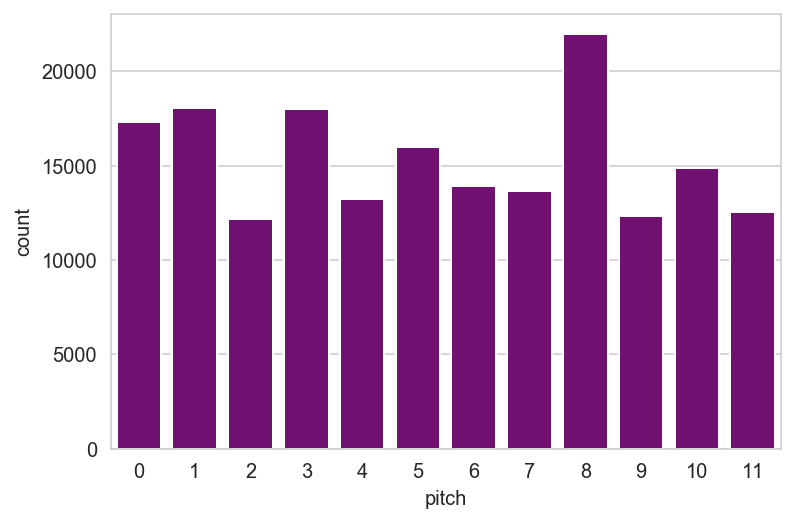

In [569]:
sns.set_style("whitegrid")
sns.barplot(x=dfchopinpitch_count['pitch'], y=dfchopinpitch_count['count'], color = 'purple')

In [570]:
chopin_keys = []
for i in ch_keys:
    chopin_keys.append(i.name)
    
chopin_key_count = Counter(chopin_keys)
chopin_key_count

Counter({'G minor': 8,
         'F major': 8,
         'A- major': 20,
         'F minor': 10,
         'C major': 11,
         'A minor': 13,
         'E major': 9,
         'C# minor': 14,
         'F# major': 9,
         'G# minor': 6,
         'E- major': 5,
         'C minor': 11,
         'B- minor': 10,
         'D minor': 4,
         'C# major': 12,
         'B major': 11,
         'G major': 6,
         'E- minor': 6,
         'E minor': 4,
         'D major': 5,
         'B minor': 2,
         'A major': 2,
         'F# minor': 6,
         'B- major': 4})

In [572]:
dfchopin_key = pd.DataFrame(list(chopin_key_count.items()), columns=['key', 'count'])
dfchopin_key

,key,count
0,G minor,8
1,F major,8
2,A- major,20
3,F minor,10
4,C major,11
5,A minor,13
6,E major,9
7,C# minor,14
8,F# major,9
9,G# minor,6


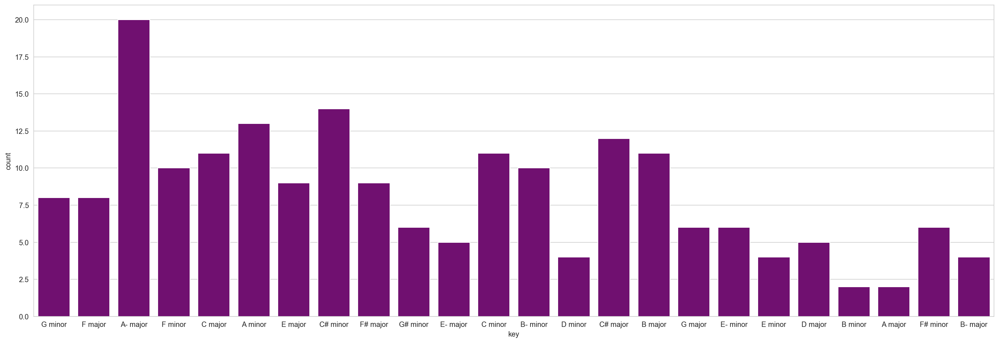

In [573]:
sns.set_style("whitegrid")
plt.figure(figsize=(24, 8))
sns.barplot(x=dfchopin_key['key'], y=dfchopin_key['count'], color = 'purple')

In [574]:
chopinset_count = Counter(chopin_sets)
chopinset_count

Counter({'<0>': 16114,
         '<037>': 8386,
         '<0258>': 1447,
         '<03>': 12688,
         '<05>': 9309,
         '<04>': 9679,
         '<02>': 3074,
         '<036>': 1640,
         '<026>': 2171,
         '<06>': 2746,
         '<015>': 153,
         '<01>': 638,
         '<014>': 71,
         '<025>': 1898,
         '<02358>': 15,
         '<016>': 168,
         '<012>': 8,
         '<0148>': 17,
         '<0137>': 89,
         '<013>': 135,
         '<0236>': 22,
         '<0369>': 207,
         '<027>': 319,
         '<0257>': 67,
         '<01368>': 51,
         '<024>': 103,
         '<0358>': 116,
         '<0145>': 1,
         '<048>': 122,
         '<0126>': 3,
         '<0157>': 74,
         '<01258>': 9,
         '<0158>': 59,
         '<0136>': 28,
         '<0135>': 10,
         '<0147>': 103,
         '<0237>': 44,
         '<02357>': 7,
         '<0125>': 13,
         '<0248>': 28,
         '<02469>': 26,
         '<0247>': 112,
         '<0347>': 19,
   

In [575]:
dfchopinset_count = pd.DataFrame(list(chopinset_count.items()), columns=['pitch_set', 'count']) 
dfchopinset_count

,pitch_set,count
0,<0>,16114
1,<037>,8386
2,<0258>,1447
3,<03>,12688
4,<05>,9309
...,...,...
59,<012369>,1
60,<0124>,1
61,<01247>,1
62,<013689>,1


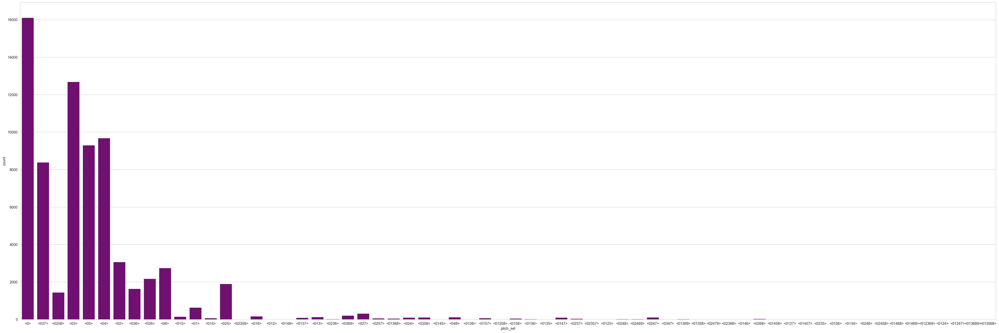

In [578]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfchopinset_count['pitch_set'], y=dfchopinset_count['count'], color = 'purple')

In [580]:
dfchopin_intv_vectors = pd.DataFrame(chopin_intv_vectors)
dfchopin_intv_vectors = dfchopin_intv_vectors.rename(columns={0: 'm2/M7', 1: 'M2/m7', 2: 'm3/M6', 3: 'M3/m6', 4: 'P4/P5', 5: 'Tri-tone'})
dfchopin_intv_vectors



,m2/M7,M2/m7,m3/M6,M3/m6,P4/P5,Tri-tone
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0
...,...,...,...,...,...,...
72127,0,1,1,0,1,0
72128,0,0,0,1,0,0
72129,0,0,0,1,0,0
72130,0,0,0,0,1,0


In [581]:
chopin_vectors = []
for i in chopin_intv_vectors:
    chopin_vectors.append(convert_vectors(i))
chopin_vector_count = Counter(chopin_vectors)

In [582]:
dfchopin_vectors = pd.DataFrame(list(chopin_vector_count.items()), columns=['interval_vector', 'count'])
dfchopin_vectors

,interval_vector,count
0,000000,16114
1,001110,8386
2,012111,1447
3,001000,12688
4,000010,9309
...,...,...
57,324222,1
58,221100,1
59,222121,1
60,224232,1


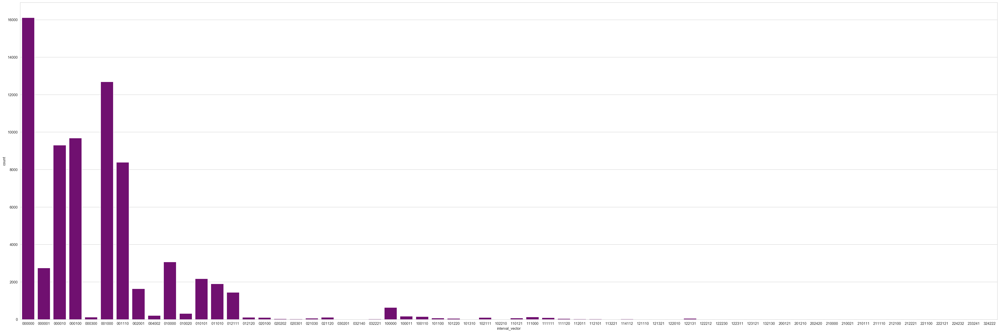

In [584]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfchopin_vectors['interval_vector'], y=dfchopin_vectors['count'], color = 'purple')

## Comparing Bach, Mozart, Beethoven and Chopin by Interval Vector

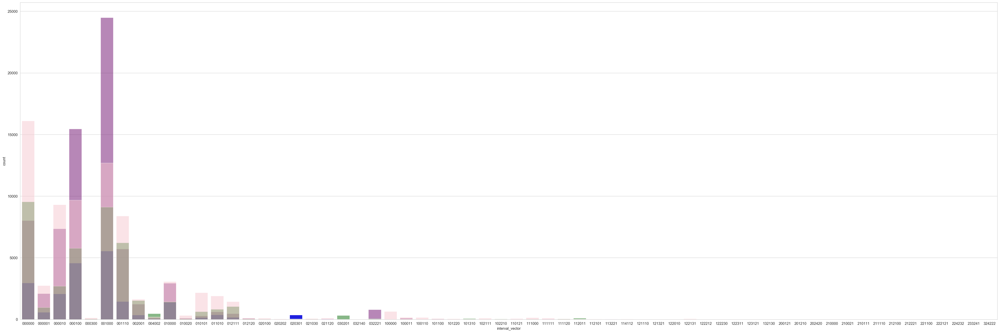

In [585]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfmozart_vectors['interval_vector'], y=dfmozart_vectors['count'], color = 'blue')
sns.barplot(x=dfbach_vectors['interval_vector'], y=dfbach_vectors['count'], color = 'purple', alpha = 0.5)
sns.barplot(x=dfbeethoven_vectors['interval_vector'], y=dfbeethoven_vectors['count'], color = 'green', alpha = 0.5)
sns.barplot(x=dfchopin_vectors['interval_vector'], y=dfchopin_vectors['count'], color = 'pink', alpha = 0.5)

## Comparing Bach, Mozart, Beethoven and Chopin by Pitch_Set

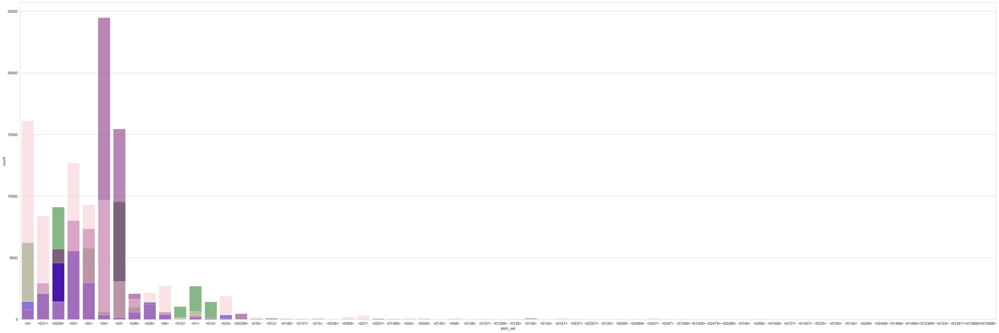

In [587]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfbeethovenset_count['pitch_set'], y=dfbeethovenset_count['count'], color = 'green', alpha = 0.5)
sns.barplot(x=dfmozartset_count['pitch_set'], y=dfmozartset_count['count'], color = 'blue')
sns.barplot(x=dfbachset_count['pitch_set'], y=dfbachset_count['count'], color = 'purple', alpha = 0.5)
sns.barplot(x=dfchopinset_count['pitch_set'], y=dfchopinset_count['count'], color = 'pink', alpha = 0.5)

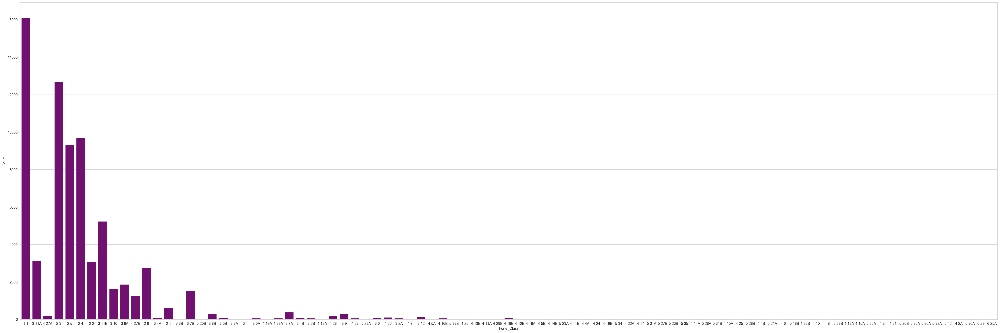

In [679]:
chopin_forte_count = Counter(chopin_forte_class)

df_cfc = pd.DataFrame(list(chopin_forte_count.items()), columns=['Forte_Class', 'Count'])

sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=df_cfc['Forte_Class'], y=df_cfc['Count'], color = 'purple')

## Debussy

In [588]:
Debussy_midi = '/Volumes/S190813/Music_Box/LTSM_Generative_Music/Debussy/midi_files/deb_clai.mid'

In [590]:
fs=100
midi_pretty_format = pretty_midi.PrettyMIDI(Debussy_midi)
piano_midi = midi_pretty_format.instruments[0] # Get the piano channels
piano_roll = piano_midi.get_piano_roll(fs=fs)

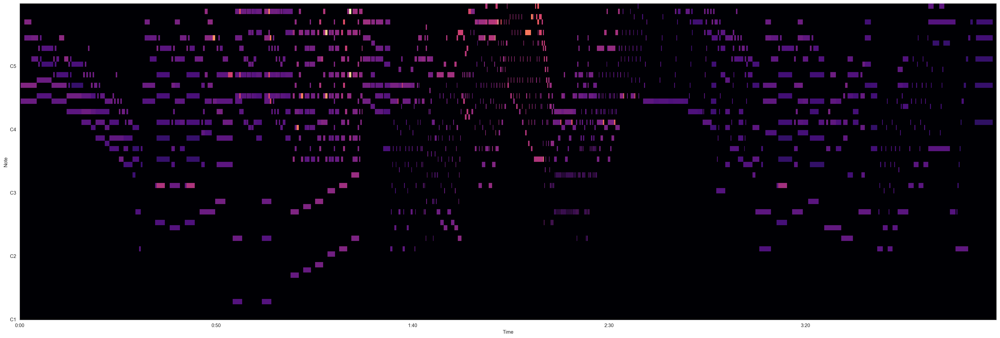

In [591]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(36, 12))
plot_piano_roll(midi_pretty_format, 24, 84)

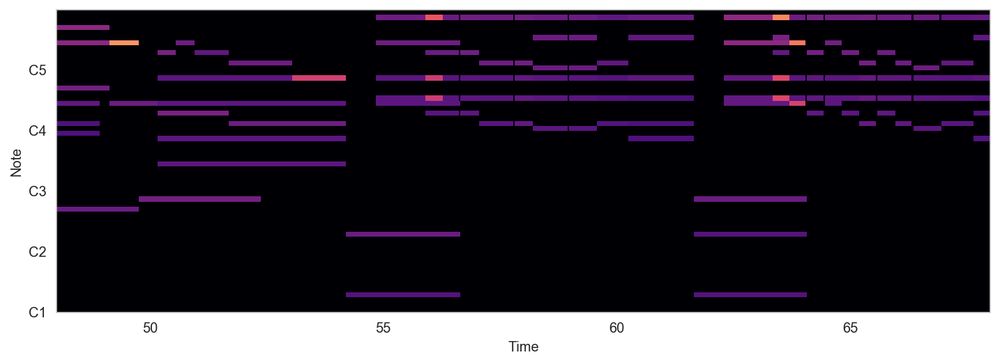

In [593]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(48,68);

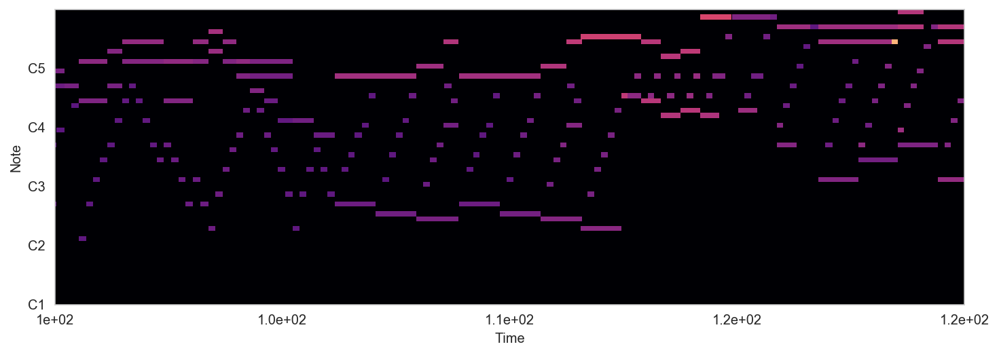

In [594]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(100,120);

In [595]:
Debussy = converter.parse(Debussy_midi)

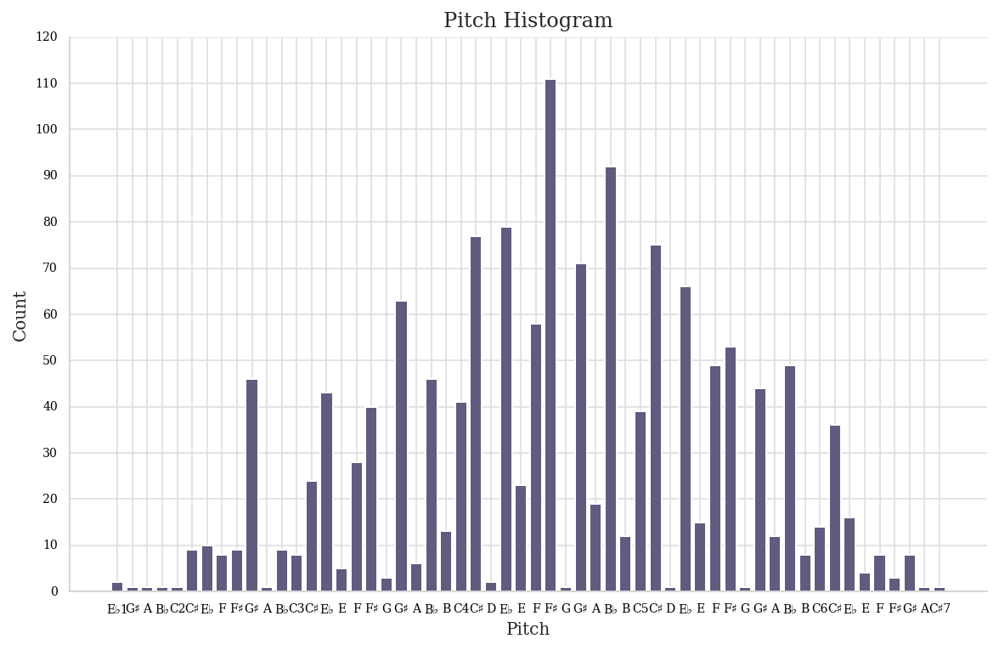

In [596]:
Debussy.plot('histogram', 'pitch')

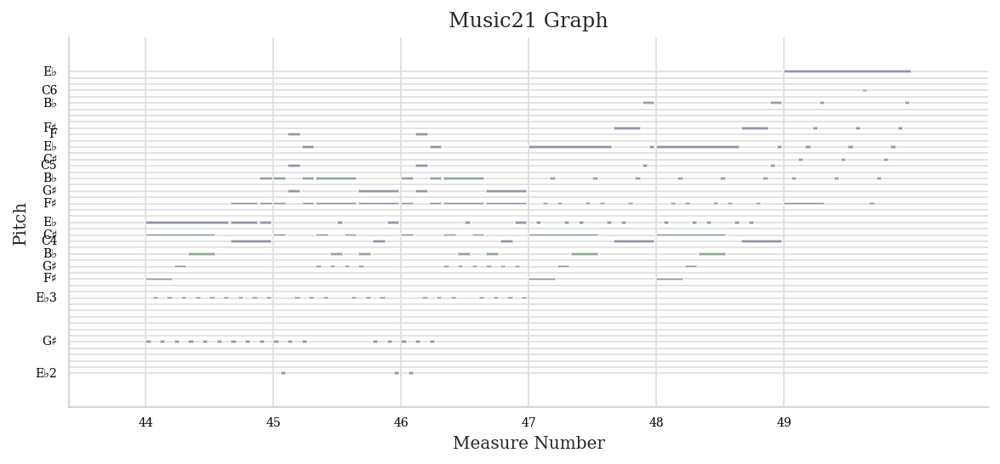

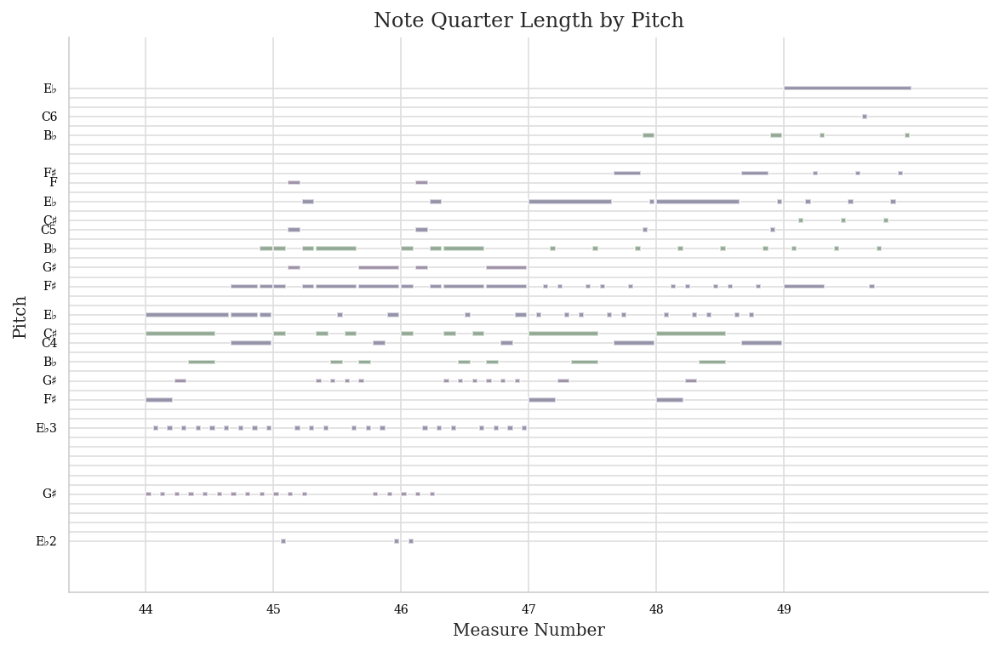

In [601]:
Debussy.measures(44,49).plot('horizontalbar', 'pitch')

In [602]:
Debussy.analyze('key')

<music21.key.Key of C# major>

In [603]:
d_note_name = []
d_notes = []
d_n_durations = []
d_n_offsets = []

d_chord_spelling = []
d_chords = []
d_c_durations = []
d_c_offsets = []

d_keys = []
    
for i,file in enumerate(glob.glob('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Debussy/midi_files/*.mid')):
    print(file)
    midi = converter.parse(file)
    key = midi.analyze('key')
    d_keys.append(key)
    print(key)
    notes_to_parse = midi.flat.notes
    for element in notes_to_parse:
        if isinstance(element, note.Note): # If it is single note
            d_note_name.append(element.pitch)
            d_notes.append(note_to_int(str(element.pitch))) # Append note's integer value to "notes" list.
            d_duration = str(element.duration)[27:-1] 
            d_n_durations.append(check_float(d_duration)) 
            d_n_offsets.append(element.offset)
            

        elif isinstance(element, chord.Chord): # If it is chord
            d_chord_spelling.append(element.pitchNames)
            d_chords.append('.'.join(str(note_to_int(str(n)))
                                  for n in element.pitches))
            d_duration = str(element.duration)[27:-1]
            d_c_durations.append(check_float(d_duration))
            d_c_offsets.append(element.offset)
            print(element)

/Volumes/S190813/Music_Box/LTSM_Generative_Music/Debussy/midi_files/deb_clai.mid
C# major
<music21.chord.Chord F4 G#4>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord C#5 F5>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord E-4 C#4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord B-3 C#4>
<music21.chord.Chord A3 C4>
<music21.chord.Chord G#3 C4>
<music21.chord.Chord G#3 F3>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord C#5 F5>
<music21.chord.Chord F#4 B-4>
<music21.chord.Chord C#4 B-3 F#3>
<music21.chord.Chord F2 C#3>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord F3 G#3>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord G#4 C#5 G#5>
<music21.chord.Chord F4

C# major
<music21.chord.Chord F4 G#4>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord F5 C#5>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord C5 E-5>
<music21.chord.Chord C#5 F5>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord C#5 B-4>
<music21.chord.Chord E-5 C5>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C5 G#4>
<music21.chord.Chord F#4 E-4 C#4>
<music21.chord.Chord F#4 C4 E-4>
<music21.chord.Chord E-4 B-3 C#4>
<music21.chord.Chord E-4 A3 C4>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord B-3 F3>
<music21.chord.Chord G#3 C4 F#3>
<music21.chord.Chord G#3 F3>
<music21.chord.Chord F4 G#4>
<music21.chord.Chord G#5 F5>
<music21.chord.Chord C#5 F5>
<music21.chord.Chord F#4 B-4 C#4 B-3 F#3>
<music21.chord.Chord F2 C#3>
<music21.chord.Chord C#5 C#4>
<music21.chord.Chord G#4 F3 G#3>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord G#4 C#5 G#5 F4 C#4>
<music21.chord.Chord C#5 F4 G#3 C#4>

d minor
<music21.chord.Chord D3 A3>
<music21.chord.Chord B3 F4>
<music21.chord.Chord C4 F3>
<music21.chord.Chord A4 D4>
<music21.chord.Chord B3 D3>
<music21.chord.Chord A4 F4 B3>
<music21.chord.Chord B3 D3>
<music21.chord.Chord F4 A4 C4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord C5 A4>
<music21.chord.Chord C5 A4 E4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord F#4 D4 E2>
<music21.chord.Chord D4 F#4 A4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord E4 G#4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord G#4 B4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord A4 C4 F3>
<music21.chord.Chord D5 F5>
<music21.chord.Chord E5 G5>
<music21.chord.Chord D5 F5>
<music21.chord.Chord C5 E5>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord F4 D4 G3>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B-4 D5>
<music21.chord.Chord C3 G3 E4>
<music21.chord.Chord A4 C5>
<music21.chord.Chord B-4 D5>
<musi

f# minor
<music21.chord.Chord F#4 G#4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord E5 G#5>
<music21.chord.Chord F#4 G#4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord E5 C#5>
<music21.chord.Chord G#3 D4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord E4 F#4>
<music21.chord.Chord F#5 F#4>
<music21.chord.Chord C#6 C#5>
<music21.chord.Chord B4 B5>
<music21.chord.Chord F#4 G#4>
<music21.chord.Chord F#5 A5 C6>
<music21.chord.Chord D4 F#4>


f# minor
<music21.chord.Chord C#5 A3>
<music21.chord.Chord F#4 G#4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord E5 G#5 E4>
<music21.chord.Chord F#4 G#4>
<music21.chord.Chord F#4 D4>
<music21.chord.Chord E5 C#5 G#3 D4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord A4 C#5>
<music21.chord.Chord C#4 G#3>
<music21.chord.Chord B3 D4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord C#5 A4>
<music21.chord.Chord B3 D4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord G#4 E4>
<music21.chord.Chord A4 F#4>
<music21.chord.Chord B4 G#4>
<music21.chord.Chord B4 G4>
<music21.chord.Chord F#4 A4>
<music21.chord.Chord E4 F#4>
<music21.chord.Chord F#5 F#4>
<music21.chord.Chord C#6 C#5>
<music21.chord.Chord B4 B5>
<music21.chord.Chord F#4 G#4>
<music21.chord.Chord F#5 A5 C6>
<music21.chord.Chord D4 F#4>
<music21.chord.Chor

F major
<music21.chord.Chord G4 B-4 D5>
<music21.chord.Chord D4 B-3 G3>
<music21.chord.Chord F2 C3>
<music21.chord.Chord F3 B-2>
<music21.chord.Chord B-2 F3 B-3>
<music21.chord.Chord D5 F4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord D5 B-4 G4>
<music21.chord.Chord D4 B-3 G3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord D4 B-3 E-3>
<music21.chord.Chord F2 C3 A3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord D5 F5>
<music21.chord.Chord D4 F4>
<music21.chord.Chord C5 E5>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D5 F5>
<music21.chord.Chord F4 A4>
<music21.chord.Chord C5 E5>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord E5 C5>
<music21.chord.Chord E4 G4>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord D4 F4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord C5 G4>
<music21.chord.Chord C4 E4>
<music21.chord.Chord D5 B-4>
<music21.chord.Chord B-3 F4>
<music21.chord.Chord C5 A4 E5>


F major
<music21.chord.Chord G4 B-4 D5 D4 B-3 G3>
<music21.chord.Chord C4 F2 C3>
<music21.chord.Chord D4 F3 B-2>
<music21.chord.Chord E4 C3>
<music21.chord.Chord D4 D3>
<music21.chord.Chord D4 B-2 F3 B-3>
<music21.chord.Chord D5 F4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord G5 E4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord E5 G4>
<music21.chord.Chord G5 A4>
<music21.chord.Chord F5 D4>
<music21.chord.Chord E5 E4>
<music21.chord.Chord D5 F4>
<music21.chord.Chord C5 E4>
<music21.chord.Chord D5 B-4 G4 D4 B-3 G3>
<music21.chord.Chord E-4 C4>
<music21.chord.Chord D4 B-3 E-3>
<music21.chord.Chord E-4 F2 C3 A3>
<music21.chord.Chord B-1 B-2>
<music21.chord.Chord D5 F5 D4 F4>
<music21.chord.Chord C5 E5 E4 G4>
<music21.chord.Chord D5 F5 F4 A4>
<music21.chord.Chord C5 E5 E4 G4>
<music21.chord.Chord D5 B-4 D4 F4>
<music21.chord.Chord E5 C5 E4 G4>
<music21.chord.Chord D5 B-4 D4 F4>
<music21.chord.Chord C5 G4 C4 E4>
<music21.chord.Chord C5 G4 C4 E4>
<music21.chord.Chord D5 B-4 B-3 F4>
<m

C major
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord C4 G4>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord G4 D5>
<music21.chord.Chord C4 G4>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord G4 D5>
<music21.chord.Chord E3 C3>
<music21.chord.Chord F2 A2>
<music21.chord.Chord B2 D3>
<music21.chord.Chord E3 C3>
<music21.chord.Chord G2 C2>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Debussy/midi_files/debussy_cc_1_format0.mid
C major
<music21.chord.Chord D4 E2>
<music21.chord.Chord E4 D2>
<music21.chord.Chord C4 C2>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord B-4 F#4>
<music21.chord.Chord G#4 F4>
<music21.chord.Chord C4 G4>
<music21.chord.Chord E-4 B-4>
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord G4 D5>
<music21.chord.Chord C4

c# minor
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.ch

c# minor
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4 C#5>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord B4 E4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord G#4 E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord E4 B4>
<mu

g minor
<music21.chord.Chord F#4 B-4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord F#4 B-4>
<music21.chord.Chord E-4 F#4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord C#4 E-4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord C#4 E-4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord C#4 E-4>
<music21.chord.Chord C4 E-4>
<music21.chord.Chord C#4 E-4>
<music21.chord.Chord C#5 E5>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord C#4 E4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord F#3 C#4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord G3 C#4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord F#3 C#4>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord C#4 B-3>
<music21.chord.Chord B-4 C#5>
<music21.chord.Chord G3 C#4>
<music21.chord.Chord A5 D5>
<music21.chord.Chord D5 A5>
<music21.chord.Chord A5 D5>
<music21.chord.Chord D5 A5>
/Volumes/S190813/Music_Box/LTSM_Generative_Music/Debussy/midi_files/debussy_cc_

b- minor
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord B-5 B-4>
<music21.chord.Chord G#5 G#4>
<music21.chord.Chord F5 F4>
<music21.chord.Chord E-5 E-4>
<music21.chord.Chord B4 B3>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord F4 F3>
<music21.chord.Chord E-4 E-3>
<music21.chord.Chord B3 B2>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord F3 F2>
<music21.chord.Chord E-3 E-2>
<music21.chord.Chord B2 B1>
<music21.chord.Chord G3 D3 B-2 B-1>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord E-3 B-3 G3 F3>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord B-3 E-3 G3 F3>
<music21.chord.Chord B-3 E-3>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord E-3 B-3 G3 F3>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord E-3 B-3 G3 F3>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord B-3 E-3 G3 F3>
<music21.chord.Chord B-3 E-3>
<music21.chord.Chord E-2 B-2>
<music21.chord.Chord E-3 B-3 G3 F3>
<mu

In [604]:
len(d_chord_spelling)

4662

## Abstracting Harmonic Material

In [605]:
Debussy_sets = []
Debussy_intv_vectors = []
Debussy_forte_class = []
for i in d_chord_spelling:
    Debussy_sets.append(chord.Chord(i).primeFormString)
    Debussy_intv_vectors.append(chord.Chord(i).intervalVector)
    Debussy_forte_class.append(chord.Chord(i).forteClass)

In [606]:
Debussy_sets

['<03>',
 '<03>',
 '<04>',
 '<03>',
 '<03>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<03>',
 '<04>',
 '<03>',
 '<04>',
 '<02>',
 '<03>',
 '<03>',
 '<03>',
 '<04>',
 '<03>',
 '<03>',
 '<03>',
 '<04>',
 '<04>',
 '<037>',
 '<04>',
 '<0>',
 '<03>',
 '<0>',
 '<05>',
 '<04>',
 '<04>',
 '<05>',
 '<04>',
 '<037>',
 '<0>',
 '<06>',
 '<0>',
 '<0>',
 '<026>',
 '<0>',
 '<05>',
 '<0>',
 '<0>',
 '<04>',
 '<0>',
 '<05>',
 '<037>',
 '<05>',
 '<037>',
 '<03>',
 '<037>',
 '<03>',
 '<037>',
 '<03>',
 '<037>',
 '<026>',
 '<026>',
 '<026>',
 '<026>',
 '<026>',
 '<026>',
 '<03>',
 '<037>',
 '<04>',
 '<037>',
 '<05>',
 '<0>',
 '<04>',
 '<0>',
 '<04>',
 '<05>',
 '<037>',
 '<05>',
 '<015>',
 '<05>',
 '<037>',
 '<03>',
 '<037>',
 '<05>',
 '<037>',
 '<03>',
 '<037>',
 '<02>',
 '<026>',
 '<03>',
 '<037>',
 '<04>',
 '<037>',
 '<0>',
 '<0>',
 '<05>',
 '<04>',
 '<0>',
 '<04>',
 '<03>',
 '<0>',
 '<0>',
 '<036>',
 '<036>',
 '<036>',
 '<036>',
 '<036>',
 '<036>',
 '<036>',
 '<036>',
 '<037>',
 '<037>',
 '<036>',

In [607]:
Debussy_intv_vectors

[[0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 1, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 1],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 1, 0, 1, 0, 1],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1,

In [608]:
Debussy_forte_class

['2-3',
 '2-3',
 '2-4',
 '2-3',
 '2-3',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-3',
 '2-4',
 '2-3',
 '2-4',
 '2-2',
 '2-3',
 '2-3',
 '2-3',
 '2-4',
 '2-3',
 '2-3',
 '2-3',
 '2-4',
 '2-4',
 '3-11B',
 '2-4',
 '1-1',
 '2-3',
 '1-1',
 '2-5',
 '2-4',
 '2-4',
 '2-5',
 '2-4',
 '3-11B',
 '1-1',
 '2-6',
 '1-1',
 '1-1',
 '3-8A',
 '1-1',
 '2-5',
 '1-1',
 '1-1',
 '2-4',
 '1-1',
 '2-5',
 '3-11A',
 '2-5',
 '3-11A',
 '2-3',
 '3-11B',
 '2-3',
 '3-11B',
 '2-3',
 '3-11B',
 '3-8B',
 '3-8B',
 '3-8B',
 '3-8B',
 '3-8B',
 '3-8B',
 '2-3',
 '3-11B',
 '2-4',
 '3-11B',
 '2-5',
 '1-1',
 '2-4',
 '1-1',
 '2-4',
 '2-5',
 '3-11A',
 '2-5',
 '3-4A',
 '2-5',
 '3-11A',
 '2-3',
 '3-11B',
 '2-5',
 '3-11A',
 '2-3',
 '3-11B',
 '2-2',
 '3-8B',
 '2-3',
 '3-11B',
 '2-4',
 '3-11A',
 '1-1',
 '1-1',
 '2-5',
 '2-4',
 '1-1',
 '2-4',
 '2-3',
 '1-1',
 '1-1',
 '3-10',
 '3-10',
 '3-10',
 '3-10',
 '3-10',
 '3-10',
 '3-10',
 '3-10',
 '3-11B',
 '3-11B',
 '3-10',
 '3-10',
 '1-1',
 '1-1',
 '2-3',
 '1-1',
 '1-1',
 '2-4',
 '2-5',
 '1-1',
 

In [609]:
Debussy_pitch_class = []
for i in d_note_name:
    Debussy_pitch_class.append(i.pitchClass)

In [610]:
Debussy_pitch_count = Counter(Debussy_pitch_class)

In [611]:
dfDebussypitch_count = pd.DataFrame(list(Debussy_pitch_count.items()), columns=['pitch', 'count']) 

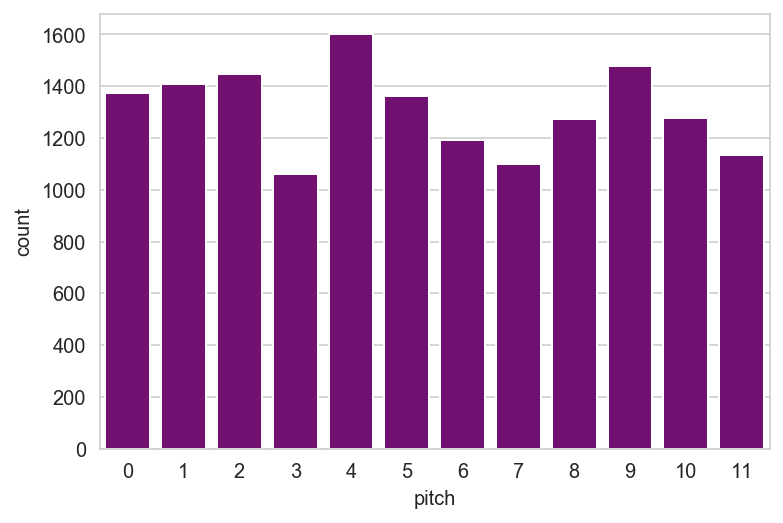

In [612]:
sns.set_style("whitegrid")
sns.barplot(x=dfDebussypitch_count['pitch'], y=dfDebussypitch_count['count'], color = 'purple')

In [613]:
Debussy_keys = []
for i in d_keys:
    Debussy_keys.append(i.name)
    
Debussy_key_count = Counter(Debussy_keys)
Debussy_key_count

Counter({'C# major': 2,
         'D minor': 2,
         'F# minor': 2,
         'F major': 2,
         'C major': 2,
         'C minor': 2,
         'C# minor': 2,
         'G minor': 2,
         'A major': 2,
         'B- minor': 2})

In [615]:
dfDebussy_key = pd.DataFrame(list(Debussy_key_count.items()), columns=['key', 'count'])
dfDebussy_key

,key,count
0,C# major,2
1,D minor,2
2,F# minor,2
3,F major,2
4,C major,2
5,C minor,2
6,C# minor,2
7,G minor,2
8,A major,2
9,B- minor,2


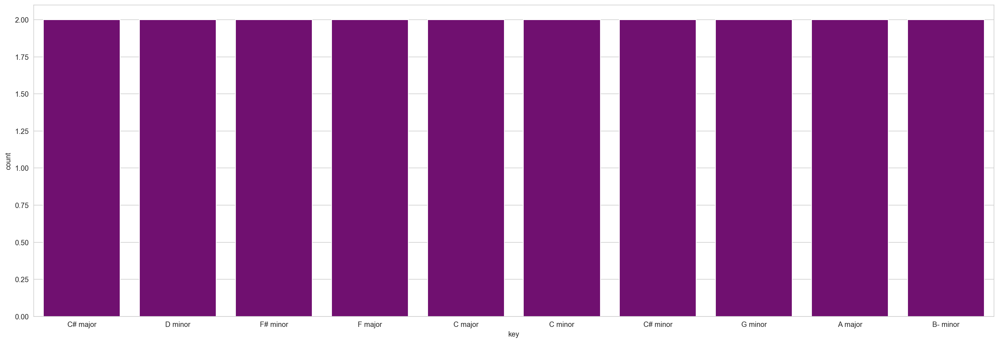

In [616]:
sns.set_style("whitegrid")
plt.figure(figsize=(24, 8))
sns.barplot(x=dfDebussy_key['key'], y=dfDebussy_key['count'], color = 'purple')

In [617]:
Debussyset_count = Counter(Debussy_sets)
Debussyset_count

Counter({'<03>': 879,
         '<04>': 639,
         '<02>': 448,
         '<037>': 790,
         '<0>': 430,
         '<05>': 858,
         '<06>': 28,
         '<026>': 62,
         '<015>': 38,
         '<036>': 86,
         '<025>': 153,
         '<0258>': 56,
         '<0358>': 50,
         '<0369>': 5,
         '<024>': 9,
         '<0158>': 15,
         '<016>': 2,
         '<0137>': 2,
         '<0136>': 3,
         '<0247>': 37,
         '<048>': 6,
         '<02479>': 2,
         '<027>': 43,
         '<0125>': 1,
         '<01>': 7,
         '<0147>': 1,
         '<01369>': 3,
         '<0257>': 1,
         '<02469>': 1,
         '<02368>': 2,
         '<01368>': 3,
         '<01357>': 2})

In [618]:
dfDebussyset_count = pd.DataFrame(list(Debussyset_count.items()), columns=['pitch_set', 'count']) 
dfDebussyset_count

,pitch_set,count
0,<03>,879
1,<04>,639
2,<02>,448
3,<037>,790
4,<0>,430
5,<05>,858
6,<06>,28
7,<026>,62
8,<015>,38
9,<036>,86


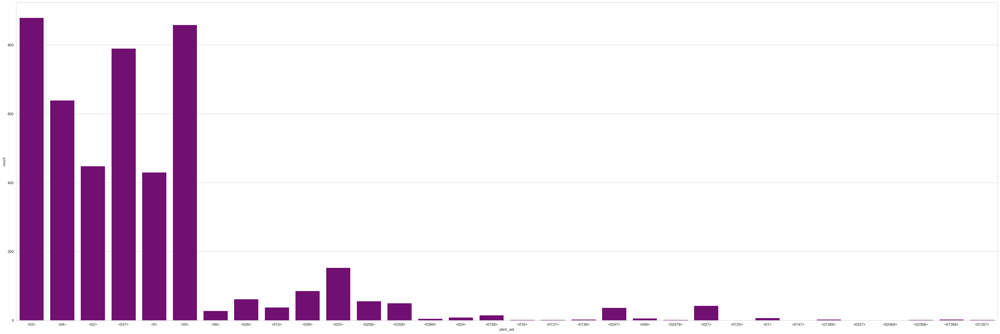

In [619]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfDebussyset_count['pitch_set'], y=dfDebussyset_count['count'], color = 'purple')

In [620]:
dfDebussy_intv_vectors = pd.DataFrame(Debussy_intv_vectors)
dfDebussy_intv_vectors = dfDebussy_intv_vectors.rename(columns={0: 'm2/M7', 1: 'M2/m7', 2: 'm3/M6', 3: 'M3/m6', 4: 'P4/P5', 5: 'Tri-tone'})
dfDebussy_intv_vectors



,m2/M7,M2/m7,m3/M6,M3/m6,P4/P5,Tri-tone
0,0,0,1,0,0,0
1,0,0,1,0,0,0
2,0,0,0,1,0,0
3,0,0,1,0,0,0
4,0,0,1,0,0,0
...,...,...,...,...,...,...
4657,0,0,0,0,0,0
4658,0,0,0,0,0,0
4659,0,0,0,0,0,0
4660,0,0,0,0,0,0


In [621]:
Debussy_vectors = []
for i in Debussy_intv_vectors:
    Debussy_vectors.append(convert_vectors(i))
Debussy_vector_count = Counter(Debussy_vectors)

In [622]:
dfDebussy_vectors = pd.DataFrame(list(Debussy_vector_count.items()), columns=['interval_vector', 'count'])
dfDebussy_vectors

,interval_vector,count
0,001000,879
1,000100,639
2,010000,448
3,001110,790
4,000000,430
5,000010,858
6,000001,28
7,010101,62
8,100110,38
9,002001,86


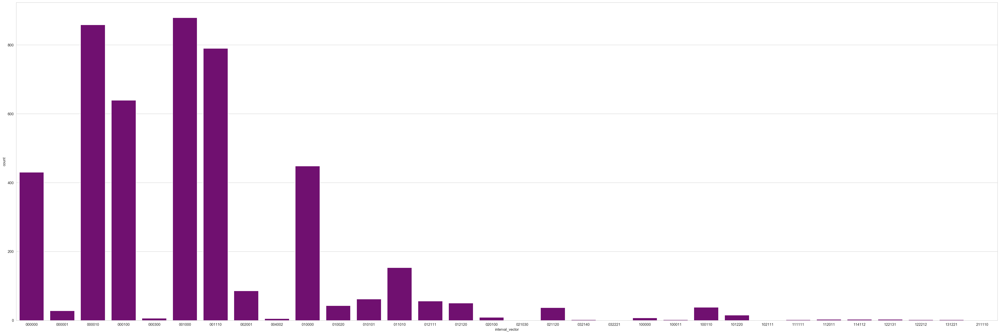

In [623]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfDebussy_vectors['interval_vector'], y=dfDebussy_vectors['count'], color = 'purple')

## Comparing Bach, Mozart, Beethoven, Chopin and Debussy by Pitch_Set

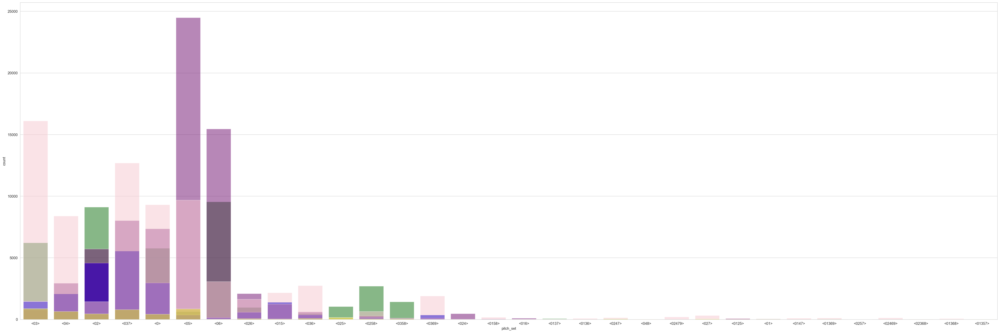

In [689]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfbeethovenset_count['pitch_set'], y=dfbeethovenset_count['count'], color = 'green', alpha = 0.5)
sns.barplot(x=dfmozartset_count['pitch_set'], y=dfmozartset_count['count'], color = 'blue')
sns.barplot(x=dfbachset_count['pitch_set'], y=dfbachset_count['count'], color = 'purple', alpha = 0.5)
sns.barplot(x=dfchopinset_count['pitch_set'], y=dfchopinset_count['count'], color = 'pink', alpha = 0.5)
sns.barplot(x=dfDebussyset_count['pitch_set'], y=dfDebussyset_count['count'], color = 'yellow', alpha = 0.5)

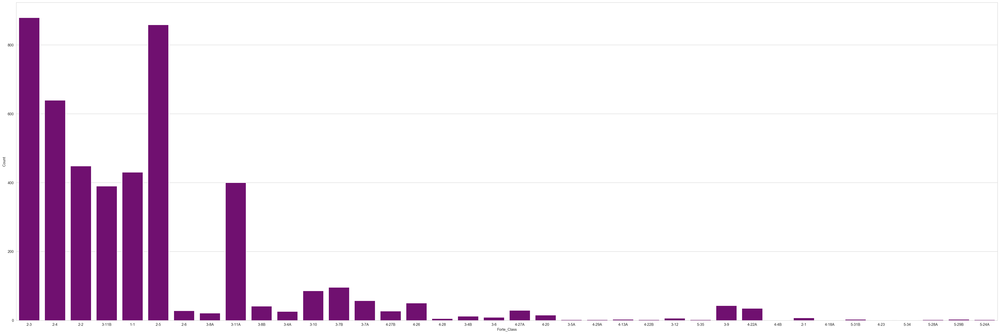

In [680]:
Debussy_forte_count = Counter(Debussy_forte_class)

df_defc = pd.DataFrame(list(Debussy_forte_count.items()), columns=['Forte_Class', 'Count'])

sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=df_defc['Forte_Class'], y=df_defc['Count'], color = 'purple')

## Ravel

In [626]:
ravel_midi = '/Volumes/S190813/Music_Box/LTSM_Generative_Music/Ravel/midi_files/ravel_miroirs_1.mid'

In [627]:
fs=100
midi_pretty_format = pretty_midi.PrettyMIDI(ravel_midi)
piano_midi = midi_pretty_format.instruments[0] # Get the piano channels
piano_roll = piano_midi.get_piano_roll(fs=fs)

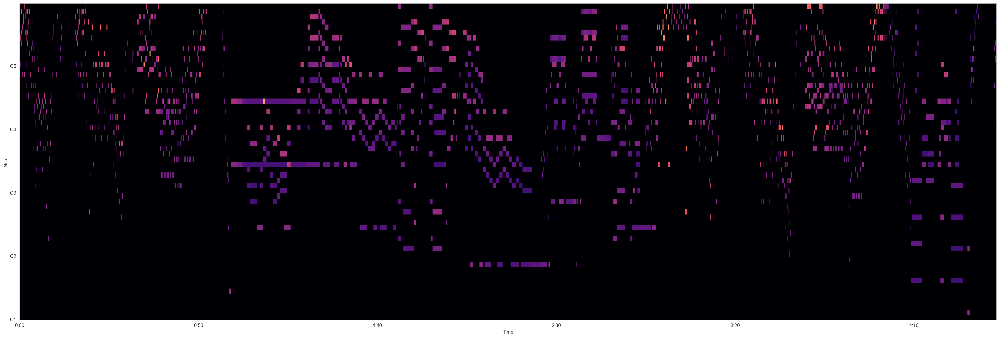

In [628]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(36, 12))
plot_piano_roll(midi_pretty_format, 24, 84)

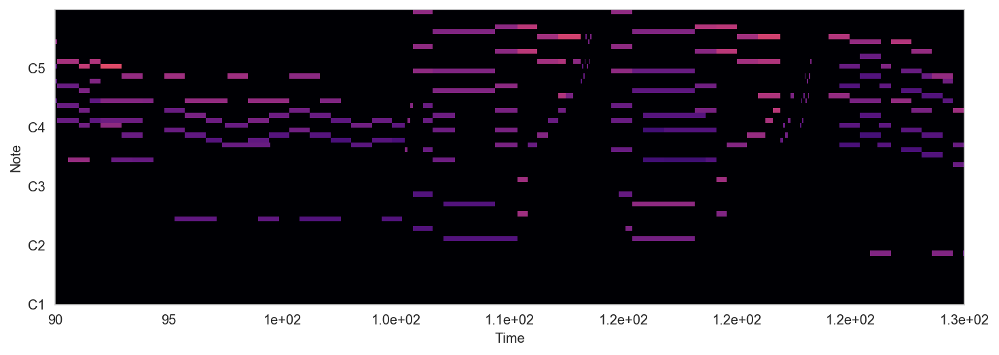

In [633]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(90,130);

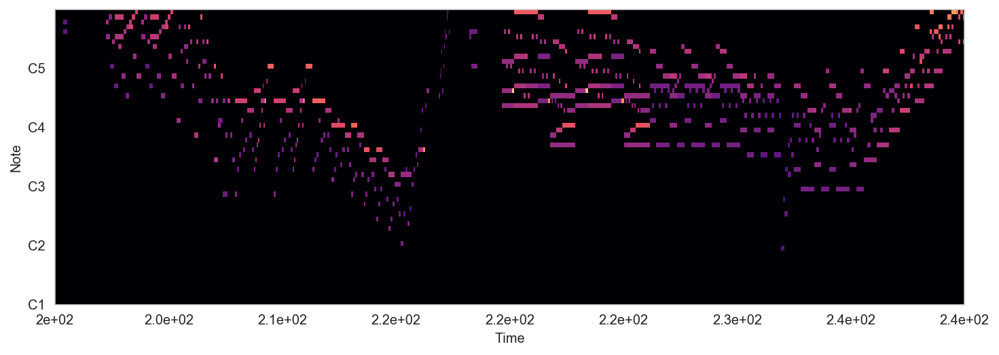

In [635]:
# zooming in to a 20 second frame
plt.figure(figsize=(12, 4))
plot_piano_roll(midi_pretty_format, 24, 84)
ymin, ymax = plt.ylim()
plt.xlim(200,240);

In [637]:
ravel = converter.parse(ravel_midi)

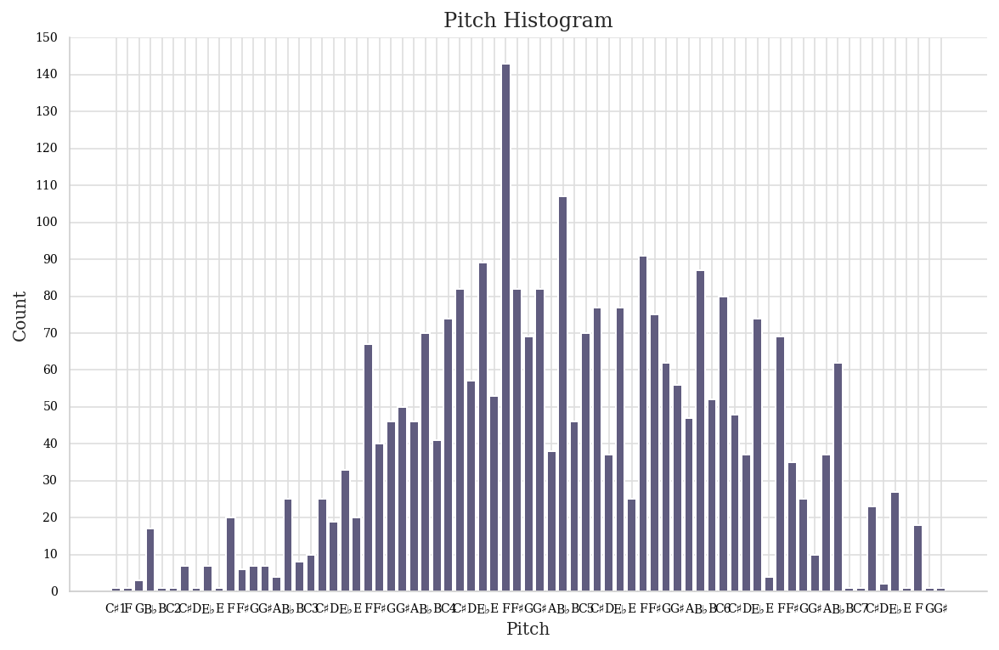

In [638]:
ravel.plot('histogram', 'pitch')

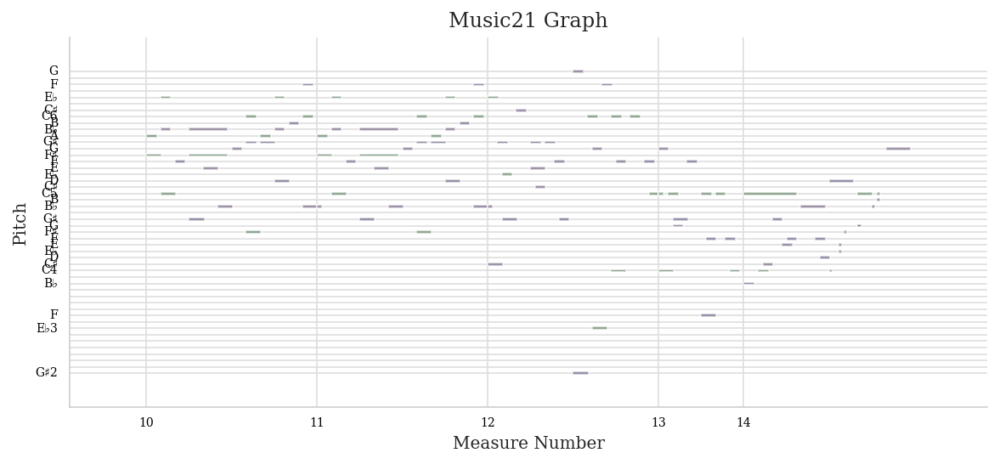

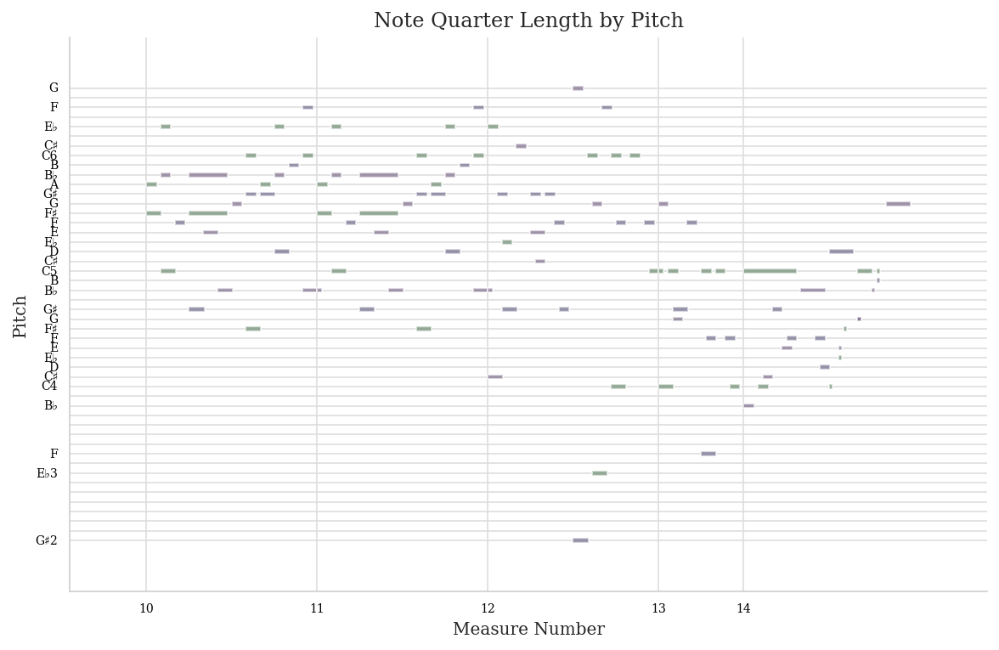

In [640]:
ravel.measures(10,14).plot('horizontalbar', 'pitch')

In [641]:
ravel.analyze('key')

<music21.key.Key of b- minor>

In [657]:
r_note_name = []
r_notes = []
r_n_durations = []
r_n_offsets = []

r_chord_spelling = []
r_chords = []
r_c_durations = []
r_c_offsets = []

r_keys = []
    
for i,file in enumerate(glob.glob('/Volumes/S190813/Music_Box/LTSM_Generative_Music/Ravel/midi_files/*.mid')):
    print(file)
    midi = converter.parse(file)
    key = midi.analyze('key')
    r_keys.append(key)
    print(key)
    notes_to_parse = midi.flat.notes
    for element in notes_to_parse:
        if isinstance(element, note.Note): # If it is single note
            r_note_name.append(element.pitch)
            r_notes.append(note_to_int(str(element.pitch))) # Append note's integer value to "notes" list.
            r_duration = str(element.duration)[27:-1] 
            r_n_durations.append(check_float(r_duration)) 
            r_n_offsets.append(element.offset)
            

        elif isinstance(element, chord.Chord): # If it is chord
            r_chord_spelling.append(element.pitchNames)
            r_chords.append('.'.join(str(note_to_int(str(n)))
                                  for n in element.pitches))
            r_duration = str(element.duration)[27:-1]
            r_c_durations.append(check_float(r_duration))
            r_c_offsets.append(element.offset)
            print(element)

/Volumes/S190813/Music_Box/LTSM_Generative_Music/Ravel/midi_files/rav_eau.mid
c# minor
<music21.chord.Chord B4 E4>
<music21.chord.Chord G#4 E5>
<music21.chord.Chord B5 E5>
<music21.chord.Chord A4 E5>
<music21.chord.Chord B4 E4>
<music21.chord.Chord G#4 E5>
<music21.chord.Chord B5 E5>
<music21.chord.Chord A4 E5>
<music21.chord.Chord B4 E4>
<music21.chord.Chord G#4 E5>
<music21.chord.Chord B4 E5>
<music21.chord.Chord E5 B5>
<music21.chord.Chord E5 A4>
<music21.chord.Chord C#5 A5>
<music21.chord.Chord E6 A5>
<music21.chord.Chord E5 A4>
<music21.chord.Chord C#5 A5>
<music21.chord.Chord E6 A5>
<music21.chord.Chord E5 A4>
<music21.chord.Chord C#5 A5>
<music21.chord.Chord F#4 C5>
<music21.chord.Chord D4 A4>
<music21.chord.Chord G#4 B-3>
<music21.chord.Chord G3 F4>
<music21.chord.Chord E3 D4>
<music21.chord.Chord C#3 B3>
<music21.chord.Chord B-2 G#3>
<music21.chord.Chord B-3 G#4>
<music21.chord.Chord F4 G4>
<music21.chord.Chord C#3 B3>
<music21.chord.Chord B-2 G#3>
<music21.chord.Chord B-3 G#4

e- minor
<music21.chord.Chord E-2 F3 B-2>
<music21.chord.Chord F#3 C#4>
<music21.chord.Chord F#2 B1 C#3>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord G#2 E-3 C#2>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord B-3 G#2 E-3>
<music21.chord.Chord F4 B-3>
<music21.chord.Chord E-2 B-2 F3>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord C#3 B1 F#2>
<music21.chord.Chord G#3 E-4>
<music21.chord.Chord C#2 G#2 E-3>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord B3 E-4>
<music21.chord.Chord G#2 E-3 B-3>
<music21.chord.Chord F4 B-3>
<music21.chord.Chord E-2 B-2 F3>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord B-2 F3 E-2>
<music21.chord.Chord C#4 F#3>
<music21.chord.Chord C#3 B1 F#2>
<music21.chord.Chord E-4 G#3>
<music21.chord.Chord G#2 E-3 C#2>
<music21.chord.Chord B-3 B-4>
<music21.chord.Chord E-4 B3>
<music21.chord.Chord G#2 E-3 B-3>
<music21.chord.Chord F4 B-3>
<music21.chord.Chord E-2 B-2 F3>
<music21.chord.Chor

g# minor
<music21.chord.Chord C#5 G#5 F5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord G#5 F5 C#5>
<music21.chord.Chord C#5 G#5 F5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord F5 G#5 C#5>
<music21.chord.Chord F5 C#5 G#5>
<music21.chord.Chord F5 C#5 G#5>
<music21.chord.Chord F5 G#5 C#5>
<music21.chord.Chord G#5 C#5 F5>
<music21.chord.Chord F5 G#5 C#5>
<music21.chord.Chord G#5 F5 C#5>
<music21.chord.Chord C#5 G#5 F5>
<music21.chord.Chord F5 C#5 G#5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord G#5 F5 C#5>
<music21.chord.Chord G#5 F5 C#5>
<music21.chord.Chord F5 C#5 G#5>
<music21.chord.Chord C#5 G#5 F5>
<music21.chord.Chord G#5 C#5 F5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord C#5 G#5 F5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord G#5 F5 C#5>
<music21.chord.Chord C#5 F5 G#5>
<music21.chord.Chord F5 C#5 G#5>
<

c# minor
<music21.chord.Chord D3 E3 G#3 B3 E4>
<music21.chord.Chord D3 E3 G#3 B3>
<music21.chord.Chord D2 E2 G#2 B2 E3>
<music21.chord.Chord D2 E2 G#2 B2>
<music21.chord.Chord E1 D1 G1>
<music21.chord.Chord D2 E2 G2>
<music21.chord.Chord D3 E3 G3>
<music21.chord.Chord D4 E4 G4>
<music21.chord.Chord D5 E5 G5>
<music21.chord.Chord D6 E6 G6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 E6 D6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 D6 E6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 E6 D6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 D6 E6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 E6 D6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 D6 E6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 E6 D6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 D6 E6>
<music21.chord.Chord G#5 E-6 G6>
<music21.chord.Chord E7 D7 G#6 E6 D6>
<music21.chord.Chord

<music21.chord.Chord F#3 B-3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord E-3 G#2>
<music21.chord.Chord C4 G#3>
<music21.chord.Chord G3 B3>
<music21.chord.Chord B3 G3>
<music21.chord.Chord G#2 E-3>
<music21.chord.Chord F#3 B-3>
<music21.chord.Chord F3 A3>
<music21.chord.Chord E3 G#3>
<music21.chord.Chord A4 G4>
<music21.chord.Chord A4 G4>
<music21.chord.Chord C#5 F#5>
<music21.chord.Chord G4 A4>
<music21.chord.Chord C#5 F#5>
<music21.chord.Chord G4 A4>
<music21.chord.Chord F4 G4 B-4>
<music21.chord.Chord F4 G4 B-4>
<music21.chord.Chord B-5 D6 B-6>
<music21.chord.Chord B-6 D6 B-5>
<music21.chord.Chord G#4 G#3>
<music21.chord.Chord B-4 B-3>
<music21.chord.Chord D4 F4 F3>
<music21.chord.Chord B-4 D5 B-5>
<music21.chord.Chord B-5 D5 B-4>
<music21.chord.Chord G#3 G#2>
<music21.chord.Chord B-3 B-2>
<music21.chord.Chord D3 F3 F2>
<music21.chord.Chord D5 D6 B5>
<music21.chord.Chord E6 C#6 E5>
<music21.chord.Chord B3 G3>
<music21.chord.Chord F#3 B-3>
<music21.c

<music21.chord.Chord B-5 G#5>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord E6 D6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord E6 D6>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord E6 D6>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord E6 D6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord E6 D6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord E6 D6>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord E6 D6>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord E6 D6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord E6 D6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord E6 D6>
<music21.chord.Chord F6 E-6>
<music21.chord.Chord B-5 G#5>
<music21.chord.Chord E6 D6>
<music21.chor

b- minor
<music21.chord.Chord E-6 B-5>
<music21.chord.Chord B-5 F#5>
<music21.chord.Chord C6 G#5>
<music21.chord.Chord E-6 B-5>
<music21.chord.Chord F6 C6>
<music21.chord.Chord E-6 B-5>
<music21.chord.Chord B-5 F#5>
<music21.chord.Chord C6 G#5>
<music21.chord.Chord E-6 B-5>
<music21.chord.Chord F6 C6>
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord B4 F#4>
<music21.chord.Chord C#5 F#4>
<music21.chord.Chord B4 F#4>
<music21.chord.Chord E4 B4>
<music21.chord.Chord C#4 A4>
<music21.chord.Chord F7 C#7>
<music21.chord.Chord E-7 C#7 C#6 E-6>
<music21.chord.Chord E-5 C#5>
<music21.chord.Chord F6 G6>
<music21.chord.Chord G5 F5>
<music21.chord.Chord E-6 C#6>
<music21.chord.Chord C#5 E-5>
<music21.chord.Chord A5 G5>
<music21.chord.Chord E-6 B-5>
<music21.chord.Chord B-5 F#5>
<music21.chord.Chord C6 G#5>
<music21.chord.Chord E-6 B-5>
<music21.chord.Chord F6 C6>
<music21.chord.Chord E-6 B-5>
<music21.chord.Chord B-5 F#5>
<music21.chord.Chord C6 G#5>
<music21.chord.Chord E-6 B-5>
<music21.chord.

<music21.chord.Chord F3 G3>
<music21.chord.Chord G3 B-3>
<music21.chord.Chord G2 G1>
<music21.chord.Chord C#4 F4>
<music21.chord.Chord C#4 F4>
<music21.chord.Chord B-3 C#4>
<music21.chord.Chord G2 C#2 C#3 G1>
<music21.chord.Chord E-4 E-6 B-5>
<music21.chord.Chord F3 B-3>
<music21.chord.Chord C#4 F4 F6 C#6>
<music21.chord.Chord C#1 C#2>
<music21.chord.Chord G4 F4 C#4>
<music21.chord.Chord F5 C#5 G#4>
<music21.chord.Chord A4 G4>
<music21.chord.Chord B-4 C#5 F5>
<music21.chord.Chord B4 A4 F4>
<music21.chord.Chord A5 F5 C5>
<music21.chord.Chord C#5 B4>
<music21.chord.Chord A5 F5 D5>
<music21.chord.Chord A4 C#5 E-5>
<music21.chord.Chord C#6 A5 E5>
<music21.chord.Chord F5 E-5>
<music21.chord.Chord C#6 A5 F#5>
<music21.chord.Chord G5 F5 C#5>
<music21.chord.Chord F6 C#6 G#5>
<music21.chord.Chord A5 G5>
<music21.chord.Chord B-5 C#6 F6>
<music21.chord.Chord B5 A5 F5>
<music21.chord.Chord A6 F6 C6>
<music21.chord.Chord C#6 B5>
<music21.chord.Chord A6 F6 D6>
<music21.chord.Chord A5 C#6 E-6>
<music

In [658]:
len(r_chord_spelling)

4125

## Abstracting Harmonic Material

In [659]:
ravel_sets = []
ravel_intv_vectors = []
ravel_forte_class = []
for i in r_chord_spelling:
    ravel_sets.append(chord.Chord(i).primeFormString)
    ravel_intv_vectors.append(chord.Chord(i).intervalVector)
    ravel_forte_class.append(chord.Chord(i).forteClass)

In [660]:
ravel_sets

['<05>',
 '<04>',
 '<05>',
 '<05>',
 '<05>',
 '<04>',
 '<05>',
 '<05>',
 '<05>',
 '<04>',
 '<05>',
 '<05>',
 '<05>',
 '<04>',
 '<05>',
 '<05>',
 '<04>',
 '<05>',
 '<05>',
 '<04>',
 '<06>',
 '<05>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<02>',
 '<026>',
 '<026>',
 '<04>',
 '<026>',
 '<027>',
 '<037>',
 '<05>',
 '<05>',
 '<05>',
 '<037>',
 '<05>',
 '<05>',
 '<05>',
 '<037>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<06>',
 '<06>',
 '<03>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<04>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<05>',
 '<

In [661]:
ravel_intv_vectors

[[0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 1],
 [0, 0, 0, 0, 1, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0],
 [0, 1, 0, 1, 0, 1],
 [0, 1, 0, 1, 0, 1],
 [0, 0, 0, 1, 0, 0],
 [0, 1, 0, 1, 0, 1],
 [0, 1, 0, 0, 2, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 0, 0, 1, 0],
 [0, 0, 1, 1, 1, 0],
 [0, 0, 0, 0,

In [662]:
ravel_forte_class

['2-5',
 '2-4',
 '2-5',
 '2-5',
 '2-5',
 '2-4',
 '2-5',
 '2-5',
 '2-5',
 '2-4',
 '2-5',
 '2-5',
 '2-5',
 '2-4',
 '2-5',
 '2-5',
 '2-4',
 '2-5',
 '2-5',
 '2-4',
 '2-6',
 '2-5',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '2-2',
 '3-8A',
 '3-8A',
 '2-4',
 '3-8A',
 '3-9',
 '3-11B',
 '2-5',
 '2-5',
 '2-5',
 '3-11B',
 '2-5',
 '2-5',
 '2-5',
 '3-11B',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-6',
 '2-6',
 '2-3',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-4',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-5',
 '2-4',
 '2-2',
 '2-4',
 '2-5',
 '2-4',
 '2-2',
 '2-2',

In [663]:
ravel_pitch_class = []
for i in r_note_name:
    ravel_pitch_class.append(i.pitchClass)

In [664]:
ravel_pitch_count = Counter(ravel_pitch_class)

In [665]:
dfravelpitch_count = pd.DataFrame(list(ravel_pitch_count.items()), columns=['pitch', 'count']) 

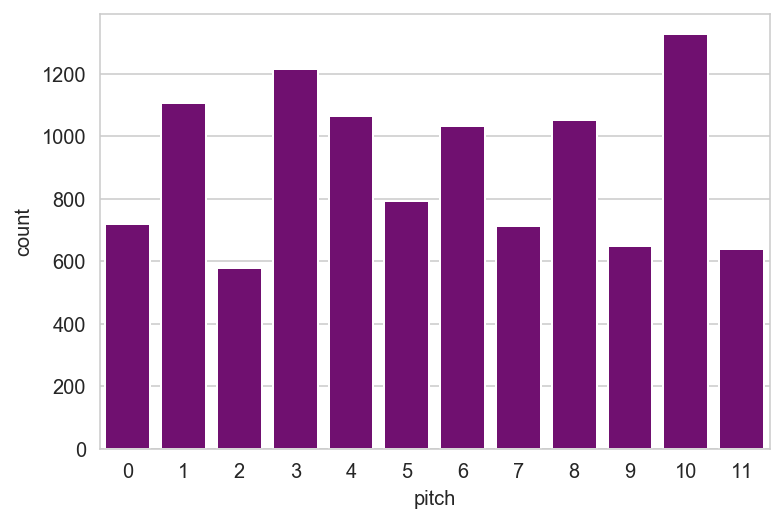

In [666]:
sns.set_style("whitegrid")
sns.barplot(x=dfravelpitch_count['pitch'], y=dfravelpitch_count['count'], color = 'purple')

In [667]:
ravel_keys = []
for i in r_keys:
    ravel_keys.append(i.name)
    
ravel_key_count = Counter(ravel_keys)
ravel_key_count

Counter({'C# minor': 2, 'E- minor': 1, 'G# minor': 1, 'B- minor': 1})

In [668]:
dfravel_key = pd.DataFrame(list(ravel_key_count.items()), columns=['key', 'count'])
dfravel_key

,key,count
0,C# minor,2
1,E- minor,1
2,G# minor,1
3,B- minor,1


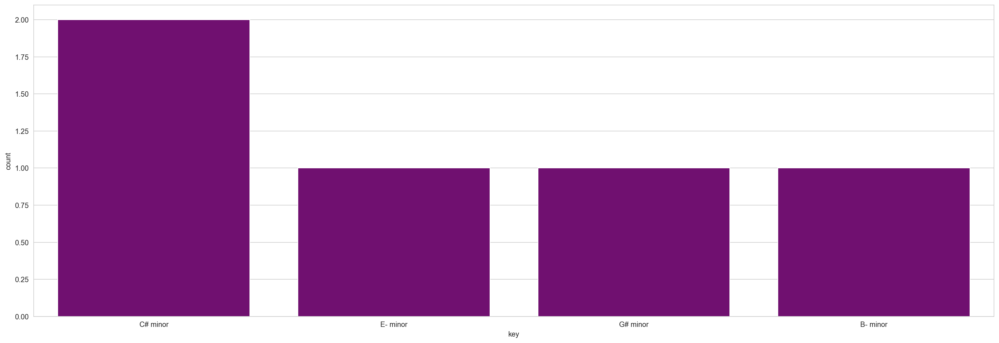

In [669]:
sns.set_style("whitegrid")
plt.figure(figsize=(24, 8))
sns.barplot(x=dfravel_key['key'], y=dfravel_key['count'], color = 'purple')

In [670]:
ravelset_count = Counter(ravel_sets)
ravelset_count

Counter({'<05>': 720,
         '<04>': 645,
         '<06>': 109,
         '<02>': 545,
         '<026>': 175,
         '<027>': 33,
         '<037>': 570,
         '<03>': 461,
         '<0>': 411,
         '<025>': 83,
         '<036>': 94,
         '<016>': 16,
         '<0247>': 25,
         '<015>': 90,
         '<0246>': 7,
         '<048>': 11,
         '<0248>': 17,
         '<0148>': 2,
         '<0258>': 39,
         '<0237>': 3,
         '<0358>': 32,
         '<0137>': 3,
         '<0136>': 1,
         '<01>': 7,
         '<014>': 10,
         '<0268>': 3,
         '<024>': 7,
         '<0146>': 2,
         '<013>': 3,
         '<0147>': 1})

In [671]:
dfravelset_count = pd.DataFrame(list(ravelset_count.items()), columns=['pitch_set', 'count']) 
dfravelset_count

,pitch_set,count
0,<05>,720
1,<04>,645
2,<06>,109
3,<02>,545
4,<026>,175
5,<027>,33
6,<037>,570
7,<03>,461
8,<0>,411
9,<025>,83


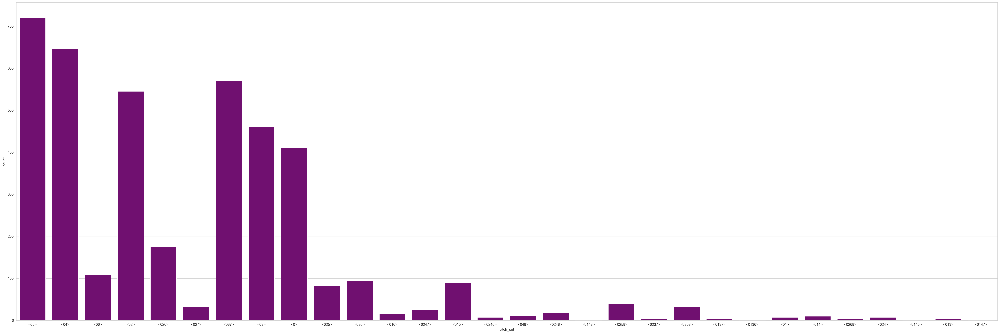

In [672]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfravelset_count['pitch_set'], y=dfravelset_count['count'], color = 'purple')

In [673]:
dfravel_intv_vectors = pd.DataFrame(ravel_intv_vectors)
dfravel_intv_vectors = dfravel_intv_vectors.rename(columns={0: 'm2/M7', 1: 'M2/m7', 2: 'm3/M6', 3: 'M3/m6', 4: 'P4/P5', 5: 'Tri-tone'})
dfravel_intv_vectors




,m2/M7,M2/m7,m3/M6,M3/m6,P4/P5,Tri-tone
0,0,0,0,0,1,0
1,0,0,0,1,0,0
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,0,0,0,0,1,0
...,...,...,...,...,...,...
4120,0,0,1,1,1,0
4121,0,1,0,0,0,0
4122,0,0,1,1,1,0
4123,0,0,1,0,0,0


In [674]:
ravel_vectors = []
for i in ravel_intv_vectors:
    ravel_vectors.append(convert_vectors(i))
ravel_vector_count = Counter(ravel_vectors)

In [675]:
dfravel_vectors = pd.DataFrame(list(ravel_vector_count.items()), columns=['interval_vector', 'count'])
dfravel_vectors

,interval_vector,count
0,000010,720
1,000100,645
2,000001,109
3,010000,545
4,010101,175
5,010020,33
6,001110,570
7,001000,461
8,000000,411
9,011010,83


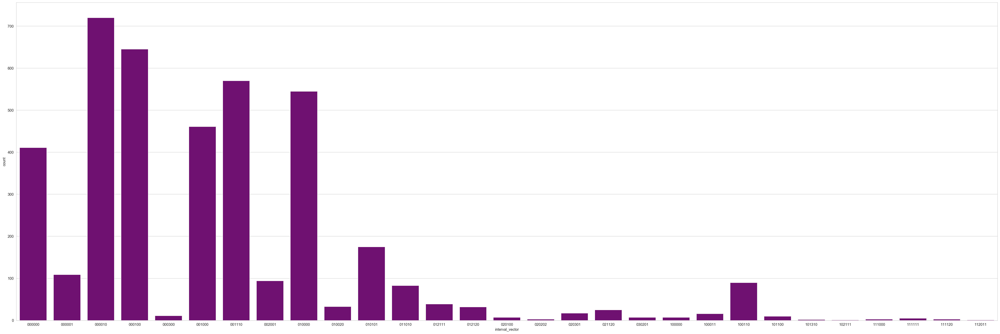

In [676]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfravel_vectors['interval_vector'], y=dfravel_vectors['count'], color = 'purple')

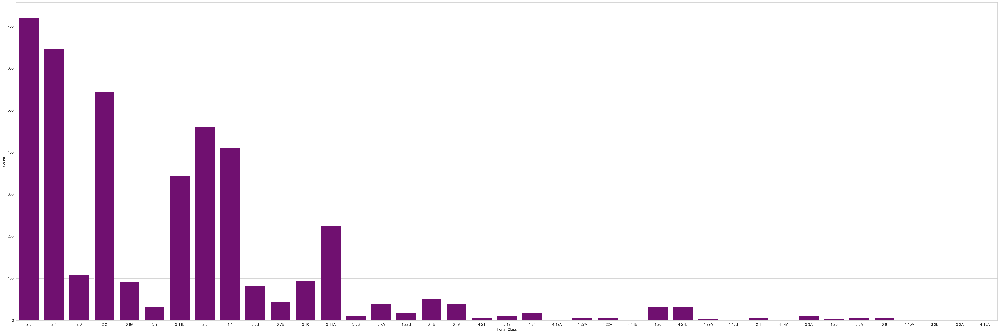

In [681]:
ravel_forte_count = Counter(ravel_forte_class)

df_rfc = pd.DataFrame(list(ravel_forte_count.items()), columns=['Forte_Class', 'Count'])

sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=df_rfc['Forte_Class'], y=df_rfc['Count'], color = 'purple')

## Comparing Bach, Mozart, Beethoven, Chopin, Debussy and Ravel by Pitch_Set

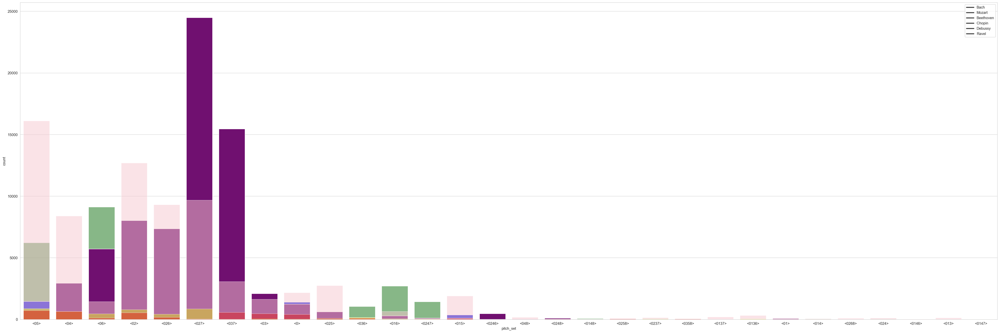

In [687]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=dfbeethovenset_count['pitch_set'], y=dfbeethovenset_count['count'], color = 'green', alpha = 0.5)
sns.barplot(x=dfmozartset_count['pitch_set'], y=dfmozartset_count['count'], color = 'blue')
sns.barplot(x=dfbachset_count['pitch_set'], y=dfbachset_count['count'], color = 'purple')
sns.barplot(x=dfchopinset_count['pitch_set'], y=dfchopinset_count['count'], color = 'pink', alpha = 0.5)
sns.barplot(x=dfDebussyset_count['pitch_set'], y=dfDebussyset_count['count'], color = 'yellow', alpha = 0.5)
sns.barplot(x=dfravelset_count['pitch_set'], y=dfravelset_count['count'], color = 'red', alpha = 0.5)

plt.legend(labels=['Bach', 'Mozart', 'Beethoven', 'Chopin', 'Debussy', 'Ravel'])

## Comparing Bach, Mozart, Beethoven, Chopin, Debussy and Ravel by Forte_Class

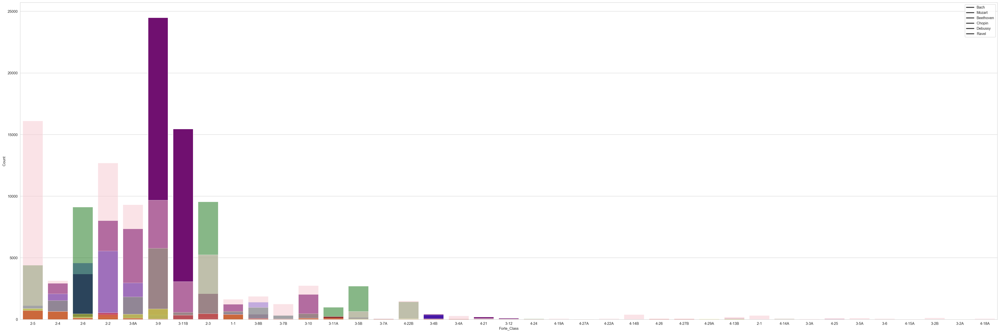

In [691]:
sns.set_style("whitegrid")
plt.figure(figsize=(48, 16))
sns.barplot(x=df_bfc['Forte_Class'], y=df_bfc['Count'], label='Bach', color = 'purple')
sns.barplot(x=df_mfc['Forte_Class'], y=df_mfc['Count'], label='Mozart', color = 'blue', alpha =0.5)
sns.barplot(x=df_befc['Forte_Class'], y=df_befc['Count'], label='Beethoven', color = 'green', alpha =0.5)
sns.barplot(x=df_cfc['Forte_Class'], y=df_cfc['Count'], label='Chopin', color = 'pink', alpha =0.5)
sns.barplot(x=df_defc['Forte_Class'], y=df_defc['Count'], label='Debussy', color = 'yellow', alpha =0.5)
sns.barplot(x=df_rfc['Forte_Class'], y=df_rfc['Count'], label='Ravel', color = 'red', alpha =0.5)

plt.legend(labels=['Bach', 'Mozart', 'Beethoven', 'Chopin', 'Debussy', 'Ravel'])

## CHOPIN-BOT

In [2]:
bot_midi = '/Volumes/S190813/Music_Box/INCOMING/CH_t_200120/Chopin_play/Chopin_play_1.mid'

In [3]:
fs=100
midi_pretty_format = pretty_midi.PrettyMIDI(bot_midi)
piano_midi = midi_pretty_format.instruments[0] # Get the piano channels
piano_roll = piano_midi.get_piano_roll(fs=fs)

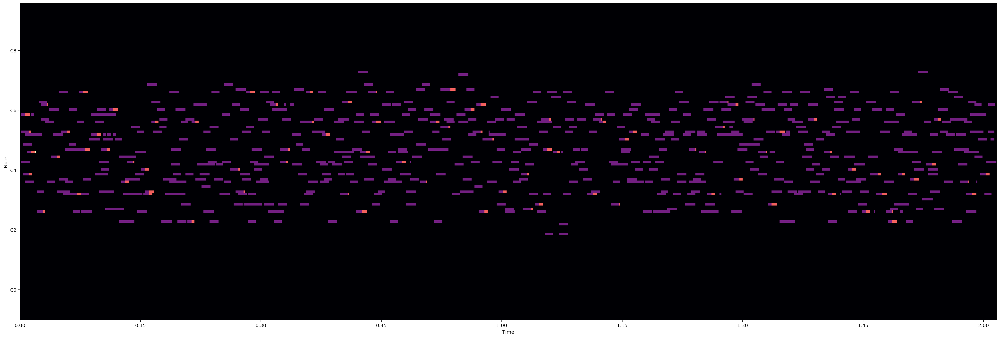

In [6]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(36, 12))
plot_piano_roll(midi_pretty_format, 0, 127)